# Modelo CNN para Identificación de Cáncer de Mama (Invasive Ductal Carcinoma)

Este notebook contiene el pipeline completo para entrenar un modelo de Deep Learning (CNN) capaz de detectar la presencia de Carcinoma Ductal Invasivo (IDC) en parches de imágenes de tejido mamario de 50x50 píxeles.

## 1. Importación de Librerías y Configuración
Importamos todas las librerías necesarias para el manejo de datos, construcción del modelo, validación cruzada enfocada en no mezclar pacientes, y métricas de evaluación.

In [1]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración de variables globales
BASE_DIR = '/Users/gabriels/Proyectos/Samsung/Imagenes'
CSV_PATH = os.path.join(BASE_DIR, 'labels.csv')
IMG_SIZE = (50, 50)
BATCH_SIZE = 64
EPOCHS = 20

## 2. Carga de Datos y División (Data Split)
La división de entrenamiento, validación y prueba se realiza agrupando por el identificador del paciente (`patient_id`). Esto asegura que el set de validación y prueba contengan **pacientes nuevos** que el modelo nunca ha visto en la fase de entrenamiento, evitando cualquier fuga de información (data leakage).

In [2]:
def load_and_split_data(csv_path, test_size=0.15, val_size=0.15):
    print(f"Cargando dataset desde {csv_path}...")
    df = pd.read_csv(csv_path)
    
    # Asegurarnos de que las clases son strings para ImageDataGenerator
    df['class'] = df['class'].astype(str)
    
    print(f"Total de imágenes: {len(df)}")
    print(f"Pacientes únicos: {df['patient_id'].nunique()}")

    # 1. Separar un conjunto de PRUEBA (Test)
    gss_test = GroupShuffleSplit(n_splits=1, test_size=test_size, random_state=42)
    train_val_idx, test_idx = next(gss_test.split(df, groups=df['patient_id']))
    df_train_val = df.iloc[train_val_idx].reset_index(drop=True)
    df_test = df.iloc[test_idx].reset_index(drop=True)

    # 2. Separar el restante en ENTRENAMIENTO y VALIDACIÓN
    val_relative_size = val_size / (1.0 - test_size)
    gss_val = GroupShuffleSplit(n_splits=1, test_size=val_relative_size, random_state=42)
    train_idx, val_idx = next(gss_val.split(df_train_val, groups=df_train_val['patient_id']))
    
    df_train = df_train_val.iloc[train_idx].reset_index(drop=True)
    df_val = df_train_val.iloc[val_idx].reset_index(drop=True)
    
    print("\n--- Distribución de splits por paciente (patient_id) ---")
    print(f"Train: {len(df_train)} imgs (pacientes: {df_train['patient_id'].nunique()})")
    print(f"Val:   {len(df_val)} imgs (pacientes: {df_val['patient_id'].nunique()})")
    print(f"Test:  {len(df_test)} imgs (pacientes: {df_test['patient_id'].nunique()})")
    
    # 3. Validar Fuga de Datos (Data Leakage)
    train_patients = set(df_train['patient_id'])
    val_patients = set(df_val['patient_id'])
    test_patients = set(df_test['patient_id'])
    
    assert len(train_patients.intersection(test_patients)) == 0, "¡FUGA DE DATOS entre Train y Test!"
    assert len(train_patients.intersection(val_patients)) == 0, "¡FUGA DE DATOS entre Train y Val!"
    print("Verificación de fuga de datos (Data Leakage) pasada: OK.\n")

    return df_train, df_val, df_test

df_train, df_val, df_test = load_and_split_data(CSV_PATH)

Cargando dataset desde /Users/gabriels/Proyectos/Samsung/Imagenes/labels.csv...
Total de imágenes: 157572
Pacientes únicos: 279



--- Distribución de splits por paciente (patient_id) ---
Train: 105961 imgs (pacientes: 195)
Val:   26283 imgs (pacientes: 42)
Test:  25328 imgs (pacientes: 42)
Verificación de fuga de datos (Data Leakage) pasada: OK.



## 3. Generadores de Datos e Incremento (Data Augmentation)
Generamos DataLoaders para leer por lotes las imágenes directamente desde el disco usando el mapeo del CSV. Aprovechamos para aplicar rotaciones y volteos aleatorios a las imágenes de entrenamiento para mejorar la robustez de la red.

In [3]:
def create_data_generators(df_train, df_val, df_test, base_dir):
    # Data Augmentation básico para entrenamiento
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest'
    )

    # Solo reescalado para validación y prueba
    test_datagen = ImageDataGenerator(rescale=1./255)

    print("Preparando generador de Entrenamiento...")
    train_generator = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=base_dir,
        x_col="filename",
        y_col="class",
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode="binary"
    )

    print("Preparando generador de Validación...")
    val_generator = test_datagen.flow_from_dataframe(
        dataframe=df_val,
        directory=base_dir,
        x_col="filename",
        y_col="class",
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode="binary"
    )

    print("Preparando generador de Prueba...")
    test_generator = test_datagen.flow_from_dataframe(
        dataframe=df_test,
        directory=base_dir,
        x_col="filename",
        y_col="class",
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode="binary",
        shuffle=False # IMPORTANTE: no mezclar test para evaluar el desempeño ordenadamente
    )

    return train_generator, val_generator, test_generator

train_gen, val_gen, test_gen = create_data_generators(df_train, df_val, df_test, BASE_DIR)

Preparando generador de Entrenamiento...


Found 105961 validated image filenames belonging to 2 classes.


Preparando generador de Validación...
Found 26283 validated image filenames belonging to 2 classes.


Preparando generador de Prueba...


Found 25328 validated image filenames belonging to 2 classes.


## 4. Arquitectura del Modelo CNN
Diseñamos una red neuronal convolucional estándar usando Keras Sequential. Cuenta con 3 bloques convolucionales y capas de normalización (BatchNormalization) para evitar el desvanecimiento de gradientes. Finalmente usamos Dropout y una neurona sigmoide para la clasificación binaria final.

In [4]:
def build_model():
    model = Sequential([
        # Bloque 1
        Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        
        # Bloque 2
        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        
        # Bloque 3
        Conv2D(128, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D((2, 2)),
        
        # Clasificador Fully Connected
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid') # Clasificación Binaria
    ])
    
    model.compile(
        optimizer='adam', 
        loss='binary_crossentropy', 
        metrics=['accuracy']
    )
    
    return model

model = build_model()
model.summary()

/Users/gabriels/miniforge3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 48, 48, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 48, 48, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 22, 22, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 22, 22, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 11, 11, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 9, 9, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 9, 9, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 4, 4, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 618,945 (2.36 MB)

 Trainable params: 618,497 (2.36 MB)

 Non-trainable params: 448 (1.75 KB)

## 5. Entrenamiento
Definimos callbacks para EarlyStopping (detener el modelo si ya no mejora para evitar Overfitting) y calcular la distribución de pesos de la data particionada. A continuación, iniciaremos el ciclo de épocas con los generadores.

In [5]:
# Callbacks de entrenamiento
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=1e-6, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True, verbose=1)

# Cálculo de pesos para balancear la clase
neg_count = sum(df_train['class'] == '0')
pos_count = sum(df_train['class'] == '1')
total = len(df_train)
weight_0 = (1 / neg_count) * (total / 2.0)
weight_1 = (1 / pos_count) * (total / 2.0)
class_weights = {0: weight_0, 1: weight_1}
print(f"\nPesos de clases: 0: {weight_0:.3f}, 1: {weight_1:.3f}\n")

# Ejecución del entrenamiento
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    class_weight=class_weights,
    callbacks=[reduce_lr, early_stop]
)


Pesos de clases: 0: 1.051, 1: 0.954



Epoch 1/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 40:29 1s/step - accuracy: 0.5469 - loss: 1.4026

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 53ms/step - accuracy: 0.5938 - loss: 1.4640

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 54ms/step - accuracy: 0.6267 - loss: 1.4630

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 56ms/step - accuracy: 0.6458 - loss: 1.4448

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 60ms/step - accuracy: 0.6517 - loss: 1.4215

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 60ms/step - accuracy: 0.6494 - loss: 1.4143

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 61ms/step - accuracy: 0.6469 - loss: 1.3984

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 60ms/step - accuracy: 0.6456 - loss: 1.3816

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 60ms/step - accuracy: 0.6460 - loss: 1.3619

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 60ms/step - accuracy: 0.6473 - loss: 1.3417

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 60ms/step - accuracy: 0.6487 - loss: 1.3231

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 60ms/step - accuracy: 0.6501 - loss: 1.3051

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 60ms/step - accuracy: 0.6515 - loss: 1.2877

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - accuracy: 0.6530 - loss: 1.2714

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - accuracy: 0.6548 - loss: 1.2548

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.6566 - loss: 1.2393

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.6579 - loss: 1.2263

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.6595 - loss: 1.2130

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.6610 - loss: 1.2012

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - accuracy: 0.6626 - loss: 1.1894

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - accuracy: 0.6640 - loss: 1.1783

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.6654 - loss: 1.1678

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.6667 - loss: 1.1578

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.6678 - loss: 1.1484

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.6690 - loss: 1.1396

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 64ms/step - accuracy: 0.6703 - loss: 1.1313

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.6714 - loss: 1.1236

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.6725 - loss: 1.1164

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.6737 - loss: 1.1092

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.6748 - loss: 1.1022

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 64ms/step - accuracy: 0.6758 - loss: 1.0954

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.6768 - loss: 1.0888

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.6778 - loss: 1.0822

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.6788 - loss: 1.0758

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6799 - loss: 1.0693

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6810 - loss: 1.0628

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6821 - loss: 1.0564

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6833 - loss: 1.0501

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6845 - loss: 1.0440

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6856 - loss: 1.0382

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6867 - loss: 1.0324

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6878 - loss: 1.0270

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6888 - loss: 1.0216

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.6898 - loss: 1.0164

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 67ms/step - accuracy: 0.6907 - loss: 1.0114

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 67ms/step - accuracy: 0.6917 - loss: 1.0064

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 67ms/step - accuracy: 0.6927 - loss: 1.0015

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 67ms/step - accuracy: 0.6936 - loss: 0.9966

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.6946 - loss: 0.9918

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.6955 - loss: 0.9872

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.6964 - loss: 0.9828

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.6973 - loss: 0.9785

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.6981 - loss: 0.9742

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.6989 - loss: 0.9700

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.6997 - loss: 0.9660

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.7004 - loss: 0.9620

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.7011 - loss: 0.9581

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.7018 - loss: 0.9543

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.7026 - loss: 0.9505

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.7033 - loss: 0.9468

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.7040 - loss: 0.9431

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.7047 - loss: 0.9395

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7054 - loss: 0.9359

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7060 - loss: 0.9324

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7067 - loss: 0.9289

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7074 - loss: 0.9254

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7081 - loss: 0.9219

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7087 - loss: 0.9185

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7094 - loss: 0.9151

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7101 - loss: 0.9118

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.7108 - loss: 0.9085

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7114 - loss: 0.9053

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7121 - loss: 0.9022

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7127 - loss: 0.8991

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7133 - loss: 0.8960

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7139 - loss: 0.8929

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7145 - loss: 0.8900

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7151 - loss: 0.8870

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7157 - loss: 0.8842

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7163 - loss: 0.8813

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7169 - loss: 0.8785

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7174 - loss: 0.8758

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7179 - loss: 0.8731

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7184 - loss: 0.8705

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7189 - loss: 0.8680

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7194 - loss: 0.8655

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.7198 - loss: 0.8630

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7203 - loss: 0.8606

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7207 - loss: 0.8583

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7211 - loss: 0.8559

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7216 - loss: 0.8536

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7220 - loss: 0.8512

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7224 - loss: 0.8489

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7229 - loss: 0.8467

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7233 - loss: 0.8444

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7237 - loss: 0.8422

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.7241 - loss: 0.8400

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7246 - loss: 0.8378

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7250 - loss: 0.8357

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7254 - loss: 0.8335

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7258 - loss: 0.8315

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7262 - loss: 0.8294

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7266 - loss: 0.8273

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7270 - loss: 0.8253

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7274 - loss: 0.8233

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7278 - loss: 0.8214

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7282 - loss: 0.8194

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7285 - loss: 0.8175

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7289 - loss: 0.8156

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.7293 - loss: 0.8137

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.7297 - loss: 0.8119

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.7300 - loss: 0.8101

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.7304 - loss: 0.8083

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.7307 - loss: 0.8065

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.7311 - loss: 0.8047

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.7314 - loss: 0.8029

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.7318 - loss: 0.8012

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.7321 - loss: 0.7996

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.7324 - loss: 0.7979

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.7327 - loss: 0.7963

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.7330 - loss: 0.7947

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.7333 - loss: 0.7931

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.7336 - loss: 0.7915

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.7339 - loss: 0.7900

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.7342 - loss: 0.7885

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7345 - loss: 0.7870

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7348 - loss: 0.7855

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7350 - loss: 0.7841

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7353 - loss: 0.7826

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7356 - loss: 0.7812

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7358 - loss: 0.7798

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7361 - loss: 0.7784

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7363 - loss: 0.7771

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7366 - loss: 0.7757

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.7368 - loss: 0.7744

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.7371 - loss: 0.7730

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7373 - loss: 0.7717

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.7376 - loss: 0.7704

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.7378 - loss: 0.7691

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.7380 - loss: 0.7678

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.7383 - loss: 0.7665

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.7385 - loss: 0.7653

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.7387 - loss: 0.7640

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.7390 - loss: 0.7628

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7394 - loss: 0.7603

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7397 - loss: 0.7591

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7399 - loss: 0.7579

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7401 - loss: 0.7567

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7403 - loss: 0.7555

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7406 - loss: 0.7543

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7408 - loss: 0.7531

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7410 - loss: 0.7519

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 67ms/step - accuracy: 0.7413 - loss: 0.7508

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7415 - loss: 0.7496

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7417 - loss: 0.7485

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7419 - loss: 0.7473

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7421 - loss: 0.7462

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7424 - loss: 0.7451

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7426 - loss: 0.7440

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7428 - loss: 0.7429

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7430 - loss: 0.7418

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7433 - loss: 0.7407

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7435 - loss: 0.7396

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7437 - loss: 0.7385

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7439 - loss: 0.7375

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7441 - loss: 0.7364

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7443 - loss: 0.7354

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7445 - loss: 0.7344

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 67ms/step - accuracy: 0.7448 - loss: 0.7333

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7450 - loss: 0.7323

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7452 - loss: 0.7313

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7454 - loss: 0.7303

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7456 - loss: 0.7293

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7458 - loss: 0.7283

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7460 - loss: 0.7273

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7462 - loss: 0.7263

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7464 - loss: 0.7254

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7466 - loss: 0.7244

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7468 - loss: 0.7235

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7470 - loss: 0.7225

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7472 - loss: 0.7216

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 67ms/step - accuracy: 0.7474 - loss: 0.7207

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7476 - loss: 0.7197

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7478 - loss: 0.7188

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7479 - loss: 0.7179

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7481 - loss: 0.7170

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7483 - loss: 0.7161

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7485 - loss: 0.7152

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7487 - loss: 0.7143

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7489 - loss: 0.7134

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7491 - loss: 0.7126

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7493 - loss: 0.7117

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7494 - loss: 0.7108

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7496 - loss: 0.7100

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7498 - loss: 0.7091

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7500 - loss: 0.7083

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 67ms/step - accuracy: 0.7502 - loss: 0.7074

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7503 - loss: 0.7066

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7505 - loss: 0.7058

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7507 - loss: 0.7050

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7509 - loss: 0.7042

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7510 - loss: 0.7033

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7512 - loss: 0.7025

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7514 - loss: 0.7017

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7515 - loss: 0.7009

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7517 - loss: 0.7002

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 67ms/step - accuracy: 0.7519 - loss: 0.6994

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7521 - loss: 0.6986

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7522 - loss: 0.6978

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7524 - loss: 0.6970

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7526 - loss: 0.6963

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7527 - loss: 0.6955

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7529 - loss: 0.6948

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7530 - loss: 0.6940

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7532 - loss: 0.6933

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7534 - loss: 0.6925

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7535 - loss: 0.6918

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7537 - loss: 0.6910

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7538 - loss: 0.6903

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7540 - loss: 0.6896

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 67ms/step - accuracy: 0.7542 - loss: 0.6889

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7543 - loss: 0.6881

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7545 - loss: 0.6874

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7546 - loss: 0.6867

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7548 - loss: 0.6860

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7549 - loss: 0.6853

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7551 - loss: 0.6846

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7552 - loss: 0.6839

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7554 - loss: 0.6832

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7555 - loss: 0.6825

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7557 - loss: 0.6819

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7558 - loss: 0.6812

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7560 - loss: 0.6805

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 67ms/step - accuracy: 0.7561 - loss: 0.6798

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7563 - loss: 0.6792

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7564 - loss: 0.6785

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7565 - loss: 0.6778

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7567 - loss: 0.6772

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7568 - loss: 0.6765

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7570 - loss: 0.6759

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7571 - loss: 0.6753

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7572 - loss: 0.6746

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7574 - loss: 0.6740

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7575 - loss: 0.6734

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7577 - loss: 0.6727

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7578 - loss: 0.6721

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7579 - loss: 0.6715

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7581 - loss: 0.6709

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7582 - loss: 0.6703

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7583 - loss: 0.6697

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7585 - loss: 0.6691

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7586 - loss: 0.6684

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7587 - loss: 0.6678

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7589 - loss: 0.6673

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 67ms/step - accuracy: 0.7590 - loss: 0.6667

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7591 - loss: 0.6661

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7593 - loss: 0.6655

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7594 - loss: 0.6649

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7595 - loss: 0.6644

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7596 - loss: 0.6638

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7598 - loss: 0.6632

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7599 - loss: 0.6627

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7600 - loss: 0.6621

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7601 - loss: 0.6615

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7603 - loss: 0.6610

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7604 - loss: 0.6604

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7605 - loss: 0.6599

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7606 - loss: 0.6593

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7607 - loss: 0.6588

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7609 - loss: 0.6582

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7610 - loss: 0.6577

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7611 - loss: 0.6571

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7612 - loss: 0.6566

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7613 - loss: 0.6561

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7615 - loss: 0.6555

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7616 - loss: 0.6550

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7617 - loss: 0.6545

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7618 - loss: 0.6540

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7619 - loss: 0.6534

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.7621 - loss: 0.6529

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.7622 - loss: 0.6524

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.7623 - loss: 0.6519

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.7624 - loss: 0.6514

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.7625 - loss: 0.6509

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7626 - loss: 0.6504

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7627 - loss: 0.6498

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7629 - loss: 0.6493

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7630 - loss: 0.6488

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7631 - loss: 0.6483

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7632 - loss: 0.6478

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7633 - loss: 0.6473

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7634 - loss: 0.6469

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7635 - loss: 0.6464

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7637 - loss: 0.6459

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7638 - loss: 0.6454

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7639 - loss: 0.6449

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7640 - loss: 0.6444

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7641 - loss: 0.6440

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7642 - loss: 0.6435

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7643 - loss: 0.6430

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7644 - loss: 0.6425

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7646 - loss: 0.6421

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7647 - loss: 0.6416

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7648 - loss: 0.6411

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.7649 - loss: 0.6407

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7650 - loss: 0.6402

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7651 - loss: 0.6397

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7652 - loss: 0.6393

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7653 - loss: 0.6388

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7654 - loss: 0.6384

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7655 - loss: 0.6379

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7657 - loss: 0.6374

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7658 - loss: 0.6370

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7659 - loss: 0.6365

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7660 - loss: 0.6361

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7661 - loss: 0.6357

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7662 - loss: 0.6352

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7663 - loss: 0.6348

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7664 - loss: 0.6343

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7665 - loss: 0.6339

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7666 - loss: 0.6334

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7667 - loss: 0.6330

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7668 - loss: 0.6326

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7669 - loss: 0.6322

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7671 - loss: 0.6317

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7672 - loss: 0.6313

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7673 - loss: 0.6309

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7674 - loss: 0.6305

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.7675 - loss: 0.6300

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.7676 - loss: 0.6296

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.7677 - loss: 0.6292

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.7678 - loss: 0.6288

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7679 - loss: 0.6284

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7680 - loss: 0.6280

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7681 - loss: 0.6276

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7682 - loss: 0.6272

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7683 - loss: 0.6268

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7684 - loss: 0.6264

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7685 - loss: 0.6260

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7685 - loss: 0.6256

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7686 - loss: 0.6252

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7687 - loss: 0.6248

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7688 - loss: 0.6244

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7689 - loss: 0.6240

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7690 - loss: 0.6236

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7691 - loss: 0.6232

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7692 - loss: 0.6229

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7693 - loss: 0.6225

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7694 - loss: 0.6221

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7695 - loss: 0.6217

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7696 - loss: 0.6213

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 70ms/step - accuracy: 0.7697 - loss: 0.6210

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7698 - loss: 0.6206

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7699 - loss: 0.6202

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7700 - loss: 0.6198

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7701 - loss: 0.6195

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7702 - loss: 0.6191

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7703 - loss: 0.6187

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7703 - loss: 0.6183

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7704 - loss: 0.6180

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7705 - loss: 0.6176

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7706 - loss: 0.6172

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7707 - loss: 0.6169

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7708 - loss: 0.6165

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7709 - loss: 0.6162

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7710 - loss: 0.6158

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7711 - loss: 0.6154

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7712 - loss: 0.6151

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 70ms/step - accuracy: 0.7713 - loss: 0.6147

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7713 - loss: 0.6144

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7714 - loss: 0.6140

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7715 - loss: 0.6137

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7716 - loss: 0.6133

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7717 - loss: 0.6130

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7718 - loss: 0.6127

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7719 - loss: 0.6123

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7719 - loss: 0.6120

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7720 - loss: 0.6116

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7721 - loss: 0.6113

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7722 - loss: 0.6110

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7723 - loss: 0.6106

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7724 - loss: 0.6103

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7725 - loss: 0.6100

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 70ms/step - accuracy: 0.7725 - loss: 0.6096

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7726 - loss: 0.6093

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7727 - loss: 0.6090

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7728 - loss: 0.6087

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7729 - loss: 0.6083

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7729 - loss: 0.6080

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7730 - loss: 0.6077

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7731 - loss: 0.6074

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7732 - loss: 0.6070

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7733 - loss: 0.6067

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7734 - loss: 0.6064

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7734 - loss: 0.6061

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7735 - loss: 0.6058

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7736 - loss: 0.6054

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7737 - loss: 0.6051

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7738 - loss: 0.6048

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7738 - loss: 0.6045

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7739 - loss: 0.6042

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 70ms/step - accuracy: 0.7740 - loss: 0.6039

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7741 - loss: 0.6036

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7742 - loss: 0.6033

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7742 - loss: 0.6029

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7743 - loss: 0.6026

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7744 - loss: 0.6023

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7745 - loss: 0.6020

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7745 - loss: 0.6017

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7746 - loss: 0.6014

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7747 - loss: 0.6011

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7748 - loss: 0.6008

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7748 - loss: 0.6005

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 70ms/step - accuracy: 0.7749 - loss: 0.6002

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7750 - loss: 0.5999

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7751 - loss: 0.5996

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7752 - loss: 0.5993

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7752 - loss: 0.5991

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7753 - loss: 0.5988

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7754 - loss: 0.5985

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7755 - loss: 0.5982

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7755 - loss: 0.5979

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7756 - loss: 0.5976

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7757 - loss: 0.5973

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7758 - loss: 0.5970

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7758 - loss: 0.5967

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 70ms/step - accuracy: 0.7759 - loss: 0.5965

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7760 - loss: 0.5962

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7760 - loss: 0.5959

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7761 - loss: 0.5956

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7762 - loss: 0.5953

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7763 - loss: 0.5951

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7763 - loss: 0.5948

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7765 - loss: 0.5942

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7765 - loss: 0.5939

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7766 - loss: 0.5937

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7767 - loss: 0.5934

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7768 - loss: 0.5931

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 70ms/step - accuracy: 0.7768 - loss: 0.5929

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7769 - loss: 0.5926

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7770 - loss: 0.5923

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7770 - loss: 0.5920

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7771 - loss: 0.5918

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7772 - loss: 0.5915

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7772 - loss: 0.5912

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7773 - loss: 0.5910

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7774 - loss: 0.5907

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7774 - loss: 0.5905

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7775 - loss: 0.5902

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7776 - loss: 0.5899

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 70ms/step - accuracy: 0.7777 - loss: 0.5897

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7777 - loss: 0.5894

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7778 - loss: 0.5891

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7779 - loss: 0.5889

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7779 - loss: 0.5886

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7780 - loss: 0.5884

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7781 - loss: 0.5881

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7781 - loss: 0.5878

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7782 - loss: 0.5876

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7783 - loss: 0.5873

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7783 - loss: 0.5871

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7784 - loss: 0.5868

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7785 - loss: 0.5866

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7785 - loss: 0.5863

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7786 - loss: 0.5861

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 70ms/step - accuracy: 0.7787 - loss: 0.5858

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7787 - loss: 0.5856

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7788 - loss: 0.5853

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7788 - loss: 0.5851

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7789 - loss: 0.5848

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7790 - loss: 0.5846

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7790 - loss: 0.5843

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7791 - loss: 0.5841

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7792 - loss: 0.5838

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7792 - loss: 0.5836

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7793 - loss: 0.5834

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7794 - loss: 0.5831

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7794 - loss: 0.5829

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7795 - loss: 0.5826

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7796 - loss: 0.5824

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 70ms/step - accuracy: 0.7796 - loss: 0.5822

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7797 - loss: 0.5819

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7797 - loss: 0.5817

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7798 - loss: 0.5814

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7799 - loss: 0.5812

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7799 - loss: 0.5810

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7800 - loss: 0.5807

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7801 - loss: 0.5805

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7801 - loss: 0.5803

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7802 - loss: 0.5800

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7802 - loss: 0.5798

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7803 - loss: 0.5796

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7804 - loss: 0.5793

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7804 - loss: 0.5791

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7805 - loss: 0.5789

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 70ms/step - accuracy: 0.7806 - loss: 0.5786

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7806 - loss: 0.5784

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7807 - loss: 0.5782

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7807 - loss: 0.5779

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7808 - loss: 0.5777

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7809 - loss: 0.5775

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7809 - loss: 0.5773

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7810 - loss: 0.5770

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7810 - loss: 0.5768

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7811 - loss: 0.5766

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7812 - loss: 0.5764

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7812 - loss: 0.5761

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7813 - loss: 0.5759

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7813 - loss: 0.5757

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7814 - loss: 0.5755

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7815 - loss: 0.5752

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7815 - loss: 0.5750

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 70ms/step - accuracy: 0.7816 - loss: 0.5748

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7816 - loss: 0.5746

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7817 - loss: 0.5744

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7818 - loss: 0.5742

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7818 - loss: 0.5739

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7819 - loss: 0.5737

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7819 - loss: 0.5735

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7820 - loss: 0.5733

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7820 - loss: 0.5731

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7821 - loss: 0.5729

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7822 - loss: 0.5726

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7822 - loss: 0.5724

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7823 - loss: 0.5722

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7823 - loss: 0.5720

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7824 - loss: 0.5718

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7824 - loss: 0.5716

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7825 - loss: 0.5714

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7826 - loss: 0.5712

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7826 - loss: 0.5710

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7827 - loss: 0.5707

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 70ms/step - accuracy: 0.7827 - loss: 0.5705

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7828 - loss: 0.5703

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 70ms/step - accuracy: 0.7828 - loss: 0.5701

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7829 - loss: 0.5699

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7830 - loss: 0.5697

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7830 - loss: 0.5695

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7831 - loss: 0.5693

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7831 - loss: 0.5691

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7832 - loss: 0.5689

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7832 - loss: 0.5687

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7833 - loss: 0.5685

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7834 - loss: 0.5683

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7834 - loss: 0.5681

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7835 - loss: 0.5679

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7835 - loss: 0.5677

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7836 - loss: 0.5674

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7836 - loss: 0.5672

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7837 - loss: 0.5670

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7838 - loss: 0.5668

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7838 - loss: 0.5667

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7839 - loss: 0.5665

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7839 - loss: 0.5663

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7840 - loss: 0.5661

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 71ms/step - accuracy: 0.7840 - loss: 0.5659

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7841 - loss: 0.5657

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7841 - loss: 0.5655

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7842 - loss: 0.5653

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7842 - loss: 0.5651

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7843 - loss: 0.5649

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7844 - loss: 0.5647

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7844 - loss: 0.5645

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7845 - loss: 0.5643

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7845 - loss: 0.5641

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7846 - loss: 0.5639

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7846 - loss: 0.5637

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7847 - loss: 0.5635

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7847 - loss: 0.5633

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7848 - loss: 0.5631

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7848 - loss: 0.5630

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7849 - loss: 0.5628

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 71ms/step - accuracy: 0.7849 - loss: 0.5626

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7850 - loss: 0.5624

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7851 - loss: 0.5622

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7851 - loss: 0.5620

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7852 - loss: 0.5618

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7852 - loss: 0.5616

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7853 - loss: 0.5614

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7853 - loss: 0.5613

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7854 - loss: 0.5611

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7854 - loss: 0.5609

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7855 - loss: 0.5607

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7855 - loss: 0.5605

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7856 - loss: 0.5603

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7856 - loss: 0.5601

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7857 - loss: 0.5600

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 71ms/step - accuracy: 0.7857 - loss: 0.5598

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7858 - loss: 0.5596

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7858 - loss: 0.5594

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7859 - loss: 0.5592

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7859 - loss: 0.5590

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7860 - loss: 0.5589

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7860 - loss: 0.5587

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7861 - loss: 0.5585

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7861 - loss: 0.5583

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7862 - loss: 0.5581

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7862 - loss: 0.5580

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7863 - loss: 0.5578

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7863 - loss: 0.5576

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7864 - loss: 0.5574

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7864 - loss: 0.5573

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7865 - loss: 0.5571

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 71ms/step - accuracy: 0.7865 - loss: 0.5569

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 71ms/step - accuracy: 0.7866 - loss: 0.5567

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7866 - loss: 0.5566

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 71ms/step - accuracy: 0.7867 - loss: 0.5564

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7867 - loss: 0.5562

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7868 - loss: 0.5560

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7868 - loss: 0.5559

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7869 - loss: 0.5557

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7869 - loss: 0.5555

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7870 - loss: 0.5553

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7870 - loss: 0.5552

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7871 - loss: 0.5550

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7871 - loss: 0.5548

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7872 - loss: 0.5546

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7872 - loss: 0.5545

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7873 - loss: 0.5543

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 72ms/step - accuracy: 0.7873 - loss: 0.5541

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7874 - loss: 0.5540

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7874 - loss: 0.5538

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7875 - loss: 0.5536

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7875 - loss: 0.5535

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7876 - loss: 0.5533

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7876 - loss: 0.5531

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7877 - loss: 0.5529

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7877 - loss: 0.5528

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7878 - loss: 0.5526

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7878 - loss: 0.5524

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7878 - loss: 0.5523

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7879 - loss: 0.5521

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7879 - loss: 0.5519

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7880 - loss: 0.5518

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 72ms/step - accuracy: 0.7880 - loss: 0.5516

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7881 - loss: 0.5515

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7881 - loss: 0.5513

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7882 - loss: 0.5511

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7882 - loss: 0.5510

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7883 - loss: 0.5508

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7883 - loss: 0.5506

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7884 - loss: 0.5505

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7884 - loss: 0.5503

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7885 - loss: 0.5501

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7885 - loss: 0.5500

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7885 - loss: 0.5498

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7886 - loss: 0.5497

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7886 - loss: 0.5495

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 72ms/step - accuracy: 0.7887 - loss: 0.5493

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7887 - loss: 0.5492

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7888 - loss: 0.5490

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7888 - loss: 0.5489

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7889 - loss: 0.5487

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7889 - loss: 0.5485

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7890 - loss: 0.5484

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7890 - loss: 0.5482

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7891 - loss: 0.5481

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7891 - loss: 0.5479

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7891 - loss: 0.5478

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7892 - loss: 0.5476

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7892 - loss: 0.5474

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 72ms/step - accuracy: 0.7893 - loss: 0.5473

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7893 - loss: 0.5471

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7894 - loss: 0.5470

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7894 - loss: 0.5468

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7895 - loss: 0.5467

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7895 - loss: 0.5465

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7895 - loss: 0.5464

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7896 - loss: 0.5462

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7896 - loss: 0.5461

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7897 - loss: 0.5459

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7897 - loss: 0.5458

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7898 - loss: 0.5456

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7898 - loss: 0.5455

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 72ms/step - accuracy: 0.7898 - loss: 0.5453

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7899 - loss: 0.5452

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7899 - loss: 0.5450

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7900 - loss: 0.5449

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7900 - loss: 0.5447

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7901 - loss: 0.5446

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7901 - loss: 0.5444

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7901 - loss: 0.5443

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7902 - loss: 0.5441

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7902 - loss: 0.5440

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7903 - loss: 0.5438

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7903 - loss: 0.5437

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7904 - loss: 0.5435

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7904 - loss: 0.5434

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 72ms/step - accuracy: 0.7904 - loss: 0.5432

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7905 - loss: 0.5431

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7905 - loss: 0.5429

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7906 - loss: 0.5428

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7906 - loss: 0.5426

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7907 - loss: 0.5425

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7907 - loss: 0.5424

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7907 - loss: 0.5422

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7908 - loss: 0.5421

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 72ms/step - accuracy: 0.7908 - loss: 0.5419

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 71ms/step - accuracy: 0.7909 - loss: 0.5418

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 71ms/step - accuracy: 0.7909 - loss: 0.5416

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 71ms/step - accuracy: 0.7909 - loss: 0.5415

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 71ms/step - accuracy: 0.7910 - loss: 0.5413

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7910 - loss: 0.5412

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7911 - loss: 0.5411

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7911 - loss: 0.5409

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7911 - loss: 0.5408

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7912 - loss: 0.5406

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7912 - loss: 0.5405

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7913 - loss: 0.5404

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7913 - loss: 0.5402

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7913 - loss: 0.5401

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7914 - loss: 0.5399

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7914 - loss: 0.5398

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7915 - loss: 0.5397

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 71ms/step - accuracy: 0.7915 - loss: 0.5395

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7915 - loss: 0.5394

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7916 - loss: 0.5392

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7916 - loss: 0.5391

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7917 - loss: 0.5390

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7917 - loss: 0.5388

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7917 - loss: 0.5387

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7918 - loss: 0.5385

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7918 - loss: 0.5384

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7919 - loss: 0.5383

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7919 - loss: 0.5381

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7919 - loss: 0.5380

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7920 - loss: 0.5379

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 71ms/step - accuracy: 0.7920 - loss: 0.5377

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7921 - loss: 0.5376

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7921 - loss: 0.5375

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7921 - loss: 0.5373

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7922 - loss: 0.5372

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7922 - loss: 0.5370

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7923 - loss: 0.5369

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7923 - loss: 0.5368

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7923 - loss: 0.5366

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7924 - loss: 0.5365

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7924 - loss: 0.5364

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7925 - loss: 0.5362

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7925 - loss: 0.5361

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7925 - loss: 0.5360

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 71ms/step - accuracy: 0.7926 - loss: 0.5358

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7926 - loss: 0.5357

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7926 - loss: 0.5356

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7927 - loss: 0.5354

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7927 - loss: 0.5353

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7928 - loss: 0.5352

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7928 - loss: 0.5351

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7928 - loss: 0.5349

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7929 - loss: 0.5348

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7929 - loss: 0.5347

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7929 - loss: 0.5345

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7930 - loss: 0.5344

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 71ms/step - accuracy: 0.7930 - loss: 0.5343

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7931 - loss: 0.5341

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7931 - loss: 0.5340

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7931 - loss: 0.5339

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7932 - loss: 0.5338

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7932 - loss: 0.5336

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7932 - loss: 0.5335

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7933 - loss: 0.5334

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7933 - loss: 0.5332

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7934 - loss: 0.5331

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7934 - loss: 0.5330

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7934 - loss: 0.5329

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7935 - loss: 0.5327

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - accuracy: 0.7935 - loss: 0.5326

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7935 - loss: 0.5325

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7936 - loss: 0.5324

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7936 - loss: 0.5322

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7936 - loss: 0.5321

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7937 - loss: 0.5320

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7937 - loss: 0.5319

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7938 - loss: 0.5317

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7938 - loss: 0.5316

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7938 - loss: 0.5315

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7939 - loss: 0.5314

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7939 - loss: 0.5312

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7939 - loss: 0.5311

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - accuracy: 0.7940 - loss: 0.5310

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7940 - loss: 0.5309

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7940 - loss: 0.5308

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7941 - loss: 0.5306

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7941 - loss: 0.5305

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7941 - loss: 0.5304

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7942 - loss: 0.5303

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7942 - loss: 0.5302

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7942 - loss: 0.5300

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7943 - loss: 0.5299

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7943 - loss: 0.5298

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7943 - loss: 0.5297

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - accuracy: 0.7944 - loss: 0.5296

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7944 - loss: 0.5294

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7944 - loss: 0.5293

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7945 - loss: 0.5292

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7945 - loss: 0.5291

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7946 - loss: 0.5290

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7946 - loss: 0.5288

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7946 - loss: 0.5287

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7947 - loss: 0.5286

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7947 - loss: 0.5285

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7947 - loss: 0.5284

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7948 - loss: 0.5282

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7948 - loss: 0.5281

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - accuracy: 0.7948 - loss: 0.5280

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7949 - loss: 0.5279 

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7949 - loss: 0.5278

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7949 - loss: 0.5277

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7950 - loss: 0.5275

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7950 - loss: 0.5274

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7950 - loss: 0.5273

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7951 - loss: 0.5272

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7951 - loss: 0.5271

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7951 - loss: 0.5270

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7952 - loss: 0.5269

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7952 - loss: 0.5267

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7952 - loss: 0.5266

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7953 - loss: 0.5265

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7953 - loss: 0.5264

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - accuracy: 0.7953 - loss: 0.5263

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7954 - loss: 0.5262

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7954 - loss: 0.5260

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7954 - loss: 0.5259

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7955 - loss: 0.5258

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7955 - loss: 0.5257

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7955 - loss: 0.5256

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7956 - loss: 0.5255

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7956 - loss: 0.5254

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7956 - loss: 0.5252

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7957 - loss: 0.5251

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7957 - loss: 0.5250

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7957 - loss: 0.5249

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7958 - loss: 0.5248

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7958 - loss: 0.5247

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - accuracy: 0.7958 - loss: 0.5246

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7959 - loss: 0.5245

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7959 - loss: 0.5243

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7959 - loss: 0.5242

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7960 - loss: 0.5241

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7960 - loss: 0.5240

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7960 - loss: 0.5239

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7961 - loss: 0.5238

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7961 - loss: 0.5237

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7961 - loss: 0.5236

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7962 - loss: 0.5235

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7962 - loss: 0.5234

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7962 - loss: 0.5232

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7962 - loss: 0.5231

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7963 - loss: 0.5230

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - accuracy: 0.7963 - loss: 0.5229

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7963 - loss: 0.5228

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7964 - loss: 0.5227

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7964 - loss: 0.5226

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7964 - loss: 0.5225

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7965 - loss: 0.5224

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7965 - loss: 0.5223

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7965 - loss: 0.5222

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7966 - loss: 0.5220

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7966 - loss: 0.5219

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7966 - loss: 0.5218

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7967 - loss: 0.5217

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7967 - loss: 0.5216

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7967 - loss: 0.5215

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7968 - loss: 0.5214

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - accuracy: 0.7968 - loss: 0.5213

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7968 - loss: 0.5212

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7969 - loss: 0.5211

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7969 - loss: 0.5210

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7969 - loss: 0.5209

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7969 - loss: 0.5208

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7970 - loss: 0.5207

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7970 - loss: 0.5206

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7970 - loss: 0.5205

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7971 - loss: 0.5203

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7971 - loss: 0.5202

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7971 - loss: 0.5201

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7972 - loss: 0.5200

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7972 - loss: 0.5199

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7972 - loss: 0.5198

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.7973 - loss: 0.5197

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7973 - loss: 0.5196

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7973 - loss: 0.5195

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7973 - loss: 0.5194

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7974 - loss: 0.5193

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7974 - loss: 0.5192

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7974 - loss: 0.5191

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7975 - loss: 0.5190

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7975 - loss: 0.5189

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7975 - loss: 0.5188

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7976 - loss: 0.5187

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7976 - loss: 0.5186

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7976 - loss: 0.5185

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.7977 - loss: 0.5184

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7977 - loss: 0.5183

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7977 - loss: 0.5182

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7977 - loss: 0.5181

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7978 - loss: 0.5180

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7978 - loss: 0.5179

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7978 - loss: 0.5178

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7979 - loss: 0.5177

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7979 - loss: 0.5176

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7979 - loss: 0.5175

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7980 - loss: 0.5174

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7980 - loss: 0.5173

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7980 - loss: 0.5172

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7980 - loss: 0.5171

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7981 - loss: 0.5170

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.7981 - loss: 0.5169

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7981 - loss: 0.5168

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7982 - loss: 0.5167

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7982 - loss: 0.5166

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7982 - loss: 0.5165

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7982 - loss: 0.5164

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7983 - loss: 0.5163

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7983 - loss: 0.5162

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7983 - loss: 0.5161

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7984 - loss: 0.5160

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7984 - loss: 0.5159

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7984 - loss: 0.5158

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7985 - loss: 0.5157

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7985 - loss: 0.5156

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.7985 - loss: 0.5155

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7985 - loss: 0.5154

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7986 - loss: 0.5153

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7986 - loss: 0.5152

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7986 - loss: 0.5151

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7987 - loss: 0.5150

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7987 - loss: 0.5149

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7987 - loss: 0.5148

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7987 - loss: 0.5148

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7988 - loss: 0.5147

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7988 - loss: 0.5146

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7988 - loss: 0.5145

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7989 - loss: 0.5144

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7989 - loss: 0.5143

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.7989 - loss: 0.5142

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7989 - loss: 0.5141

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7990 - loss: 0.5140

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7990 - loss: 0.5139

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7990 - loss: 0.5138

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7991 - loss: 0.5137

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7991 - loss: 0.5136

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7991 - loss: 0.5135

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7991 - loss: 0.5134

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7992 - loss: 0.5133

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7992 - loss: 0.5132

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7992 - loss: 0.5131

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7993 - loss: 0.5130

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7993 - loss: 0.5129

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7993 - loss: 0.5129

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.7993 - loss: 0.5128

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7994 - loss: 0.5127

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7994 - loss: 0.5126

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7994 - loss: 0.5125

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7995 - loss: 0.5124

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7995 - loss: 0.5123

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7995 - loss: 0.5122

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7995 - loss: 0.5121

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7996 - loss: 0.5120

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7996 - loss: 0.5119

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7996 - loss: 0.5118

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7997 - loss: 0.5117

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7997 - loss: 0.5117

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7997 - loss: 0.5116

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.7997 - loss: 0.5115

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.7998 - loss: 0.5114

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.7998 - loss: 0.5113

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.7998 - loss: 0.5112

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.7998 - loss: 0.5111

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.7999 - loss: 0.5110

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.7999 - loss: 0.5109

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.7999 - loss: 0.5108

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8000 - loss: 0.5107

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8000 - loss: 0.5106

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8000 - loss: 0.5106

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8000 - loss: 0.5105

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8001 - loss: 0.5104

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8001 - loss: 0.5103

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8001 - loss: 0.5102

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8002 - loss: 0.5101

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8002 - loss: 0.5100

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8002 - loss: 0.5099

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8002 - loss: 0.5098

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8003 - loss: 0.5098

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8003 - loss: 0.5097

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8003 - loss: 0.5096

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8003 - loss: 0.5095

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8004 - loss: 0.5094

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8004 - loss: 0.5093

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8004 - loss: 0.5092

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8005 - loss: 0.5091

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8005 - loss: 0.5090

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8005 - loss: 0.5090

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8005 - loss: 0.5089

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8006 - loss: 0.5088

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8006 - loss: 0.5087

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8006 - loss: 0.5086

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8006 - loss: 0.5085

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8007 - loss: 0.5084

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8007 - loss: 0.5083

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8007 - loss: 0.5083

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8008 - loss: 0.5082

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8008 - loss: 0.5081

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8008 - loss: 0.5080

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8008 - loss: 0.5079

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8009 - loss: 0.5078

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8009 - loss: 0.5077

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8009 - loss: 0.5076

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8009 - loss: 0.5076

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8010 - loss: 0.5075

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8010 - loss: 0.5074

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8010 - loss: 0.5073

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8010 - loss: 0.5072

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8011 - loss: 0.5071

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8011 - loss: 0.5070

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8011 - loss: 0.5070

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8012 - loss: 0.5069

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8012 - loss: 0.5068

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8012 - loss: 0.5067

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8012 - loss: 0.5066

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8013 - loss: 0.5065

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8013 - loss: 0.5065

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8013 - loss: 0.5064

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8013 - loss: 0.5063

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8014 - loss: 0.5062

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8014 - loss: 0.5061

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8014 - loss: 0.5060

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8014 - loss: 0.5059

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8015 - loss: 0.5059

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8015 - loss: 0.5058

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8015 - loss: 0.5057

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8015 - loss: 0.5056

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8016 - loss: 0.5055

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8016 - loss: 0.5054

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8016 - loss: 0.5054

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8017 - loss: 0.5053

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8017 - loss: 0.5052

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8017 - loss: 0.5051

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8017 - loss: 0.5050

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8018 - loss: 0.5049

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8018 - loss: 0.5049

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8018 - loss: 0.5048

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8018 - loss: 0.5047

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8019 - loss: 0.5046

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8019 - loss: 0.5045

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8019 - loss: 0.5045

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8019 - loss: 0.5044

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8020 - loss: 0.5043

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8020 - loss: 0.5042

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8020 - loss: 0.5041

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8020 - loss: 0.5040

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8021 - loss: 0.5040

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8021 - loss: 0.5039

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8021 - loss: 0.5038

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8021 - loss: 0.5037

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8022 - loss: 0.5036

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8022 - loss: 0.5036

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8022 - loss: 0.5035

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8022 - loss: 0.5034

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8023 - loss: 0.5033

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8023 - loss: 0.5032

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8023 - loss: 0.5031

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8023 - loss: 0.5031

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8024 - loss: 0.5030

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8024 - loss: 0.5029

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8024 - loss: 0.5028

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8024 - loss: 0.5027

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8025 - loss: 0.5027

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8025 - loss: 0.5026

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8025 - loss: 0.5025

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8025 - loss: 0.5024

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8026 - loss: 0.5023

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8026 - loss: 0.5023

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8026 - loss: 0.5022

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8026 - loss: 0.5021

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8027 - loss: 0.5020

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8027 - loss: 0.5020

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8027 - loss: 0.5019

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8027 - loss: 0.5018

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8028 - loss: 0.5017

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8028 - loss: 0.5016

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8028 - loss: 0.5016

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8028 - loss: 0.5015

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8029 - loss: 0.5014

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8029 - loss: 0.5013

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8029 - loss: 0.5013

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8029 - loss: 0.5012

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8030 - loss: 0.5011

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8030 - loss: 0.5010

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8030 - loss: 0.5009

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8030 - loss: 0.5009

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8031 - loss: 0.5008

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8031 - loss: 0.5007

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8031 - loss: 0.5006

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8031 - loss: 0.5006

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8032 - loss: 0.5005

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8032 - loss: 0.5004

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8032 - loss: 0.5003

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8032 - loss: 0.5002

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8033 - loss: 0.5002

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8033 - loss: 0.5001

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8033 - loss: 0.5000

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8033 - loss: 0.4999

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8033 - loss: 0.4999

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8034 - loss: 0.4998

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8034 - loss: 0.4997

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8034 - loss: 0.4996

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8034 - loss: 0.4996

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8035 - loss: 0.4995

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8035 - loss: 0.4994

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8035 - loss: 0.4993

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8035 - loss: 0.4993

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8036 - loss: 0.4992

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8036 - loss: 0.4991

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8036 - loss: 0.4990

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8036 - loss: 0.4990

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8037 - loss: 0.4989

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8037 - loss: 0.4988

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8037 - loss: 0.4987

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8037 - loss: 0.4987

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8038 - loss: 0.4986

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8038 - loss: 0.4985

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8038 - loss: 0.4984

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8038 - loss: 0.4984

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8038 - loss: 0.4983

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8039 - loss: 0.4982

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8039 - loss: 0.4981

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8039 - loss: 0.4981

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8039 - loss: 0.4980

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8040 - loss: 0.4979

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8040 - loss: 0.4978

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8040 - loss: 0.4978

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8040 - loss: 0.4977

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8041 - loss: 0.4976

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8041 - loss: 0.4976

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8041 - loss: 0.4975

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8041 - loss: 0.4974

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8041 - loss: 0.4973

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8042 - loss: 0.4973

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8042 - loss: 0.4972

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8042 - loss: 0.4971

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8042 - loss: 0.4970

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8043 - loss: 0.4970

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8043 - loss: 0.4969

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8043 - loss: 0.4968

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8043 - loss: 0.4968

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8044 - loss: 0.4967

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8044 - loss: 0.4966

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8044 - loss: 0.4965

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8044 - loss: 0.4965

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8044 - loss: 0.4964

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8045 - loss: 0.4963

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8045 - loss: 0.4963

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8045 - loss: 0.4962

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8045 - loss: 0.4961

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8046 - loss: 0.4960

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8046 - loss: 0.4960

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8046 - loss: 0.4959

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8046 - loss: 0.4958

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8046 - loss: 0.4958

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8047 - loss: 0.4957

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8047 - loss: 0.4956

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8047 - loss: 0.4955

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8047 - loss: 0.4955

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8048 - loss: 0.4954

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8048 - loss: 0.4953

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8048 - loss: 0.4953

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8048 - loss: 0.4952

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8048 - loss: 0.4951

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8049 - loss: 0.4951

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8049 - loss: 0.4950

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8049 - loss: 0.4949

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8049 - loss: 0.4948

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8050 - loss: 0.4948

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8050 - loss: 0.4947

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8050 - loss: 0.4946

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8050 - loss: 0.4946

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8050 - loss: 0.4945

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8051 - loss: 0.4944

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8051 - loss: 0.4944

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8051 - loss: 0.4943

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8051 - loss: 0.4942

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8052 - loss: 0.4942

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8052 - loss: 0.4941

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8052 - loss: 0.4940

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8052 - loss: 0.4939

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8052 - loss: 0.4939

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8053 - loss: 0.4938

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8053 - loss: 0.4937

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8053 - loss: 0.4937

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8053 - loss: 0.4936

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8053 - loss: 0.4935

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8054 - loss: 0.4935

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8054 - loss: 0.4934

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8054 - loss: 0.4933

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8054 - loss: 0.4933

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8055 - loss: 0.4932

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8055 - loss: 0.4931

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8055 - loss: 0.4931

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8055 - loss: 0.4930

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8055 - loss: 0.4929

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8056 - loss: 0.4929

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8056 - loss: 0.4928

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8056 - loss: 0.4927

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8056 - loss: 0.4927

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8057 - loss: 0.4926

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8057 - loss: 0.4925

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8057 - loss: 0.4925

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8057 - loss: 0.4924

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8057 - loss: 0.4923

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8058 - loss: 0.4923

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8058 - loss: 0.4922

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8058 - loss: 0.4921

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8058 - loss: 0.4921

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8058 - loss: 0.4920

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8059 - loss: 0.4919

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8059 - loss: 0.4919

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8059 - loss: 0.4918

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8059 - loss: 0.4917

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8060 - loss: 0.4917

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8060 - loss: 0.4916

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8060 - loss: 0.4915

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8060 - loss: 0.4915

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8060 - loss: 0.4914

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8061 - loss: 0.4913

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8061 - loss: 0.4913

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8061 - loss: 0.4912

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8061 - loss: 0.4911

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8061 - loss: 0.4911

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8062 - loss: 0.4910

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8062 - loss: 0.4909

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8062 - loss: 0.4909

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8062 - loss: 0.4908

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8063 - loss: 0.4907

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8063 - loss: 0.4907

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8063 - loss: 0.4906

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8063 - loss: 0.4905

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8063 - loss: 0.4905

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8064 - loss: 0.4904

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8064 - loss: 0.4903

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8064 - loss: 0.4903

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8064 - loss: 0.4902

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8064 - loss: 0.4901

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8065 - loss: 0.4901

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8065 - loss: 0.4900

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8065 - loss: 0.4900

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8065 - loss: 0.4899

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8065 - loss: 0.4898

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8066 - loss: 0.4898

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8066 - loss: 0.4897

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8066 - loss: 0.4896

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8066 - loss: 0.4896

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8067 - loss: 0.4895

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8067 - loss: 0.4894

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8067 - loss: 0.4894

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8067 - loss: 0.4893

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8067 - loss: 0.4893

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8068 - loss: 0.4892

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8068 - loss: 0.4891

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8068 - loss: 0.4891

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8068 - loss: 0.4890

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8068 - loss: 0.4889

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8069 - loss: 0.4889

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8069 - loss: 0.4888

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8069 - loss: 0.4887

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8069 - loss: 0.4887

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8069 - loss: 0.4886

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8070 - loss: 0.4886

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8070 - loss: 0.4885

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8070 - loss: 0.4884

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8070 - loss: 0.4884

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8070 - loss: 0.4883

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8071 - loss: 0.4882

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8071 - loss: 0.4882

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8071 - loss: 0.4881

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8071 - loss: 0.4881

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8071 - loss: 0.4880

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8072 - loss: 0.4879

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8072 - loss: 0.4879

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8072 - loss: 0.4878

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8072 - loss: 0.4877

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8072 - loss: 0.4877

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8073 - loss: 0.4876

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8073 - loss: 0.4876

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8073 - loss: 0.4875

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8073 - loss: 0.4874

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8073 - loss: 0.4874

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8074 - loss: 0.4873

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8074 - loss: 0.4873

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8074 - loss: 0.4872

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8074 - loss: 0.4871

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8074 - loss: 0.4871

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8075 - loss: 0.4870

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8075 - loss: 0.4869

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8075 - loss: 0.4869

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8075 - loss: 0.4868

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8075 - loss: 0.4868

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8076 - loss: 0.4867

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8076 - loss: 0.4866

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8076 - loss: 0.4866

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8076 - loss: 0.4865

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8076 - loss: 0.4865

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8077 - loss: 0.4864

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8077 - loss: 0.4863

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8077 - loss: 0.4863

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8077 - loss: 0.4862

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8077 - loss: 0.4862

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8078 - loss: 0.4861

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8078 - loss: 0.4860

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8078 - loss: 0.4860

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8078 - loss: 0.4859

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8078 - loss: 0.4859

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8079 - loss: 0.4858

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8079 - loss: 0.4857

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8079 - loss: 0.4857

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8079 - loss: 0.4856

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - accuracy: 0.8079 - loss: 0.4856

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8080 - loss: 0.4855

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8080 - loss: 0.4854

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8080 - loss: 0.4854

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8080 - loss: 0.4853

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8080 - loss: 0.4853

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8081 - loss: 0.4852

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8081 - loss: 0.4852

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8081 - loss: 0.4851

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8081 - loss: 0.4850

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8081 - loss: 0.4850

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8081 - loss: 0.4849

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8082 - loss: 0.4849

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - accuracy: 0.8082 - loss: 0.4848

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8082 - loss: 0.4847

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8082 - loss: 0.4847

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8082 - loss: 0.4846

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8083 - loss: 0.4846

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8083 - loss: 0.4845

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8083 - loss: 0.4844

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8083 - loss: 0.4844

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8083 - loss: 0.4843

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8084 - loss: 0.4843

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8084 - loss: 0.4842

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8084 - loss: 0.4842

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8084 - loss: 0.4841

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8084 - loss: 0.4840

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - accuracy: 0.8085 - loss: 0.4840

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8085 - loss: 0.4839

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8085 - loss: 0.4839

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8085 - loss: 0.4838

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8085 - loss: 0.4838

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8085 - loss: 0.4837

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8086 - loss: 0.4836

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8086 - loss: 0.4836

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8086 - loss: 0.4835

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8086 - loss: 0.4835

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8086 - loss: 0.4834

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8087 - loss: 0.4834

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8087 - loss: 0.4833

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8087 - loss: 0.4832

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8087 - loss: 0.4832

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8087 - loss: 0.4831

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8088 - loss: 0.4831

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8088 - loss: 0.4830

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8088 - loss: 0.4830

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8088 - loss: 0.4829

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8088 - loss: 0.4828

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8088 - loss: 0.4828

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8089 - loss: 0.4827

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8089 - loss: 0.4827

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8089 - loss: 0.4826

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8089 - loss: 0.4826

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8089 - loss: 0.4825

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8090 - loss: 0.4824

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - accuracy: 0.8090 - loss: 0.4824

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8090 - loss: 0.4823

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8090 - loss: 0.4823

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8090 - loss: 0.4822

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8090 - loss: 0.4822

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8091 - loss: 0.4821

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8091 - loss: 0.4820

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8091 - loss: 0.4820

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8091 - loss: 0.4819

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8091 - loss: 0.4819

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8092 - loss: 0.4818

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8092 - loss: 0.4818

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8092 - loss: 0.4817

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8092 - loss: 0.4817

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8092 - loss: 0.4816

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - accuracy: 0.8092 - loss: 0.4815

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8093 - loss: 0.4815

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8093 - loss: 0.4814

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8093 - loss: 0.4814

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8093 - loss: 0.4813

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8093 - loss: 0.4813

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8094 - loss: 0.4812

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8094 - loss: 0.4812

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8094 - loss: 0.4811

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8094 - loss: 0.4810

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8094 - loss: 0.4810

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8094 - loss: 0.4809

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8095 - loss: 0.4809

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8095 - loss: 0.4808

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.8095 - loss: 0.4808

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8095 - loss: 0.4807

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8095 - loss: 0.4807

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8096 - loss: 0.4806

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8096 - loss: 0.4806

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8096 - loss: 0.4805

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8096 - loss: 0.4804

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8096 - loss: 0.4804

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8096 - loss: 0.4803

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8097 - loss: 0.4803

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8097 - loss: 0.4802

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8097 - loss: 0.4802

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8097 - loss: 0.4801

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8097 - loss: 0.4801

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - accuracy: 0.8097 - loss: 0.4800

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8098 - loss: 0.4800

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8098 - loss: 0.4799

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8098 - loss: 0.4798

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8098 - loss: 0.4798

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8098 - loss: 0.4797

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8099 - loss: 0.4797

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8099 - loss: 0.4796

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8099 - loss: 0.4796

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8099 - loss: 0.4795

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8099 - loss: 0.4795

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8099 - loss: 0.4794

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8100 - loss: 0.4794

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8100 - loss: 0.4793

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - accuracy: 0.8100 - loss: 0.4793

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8100 - loss: 0.4792

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8100 - loss: 0.4792

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8100 - loss: 0.4791

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8101 - loss: 0.4790

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8101 - loss: 0.4790

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8101 - loss: 0.4789

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8101 - loss: 0.4789

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8101 - loss: 0.4788

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8101 - loss: 0.4788

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8102 - loss: 0.4787

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8102 - loss: 0.4787

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8102 - loss: 0.4786

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8102 - loss: 0.4786

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8102 - loss: 0.4785

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - accuracy: 0.8103 - loss: 0.4785

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8103 - loss: 0.4784

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8103 - loss: 0.4784

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8103 - loss: 0.4783

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8103 - loss: 0.4783

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8103 - loss: 0.4782

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8104 - loss: 0.4782

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8104 - loss: 0.4781

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8104 - loss: 0.4780

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8104 - loss: 0.4780

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8104 - loss: 0.4779

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8104 - loss: 0.4779

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8105 - loss: 0.4778

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8105 - loss: 0.4778

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - accuracy: 0.8105 - loss: 0.4777

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8105 - loss: 0.4777

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8105 - loss: 0.4776

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8105 - loss: 0.4776

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8106 - loss: 0.4775

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8106 - loss: 0.4775

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8106 - loss: 0.4774

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8106 - loss: 0.4774

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8106 - loss: 0.4773

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8106 - loss: 0.4773

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8107 - loss: 0.4772

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8107 - loss: 0.4772

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.8107 - loss: 0.4771

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8107 - loss: 0.4771

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8107 - loss: 0.4770

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8107 - loss: 0.4770

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8108 - loss: 0.4769

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8108 - loss: 0.4769

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8108 - loss: 0.4768

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8108 - loss: 0.4768

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8108 - loss: 0.4767

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8108 - loss: 0.4767

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8109 - loss: 0.4766

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8109 - loss: 0.4766

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8109 - loss: 0.4765

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8109 - loss: 0.4765

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8109 - loss: 0.4764

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8109 - loss: 0.4764

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8110 - loss: 0.4763

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8110 - loss: 0.4763

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8110 - loss: 0.4762

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8110 - loss: 0.4762

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8110 - loss: 0.4761

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8110 - loss: 0.4761

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8111 - loss: 0.4760

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8111 - loss: 0.4760

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8111 - loss: 0.4759

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8111 - loss: 0.4759

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8111 - loss: 0.4758

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8111 - loss: 0.4758

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8112 - loss: 0.4757

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8112 - loss: 0.4757

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8112 - loss: 0.4756

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8112 - loss: 0.4756

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8112 - loss: 0.4755

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8112 - loss: 0.4755

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8113 - loss: 0.4754

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8113 - loss: 0.4754

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8113 - loss: 0.4753

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8113 - loss: 0.4753

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8113 - loss: 0.4752

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8113 - loss: 0.4752

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8114 - loss: 0.4751

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8114 - loss: 0.4751

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8114 - loss: 0.4750

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8114 - loss: 0.4750

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8114 - loss: 0.4749

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8114 - loss: 0.4749 

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8115 - loss: 0.4748

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8115 - loss: 0.4748

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8115 - loss: 0.4747

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8115 - loss: 0.4747

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8115 - loss: 0.4746

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8115 - loss: 0.4746

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8116 - loss: 0.4745

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8116 - loss: 0.4745

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8116 - loss: 0.4744

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8116 - loss: 0.4744

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8116 - loss: 0.4743

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8116 - loss: 0.4743

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8117 - loss: 0.4742

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8117 - loss: 0.4742

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8117 - loss: 0.4741

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8117 - loss: 0.4741

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8117 - loss: 0.4740

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8117 - loss: 0.4740

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8118 - loss: 0.4739

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8118 - loss: 0.4739

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8118 - loss: 0.4738

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8118 - loss: 0.4738

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8118 - loss: 0.4738

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8118 - loss: 0.4737

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8118 - loss: 0.4737

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8119 - loss: 0.4736

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8119 - loss: 0.4736

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8119 - loss: 0.4735

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8119 - loss: 0.4735

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8119 - loss: 0.4734

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8119 - loss: 0.4734

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8120 - loss: 0.4733

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8120 - loss: 0.4733

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8120 - loss: 0.4732

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8120 - loss: 0.4732

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8120 - loss: 0.4731

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8120 - loss: 0.4731

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8121 - loss: 0.4730

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8121 - loss: 0.4730

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8121 - loss: 0.4729

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8121 - loss: 0.4729

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8121 - loss: 0.4728

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8121 - loss: 0.4728

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8121 - loss: 0.4728

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8122 - loss: 0.4727

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8122 - loss: 0.4727

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8122 - loss: 0.4726

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8122 - loss: 0.4726

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8122 - loss: 0.4725

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8122 - loss: 0.4725

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8123 - loss: 0.4724

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8123 - loss: 0.4724

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8123 - loss: 0.4723

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8123 - loss: 0.4723

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8123 - loss: 0.4722

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8123 - loss: 0.4722

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8124 - loss: 0.4721

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8124 - loss: 0.4721

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8124 - loss: 0.4720

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8124 - loss: 0.4720

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8124 - loss: 0.4720

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8124 - loss: 0.4719

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8124 - loss: 0.4719

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8125 - loss: 0.4718

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8125 - loss: 0.4718

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8125 - loss: 0.4717

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8125 - loss: 0.4717

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8125 - loss: 0.4716

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8125 - loss: 0.4716

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8126 - loss: 0.4715

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8126 - loss: 0.4715

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8126 - loss: 0.4714

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8126 - loss: 0.4714

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8126 - loss: 0.4714

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8126 - loss: 0.4713

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8127 - loss: 0.4713

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8127 - loss: 0.4712

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8127 - loss: 0.4712

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8127 - loss: 0.4711

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8127 - loss: 0.4711

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8127 - loss: 0.4710

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8127 - loss: 0.4710

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8128 - loss: 0.4709

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8128 - loss: 0.4709

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8128 - loss: 0.4709

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8128 - loss: 0.4708

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8128 - loss: 0.4708

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8128 - loss: 0.4707

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8129 - loss: 0.4707

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8129 - loss: 0.4706

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8129 - loss: 0.4706

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8129 - loss: 0.4705

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8129 - loss: 0.4705

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8129 - loss: 0.4704

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8129 - loss: 0.4704

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8130 - loss: 0.4704

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8130 - loss: 0.4703

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8130 - loss: 0.4703

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8130 - loss: 0.4702

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8130 - loss: 0.4702

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8130 - loss: 0.4701

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8130 - loss: 0.4701

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8131 - loss: 0.4700

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8131 - loss: 0.4700

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8131 - loss: 0.4700

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8131 - loss: 0.4699

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8131 - loss: 0.4699

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8131 - loss: 0.4698

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8132 - loss: 0.4698

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8132 - loss: 0.4697

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8132 - loss: 0.4697

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8132 - loss: 0.4696

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8132 - loss: 0.4696

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8132 - loss: 0.4696

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8132 - loss: 0.4695

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8133 - loss: 0.4695

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8133 - loss: 0.4694

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8133 - loss: 0.4694

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8133 - loss: 0.4693

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8133 - loss: 0.4693

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8133 - loss: 0.4692

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8133 - loss: 0.4692

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8134 - loss: 0.4692

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8134 - loss: 0.4691

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8134 - loss: 0.4691

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8134 - loss: 0.4690

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8134 - loss: 0.4690

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8134 - loss: 0.4689

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8135 - loss: 0.4689

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8135 - loss: 0.4689

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8135 - loss: 0.4688

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8135 - loss: 0.4688

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8135 - loss: 0.4687

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8135 - loss: 0.4687

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8135 - loss: 0.4686

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8136 - loss: 0.4686

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8136 - loss: 0.4685

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8136 - loss: 0.4685

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8136 - loss: 0.4685

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 130s 78ms/step - accuracy: 0.8378 - loss: 0.3971 - val_accuracy: 0.5809 - val_loss: 0.7998 - learning_rate: 0.0010


Epoch 2/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:32 92ms/step - accuracy: 0.7969 - loss: 0.4887

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 59ms/step - accuracy: 0.8047 - loss: 0.4522

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 58ms/step - accuracy: 0.8142 - loss: 0.4269

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 59ms/step - accuracy: 0.8197 - loss: 0.4114

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 60ms/step - accuracy: 0.8251 - loss: 0.4015

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 60ms/step - accuracy: 0.8282 - loss: 0.3947

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 62ms/step - accuracy: 0.8308 - loss: 0.3901

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 62ms/step - accuracy: 0.8319 - loss: 0.3866

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 62ms/step - accuracy: 0.8336 - loss: 0.3826

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - accuracy: 0.8355 - loss: 0.3782

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - accuracy: 0.8369 - loss: 0.3758

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - accuracy: 0.8382 - loss: 0.3733

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8392 - loss: 0.3711

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8401 - loss: 0.3691

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8411 - loss: 0.3672

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8421 - loss: 0.3654

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.8430 - loss: 0.3638

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8433 - loss: 0.3633

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 67ms/step - accuracy: 0.8436 - loss: 0.3628

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 67ms/step - accuracy: 0.8438 - loss: 0.3623

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 67ms/step - accuracy: 0.8441 - loss: 0.3616

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 67ms/step - accuracy: 0.8443 - loss: 0.3611

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 67ms/step - accuracy: 0.8445 - loss: 0.3607

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 68ms/step - accuracy: 0.8445 - loss: 0.3605

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 69ms/step - accuracy: 0.8446 - loss: 0.3602

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 70ms/step - accuracy: 0.8447 - loss: 0.3599

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 70ms/step - accuracy: 0.8448 - loss: 0.3595

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 70ms/step - accuracy: 0.8450 - loss: 0.3591

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 70ms/step - accuracy: 0.8452 - loss: 0.3588

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 70ms/step - accuracy: 0.8454 - loss: 0.3585

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 70ms/step - accuracy: 0.8456 - loss: 0.3583

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 71ms/step - accuracy: 0.8458 - loss: 0.3581

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 71ms/step - accuracy: 0.8459 - loss: 0.3579

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 71ms/step - accuracy: 0.8460 - loss: 0.3578

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 71ms/step - accuracy: 0.8461 - loss: 0.3576

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 71ms/step - accuracy: 0.8461 - loss: 0.3575

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 71ms/step - accuracy: 0.8461 - loss: 0.3575

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 71ms/step - accuracy: 0.8460 - loss: 0.3575

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 71ms/step - accuracy: 0.8459 - loss: 0.3575

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 71ms/step - accuracy: 0.8458 - loss: 0.3576

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8457 - loss: 0.3576

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8456 - loss: 0.3576

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 71ms/step - accuracy: 0.8455 - loss: 0.3575

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 71ms/step - accuracy: 0.8454 - loss: 0.3575

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 71ms/step - accuracy: 0.8453 - loss: 0.3575

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8452 - loss: 0.3575

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8451 - loss: 0.3575

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8449 - loss: 0.3577

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8447 - loss: 0.3578

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8445 - loss: 0.3579

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8443 - loss: 0.3580

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 74ms/step - accuracy: 0.8440 - loss: 0.3582

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8438 - loss: 0.3584

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8437 - loss: 0.3585

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8435 - loss: 0.3586

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 74ms/step - accuracy: 0.8434 - loss: 0.3587

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 74ms/step - accuracy: 0.8432 - loss: 0.3588

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8431 - loss: 0.3588

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8430 - loss: 0.3588

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8429 - loss: 0.3588

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8428 - loss: 0.3588

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8428 - loss: 0.3587

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8427 - loss: 0.3587

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8426 - loss: 0.3587

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 73ms/step - accuracy: 0.8426 - loss: 0.3586

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8425 - loss: 0.3586

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 73ms/step - accuracy: 0.8424 - loss: 0.3586

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 73ms/step - accuracy: 0.8424 - loss: 0.3586

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 73ms/step - accuracy: 0.8423 - loss: 0.3585

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8423 - loss: 0.3585

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8422 - loss: 0.3585

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8422 - loss: 0.3585

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8421 - loss: 0.3585

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 72ms/step - accuracy: 0.8421 - loss: 0.3584

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 72ms/step - accuracy: 0.8421 - loss: 0.3584

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 72ms/step - accuracy: 0.8420 - loss: 0.3584

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 71ms/step - accuracy: 0.8420 - loss: 0.3584

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 71ms/step - accuracy: 0.8420 - loss: 0.3584

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 71ms/step - accuracy: 0.8419 - loss: 0.3584

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 71ms/step - accuracy: 0.8419 - loss: 0.3584

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 71ms/step - accuracy: 0.8419 - loss: 0.3584

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 71ms/step - accuracy: 0.8419 - loss: 0.3584

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 71ms/step - accuracy: 0.8419 - loss: 0.3584

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 71ms/step - accuracy: 0.8418 - loss: 0.3584

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 71ms/step - accuracy: 0.8418 - loss: 0.3584

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 71ms/step - accuracy: 0.8418 - loss: 0.3583

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 71ms/step - accuracy: 0.8418 - loss: 0.3583

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 71ms/step - accuracy: 0.8419 - loss: 0.3583

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 70ms/step - accuracy: 0.8419 - loss: 0.3582

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 70ms/step - accuracy: 0.8419 - loss: 0.3582

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 70ms/step - accuracy: 0.8419 - loss: 0.3582

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 70ms/step - accuracy: 0.8419 - loss: 0.3582

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 70ms/step - accuracy: 0.8420 - loss: 0.3582

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 70ms/step - accuracy: 0.8420 - loss: 0.3581

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 70ms/step - accuracy: 0.8420 - loss: 0.3581

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 70ms/step - accuracy: 0.8420 - loss: 0.3581

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 70ms/step - accuracy: 0.8421 - loss: 0.3580

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 70ms/step - accuracy: 0.8421 - loss: 0.3580

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 70ms/step - accuracy: 0.8421 - loss: 0.3580

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 70ms/step - accuracy: 0.8422 - loss: 0.3579

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 70ms/step - accuracy: 0.8422 - loss: 0.3579

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 70ms/step - accuracy: 0.8423 - loss: 0.3579

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 70ms/step - accuracy: 0.8423 - loss: 0.3578

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 70ms/step - accuracy: 0.8424 - loss: 0.3577

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8424 - loss: 0.3577

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8425 - loss: 0.3577

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8425 - loss: 0.3576

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8426 - loss: 0.3576

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8427 - loss: 0.3575

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8427 - loss: 0.3575

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8428 - loss: 0.3574

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8428 - loss: 0.3574

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8429 - loss: 0.3573

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8430 - loss: 0.3573

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.8430 - loss: 0.3572

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8431 - loss: 0.3572

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8431 - loss: 0.3572

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8432 - loss: 0.3571

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8432 - loss: 0.3571

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8433 - loss: 0.3570

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8433 - loss: 0.3570

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8434 - loss: 0.3569

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8434 - loss: 0.3569

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8435 - loss: 0.3568

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8435 - loss: 0.3567

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.8436 - loss: 0.3567

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8437 - loss: 0.3566

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8437 - loss: 0.3565

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8438 - loss: 0.3565

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8438 - loss: 0.3564

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8439 - loss: 0.3563

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8440 - loss: 0.3562

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8440 - loss: 0.3562

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8441 - loss: 0.3561

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8441 - loss: 0.3560

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8442 - loss: 0.3559

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8443 - loss: 0.3558

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8443 - loss: 0.3557

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8444 - loss: 0.3557

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8444 - loss: 0.3556

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 70ms/step - accuracy: 0.8445 - loss: 0.3555

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8445 - loss: 0.3555

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8446 - loss: 0.3554

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8446 - loss: 0.3553

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8447 - loss: 0.3553

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8447 - loss: 0.3552

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8448 - loss: 0.3552

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8448 - loss: 0.3551

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8449 - loss: 0.3550

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8449 - loss: 0.3550

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8450 - loss: 0.3549

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8450 - loss: 0.3549

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8451 - loss: 0.3548

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8451 - loss: 0.3547

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 70ms/step - accuracy: 0.8452 - loss: 0.3547

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8452 - loss: 0.3546

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8452 - loss: 0.3546

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8453 - loss: 0.3545

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8453 - loss: 0.3544

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8454 - loss: 0.3544

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8454 - loss: 0.3543

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8455 - loss: 0.3543

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8455 - loss: 0.3542

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8456 - loss: 0.3541

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8456 - loss: 0.3541

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 70ms/step - accuracy: 0.8457 - loss: 0.3540

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8457 - loss: 0.3539

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8457 - loss: 0.3539

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8458 - loss: 0.3538

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8458 - loss: 0.3537

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8459 - loss: 0.3537

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8459 - loss: 0.3536

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8460 - loss: 0.3535

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8460 - loss: 0.3535

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8461 - loss: 0.3534

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8461 - loss: 0.3534

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8461 - loss: 0.3533

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8462 - loss: 0.3533

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 70ms/step - accuracy: 0.8462 - loss: 0.3532

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8462 - loss: 0.3531

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8463 - loss: 0.3531

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8463 - loss: 0.3530

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8464 - loss: 0.3530

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8464 - loss: 0.3529

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8464 - loss: 0.3529

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8465 - loss: 0.3528

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8465 - loss: 0.3528

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8466 - loss: 0.3527

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8466 - loss: 0.3526

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.8466 - loss: 0.3526

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8467 - loss: 0.3525

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8467 - loss: 0.3525

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8468 - loss: 0.3524

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8468 - loss: 0.3523

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8468 - loss: 0.3523

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8469 - loss: 0.3522

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8469 - loss: 0.3522

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8470 - loss: 0.3521

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8470 - loss: 0.3520

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8471 - loss: 0.3520

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8471 - loss: 0.3519

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8471 - loss: 0.3518

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8472 - loss: 0.3518

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8472 - loss: 0.3517

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.8473 - loss: 0.3517

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8473 - loss: 0.3516

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8473 - loss: 0.3515

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8474 - loss: 0.3515

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8474 - loss: 0.3514

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8475 - loss: 0.3514

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8475 - loss: 0.3513

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8475 - loss: 0.3513

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8476 - loss: 0.3512

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8476 - loss: 0.3512

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8476 - loss: 0.3512

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8477 - loss: 0.3511

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8477 - loss: 0.3511

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8477 - loss: 0.3510

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.8477 - loss: 0.3510

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8478 - loss: 0.3509

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8478 - loss: 0.3509

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8478 - loss: 0.3508

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8479 - loss: 0.3508

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8479 - loss: 0.3508

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8479 - loss: 0.3507

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8480 - loss: 0.3507

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8480 - loss: 0.3506

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8480 - loss: 0.3506

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8481 - loss: 0.3506

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8481 - loss: 0.3505

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8481 - loss: 0.3505

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8481 - loss: 0.3504

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8482 - loss: 0.3504

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8482 - loss: 0.3504

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.8482 - loss: 0.3503

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8483 - loss: 0.3503

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8483 - loss: 0.3502

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8483 - loss: 0.3502

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8484 - loss: 0.3502

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8484 - loss: 0.3501

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8484 - loss: 0.3501

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8485 - loss: 0.3500

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8485 - loss: 0.3500

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8485 - loss: 0.3500

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8485 - loss: 0.3499

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8486 - loss: 0.3499

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8486 - loss: 0.3499

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8486 - loss: 0.3498

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8486 - loss: 0.3498

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8487 - loss: 0.3497

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 70ms/step - accuracy: 0.8487 - loss: 0.3497

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8487 - loss: 0.3497

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8488 - loss: 0.3496

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8488 - loss: 0.3496

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8488 - loss: 0.3495

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8488 - loss: 0.3495

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8489 - loss: 0.3495

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8489 - loss: 0.3494

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8489 - loss: 0.3494

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8490 - loss: 0.3494

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8490 - loss: 0.3493

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8490 - loss: 0.3493

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8490 - loss: 0.3492

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8491 - loss: 0.3492

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8491 - loss: 0.3492

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8491 - loss: 0.3491

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8492 - loss: 0.3491

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8492 - loss: 0.3491

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8492 - loss: 0.3490

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8493 - loss: 0.3490

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8493 - loss: 0.3490

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 70ms/step - accuracy: 0.8493 - loss: 0.3489

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8493 - loss: 0.3489

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8494 - loss: 0.3489

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8494 - loss: 0.3488

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8494 - loss: 0.3488

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8494 - loss: 0.3488

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8495 - loss: 0.3487

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8495 - loss: 0.3487

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8495 - loss: 0.3487

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8495 - loss: 0.3487

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8496 - loss: 0.3486

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8496 - loss: 0.3486

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8496 - loss: 0.3486

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8496 - loss: 0.3486

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 70ms/step - accuracy: 0.8497 - loss: 0.3485

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8497 - loss: 0.3485

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8497 - loss: 0.3485

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8497 - loss: 0.3485

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8497 - loss: 0.3484

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8498 - loss: 0.3484

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8498 - loss: 0.3484

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8498 - loss: 0.3484

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8498 - loss: 0.3483

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8499 - loss: 0.3483

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8499 - loss: 0.3483

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8499 - loss: 0.3483

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8499 - loss: 0.3482

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8500 - loss: 0.3482

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8500 - loss: 0.3482

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8500 - loss: 0.3482

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 70ms/step - accuracy: 0.8500 - loss: 0.3481

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8501 - loss: 0.3481

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8501 - loss: 0.3481

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8501 - loss: 0.3481

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8501 - loss: 0.3480

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8502 - loss: 0.3480

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8502 - loss: 0.3480

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8502 - loss: 0.3480

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8502 - loss: 0.3479

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8503 - loss: 0.3479

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8503 - loss: 0.3479

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8503 - loss: 0.3479

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8503 - loss: 0.3478

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8503 - loss: 0.3478

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8504 - loss: 0.3478

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 70ms/step - accuracy: 0.8504 - loss: 0.3478

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8504 - loss: 0.3477

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8504 - loss: 0.3477

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8505 - loss: 0.3477

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8505 - loss: 0.3477

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8505 - loss: 0.3476

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8505 - loss: 0.3476

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8505 - loss: 0.3476

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8506 - loss: 0.3476

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8506 - loss: 0.3475

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8506 - loss: 0.3475

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8506 - loss: 0.3475

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 71ms/step - accuracy: 0.8507 - loss: 0.3474

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8507 - loss: 0.3474

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8507 - loss: 0.3474

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8507 - loss: 0.3474

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8508 - loss: 0.3473

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8508 - loss: 0.3473

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8508 - loss: 0.3473

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8508 - loss: 0.3473

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8508 - loss: 0.3472

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8509 - loss: 0.3472

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8509 - loss: 0.3472

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8509 - loss: 0.3472

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8509 - loss: 0.3471

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8509 - loss: 0.3471

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8510 - loss: 0.3471

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 71ms/step - accuracy: 0.8510 - loss: 0.3471

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8510 - loss: 0.3470

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8510 - loss: 0.3470

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8511 - loss: 0.3470

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8511 - loss: 0.3470

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8511 - loss: 0.3469

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8511 - loss: 0.3469

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8511 - loss: 0.3469

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8512 - loss: 0.3468

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8512 - loss: 0.3468

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8512 - loss: 0.3468

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8512 - loss: 0.3468

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8512 - loss: 0.3467

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 71ms/step - accuracy: 0.8513 - loss: 0.3467

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8513 - loss: 0.3467

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8513 - loss: 0.3467

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8513 - loss: 0.3466

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8513 - loss: 0.3466

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8514 - loss: 0.3466

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8514 - loss: 0.3466

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8514 - loss: 0.3466

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8514 - loss: 0.3465

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8514 - loss: 0.3465

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8515 - loss: 0.3465

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8515 - loss: 0.3465

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8515 - loss: 0.3464

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8515 - loss: 0.3464

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8515 - loss: 0.3464

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8516 - loss: 0.3464

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8516 - loss: 0.3463

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8516 - loss: 0.3463

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 71ms/step - accuracy: 0.8516 - loss: 0.3463

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8516 - loss: 0.3463

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8517 - loss: 0.3463

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8517 - loss: 0.3462

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8517 - loss: 0.3462

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8517 - loss: 0.3462

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8517 - loss: 0.3462

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8517 - loss: 0.3462

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8518 - loss: 0.3461

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8518 - loss: 0.3461

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8518 - loss: 0.3461

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8518 - loss: 0.3461

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8518 - loss: 0.3461

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 71ms/step - accuracy: 0.8518 - loss: 0.3460

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8519 - loss: 0.3460

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8519 - loss: 0.3460

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8519 - loss: 0.3460

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8519 - loss: 0.3460

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8519 - loss: 0.3459

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8519 - loss: 0.3459

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8520 - loss: 0.3459

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8520 - loss: 0.3459

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8520 - loss: 0.3459

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8520 - loss: 0.3458

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8520 - loss: 0.3458

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 71ms/step - accuracy: 0.8520 - loss: 0.3458

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8521 - loss: 0.3458

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8521 - loss: 0.3458

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8521 - loss: 0.3457

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8521 - loss: 0.3457

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8521 - loss: 0.3457

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8522 - loss: 0.3457

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8522 - loss: 0.3457

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8522 - loss: 0.3456

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8522 - loss: 0.3456

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8522 - loss: 0.3456

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8522 - loss: 0.3456

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8523 - loss: 0.3456

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8523 - loss: 0.3455

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8523 - loss: 0.3455

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8523 - loss: 0.3455

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 71ms/step - accuracy: 0.8523 - loss: 0.3455

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8523 - loss: 0.3455

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8524 - loss: 0.3454

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8524 - loss: 0.3454

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8524 - loss: 0.3454

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8524 - loss: 0.3454

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8524 - loss: 0.3454

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8524 - loss: 0.3453

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8525 - loss: 0.3453

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8525 - loss: 0.3453

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8525 - loss: 0.3453

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8525 - loss: 0.3453

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8525 - loss: 0.3452

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8525 - loss: 0.3452

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8526 - loss: 0.3452

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 71ms/step - accuracy: 0.8526 - loss: 0.3452

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8526 - loss: 0.3452

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8526 - loss: 0.3451

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8526 - loss: 0.3451

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8526 - loss: 0.3451

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8527 - loss: 0.3451

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8527 - loss: 0.3451

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8527 - loss: 0.3450

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8527 - loss: 0.3450

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8527 - loss: 0.3450

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8527 - loss: 0.3450

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8528 - loss: 0.3450

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8528 - loss: 0.3449

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8528 - loss: 0.3449

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 71ms/step - accuracy: 0.8528 - loss: 0.3449

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8528 - loss: 0.3449

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8528 - loss: 0.3449

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8529 - loss: 0.3448

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8529 - loss: 0.3448

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8529 - loss: 0.3448

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8529 - loss: 0.3448

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8529 - loss: 0.3448

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8529 - loss: 0.3447

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8530 - loss: 0.3447

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8530 - loss: 0.3447

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8530 - loss: 0.3447

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8530 - loss: 0.3447

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 71ms/step - accuracy: 0.8530 - loss: 0.3446

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8530 - loss: 0.3446

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8531 - loss: 0.3446

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8531 - loss: 0.3446

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8531 - loss: 0.3446

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8531 - loss: 0.3445

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8531 - loss: 0.3445

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8531 - loss: 0.3445

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8531 - loss: 0.3445

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8532 - loss: 0.3445

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8532 - loss: 0.3444

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8532 - loss: 0.3444

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8532 - loss: 0.3444

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8532 - loss: 0.3444

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 71ms/step - accuracy: 0.8532 - loss: 0.3444

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8532 - loss: 0.3444

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8533 - loss: 0.3443

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8533 - loss: 0.3443

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8533 - loss: 0.3443

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8533 - loss: 0.3443

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8533 - loss: 0.3443

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8533 - loss: 0.3443

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8534 - loss: 0.3442

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8534 - loss: 0.3442

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8534 - loss: 0.3442

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8534 - loss: 0.3442

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8534 - loss: 0.3442

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8534 - loss: 0.3442

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 71ms/step - accuracy: 0.8534 - loss: 0.3441

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8534 - loss: 0.3441

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8535 - loss: 0.3441

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8535 - loss: 0.3441

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8535 - loss: 0.3441

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8535 - loss: 0.3441

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8535 - loss: 0.3441

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8535 - loss: 0.3440

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8535 - loss: 0.3440

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8536 - loss: 0.3440

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8536 - loss: 0.3440

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8536 - loss: 0.3440

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8536 - loss: 0.3440

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8536 - loss: 0.3440

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8536 - loss: 0.3440

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 71ms/step - accuracy: 0.8536 - loss: 0.3439

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8536 - loss: 0.3439

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3439

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3439

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3439

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3439

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3439

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3439

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3438

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3438

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8537 - loss: 0.3438

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8538 - loss: 0.3438

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8538 - loss: 0.3438

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8538 - loss: 0.3438

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8538 - loss: 0.3438

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 71ms/step - accuracy: 0.8538 - loss: 0.3438

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8538 - loss: 0.3437

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8538 - loss: 0.3437

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8538 - loss: 0.3437

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8539 - loss: 0.3437

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8539 - loss: 0.3437

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8539 - loss: 0.3437

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8539 - loss: 0.3437

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8539 - loss: 0.3437

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8539 - loss: 0.3436

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8539 - loss: 0.3436

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8539 - loss: 0.3436

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8540 - loss: 0.3436

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8540 - loss: 0.3436

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8540 - loss: 0.3436

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 71ms/step - accuracy: 0.8540 - loss: 0.3436

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8540 - loss: 0.3436

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8540 - loss: 0.3435

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8540 - loss: 0.3435

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8540 - loss: 0.3435

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8540 - loss: 0.3435

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8541 - loss: 0.3435

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8541 - loss: 0.3435

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8541 - loss: 0.3435

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8541 - loss: 0.3435

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8541 - loss: 0.3435

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 71ms/step - accuracy: 0.8541 - loss: 0.3435

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8541 - loss: 0.3434

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8541 - loss: 0.3434

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3434

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3434

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3434

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3434

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3434

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3434

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3434

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3433

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8542 - loss: 0.3433

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8543 - loss: 0.3433

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 72ms/step - accuracy: 0.8543 - loss: 0.3433

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8543 - loss: 0.3433

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8543 - loss: 0.3433

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8543 - loss: 0.3433

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8543 - loss: 0.3433

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8543 - loss: 0.3432

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8543 - loss: 0.3432

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3432

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3432

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3432

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3432

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3432

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3432

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3432

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3431

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8544 - loss: 0.3431

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8545 - loss: 0.3431

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 72ms/step - accuracy: 0.8545 - loss: 0.3431

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8545 - loss: 0.3431

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8545 - loss: 0.3431

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8545 - loss: 0.3431

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8545 - loss: 0.3431

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8545 - loss: 0.3431

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8545 - loss: 0.3431

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8545 - loss: 0.3430

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8545 - loss: 0.3430

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8546 - loss: 0.3430

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8546 - loss: 0.3430

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8546 - loss: 0.3430

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8546 - loss: 0.3430

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8546 - loss: 0.3430

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8546 - loss: 0.3430

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8546 - loss: 0.3430

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 72ms/step - accuracy: 0.8546 - loss: 0.3429

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8546 - loss: 0.3429

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3429

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3429

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3429

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3429

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3429

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3429

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3429

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3429

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3428

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8547 - loss: 0.3428

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8548 - loss: 0.3428

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8548 - loss: 0.3428

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8548 - loss: 0.3428

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8548 - loss: 0.3428

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8548 - loss: 0.3428

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8548 - loss: 0.3428

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 72ms/step - accuracy: 0.8548 - loss: 0.3428

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 72ms/step - accuracy: 0.8548 - loss: 0.3428

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.8548 - loss: 0.3428

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8548 - loss: 0.3428

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3428

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8549 - loss: 0.3427

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8550 - loss: 0.3427

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8550 - loss: 0.3427

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8550 - loss: 0.3427

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8550 - loss: 0.3426

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8550 - loss: 0.3426

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8550 - loss: 0.3426

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8550 - loss: 0.3426

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.8550 - loss: 0.3426

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8550 - loss: 0.3426

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8550 - loss: 0.3426

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3426

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3426

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3426

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3426

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3426

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3426

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3426

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3425

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3425

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3425

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3425

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8551 - loss: 0.3425

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8552 - loss: 0.3425

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.8552 - loss: 0.3425

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3425

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8552 - loss: 0.3424

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8553 - loss: 0.3424

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8553 - loss: 0.3424

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8553 - loss: 0.3424

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8553 - loss: 0.3424

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8553 - loss: 0.3424

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.8553 - loss: 0.3424

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8553 - loss: 0.3424

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8553 - loss: 0.3424

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8553 - loss: 0.3424

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8553 - loss: 0.3424

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8553 - loss: 0.3424

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8553 - loss: 0.3424

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8553 - loss: 0.3424

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3424

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3424

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3424

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3424

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3423

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3423

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3423

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3423

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.8554 - loss: 0.3423

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8554 - loss: 0.3423

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8554 - loss: 0.3423

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8554 - loss: 0.3423

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8554 - loss: 0.3423

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8554 - loss: 0.3423

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8555 - loss: 0.3423

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8555 - loss: 0.3423

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8555 - loss: 0.3423

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.8555 - loss: 0.3423

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8555 - loss: 0.3423

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8555 - loss: 0.3423

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8555 - loss: 0.3423

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8555 - loss: 0.3423

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8555 - loss: 0.3423

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8555 - loss: 0.3423

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8555 - loss: 0.3422

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8555 - loss: 0.3422

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8555 - loss: 0.3422

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8555 - loss: 0.3422

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8556 - loss: 0.3422

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8556 - loss: 0.3422

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8556 - loss: 0.3422

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8556 - loss: 0.3422

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8556 - loss: 0.3422

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8556 - loss: 0.3422

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3422

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3422

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3421

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3421

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3421

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3421

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3421

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3421

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3421

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8557 - loss: 0.3421

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8557 - loss: 0.3421

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8557 - loss: 0.3421

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8557 - loss: 0.3421

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8557 - loss: 0.3421

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8557 - loss: 0.3421

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8557 - loss: 0.3421

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3421

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8558 - loss: 0.3420

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8558 - loss: 0.3420

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8558 - loss: 0.3420

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8558 - loss: 0.3420

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8558 - loss: 0.3420

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8558 - loss: 0.3420

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8558 - loss: 0.3420

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8558 - loss: 0.3420

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8558 - loss: 0.3420

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8559 - loss: 0.3420

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.8559 - loss: 0.3420

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.8559 - loss: 0.3420

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8559 - loss: 0.3420

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8559 - loss: 0.3420

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8559 - loss: 0.3420

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8559 - loss: 0.3420

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8559 - loss: 0.3420

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8559 - loss: 0.3420

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8559 - loss: 0.3420

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8560 - loss: 0.3420

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8560 - loss: 0.3420

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8560 - loss: 0.3420

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8560 - loss: 0.3420

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8560 - loss: 0.3420

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8560 - loss: 0.3420

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8560 - loss: 0.3419

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.8560 - loss: 0.3419

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - accuracy: 0.8560 - loss: 0.3419

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8560 - loss: 0.3419

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8561 - loss: 0.3419

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8561 - loss: 0.3419

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8561 - loss: 0.3419

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8562 - loss: 0.3419

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8562 - loss: 0.3419

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8562 - loss: 0.3419

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8562 - loss: 0.3419

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8562 - loss: 0.3419

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8562 - loss: 0.3419

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8562 - loss: 0.3419

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8562 - loss: 0.3419

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8562 - loss: 0.3419

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8562 - loss: 0.3419

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8562 - loss: 0.3419

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8562 - loss: 0.3419

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8562 - loss: 0.3419

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8562 - loss: 0.3419

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8562 - loss: 0.3419

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8562 - loss: 0.3419 

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8562 - loss: 0.3419

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8562 - loss: 0.3419

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3419

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8563 - loss: 0.3420

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3420

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8564 - loss: 0.3419

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3419

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8565 - loss: 0.3420

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8566 - loss: 0.3420

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8567 - loss: 0.3420

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8568 - loss: 0.3420

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8569 - loss: 0.3420

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3420

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8570 - loss: 0.3419

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8571 - loss: 0.3419

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8572 - loss: 0.3419

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8572 - loss: 0.3419

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8572 - loss: 0.3419

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8572 - loss: 0.3419

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 76ms/step - accuracy: 0.8572 - loss: 0.3419

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8572 - loss: 0.3419

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3419 

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3419

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8573 - loss: 0.3418

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8574 - loss: 0.3418

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3418

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8575 - loss: 0.3417

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8576 - loss: 0.3417

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 132s 80ms/step - accuracy: 0.8609 - loss: 0.3393 - val_accuracy: 0.7715 - val_loss: 0.5771 - learning_rate: 0.0010


Epoch 3/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31 91ms/step - accuracy: 0.8125 - loss: 0.3815

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 60ms/step - accuracy: 0.8164 - loss: 0.4070

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 59ms/step - accuracy: 0.8151 - loss: 0.4158

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 57ms/step - accuracy: 0.8184 - loss: 0.4108

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 58ms/step - accuracy: 0.8203 - loss: 0.4044

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 57ms/step - accuracy: 0.8220 - loss: 0.3970

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 57ms/step - accuracy: 0.8248 - loss: 0.3915

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 57ms/step - accuracy: 0.8274 - loss: 0.3859

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 59ms/step - accuracy: 0.8296 - loss: 0.3817

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 60ms/step - accuracy: 0.8307 - loss: 0.3791

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 61ms/step - accuracy: 0.8323 - loss: 0.3765

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 61ms/step - accuracy: 0.8338 - loss: 0.3750

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 62ms/step - accuracy: 0.8352 - loss: 0.3736

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.8369 - loss: 0.3722

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.8382 - loss: 0.3708

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.8392 - loss: 0.3696

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - accuracy: 0.8402 - loss: 0.3685

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - accuracy: 0.8412 - loss: 0.3672

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8421 - loss: 0.3661

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8430 - loss: 0.3651

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8438 - loss: 0.3640

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.8445 - loss: 0.3631

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8450 - loss: 0.3622

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8456 - loss: 0.3613

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.8461 - loss: 0.3605

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.8466 - loss: 0.3596

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 67ms/step - accuracy: 0.8471 - loss: 0.3589

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 67ms/step - accuracy: 0.8476 - loss: 0.3583

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 67ms/step - accuracy: 0.8480 - loss: 0.3577

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8483 - loss: 0.3572

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8487 - loss: 0.3567

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8490 - loss: 0.3563

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8493 - loss: 0.3560

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8496 - loss: 0.3558

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8499 - loss: 0.3555

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8501 - loss: 0.3552

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8504 - loss: 0.3549

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8507 - loss: 0.3546

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.8510 - loss: 0.3542

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8513 - loss: 0.3539

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8517 - loss: 0.3535

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8519 - loss: 0.3532

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8522 - loss: 0.3529

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8525 - loss: 0.3526

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8527 - loss: 0.3523

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8530 - loss: 0.3520

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8532 - loss: 0.3518

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8534 - loss: 0.3515

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8536 - loss: 0.3513

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8538 - loss: 0.3510

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8541 - loss: 0.3506

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8543 - loss: 0.3503

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 68ms/step - accuracy: 0.8545 - loss: 0.3499

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8547 - loss: 0.3496

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8549 - loss: 0.3492

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8551 - loss: 0.3488

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8552 - loss: 0.3485

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8554 - loss: 0.3482

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8556 - loss: 0.3479

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8557 - loss: 0.3477

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8558 - loss: 0.3475

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8559 - loss: 0.3473

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8560 - loss: 0.3471

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8561 - loss: 0.3469

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8562 - loss: 0.3467

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8563 - loss: 0.3465

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8564 - loss: 0.3463

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8565 - loss: 0.3461

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8566 - loss: 0.3459

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8567 - loss: 0.3457

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8568 - loss: 0.3456

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8569 - loss: 0.3454

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8569 - loss: 0.3453

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8570 - loss: 0.3452

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8571 - loss: 0.3450

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8572 - loss: 0.3449

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8573 - loss: 0.3447

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8573 - loss: 0.3446

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8574 - loss: 0.3444

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8574 - loss: 0.3443

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 68ms/step - accuracy: 0.8575 - loss: 0.3442

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8575 - loss: 0.3441

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8576 - loss: 0.3440

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8576 - loss: 0.3438

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8577 - loss: 0.3437

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8577 - loss: 0.3436

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8578 - loss: 0.3435

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8578 - loss: 0.3434

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8579 - loss: 0.3433

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8579 - loss: 0.3432

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8580 - loss: 0.3431

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8580 - loss: 0.3430

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8581 - loss: 0.3429

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8581 - loss: 0.3428

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8582 - loss: 0.3427

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8582 - loss: 0.3426

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8583 - loss: 0.3425

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8583 - loss: 0.3423

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8584 - loss: 0.3422

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8584 - loss: 0.3421

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8585 - loss: 0.3420

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8585 - loss: 0.3419

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8586 - loss: 0.3418

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8586 - loss: 0.3417

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8586 - loss: 0.3416

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 68ms/step - accuracy: 0.8587 - loss: 0.3415

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8587 - loss: 0.3414

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8588 - loss: 0.3413

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8588 - loss: 0.3412

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8588 - loss: 0.3412

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8588 - loss: 0.3411

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8589 - loss: 0.3410

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8589 - loss: 0.3409

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8589 - loss: 0.3409

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8590 - loss: 0.3408

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8590 - loss: 0.3407

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8590 - loss: 0.3406

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8591 - loss: 0.3405

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8591 - loss: 0.3404

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 68ms/step - accuracy: 0.8592 - loss: 0.3404

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8592 - loss: 0.3403

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8592 - loss: 0.3402

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8593 - loss: 0.3401

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8593 - loss: 0.3400

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8593 - loss: 0.3399

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8594 - loss: 0.3398

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8594 - loss: 0.3397

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8595 - loss: 0.3396

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8595 - loss: 0.3395

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8596 - loss: 0.3394

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8596 - loss: 0.3393

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8596 - loss: 0.3392

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 68ms/step - accuracy: 0.8597 - loss: 0.3391

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8597 - loss: 0.3390

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8598 - loss: 0.3389

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8598 - loss: 0.3389

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8599 - loss: 0.3388

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8599 - loss: 0.3387

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8600 - loss: 0.3386

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8600 - loss: 0.3385

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8600 - loss: 0.3384

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8601 - loss: 0.3384

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8601 - loss: 0.3383

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8602 - loss: 0.3382

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8602 - loss: 0.3381

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8603 - loss: 0.3380

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8603 - loss: 0.3380

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8604 - loss: 0.3379

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8604 - loss: 0.3378

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 68ms/step - accuracy: 0.8604 - loss: 0.3378

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8605 - loss: 0.3377

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8605 - loss: 0.3376

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8605 - loss: 0.3376

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8606 - loss: 0.3375

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8606 - loss: 0.3374

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8606 - loss: 0.3374

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8607 - loss: 0.3373

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8607 - loss: 0.3373

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8607 - loss: 0.3372

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8608 - loss: 0.3371

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8608 - loss: 0.3371

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8608 - loss: 0.3370

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8608 - loss: 0.3370

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 68ms/step - accuracy: 0.8609 - loss: 0.3370

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8609 - loss: 0.3369

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8609 - loss: 0.3369

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8609 - loss: 0.3368

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8610 - loss: 0.3368

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8610 - loss: 0.3367

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8610 - loss: 0.3367

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8610 - loss: 0.3366

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8611 - loss: 0.3366

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8611 - loss: 0.3365

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8611 - loss: 0.3365

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 68ms/step - accuracy: 0.8611 - loss: 0.3364

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8611 - loss: 0.3364

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8612 - loss: 0.3363

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8612 - loss: 0.3363

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8612 - loss: 0.3363

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8612 - loss: 0.3362

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8612 - loss: 0.3362

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8613 - loss: 0.3361

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8613 - loss: 0.3361

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8613 - loss: 0.3360

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8613 - loss: 0.3360

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8613 - loss: 0.3360

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8614 - loss: 0.3359

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8614 - loss: 0.3359

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8614 - loss: 0.3358

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8614 - loss: 0.3358

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8615 - loss: 0.3357

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 68ms/step - accuracy: 0.8615 - loss: 0.3357

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8615 - loss: 0.3356

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8615 - loss: 0.3356

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8616 - loss: 0.3355

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8616 - loss: 0.3355

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8616 - loss: 0.3355

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8617 - loss: 0.3354

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8617 - loss: 0.3354

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8617 - loss: 0.3353

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8617 - loss: 0.3353

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8618 - loss: 0.3352

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8618 - loss: 0.3352

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8618 - loss: 0.3351

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8619 - loss: 0.3351

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8619 - loss: 0.3350

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 68ms/step - accuracy: 0.8619 - loss: 0.3350

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8619 - loss: 0.3350

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8620 - loss: 0.3349

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8620 - loss: 0.3349

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8620 - loss: 0.3348

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8620 - loss: 0.3348

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8621 - loss: 0.3347

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8621 - loss: 0.3347

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8621 - loss: 0.3346

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8621 - loss: 0.3346

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8622 - loss: 0.3346

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8622 - loss: 0.3345

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8622 - loss: 0.3345

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8622 - loss: 0.3345

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 68ms/step - accuracy: 0.8622 - loss: 0.3344

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8623 - loss: 0.3344

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8623 - loss: 0.3344

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8623 - loss: 0.3343

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8623 - loss: 0.3343

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8623 - loss: 0.3342

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8624 - loss: 0.3342

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8624 - loss: 0.3342

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8624 - loss: 0.3341

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 68ms/step - accuracy: 0.8624 - loss: 0.3341

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8624 - loss: 0.3341

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8625 - loss: 0.3340

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8625 - loss: 0.3340

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8625 - loss: 0.3340

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8625 - loss: 0.3339

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8625 - loss: 0.3339

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8625 - loss: 0.3339

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8626 - loss: 0.3338

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8626 - loss: 0.3338

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8626 - loss: 0.3338

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 68ms/step - accuracy: 0.8626 - loss: 0.3337

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8626 - loss: 0.3337

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8626 - loss: 0.3337

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8627 - loss: 0.3336

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8627 - loss: 0.3336

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8627 - loss: 0.3336

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8627 - loss: 0.3335

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8627 - loss: 0.3335

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8627 - loss: 0.3335

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8627 - loss: 0.3334

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8628 - loss: 0.3334

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8628 - loss: 0.3334

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8628 - loss: 0.3333

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8628 - loss: 0.3333

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 68ms/step - accuracy: 0.8628 - loss: 0.3333

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8628 - loss: 0.3332

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8629 - loss: 0.3332

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8629 - loss: 0.3332

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8629 - loss: 0.3331

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8629 - loss: 0.3331

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8629 - loss: 0.3331

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8629 - loss: 0.3331

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8629 - loss: 0.3330

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 68ms/step - accuracy: 0.8629 - loss: 0.3330

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 68ms/step - accuracy: 0.8630 - loss: 0.3330

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 68ms/step - accuracy: 0.8630 - loss: 0.3329

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 68ms/step - accuracy: 0.8630 - loss: 0.3329

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 68ms/step - accuracy: 0.8630 - loss: 0.3329

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 68ms/step - accuracy: 0.8630 - loss: 0.3329

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 68ms/step - accuracy: 0.8630 - loss: 0.3328

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 68ms/step - accuracy: 0.8630 - loss: 0.3328

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 67ms/step - accuracy: 0.8630 - loss: 0.3328

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 67ms/step - accuracy: 0.8631 - loss: 0.3328

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 67ms/step - accuracy: 0.8631 - loss: 0.3327

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 67ms/step - accuracy: 0.8631 - loss: 0.3327

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8631 - loss: 0.3327

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8631 - loss: 0.3326

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8631 - loss: 0.3326

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8631 - loss: 0.3326

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8631 - loss: 0.3326

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8631 - loss: 0.3326

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8632 - loss: 0.3325

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8632 - loss: 0.3325

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8632 - loss: 0.3325

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8632 - loss: 0.3325

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8632 - loss: 0.3325

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 67ms/step - accuracy: 0.8632 - loss: 0.3325

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8632 - loss: 0.3324

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8632 - loss: 0.3324

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8632 - loss: 0.3324

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3324

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3324

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3324

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3323

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3323

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3323

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3323

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3323

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 67ms/step - accuracy: 0.8633 - loss: 0.3323

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8633 - loss: 0.3322

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3322

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3322

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3322

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3322

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3322

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3322

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3321

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3321

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3321

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3321

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 67ms/step - accuracy: 0.8634 - loss: 0.3321

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3321

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3320

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3320

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3320

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3320

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3320

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3320

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3320

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3319

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3319

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3319

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8635 - loss: 0.3319

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8636 - loss: 0.3319

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 67ms/step - accuracy: 0.8636 - loss: 0.3319

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3318

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3318

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3318

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3318

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3318

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3318

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3318

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3317

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8636 - loss: 0.3317

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8637 - loss: 0.3317

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8637 - loss: 0.3317

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8637 - loss: 0.3317

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8637 - loss: 0.3317

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8637 - loss: 0.3317

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8637 - loss: 0.3316

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8637 - loss: 0.3316

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 67ms/step - accuracy: 0.8637 - loss: 0.3316

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8637 - loss: 0.3316

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8637 - loss: 0.3316

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8637 - loss: 0.3316

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8637 - loss: 0.3316

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3316

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3315

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3314

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8638 - loss: 0.3314

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8639 - loss: 0.3314

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8639 - loss: 0.3314

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 67ms/step - accuracy: 0.8639 - loss: 0.3314

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3314

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3314

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3314

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3313

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3313

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3313

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3313

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3313

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8639 - loss: 0.3313

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3313

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3313

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3312

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3312

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3312

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3312

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3312

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3312

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 67ms/step - accuracy: 0.8640 - loss: 0.3312

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 67ms/step - accuracy: 0.8640 - loss: 0.3311

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 67ms/step - accuracy: 0.8640 - loss: 0.3311

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 67ms/step - accuracy: 0.8640 - loss: 0.3311

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 67ms/step - accuracy: 0.8641 - loss: 0.3311

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 67ms/step - accuracy: 0.8641 - loss: 0.3311

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 67ms/step - accuracy: 0.8641 - loss: 0.3311

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 67ms/step - accuracy: 0.8641 - loss: 0.3311

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8641 - loss: 0.3310

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8641 - loss: 0.3310

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8641 - loss: 0.3310

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8641 - loss: 0.3310

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8641 - loss: 0.3310

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8641 - loss: 0.3310

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8642 - loss: 0.3310

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8642 - loss: 0.3309

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8642 - loss: 0.3309

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8642 - loss: 0.3309

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 68ms/step - accuracy: 0.8642 - loss: 0.3309

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8642 - loss: 0.3309

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8642 - loss: 0.3309

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8642 - loss: 0.3308

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8642 - loss: 0.3308

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8642 - loss: 0.3308

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3308

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3308

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3308

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3308

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3308

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3307

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3307

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3307

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3307

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3307

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3307

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3307

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8643 - loss: 0.3306

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8644 - loss: 0.3306

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8644 - loss: 0.3306

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 68ms/step - accuracy: 0.8644 - loss: 0.3306

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3306

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3306

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3306

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3306

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3305

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3305

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3305

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3305

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8644 - loss: 0.3305

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3305

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3305

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3305

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3305

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3304

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3304

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3304

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3304

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 68ms/step - accuracy: 0.8645 - loss: 0.3304

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8645 - loss: 0.3304

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8645 - loss: 0.3304

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8645 - loss: 0.3304

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8645 - loss: 0.3304

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3304

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 68ms/step - accuracy: 0.8646 - loss: 0.3303

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8646 - loss: 0.3302

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8646 - loss: 0.3302

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8646 - loss: 0.3302

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8646 - loss: 0.3302

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3302

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3302

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3302

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3302

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3302

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3301

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3301

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3301

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3301

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3301

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 68ms/step - accuracy: 0.8647 - loss: 0.3301

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8647 - loss: 0.3301

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8647 - loss: 0.3301

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8647 - loss: 0.3301

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3301

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3300

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3299

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3299

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8648 - loss: 0.3299

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8649 - loss: 0.3299

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8649 - loss: 0.3299

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8649 - loss: 0.3299

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8649 - loss: 0.3299

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 68ms/step - accuracy: 0.8649 - loss: 0.3299

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3299

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3299

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3299

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3298

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3298

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3298

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3298

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3298

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8649 - loss: 0.3298

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8649 - loss: 0.3298

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8650 - loss: 0.3298

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8650 - loss: 0.3298

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8650 - loss: 0.3298

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8650 - loss: 0.3298

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 68ms/step - accuracy: 0.8650 - loss: 0.3297

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 68ms/step - accuracy: 0.8650 - loss: 0.3297

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8650 - loss: 0.3297

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8651 - loss: 0.3296

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8651 - loss: 0.3296

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8651 - loss: 0.3296

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8651 - loss: 0.3296

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8651 - loss: 0.3296

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8651 - loss: 0.3296

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8651 - loss: 0.3296

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8651 - loss: 0.3296

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3296

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3296

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3296

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3296

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3295

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3295

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3295

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3295

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3295

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8651 - loss: 0.3295

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8652 - loss: 0.3295

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8652 - loss: 0.3295

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8652 - loss: 0.3295

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8652 - loss: 0.3295

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8652 - loss: 0.3295

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8652 - loss: 0.3295

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3295

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8652 - loss: 0.3294

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8653 - loss: 0.3294

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8653 - loss: 0.3294

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3294

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3294

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8653 - loss: 0.3293

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8653 - loss: 0.3293

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8653 - loss: 0.3292

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8653 - loss: 0.3292

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8654 - loss: 0.3292

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8654 - loss: 0.3292

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8654 - loss: 0.3291

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8654 - loss: 0.3291

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8654 - loss: 0.3291

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8654 - loss: 0.3291

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8654 - loss: 0.3291

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8654 - loss: 0.3291

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8654 - loss: 0.3291

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8655 - loss: 0.3291

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8655 - loss: 0.3291

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8655 - loss: 0.3291

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8655 - loss: 0.3291

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8655 - loss: 0.3291

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8655 - loss: 0.3290

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8655 - loss: 0.3290

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3290

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8655 - loss: 0.3289

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8656 - loss: 0.3289

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8656 - loss: 0.3289

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8656 - loss: 0.3289

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8656 - loss: 0.3289

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8656 - loss: 0.3289

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3289

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3289

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3289

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3289

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3289

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3289

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3288

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3288

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3288

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3288

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3288

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8656 - loss: 0.3288

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8657 - loss: 0.3288

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8657 - loss: 0.3288

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8657 - loss: 0.3288

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3288

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3288

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3288

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8657 - loss: 0.3287

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8657 - loss: 0.3286

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3286

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3285

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3285

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3285

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3285

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8658 - loss: 0.3285

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8658 - loss: 0.3285

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8658 - loss: 0.3285

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8658 - loss: 0.3285

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8658 - loss: 0.3285

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8658 - loss: 0.3285

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8658 - loss: 0.3285

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8659 - loss: 0.3285

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8659 - loss: 0.3285

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8659 - loss: 0.3284

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8659 - loss: 0.3284

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8659 - loss: 0.3284

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8659 - loss: 0.3284

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8659 - loss: 0.3284

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8659 - loss: 0.3284

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3284

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3284

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3284

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3284

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3284

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3284

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3283

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3283

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3283

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3283

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3283

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3283

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3283

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8659 - loss: 0.3283

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8659 - loss: 0.3283

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8659 - loss: 0.3283

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3283

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3283

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3283

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3282

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8660 - loss: 0.3281

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8660 - loss: 0.3281

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8661 - loss: 0.3281

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8661 - loss: 0.3281

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8661 - loss: 0.3280

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8661 - loss: 0.3280

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8661 - loss: 0.3280

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8661 - loss: 0.3280

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3280

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3280

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3280

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3280

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3280

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3280

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3280

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3279

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3279

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3279

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3279

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8661 - loss: 0.3279

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8661 - loss: 0.3279

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8661 - loss: 0.3279

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8661 - loss: 0.3279

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8661 - loss: 0.3279

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8661 - loss: 0.3279

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8661 - loss: 0.3279

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8661 - loss: 0.3279

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8661 - loss: 0.3278

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8662 - loss: 0.3278

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8662 - loss: 0.3278

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8662 - loss: 0.3278

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8662 - loss: 0.3278

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8662 - loss: 0.3278

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8662 - loss: 0.3278

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8662 - loss: 0.3278

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3278

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3278

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3278

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3278

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8662 - loss: 0.3277

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8662 - loss: 0.3277

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8662 - loss: 0.3277

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8662 - loss: 0.3277

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8662 - loss: 0.3276

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8662 - loss: 0.3276

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8663 - loss: 0.3276

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3276

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3275

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8663 - loss: 0.3274

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8663 - loss: 0.3274 

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8663 - loss: 0.3274

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8663 - loss: 0.3274

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3274

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3274

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3274

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3274

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3274

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3274

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3274

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3274

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3273

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3272

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3272

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3272

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3272

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3272

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8664 - loss: 0.3272

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8664 - loss: 0.3272

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8664 - loss: 0.3272

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3272

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3272

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3272

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3272

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3271

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8665 - loss: 0.3270

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3270

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8666 - loss: 0.3269

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8666 - loss: 0.3268

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8667 - loss: 0.3267

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3266

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8667 - loss: 0.3265

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8667 - loss: 0.3265

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8667 - loss: 0.3265

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3265

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3264

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8668 - loss: 0.3263

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8669 - loss: 0.3263

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8669 - loss: 0.3263

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8669 - loss: 0.3263

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8669 - loss: 0.3263

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3263

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3263

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3263

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3262

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8669 - loss: 0.3261

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8670 - loss: 0.3261

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3261

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3260

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8670 - loss: 0.3259

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8670 - loss: 0.3258

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3258

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8671 - loss: 0.3257

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8671 - loss: 0.3256

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8671 - loss: 0.3256

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3256

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3255

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3254

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3254

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3254

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8672 - loss: 0.3254

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8673 - loss: 0.3254

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8673 - loss: 0.3254

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8673 - loss: 0.3254

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8673 - loss: 0.3254

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8673 - loss: 0.3254

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - accuracy: 0.8673 - loss: 0.3254

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3254

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3254

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3254

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3254

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3254

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3254

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3254

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8673 - loss: 0.3253

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8673 - loss: 0.3253

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3253

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3252

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3252

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3252

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3252

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3252

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3252

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - accuracy: 0.8673 - loss: 0.3252

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3252

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3251

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8674 - loss: 0.3250

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8675 - loss: 0.3250

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8675 - loss: 0.3250

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8675 - loss: 0.3250

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8675 - loss: 0.3250

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8675 - loss: 0.3250

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3249

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8675 - loss: 0.3248

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3248

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3247

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3246

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3245

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3245

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - accuracy: 0.8676 - loss: 0.3245

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3245

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3244

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3243

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3243

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3243

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3243

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3243

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3243

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - accuracy: 0.8677 - loss: 0.3243

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3243

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8678 - loss: 0.3242

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3242

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8678 - loss: 0.3241

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3241

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8679 - loss: 0.3240

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8679 - loss: 0.3240

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3240

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3240

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8679 - loss: 0.3239

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3239

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3239

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3239

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3239

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3239

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8680 - loss: 0.3238

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8680 - loss: 0.3237

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3237

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3236

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3235

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3234

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3234

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3234

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3234

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8681 - loss: 0.3234

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3234

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3233

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8682 - loss: 0.3232

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8683 - loss: 0.3232

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231 

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3231

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8683 - loss: 0.3230

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8684 - loss: 0.3229

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3228

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3227

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3227

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8684 - loss: 0.3227

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8684 - loss: 0.3227

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8684 - loss: 0.3227

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8684 - loss: 0.3227

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8684 - loss: 0.3227

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8684 - loss: 0.3227

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3227

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8685 - loss: 0.3226

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 124s 75ms/step - accuracy: 0.8709 - loss: 0.3168 - val_accuracy: 0.6883 - val_loss: 0.7073 - learning_rate: 0.0010


Epoch 4/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 86ms/step - accuracy: 0.8438 - loss: 0.5022

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 85ms/step - accuracy: 0.8516 - loss: 0.4743

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 71ms/step - accuracy: 0.8507 - loss: 0.4589

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - accuracy: 0.8568 - loss: 0.4397

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.8610 - loss: 0.4229

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 64ms/step - accuracy: 0.8629 - loss: 0.4122

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8637 - loss: 0.4054

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 63ms/step - accuracy: 0.8644 - loss: 0.3992

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 63ms/step - accuracy: 0.8654 - loss: 0.3936

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - accuracy: 0.8657 - loss: 0.3889

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 63ms/step - accuracy: 0.8663 - loss: 0.3844

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 63ms/step - accuracy: 0.8669 - loss: 0.3803

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8676 - loss: 0.3764

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8685 - loss: 0.3729

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8693 - loss: 0.3698

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8699 - loss: 0.3667

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.8701 - loss: 0.3640

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.8704 - loss: 0.3614

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8707 - loss: 0.3596

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8710 - loss: 0.3578

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.8713 - loss: 0.3560

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.8716 - loss: 0.3543

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.8720 - loss: 0.3527

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.8723 - loss: 0.3511

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.8727 - loss: 0.3497

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.8730 - loss: 0.3482

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.8734 - loss: 0.3468

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.8737 - loss: 0.3456

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 63ms/step - accuracy: 0.8740 - loss: 0.3445

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 64ms/step - accuracy: 0.8742 - loss: 0.3435

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 64ms/step - accuracy: 0.8744 - loss: 0.3426

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 64ms/step - accuracy: 0.8745 - loss: 0.3418

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 64ms/step - accuracy: 0.8747 - loss: 0.3411

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8748 - loss: 0.3404

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.8748 - loss: 0.3399

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.8749 - loss: 0.3394

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 64ms/step - accuracy: 0.8750 - loss: 0.3389

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.8751 - loss: 0.3384

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.8751 - loss: 0.3379

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.8752 - loss: 0.3375

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.8752 - loss: 0.3371

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.8751 - loss: 0.3367

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 66ms/step - accuracy: 0.8751 - loss: 0.3365

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.8750 - loss: 0.3362

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.8750 - loss: 0.3359

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.8749 - loss: 0.3357

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 66ms/step - accuracy: 0.8749 - loss: 0.3354

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 67ms/step - accuracy: 0.8749 - loss: 0.3351

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 67ms/step - accuracy: 0.8749 - loss: 0.3347

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 67ms/step - accuracy: 0.8750 - loss: 0.3344

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8750 - loss: 0.3340

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8750 - loss: 0.3337

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8750 - loss: 0.3334

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 67ms/step - accuracy: 0.8751 - loss: 0.3331

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8751 - loss: 0.3327

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8751 - loss: 0.3324

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8752 - loss: 0.3320

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8752 - loss: 0.3317

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8752 - loss: 0.3313

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8753 - loss: 0.3310

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 68ms/step - accuracy: 0.8753 - loss: 0.3306

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8754 - loss: 0.3303

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 74ms/step - accuracy: 0.8754 - loss: 0.3299

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.8754 - loss: 0.3297

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.8754 - loss: 0.3294

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 76ms/step - accuracy: 0.8754 - loss: 0.3292

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 77ms/step - accuracy: 0.8754 - loss: 0.3290

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 77ms/step - accuracy: 0.8754 - loss: 0.3288

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 77ms/step - accuracy: 0.8754 - loss: 0.3286

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 77ms/step - accuracy: 0.8754 - loss: 0.3284

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 77ms/step - accuracy: 0.8754 - loss: 0.3282

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 77ms/step - accuracy: 0.8753 - loss: 0.3280

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 77ms/step - accuracy: 0.8753 - loss: 0.3278

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 77ms/step - accuracy: 0.8754 - loss: 0.3276

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 77ms/step - accuracy: 0.8754 - loss: 0.3274

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 77ms/step - accuracy: 0.8754 - loss: 0.3273

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 77ms/step - accuracy: 0.8754 - loss: 0.3271

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 77ms/step - accuracy: 0.8754 - loss: 0.3269

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 77ms/step - accuracy: 0.8754 - loss: 0.3267

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8754 - loss: 0.3266

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8754 - loss: 0.3264

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8754 - loss: 0.3263

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8754 - loss: 0.3261

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8754 - loss: 0.3260

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8754 - loss: 0.3258

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8754 - loss: 0.3256

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 78ms/step - accuracy: 0.8754 - loss: 0.3255

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.8754 - loss: 0.3254

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.8754 - loss: 0.3252

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 79ms/step - accuracy: 0.8755 - loss: 0.3251

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8755 - loss: 0.3249

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8755 - loss: 0.3248

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.8755 - loss: 0.3247

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 79ms/step - accuracy: 0.8755 - loss: 0.3246

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 79ms/step - accuracy: 0.8755 - loss: 0.3244

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.8755 - loss: 0.3243

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.8755 - loss: 0.3242

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.8755 - loss: 0.3240

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.8755 - loss: 0.3239

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8756 - loss: 0.3237

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.8756 - loss: 0.3236

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 81ms/step - accuracy: 0.8756 - loss: 0.3235

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.8756 - loss: 0.3234

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 81ms/step - accuracy: 0.8756 - loss: 0.3232

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 81ms/step - accuracy: 0.8757 - loss: 0.3231

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 81ms/step - accuracy: 0.8757 - loss: 0.3230

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 81ms/step - accuracy: 0.8757 - loss: 0.3228

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 81ms/step - accuracy: 0.8757 - loss: 0.3227

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.8757 - loss: 0.3226

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.8757 - loss: 0.3225

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8758 - loss: 0.3224

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8758 - loss: 0.3223

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8758 - loss: 0.3221

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8758 - loss: 0.3220

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8759 - loss: 0.3219

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8759 - loss: 0.3217

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8759 - loss: 0.3216

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.8759 - loss: 0.3215

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8760 - loss: 0.3214

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8760 - loss: 0.3213

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8760 - loss: 0.3211

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8760 - loss: 0.3210

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8760 - loss: 0.3209

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3208

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3207

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3206

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 80ms/step - accuracy: 0.8761 - loss: 0.3205

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3205

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3204

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3203

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3202

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3201

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 81ms/step - accuracy: 0.8761 - loss: 0.3201

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 81ms/step - accuracy: 0.8761 - loss: 0.3200

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3199

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3198

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.8761 - loss: 0.3198

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 81ms/step - accuracy: 0.8761 - loss: 0.3197

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 81ms/step - accuracy: 0.8761 - loss: 0.3196

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 81ms/step - accuracy: 0.8761 - loss: 0.3195

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 81ms/step - accuracy: 0.8761 - loss: 0.3195

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 81ms/step - accuracy: 0.8761 - loss: 0.3194

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 81ms/step - accuracy: 0.8761 - loss: 0.3193

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 80ms/step - accuracy: 0.8761 - loss: 0.3192

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 80ms/step - accuracy: 0.8761 - loss: 0.3191

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 80ms/step - accuracy: 0.8761 - loss: 0.3190

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 80ms/step - accuracy: 0.8761 - loss: 0.3190

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 80ms/step - accuracy: 0.8761 - loss: 0.3189

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 80ms/step - accuracy: 0.8761 - loss: 0.3189

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 80ms/step - accuracy: 0.8761 - loss: 0.3188

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 80ms/step - accuracy: 0.8761 - loss: 0.3187

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 80ms/step - accuracy: 0.8761 - loss: 0.3187

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 80ms/step - accuracy: 0.8761 - loss: 0.3187

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 80ms/step - accuracy: 0.8761 - loss: 0.3186

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 80ms/step - accuracy: 0.8761 - loss: 0.3186

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 80ms/step - accuracy: 0.8761 - loss: 0.3185

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 80ms/step - accuracy: 0.8761 - loss: 0.3185

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.8761 - loss: 0.3184

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3184

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3183

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3183

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3183

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3182

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3182

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3181

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3181

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.8761 - loss: 0.3180

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3180

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3179

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3179

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3179

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3178

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3178

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3177

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3177

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3176

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 80ms/step - accuracy: 0.8761 - loss: 0.3176

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3175

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3175

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 80ms/step - accuracy: 0.8761 - loss: 0.3175

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 80ms/step - accuracy: 0.8761 - loss: 0.3174

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 80ms/step - accuracy: 0.8761 - loss: 0.3174

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 80ms/step - accuracy: 0.8761 - loss: 0.3173

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 80ms/step - accuracy: 0.8761 - loss: 0.3173

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 80ms/step - accuracy: 0.8761 - loss: 0.3173

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 80ms/step - accuracy: 0.8761 - loss: 0.3172

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8761 - loss: 0.3172

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8761 - loss: 0.3171

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8761 - loss: 0.3171

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8761 - loss: 0.3170

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8761 - loss: 0.3170

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8761 - loss: 0.3170

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8761 - loss: 0.3169

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8761 - loss: 0.3169

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8760 - loss: 0.3169

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 81ms/step - accuracy: 0.8760 - loss: 0.3168

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - accuracy: 0.8760 - loss: 0.3168

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - accuracy: 0.8760 - loss: 0.3168

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - accuracy: 0.8760 - loss: 0.3167

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - accuracy: 0.8760 - loss: 0.3167

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - accuracy: 0.8760 - loss: 0.3167

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - accuracy: 0.8760 - loss: 0.3166

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 81ms/step - accuracy: 0.8760 - loss: 0.3166

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 81ms/step - accuracy: 0.8760 - loss: 0.3166

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 81ms/step - accuracy: 0.8760 - loss: 0.3166

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - accuracy: 0.8760 - loss: 0.3165

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - accuracy: 0.8759 - loss: 0.3165

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - accuracy: 0.8759 - loss: 0.3165

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - accuracy: 0.8759 - loss: 0.3165

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - accuracy: 0.8759 - loss: 0.3164

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 80ms/step - accuracy: 0.8759 - loss: 0.3164

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - accuracy: 0.8759 - loss: 0.3164

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - accuracy: 0.8759 - loss: 0.3164

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - accuracy: 0.8759 - loss: 0.3163

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - accuracy: 0.8759 - loss: 0.3163

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - accuracy: 0.8759 - loss: 0.3163

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 80ms/step - accuracy: 0.8759 - loss: 0.3163

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - accuracy: 0.8759 - loss: 0.3163

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - accuracy: 0.8759 - loss: 0.3162

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - accuracy: 0.8759 - loss: 0.3162

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - accuracy: 0.8759 - loss: 0.3162

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - accuracy: 0.8758 - loss: 0.3162

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 80ms/step - accuracy: 0.8758 - loss: 0.3162

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 80ms/step - accuracy: 0.8758 - loss: 0.3161

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.8758 - loss: 0.3161

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.8758 - loss: 0.3161

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.8758 - loss: 0.3161

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.8758 - loss: 0.3161

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.8758 - loss: 0.3160

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 79ms/step - accuracy: 0.8758 - loss: 0.3160

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 79ms/step - accuracy: 0.8758 - loss: 0.3160

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 79ms/step - accuracy: 0.8758 - loss: 0.3160

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 79ms/step - accuracy: 0.8758 - loss: 0.3160

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 79ms/step - accuracy: 0.8758 - loss: 0.3160

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 79ms/step - accuracy: 0.8758 - loss: 0.3159

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 79ms/step - accuracy: 0.8758 - loss: 0.3159

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 79ms/step - accuracy: 0.8758 - loss: 0.3159

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 79ms/step - accuracy: 0.8758 - loss: 0.3159

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 79ms/step - accuracy: 0.8758 - loss: 0.3159

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 79ms/step - accuracy: 0.8758 - loss: 0.3158

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 79ms/step - accuracy: 0.8758 - loss: 0.3158

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 79ms/step - accuracy: 0.8758 - loss: 0.3158

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 79ms/step - accuracy: 0.8758 - loss: 0.3158

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 79ms/step - accuracy: 0.8758 - loss: 0.3157

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - accuracy: 0.8757 - loss: 0.3157

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - accuracy: 0.8757 - loss: 0.3157

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 79ms/step - accuracy: 0.8757 - loss: 0.3157

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8757 - loss: 0.3156

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8757 - loss: 0.3156

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8757 - loss: 0.3156

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8757 - loss: 0.3156

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.8757 - loss: 0.3155

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.8757 - loss: 0.3155

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.8757 - loss: 0.3155

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.8757 - loss: 0.3154

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.8757 - loss: 0.3154

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.8757 - loss: 0.3154

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.8757 - loss: 0.3154

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.8757 - loss: 0.3153

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.8757 - loss: 0.3153

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.8757 - loss: 0.3153

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.8757 - loss: 0.3152

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.8757 - loss: 0.3152

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.8757 - loss: 0.3152

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.8757 - loss: 0.3152

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.8757 - loss: 0.3151

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.8757 - loss: 0.3151

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.8757 - loss: 0.3151

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.8757 - loss: 0.3151

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.8757 - loss: 0.3150

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.8757 - loss: 0.3150

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.8757 - loss: 0.3150

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8757 - loss: 0.3150

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8757 - loss: 0.3149

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8757 - loss: 0.3149

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8757 - loss: 0.3149

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8757 - loss: 0.3149

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8757 - loss: 0.3148

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8757 - loss: 0.3148

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8757 - loss: 0.3148

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8757 - loss: 0.3148

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3148

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3147

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3147

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3147

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3147

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3147

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3146

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3146

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3146

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8757 - loss: 0.3146

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8757 - loss: 0.3146

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8757 - loss: 0.3146

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8757 - loss: 0.3145

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8757 - loss: 0.3145

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8757 - loss: 0.3145

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8757 - loss: 0.3145

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8757 - loss: 0.3145

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8757 - loss: 0.3145

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8757 - loss: 0.3144

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 76ms/step - accuracy: 0.8757 - loss: 0.3144

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 76ms/step - accuracy: 0.8757 - loss: 0.3144

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 76ms/step - accuracy: 0.8757 - loss: 0.3144

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 76ms/step - accuracy: 0.8757 - loss: 0.3144

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 76ms/step - accuracy: 0.8757 - loss: 0.3143

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 76ms/step - accuracy: 0.8757 - loss: 0.3143

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 76ms/step - accuracy: 0.8757 - loss: 0.3143

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3143

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3143

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3143

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3142

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3142

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3142

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3142

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3142

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.8757 - loss: 0.3142

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.8757 - loss: 0.3142

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.8757 - loss: 0.3142

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.8757 - loss: 0.3141

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.8757 - loss: 0.3141

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.8757 - loss: 0.3141

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.8757 - loss: 0.3141

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.8757 - loss: 0.3141

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.8757 - loss: 0.3141

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.8757 - loss: 0.3140

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.8757 - loss: 0.3140

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.8757 - loss: 0.3140

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.8757 - loss: 0.3140

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.8757 - loss: 0.3140

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.8757 - loss: 0.3140

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.8757 - loss: 0.3140

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.8757 - loss: 0.3140

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8757 - loss: 0.3139

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8757 - loss: 0.3139

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8757 - loss: 0.3139

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8757 - loss: 0.3139

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8757 - loss: 0.3139

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8757 - loss: 0.3139

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8757 - loss: 0.3139

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8757 - loss: 0.3138

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8757 - loss: 0.3138

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8757 - loss: 0.3138

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8757 - loss: 0.3138

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8757 - loss: 0.3138

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8757 - loss: 0.3138

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8757 - loss: 0.3138

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8757 - loss: 0.3137

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8757 - loss: 0.3137

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3137

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3137

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3137

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3137

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3136

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3136

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3136

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3136

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8757 - loss: 0.3136

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3136

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3136

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3135

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3135

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3135

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3135

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3135

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3135

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3134

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3134

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8757 - loss: 0.3134

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3134

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3134

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3134

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3134

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3134

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3133

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3133

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3133

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3133

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3133

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3133

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3133

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3133

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3132

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3132

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8757 - loss: 0.3132

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3132

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3132

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3132

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3132

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3132

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3132

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3132

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3131

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3131

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3131

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3131

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3131

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3131

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8757 - loss: 0.3131

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3131

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3131

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3131

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3130

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 75ms/step - accuracy: 0.8757 - loss: 0.3129

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3129

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3128

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 75ms/step - accuracy: 0.8757 - loss: 0.3128

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3128

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 75ms/step - accuracy: 0.8757 - loss: 0.3127

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8757 - loss: 0.3127

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3127

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3127

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8757 - loss: 0.3126

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3126

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3126

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3126

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3126

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3126

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3126

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3125

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3125

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3125

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3125

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8757 - loss: 0.3125

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3125

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3125

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3125

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3125

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3125

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3125

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3125

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3125

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3124

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3124

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8757 - loss: 0.3124

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8757 - loss: 0.3124

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3124

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3123

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3123

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3123

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3123

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3123

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3123

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3123

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8757 - loss: 0.3123

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.8757 - loss: 0.3123

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.8757 - loss: 0.3123

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3123

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3123

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3123

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3123

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3123

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3123

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3123

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3122

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3122

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3122

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.8757 - loss: 0.3122

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.8757 - loss: 0.3122

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.8757 - loss: 0.3121

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3121

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3121

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3121

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3121

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3121

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3121

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3121

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3120

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3120

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3120

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3120

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3120

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.8757 - loss: 0.3120

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8757 - loss: 0.3120

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8757 - loss: 0.3120

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8757 - loss: 0.3120

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8757 - loss: 0.3120

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8757 - loss: 0.3120

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8757 - loss: 0.3120

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3120

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3120

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3120

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3120

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3120

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3120

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3119

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3119

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.8756 - loss: 0.3119

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.8756 - loss: 0.3119

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.8756 - loss: 0.3118

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8756 - loss: 0.3118

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8756 - loss: 0.3118

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8756 - loss: 0.3118

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8756 - loss: 0.3118

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8756 - loss: 0.3118

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8756 - loss: 0.3118

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3118

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3118

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3118

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3118

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8756 - loss: 0.3117

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3117

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3117

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3117

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3117

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3117

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3117

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3117

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3117

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3116

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3116

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3116

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3116

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3116

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3116

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8756 - loss: 0.3116

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3116

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8756 - loss: 0.3115

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8756 - loss: 0.3115

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3115

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8756 - loss: 0.3114

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8756 - loss: 0.3114

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8756 - loss: 0.3113

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8756 - loss: 0.3113

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3113

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3113

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3113

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3113

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8756 - loss: 0.3112

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8756 - loss: 0.3112

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8756 - loss: 0.3112

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3112

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3112

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3112

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8756 - loss: 0.3111

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3111

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3110

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3110

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8756 - loss: 0.3110

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8756 - loss: 0.3110

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8756 - loss: 0.3110

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - accuracy: 0.8756 - loss: 0.3110

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3110

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3110

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3110

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3110

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.8756 - loss: 0.3109

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3109

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3108

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3108

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3108

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3108

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3108

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.8756 - loss: 0.3108

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8756 - loss: 0.3108

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8756 - loss: 0.3108

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8756 - loss: 0.3108

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 76ms/step - accuracy: 0.8756 - loss: 0.3108

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 76ms/step - accuracy: 0.8756 - loss: 0.3108

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3108

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3108

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3108

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3108

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3108

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 76ms/step - accuracy: 0.8756 - loss: 0.3107

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107 

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3107

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3106

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3105

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8756 - loss: 0.3104

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3104

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 77ms/step - accuracy: 0.8757 - loss: 0.3103

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3102

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3101

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3100

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8757 - loss: 0.3099

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3099

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3098

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3098

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3098

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3098

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3098

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3098

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3098

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 77ms/step - accuracy: 0.8758 - loss: 0.3098

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3098

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3097

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3096

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8758 - loss: 0.3095

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3095

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3094

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3093

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 78ms/step - accuracy: 0.8759 - loss: 0.3092

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - accuracy: 0.8759 - loss: 0.3091

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - accuracy: 0.8759 - loss: 0.3090

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - accuracy: 0.8759 - loss: 0.3090

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - accuracy: 0.8759 - loss: 0.3090

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3090

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - accuracy: 0.8759 - loss: 0.3089

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8759 - loss: 0.3089

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8759 - loss: 0.3089

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8759 - loss: 0.3089

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8759 - loss: 0.3089

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8759 - loss: 0.3089

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3089

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3088

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087 

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3087

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3086

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8760 - loss: 0.3085


Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.


1656/1656 ━━━━━━━━━━━━━━━━━━━━ 145s 87ms/step - accuracy: 0.8761 - loss: 0.3062 - val_accuracy: 0.6366 - val_loss: 1.5379 - learning_rate: 0.0010


Epoch 5/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 3:13 117ms/step - accuracy: 0.8750 - loss: 0.3561

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 69ms/step - accuracy: 0.8828 - loss: 0.3566 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.8854 - loss: 0.3441

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 78ms/step - accuracy: 0.8877 - loss: 0.3347

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8883 - loss: 0.3296

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 81ms/step - accuracy: 0.8895 - loss: 0.3234

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 82ms/step - accuracy: 0.8913 - loss: 0.3176

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 84ms/step - accuracy: 0.8932 - loss: 0.3116

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 84ms/step - accuracy: 0.8946 - loss: 0.3065

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 84ms/step - accuracy: 0.8961 - loss: 0.3016

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 85ms/step - accuracy: 0.8977 - loss: 0.2966

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 85ms/step - accuracy: 0.8987 - loss: 0.2932

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 84ms/step - accuracy: 0.8995 - loss: 0.2907

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 85ms/step - accuracy: 0.9003 - loss: 0.2882

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 84ms/step - accuracy: 0.9008 - loss: 0.2864

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 88ms/step - accuracy: 0.9015 - loss: 0.2842

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 86ms/step - accuracy: 0.9018 - loss: 0.2828

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 86ms/step - accuracy: 0.9021 - loss: 0.2814

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 86ms/step - accuracy: 0.9024 - loss: 0.2803

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 85ms/step - accuracy: 0.9025 - loss: 0.2794

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 84ms/step - accuracy: 0.9026 - loss: 0.2786

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 83ms/step - accuracy: 0.9026 - loss: 0.2778

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 83ms/step - accuracy: 0.9025 - loss: 0.2774

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 83ms/step - accuracy: 0.9023 - loss: 0.2770

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 83ms/step - accuracy: 0.9021 - loss: 0.2768

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 83ms/step - accuracy: 0.9018 - loss: 0.2766

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 83ms/step - accuracy: 0.9014 - loss: 0.2766

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 83ms/step - accuracy: 0.9011 - loss: 0.2767

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 83ms/step - accuracy: 0.9008 - loss: 0.2768

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 83ms/step - accuracy: 0.9005 - loss: 0.2770

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 83ms/step - accuracy: 0.9002 - loss: 0.2770

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 83ms/step - accuracy: 0.8999 - loss: 0.2770

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 82ms/step - accuracy: 0.8996 - loss: 0.2770

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 82ms/step - accuracy: 0.8993 - loss: 0.2769

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 82ms/step - accuracy: 0.8990 - loss: 0.2769

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 82ms/step - accuracy: 0.8987 - loss: 0.2770

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.8984 - loss: 0.2770

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.8980 - loss: 0.2771

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 83ms/step - accuracy: 0.8976 - loss: 0.2772

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 84ms/step - accuracy: 0.8973 - loss: 0.2773

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 84ms/step - accuracy: 0.8970 - loss: 0.2773

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 84ms/step - accuracy: 0.8967 - loss: 0.2773

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 84ms/step - accuracy: 0.8964 - loss: 0.2773

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 86ms/step - accuracy: 0.8961 - loss: 0.2773

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8959 - loss: 0.2773

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8957 - loss: 0.2772

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8955 - loss: 0.2771

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8953 - loss: 0.2770

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8952 - loss: 0.2770

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8950 - loss: 0.2769

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 88ms/step - accuracy: 0.8949 - loss: 0.2769

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 88ms/step - accuracy: 0.8947 - loss: 0.2768

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 88ms/step - accuracy: 0.8946 - loss: 0.2768

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 88ms/step - accuracy: 0.8945 - loss: 0.2767

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 88ms/step - accuracy: 0.8943 - loss: 0.2767

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 88ms/step - accuracy: 0.8942 - loss: 0.2768

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8940 - loss: 0.2768

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8939 - loss: 0.2768

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 89ms/step - accuracy: 0.8938 - loss: 0.2768

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 90ms/step - accuracy: 0.8936 - loss: 0.2769

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 90ms/step - accuracy: 0.8935 - loss: 0.2770

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 91ms/step - accuracy: 0.8934 - loss: 0.2770

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 91ms/step - accuracy: 0.8933 - loss: 0.2771

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 91ms/step - accuracy: 0.8932 - loss: 0.2772

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 91ms/step - accuracy: 0.8931 - loss: 0.2773

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 92ms/step - accuracy: 0.8930 - loss: 0.2774

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 92ms/step - accuracy: 0.8929 - loss: 0.2775

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 92ms/step - accuracy: 0.8927 - loss: 0.2776

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 92ms/step - accuracy: 0.8926 - loss: 0.2777

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 92ms/step - accuracy: 0.8925 - loss: 0.2778

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 91ms/step - accuracy: 0.8924 - loss: 0.2780

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 91ms/step - accuracy: 0.8923 - loss: 0.2781

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 91ms/step - accuracy: 0.8922 - loss: 0.2782

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 92ms/step - accuracy: 0.8921 - loss: 0.2783

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 92ms/step - accuracy: 0.8920 - loss: 0.2784

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 92ms/step - accuracy: 0.8919 - loss: 0.2785

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 92ms/step - accuracy: 0.8918 - loss: 0.2786

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 92ms/step - accuracy: 0.8918 - loss: 0.2787

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 93ms/step - accuracy: 0.8917 - loss: 0.2789

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 93ms/step - accuracy: 0.8916 - loss: 0.2790

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 93ms/step - accuracy: 0.8915 - loss: 0.2791

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 93ms/step - accuracy: 0.8914 - loss: 0.2792

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 94ms/step - accuracy: 0.8913 - loss: 0.2793

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 94ms/step - accuracy: 0.8913 - loss: 0.2794

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 94ms/step - accuracy: 0.8912 - loss: 0.2795

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 94ms/step - accuracy: 0.8911 - loss: 0.2796

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 93ms/step - accuracy: 0.8910 - loss: 0.2797

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 93ms/step - accuracy: 0.8910 - loss: 0.2798

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 93ms/step - accuracy: 0.8909 - loss: 0.2799

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 93ms/step - accuracy: 0.8908 - loss: 0.2800

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 93ms/step - accuracy: 0.8908 - loss: 0.2801

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 93ms/step - accuracy: 0.8907 - loss: 0.2802

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 93ms/step - accuracy: 0.8907 - loss: 0.2803

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 93ms/step - accuracy: 0.8906 - loss: 0.2804

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 93ms/step - accuracy: 0.8905 - loss: 0.2804

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 93ms/step - accuracy: 0.8905 - loss: 0.2805

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8904 - loss: 0.2806

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8904 - loss: 0.2807

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8903 - loss: 0.2807

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8903 - loss: 0.2808

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8902 - loss: 0.2809

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8902 - loss: 0.2809

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8901 - loss: 0.2810

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8901 - loss: 0.2811

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 93ms/step - accuracy: 0.8901 - loss: 0.2811

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 93ms/step - accuracy: 0.8900 - loss: 0.2812

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 93ms/step - accuracy: 0.8900 - loss: 0.2813

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 93ms/step - accuracy: 0.8899 - loss: 0.2813

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 92ms/step - accuracy: 0.8899 - loss: 0.2814

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 93ms/step - accuracy: 0.8898 - loss: 0.2815

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8898 - loss: 0.2815

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 92ms/step - accuracy: 0.8898 - loss: 0.2816

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 92ms/step - accuracy: 0.8897 - loss: 0.2816

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 92ms/step - accuracy: 0.8897 - loss: 0.2817

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 92ms/step - accuracy: 0.8896 - loss: 0.2818

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8896 - loss: 0.2818

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8896 - loss: 0.2819

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8895 - loss: 0.2819

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8895 - loss: 0.2820

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8895 - loss: 0.2820

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 92ms/step - accuracy: 0.8894 - loss: 0.2821

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 92ms/step - accuracy: 0.8894 - loss: 0.2822

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 92ms/step - accuracy: 0.8894 - loss: 0.2822

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 92ms/step - accuracy: 0.8893 - loss: 0.2823

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 92ms/step - accuracy: 0.8893 - loss: 0.2823

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 92ms/step - accuracy: 0.8892 - loss: 0.2824

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 92ms/step - accuracy: 0.8892 - loss: 0.2825

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8892 - loss: 0.2825

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 92ms/step - accuracy: 0.8891 - loss: 0.2826

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8891 - loss: 0.2826

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8891 - loss: 0.2827

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8890 - loss: 0.2827

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8890 - loss: 0.2828

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8890 - loss: 0.2828

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8889 - loss: 0.2829

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8889 - loss: 0.2829

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8889 - loss: 0.2830

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 92ms/step - accuracy: 0.8888 - loss: 0.2830

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 92ms/step - accuracy: 0.8888 - loss: 0.2831

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 91ms/step - accuracy: 0.8888 - loss: 0.2831

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 91ms/step - accuracy: 0.8887 - loss: 0.2831

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 91ms/step - accuracy: 0.8887 - loss: 0.2832

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 91ms/step - accuracy: 0.8887 - loss: 0.2832

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 91ms/step - accuracy: 0.8887 - loss: 0.2833

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8886 - loss: 0.2833

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 92ms/step - accuracy: 0.8886 - loss: 0.2833

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 92ms/step - accuracy: 0.8886 - loss: 0.2834

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8885 - loss: 0.2834

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8885 - loss: 0.2834

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8885 - loss: 0.2835

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8885 - loss: 0.2835

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8884 - loss: 0.2835

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8884 - loss: 0.2836

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8884 - loss: 0.2836

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8883 - loss: 0.2837

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 91ms/step - accuracy: 0.8883 - loss: 0.2837

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 92ms/step - accuracy: 0.8883 - loss: 0.2838

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 92ms/step - accuracy: 0.8883 - loss: 0.2838

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 91ms/step - accuracy: 0.8882 - loss: 0.2838

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 91ms/step - accuracy: 0.8882 - loss: 0.2839

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - accuracy: 0.8882 - loss: 0.2839

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - accuracy: 0.8881 - loss: 0.2839

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 91ms/step - accuracy: 0.8881 - loss: 0.2840

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 92ms/step - accuracy: 0.8881 - loss: 0.2840

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 92ms/step - accuracy: 0.8880 - loss: 0.2841

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8880 - loss: 0.2841

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8880 - loss: 0.2842

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8879 - loss: 0.2842

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8879 - loss: 0.2843

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8879 - loss: 0.2843

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8878 - loss: 0.2844

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8878 - loss: 0.2844

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8878 - loss: 0.2845

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8877 - loss: 0.2845

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8877 - loss: 0.2846

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8877 - loss: 0.2846

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - accuracy: 0.8876 - loss: 0.2847

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - accuracy: 0.8876 - loss: 0.2847

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8876 - loss: 0.2848

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8875 - loss: 0.2848

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8875 - loss: 0.2849

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8875 - loss: 0.2849

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8874 - loss: 0.2850

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8874 - loss: 0.2850

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8873 - loss: 0.2851

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - accuracy: 0.8873 - loss: 0.2851

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - accuracy: 0.8873 - loss: 0.2852

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 94ms/step - accuracy: 0.8872 - loss: 0.2853

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - accuracy: 0.8872 - loss: 0.2853

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - accuracy: 0.8871 - loss: 0.2854

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 94ms/step - accuracy: 0.8871 - loss: 0.2854

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - accuracy: 0.8871 - loss: 0.2855

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - accuracy: 0.8870 - loss: 0.2855

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - accuracy: 0.8870 - loss: 0.2856

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - accuracy: 0.8870 - loss: 0.2856

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - accuracy: 0.8869 - loss: 0.2857

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - accuracy: 0.8869 - loss: 0.2857

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - accuracy: 0.8869 - loss: 0.2858

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 95ms/step - accuracy: 0.8868 - loss: 0.2858

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - accuracy: 0.8868 - loss: 0.2859

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - accuracy: 0.8868 - loss: 0.2860

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - accuracy: 0.8867 - loss: 0.2860

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - accuracy: 0.8867 - loss: 0.2861

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - accuracy: 0.8867 - loss: 0.2861

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - accuracy: 0.8866 - loss: 0.2862

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - accuracy: 0.8866 - loss: 0.2862

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - accuracy: 0.8866 - loss: 0.2863

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - accuracy: 0.8865 - loss: 0.2864

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - accuracy: 0.8865 - loss: 0.2864

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - accuracy: 0.8865 - loss: 0.2865

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - accuracy: 0.8864 - loss: 0.2865

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 96ms/step - accuracy: 0.8864 - loss: 0.2866

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 96ms/step - accuracy: 0.8864 - loss: 0.2866

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 97ms/step - accuracy: 0.8863 - loss: 0.2867

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 97ms/step - accuracy: 0.8863 - loss: 0.2867

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 97ms/step - accuracy: 0.8863 - loss: 0.2868

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 97ms/step - accuracy: 0.8862 - loss: 0.2868

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 97ms/step - accuracy: 0.8862 - loss: 0.2869

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 97ms/step - accuracy: 0.8862 - loss: 0.2869

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 97ms/step - accuracy: 0.8861 - loss: 0.2870

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 98ms/step - accuracy: 0.8861 - loss: 0.2870

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 98ms/step - accuracy: 0.8861 - loss: 0.2871

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 98ms/step - accuracy: 0.8861 - loss: 0.2871

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 98ms/step - accuracy: 0.8860 - loss: 0.2872

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 98ms/step - accuracy: 0.8860 - loss: 0.2872

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 99ms/step - accuracy: 0.8860 - loss: 0.2873

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 99ms/step - accuracy: 0.8859 - loss: 0.2873

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 99ms/step - accuracy: 0.8859 - loss: 0.2874

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 99ms/step - accuracy: 0.8859 - loss: 0.2874

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 100ms/step - accuracy: 0.8859 - loss: 0.2874

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 100ms/step - accuracy: 0.8859 - loss: 0.2875

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 100ms/step - accuracy: 0.8858 - loss: 0.2875

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 100ms/step - accuracy: 0.8858 - loss: 0.2876

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 101ms/step - accuracy: 0.8858 - loss: 0.2876

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 101ms/step - accuracy: 0.8858 - loss: 0.2876

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 101ms/step - accuracy: 0.8857 - loss: 0.2877

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 101ms/step - accuracy: 0.8857 - loss: 0.2877

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 101ms/step - accuracy: 0.8857 - loss: 0.2877

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 101ms/step - accuracy: 0.8857 - loss: 0.2878

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 101ms/step - accuracy: 0.8857 - loss: 0.2878

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 102ms/step - accuracy: 0.8856 - loss: 0.2879

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 102ms/step - accuracy: 0.8856 - loss: 0.2879

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 102ms/step - accuracy: 0.8856 - loss: 0.2879

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 102ms/step - accuracy: 0.8856 - loss: 0.2880

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 102ms/step - accuracy: 0.8856 - loss: 0.2880

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 102ms/step - accuracy: 0.8855 - loss: 0.2880

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 103ms/step - accuracy: 0.8855 - loss: 0.2880

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 103ms/step - accuracy: 0.8855 - loss: 0.2881

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 103ms/step - accuracy: 0.8855 - loss: 0.2881

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 103ms/step - accuracy: 0.8855 - loss: 0.2881

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 103ms/step - accuracy: 0.8854 - loss: 0.2882

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 104ms/step - accuracy: 0.8854 - loss: 0.2882

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 104ms/step - accuracy: 0.8854 - loss: 0.2883

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 104ms/step - accuracy: 0.8854 - loss: 0.2883

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 104ms/step - accuracy: 0.8854 - loss: 0.2883

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 104ms/step - accuracy: 0.8854 - loss: 0.2883

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 104ms/step - accuracy: 0.8853 - loss: 0.2884

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 105ms/step - accuracy: 0.8853 - loss: 0.2884

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 105ms/step - accuracy: 0.8853 - loss: 0.2884

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 105ms/step - accuracy: 0.8853 - loss: 0.2885

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 105ms/step - accuracy: 0.8853 - loss: 0.2885

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 105ms/step - accuracy: 0.8853 - loss: 0.2885

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 105ms/step - accuracy: 0.8853 - loss: 0.2885

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 106ms/step - accuracy: 0.8852 - loss: 0.2886

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 106ms/step - accuracy: 0.8852 - loss: 0.2886

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 106ms/step - accuracy: 0.8852 - loss: 0.2886

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 106ms/step - accuracy: 0.8852 - loss: 0.2886

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 106ms/step - accuracy: 0.8852 - loss: 0.2887

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 107ms/step - accuracy: 0.8852 - loss: 0.2887

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 107ms/step - accuracy: 0.8852 - loss: 0.2887

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 107ms/step - accuracy: 0.8851 - loss: 0.2887

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 107ms/step - accuracy: 0.8851 - loss: 0.2888

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8851 - loss: 0.2888

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8851 - loss: 0.2888

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8851 - loss: 0.2888

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8851 - loss: 0.2888

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8851 - loss: 0.2889

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8851 - loss: 0.2889

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8850 - loss: 0.2889

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8850 - loss: 0.2890

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8850 - loss: 0.2890

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8850 - loss: 0.2890

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8850 - loss: 0.2890

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 108ms/step - accuracy: 0.8850 - loss: 0.2890

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 109ms/step - accuracy: 0.8850 - loss: 0.2891

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 109ms/step - accuracy: 0.8850 - loss: 0.2891

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 109ms/step - accuracy: 0.8850 - loss: 0.2891

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29 109ms/step - accuracy: 0.8849 - loss: 0.2891

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29 109ms/step - accuracy: 0.8849 - loss: 0.2892

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29 109ms/step - accuracy: 0.8849 - loss: 0.2892

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29 109ms/step - accuracy: 0.8849 - loss: 0.2892

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 109ms/step - accuracy: 0.8849 - loss: 0.2892

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 109ms/step - accuracy: 0.8849 - loss: 0.2892

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 109ms/step - accuracy: 0.8849 - loss: 0.2893

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 109ms/step - accuracy: 0.8849 - loss: 0.2893

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 109ms/step - accuracy: 0.8849 - loss: 0.2893

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2893

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2893

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2894

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2894

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2894

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2894

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2894

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2895

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8848 - loss: 0.2895

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2895

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2895

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2895

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2895

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2896

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2896

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2896

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2896

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 110ms/step - accuracy: 0.8847 - loss: 0.2896

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8847 - loss: 0.2896

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8847 - loss: 0.2897

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8847 - loss: 0.2897

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8846 - loss: 0.2897

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8846 - loss: 0.2897

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8846 - loss: 0.2897

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8846 - loss: 0.2897

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8846 - loss: 0.2897

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 110ms/step - accuracy: 0.8846 - loss: 0.2897

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8846 - loss: 0.2898

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8846 - loss: 0.2898

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8846 - loss: 0.2898

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8846 - loss: 0.2898

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8846 - loss: 0.2898

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8846 - loss: 0.2898

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8846 - loss: 0.2898

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8845 - loss: 0.2898

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8845 - loss: 0.2898

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8845 - loss: 0.2898

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 110ms/step - accuracy: 0.8845 - loss: 0.2899

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 111ms/step - accuracy: 0.8845 - loss: 0.2899

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8845 - loss: 0.2899

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8845 - loss: 0.2899

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 111ms/step - accuracy: 0.8845 - loss: 0.2899

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8845 - loss: 0.2899

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8845 - loss: 0.2899

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8845 - loss: 0.2899

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8845 - loss: 0.2899

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8845 - loss: 0.2899

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8845 - loss: 0.2900

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8844 - loss: 0.2900

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8844 - loss: 0.2900

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8844 - loss: 0.2900

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8844 - loss: 0.2900

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 111ms/step - accuracy: 0.8844 - loss: 0.2900

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 112ms/step - accuracy: 0.8844 - loss: 0.2900

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8844 - loss: 0.2900

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8844 - loss: 0.2900

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8844 - loss: 0.2900

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8844 - loss: 0.2900

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8844 - loss: 0.2900

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8844 - loss: 0.2900

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8844 - loss: 0.2901

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8844 - loss: 0.2901

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 112ms/step - accuracy: 0.8843 - loss: 0.2901

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 112ms/step - accuracy: 0.8843 - loss: 0.2901

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 112ms/step - accuracy: 0.8843 - loss: 0.2901

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 112ms/step - accuracy: 0.8843 - loss: 0.2901

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 112ms/step - accuracy: 0.8843 - loss: 0.2901

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 112ms/step - accuracy: 0.8843 - loss: 0.2901

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 112ms/step - accuracy: 0.8843 - loss: 0.2901

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 112ms/step - accuracy: 0.8843 - loss: 0.2901

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 112ms/step - accuracy: 0.8843 - loss: 0.2901

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 112ms/step - accuracy: 0.8843 - loss: 0.2901

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 112ms/step - accuracy: 0.8843 - loss: 0.2901

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 112ms/step - accuracy: 0.8843 - loss: 0.2901

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 112ms/step - accuracy: 0.8843 - loss: 0.2901

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 112ms/step - accuracy: 0.8843 - loss: 0.2901

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 112ms/step - accuracy: 0.8843 - loss: 0.2901

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 112ms/step - accuracy: 0.8843 - loss: 0.2901

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 112ms/step - accuracy: 0.8843 - loss: 0.2901

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 111ms/step - accuracy: 0.8843 - loss: 0.2901

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 111ms/step - accuracy: 0.8843 - loss: 0.2901

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 111ms/step - accuracy: 0.8843 - loss: 0.2901

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 111ms/step - accuracy: 0.8843 - loss: 0.2901

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 111ms/step - accuracy: 0.8843 - loss: 0.2901

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 111ms/step - accuracy: 0.8843 - loss: 0.2901

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 111ms/step - accuracy: 0.8843 - loss: 0.2900

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 111ms/step - accuracy: 0.8843 - loss: 0.2900

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 111ms/step - accuracy: 0.8843 - loss: 0.2900

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 111ms/step - accuracy: 0.8843 - loss: 0.2900

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 111ms/step - accuracy: 0.8843 - loss: 0.2900

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 111ms/step - accuracy: 0.8843 - loss: 0.2900

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 111ms/step - accuracy: 0.8843 - loss: 0.2900

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 111ms/step - accuracy: 0.8843 - loss: 0.2900

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 111ms/step - accuracy: 0.8843 - loss: 0.2900

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 111ms/step - accuracy: 0.8843 - loss: 0.2900

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 111ms/step - accuracy: 0.8843 - loss: 0.2900

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 111ms/step - accuracy: 0.8843 - loss: 0.2900

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 111ms/step - accuracy: 0.8843 - loss: 0.2900

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 111ms/step - accuracy: 0.8843 - loss: 0.2900

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 111ms/step - accuracy: 0.8843 - loss: 0.2900

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 111ms/step - accuracy: 0.8843 - loss: 0.2900

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 111ms/step - accuracy: 0.8843 - loss: 0.2900

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 111ms/step - accuracy: 0.8843 - loss: 0.2900

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 111ms/step - accuracy: 0.8843 - loss: 0.2900

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 111ms/step - accuracy: 0.8843 - loss: 0.2900

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 111ms/step - accuracy: 0.8843 - loss: 0.2900

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 111ms/step - accuracy: 0.8843 - loss: 0.2900

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 111ms/step - accuracy: 0.8843 - loss: 0.2899

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 111ms/step - accuracy: 0.8843 - loss: 0.2899

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 111ms/step - accuracy: 0.8843 - loss: 0.2899

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 111ms/step - accuracy: 0.8843 - loss: 0.2899

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 111ms/step - accuracy: 0.8843 - loss: 0.2899

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 111ms/step - accuracy: 0.8843 - loss: 0.2899

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 110ms/step - accuracy: 0.8843 - loss: 0.2899

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 110ms/step - accuracy: 0.8843 - loss: 0.2899

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 110ms/step - accuracy: 0.8843 - loss: 0.2899

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 110ms/step - accuracy: 0.8843 - loss: 0.2899

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 110ms/step - accuracy: 0.8843 - loss: 0.2899

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 110ms/step - accuracy: 0.8843 - loss: 0.2899

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8843 - loss: 0.2899

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8843 - loss: 0.2899

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8843 - loss: 0.2899

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8843 - loss: 0.2899

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8843 - loss: 0.2898

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8843 - loss: 0.2898

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8843 - loss: 0.2898

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8844 - loss: 0.2898

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 110ms/step - accuracy: 0.8844 - loss: 0.2898

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 110ms/step - accuracy: 0.8844 - loss: 0.2898

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 110ms/step - accuracy: 0.8844 - loss: 0.2898

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 110ms/step - accuracy: 0.8844 - loss: 0.2898

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 110ms/step - accuracy: 0.8844 - loss: 0.2898

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 110ms/step - accuracy: 0.8844 - loss: 0.2898

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 110ms/step - accuracy: 0.8844 - loss: 0.2898

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 110ms/step - accuracy: 0.8844 - loss: 0.2898

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 110ms/step - accuracy: 0.8844 - loss: 0.2898

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2898

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2897

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2897

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2897

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2897

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2897

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2897

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2897

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 110ms/step - accuracy: 0.8844 - loss: 0.2897

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2897

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2897

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2897

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2897

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2897

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2896

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2896

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2896

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2896

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2896

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 111ms/step - accuracy: 0.8844 - loss: 0.2896

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 110ms/step - accuracy: 0.8844 - loss: 0.2896

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 110ms/step - accuracy: 0.8844 - loss: 0.2896

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2896

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2896

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2896

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2896

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2896

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2896

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2896

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2896

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2895

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 111ms/step - accuracy: 0.8844 - loss: 0.2895

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 111ms/step - accuracy: 0.8844 - loss: 0.2895

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 111ms/step - accuracy: 0.8844 - loss: 0.2895

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 111ms/step - accuracy: 0.8844 - loss: 0.2895

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 111ms/step - accuracy: 0.8844 - loss: 0.2895

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 111ms/step - accuracy: 0.8844 - loss: 0.2895

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 110ms/step - accuracy: 0.8844 - loss: 0.2895

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 110ms/step - accuracy: 0.8844 - loss: 0.2895

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 110ms/step - accuracy: 0.8844 - loss: 0.2895

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 110ms/step - accuracy: 0.8844 - loss: 0.2895

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 110ms/step - accuracy: 0.8844 - loss: 0.2895

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 110ms/step - accuracy: 0.8844 - loss: 0.2895

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 110ms/step - accuracy: 0.8844 - loss: 0.2894

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 110ms/step - accuracy: 0.8844 - loss: 0.2894

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 110ms/step - accuracy: 0.8844 - loss: 0.2894

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 110ms/step - accuracy: 0.8844 - loss: 0.2894

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 110ms/step - accuracy: 0.8844 - loss: 0.2894

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 110ms/step - accuracy: 0.8844 - loss: 0.2894

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 110ms/step - accuracy: 0.8844 - loss: 0.2894

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 110ms/step - accuracy: 0.8844 - loss: 0.2894

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 110ms/step - accuracy: 0.8844 - loss: 0.2894

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 110ms/step - accuracy: 0.8844 - loss: 0.2894

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 110ms/step - accuracy: 0.8844 - loss: 0.2894

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 110ms/step - accuracy: 0.8844 - loss: 0.2894

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 110ms/step - accuracy: 0.8844 - loss: 0.2894

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 110ms/step - accuracy: 0.8844 - loss: 0.2894

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 110ms/step - accuracy: 0.8844 - loss: 0.2893

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 110ms/step - accuracy: 0.8844 - loss: 0.2893

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 110ms/step - accuracy: 0.8844 - loss: 0.2893

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 110ms/step - accuracy: 0.8844 - loss: 0.2893

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 110ms/step - accuracy: 0.8844 - loss: 0.2893

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 110ms/step - accuracy: 0.8844 - loss: 0.2893

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 110ms/step - accuracy: 0.8844 - loss: 0.2893

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 110ms/step - accuracy: 0.8844 - loss: 0.2893

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 109ms/step - accuracy: 0.8844 - loss: 0.2893

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 109ms/step - accuracy: 0.8844 - loss: 0.2893

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 109ms/step - accuracy: 0.8844 - loss: 0.2893

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 109ms/step - accuracy: 0.8844 - loss: 0.2893

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 109ms/step - accuracy: 0.8844 - loss: 0.2893

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 109ms/step - accuracy: 0.8844 - loss: 0.2893

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 109ms/step - accuracy: 0.8844 - loss: 0.2893

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 109ms/step - accuracy: 0.8844 - loss: 0.2893

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 109ms/step - accuracy: 0.8844 - loss: 0.2893

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 109ms/step - accuracy: 0.8844 - loss: 0.2892

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 109ms/step - accuracy: 0.8844 - loss: 0.2892

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 109ms/step - accuracy: 0.8844 - loss: 0.2892

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 109ms/step - accuracy: 0.8844 - loss: 0.2892

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 109ms/step - accuracy: 0.8844 - loss: 0.2892

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 109ms/step - accuracy: 0.8844 - loss: 0.2892

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 109ms/step - accuracy: 0.8844 - loss: 0.2892

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 109ms/step - accuracy: 0.8844 - loss: 0.2892

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 109ms/step - accuracy: 0.8844 - loss: 0.2892

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 109ms/step - accuracy: 0.8844 - loss: 0.2892

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 109ms/step - accuracy: 0.8844 - loss: 0.2892

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 109ms/step - accuracy: 0.8844 - loss: 0.2892

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 109ms/step - accuracy: 0.8844 - loss: 0.2892

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 109ms/step - accuracy: 0.8844 - loss: 0.2892

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 109ms/step - accuracy: 0.8844 - loss: 0.2892

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 109ms/step - accuracy: 0.8844 - loss: 0.2892

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 109ms/step - accuracy: 0.8844 - loss: 0.2892

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 109ms/step - accuracy: 0.8844 - loss: 0.2891

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 109ms/step - accuracy: 0.8844 - loss: 0.2891

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 109ms/step - accuracy: 0.8844 - loss: 0.2891

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 109ms/step - accuracy: 0.8844 - loss: 0.2891

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 109ms/step - accuracy: 0.8844 - loss: 0.2891

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 109ms/step - accuracy: 0.8844 - loss: 0.2891

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 109ms/step - accuracy: 0.8844 - loss: 0.2891

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 109ms/step - accuracy: 0.8844 - loss: 0.2891

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 109ms/step - accuracy: 0.8844 - loss: 0.2891

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 109ms/step - accuracy: 0.8844 - loss: 0.2891

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 109ms/step - accuracy: 0.8844 - loss: 0.2891

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 109ms/step - accuracy: 0.8844 - loss: 0.2891

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 108ms/step - accuracy: 0.8844 - loss: 0.2891

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 108ms/step - accuracy: 0.8844 - loss: 0.2891

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 108ms/step - accuracy: 0.8844 - loss: 0.2891

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 108ms/step - accuracy: 0.8844 - loss: 0.2891

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 108ms/step - accuracy: 0.8844 - loss: 0.2891

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 108ms/step - accuracy: 0.8844 - loss: 0.2891

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 108ms/step - accuracy: 0.8844 - loss: 0.2891

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 108ms/step - accuracy: 0.8844 - loss: 0.2891

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 108ms/step - accuracy: 0.8843 - loss: 0.2891

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 108ms/step - accuracy: 0.8843 - loss: 0.2891

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 108ms/step - accuracy: 0.8843 - loss: 0.2891

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 108ms/step - accuracy: 0.8843 - loss: 0.2891

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 108ms/step - accuracy: 0.8843 - loss: 0.2891

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 108ms/step - accuracy: 0.8843 - loss: 0.2891

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 108ms/step - accuracy: 0.8843 - loss: 0.2891

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 108ms/step - accuracy: 0.8843 - loss: 0.2891

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 108ms/step - accuracy: 0.8843 - loss: 0.2891

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 108ms/step - accuracy: 0.8843 - loss: 0.2891

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 108ms/step - accuracy: 0.8843 - loss: 0.2891

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 108ms/step - accuracy: 0.8843 - loss: 0.2891

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 108ms/step - accuracy: 0.8843 - loss: 0.2891

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 108ms/step - accuracy: 0.8843 - loss: 0.2891

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 108ms/step - accuracy: 0.8843 - loss: 0.2891

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 108ms/step - accuracy: 0.8843 - loss: 0.2890

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 108ms/step - accuracy: 0.8843 - loss: 0.2890

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 108ms/step - accuracy: 0.8843 - loss: 0.2890

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 108ms/step - accuracy: 0.8843 - loss: 0.2890

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 108ms/step - accuracy: 0.8843 - loss: 0.2890

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 108ms/step - accuracy: 0.8843 - loss: 0.2890

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 108ms/step - accuracy: 0.8843 - loss: 0.2890

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 108ms/step - accuracy: 0.8843 - loss: 0.2890

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 108ms/step - accuracy: 0.8843 - loss: 0.2890

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 108ms/step - accuracy: 0.8843 - loss: 0.2890

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 108ms/step - accuracy: 0.8843 - loss: 0.2890

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 108ms/step - accuracy: 0.8843 - loss: 0.2890

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 108ms/step - accuracy: 0.8843 - loss: 0.2890

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 108ms/step - accuracy: 0.8843 - loss: 0.2890

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 108ms/step - accuracy: 0.8843 - loss: 0.2890

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 108ms/step - accuracy: 0.8843 - loss: 0.2890

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 108ms/step - accuracy: 0.8843 - loss: 0.2890

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 108ms/step - accuracy: 0.8843 - loss: 0.2890

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 108ms/step - accuracy: 0.8843 - loss: 0.2890

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 108ms/step - accuracy: 0.8843 - loss: 0.2890

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 108ms/step - accuracy: 0.8843 - loss: 0.2890

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 108ms/step - accuracy: 0.8843 - loss: 0.2890

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 108ms/step - accuracy: 0.8843 - loss: 0.2890

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 108ms/step - accuracy: 0.8843 - loss: 0.2890

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 107ms/step - accuracy: 0.8843 - loss: 0.2890

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 107ms/step - accuracy: 0.8843 - loss: 0.2890

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 107ms/step - accuracy: 0.8843 - loss: 0.2890

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 107ms/step - accuracy: 0.8843 - loss: 0.2890

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 107ms/step - accuracy: 0.8843 - loss: 0.2890

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 107ms/step - accuracy: 0.8843 - loss: 0.2890

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 107ms/step - accuracy: 0.8843 - loss: 0.2890

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 107ms/step - accuracy: 0.8843 - loss: 0.2890

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 107ms/step - accuracy: 0.8843 - loss: 0.2890

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 107ms/step - accuracy: 0.8843 - loss: 0.2890

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 107ms/step - accuracy: 0.8843 - loss: 0.2890

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 107ms/step - accuracy: 0.8843 - loss: 0.2890

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 107ms/step - accuracy: 0.8843 - loss: 0.2890

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 107ms/step - accuracy: 0.8843 - loss: 0.2890

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 107ms/step - accuracy: 0.8843 - loss: 0.2890

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 107ms/step - accuracy: 0.8843 - loss: 0.2890

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 107ms/step - accuracy: 0.8843 - loss: 0.2890

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 107ms/step - accuracy: 0.8843 - loss: 0.2890

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 107ms/step - accuracy: 0.8843 - loss: 0.2890

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 107ms/step - accuracy: 0.8843 - loss: 0.2890

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 107ms/step - accuracy: 0.8843 - loss: 0.2890

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 107ms/step - accuracy: 0.8843 - loss: 0.2890

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 107ms/step - accuracy: 0.8843 - loss: 0.2890

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 107ms/step - accuracy: 0.8843 - loss: 0.2890

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 107ms/step - accuracy: 0.8843 - loss: 0.2889

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 107ms/step - accuracy: 0.8843 - loss: 0.2889

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 107ms/step - accuracy: 0.8843 - loss: 0.2889

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 107ms/step - accuracy: 0.8843 - loss: 0.2889

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 107ms/step - accuracy: 0.8843 - loss: 0.2889

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 107ms/step - accuracy: 0.8843 - loss: 0.2889

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 107ms/step - accuracy: 0.8843 - loss: 0.2889

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 107ms/step - accuracy: 0.8843 - loss: 0.2889

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 107ms/step - accuracy: 0.8843 - loss: 0.2889

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 107ms/step - accuracy: 0.8843 - loss: 0.2889

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 107ms/step - accuracy: 0.8843 - loss: 0.2889

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 107ms/step - accuracy: 0.8843 - loss: 0.2889

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 107ms/step - accuracy: 0.8843 - loss: 0.2889

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 107ms/step - accuracy: 0.8843 - loss: 0.2889

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 107ms/step - accuracy: 0.8843 - loss: 0.2889

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 107ms/step - accuracy: 0.8843 - loss: 0.2889

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 107ms/step - accuracy: 0.8843 - loss: 0.2889

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 107ms/step - accuracy: 0.8843 - loss: 0.2889

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 107ms/step - accuracy: 0.8843 - loss: 0.2889

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 107ms/step - accuracy: 0.8843 - loss: 0.2889

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 107ms/step - accuracy: 0.8843 - loss: 0.2889

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 107ms/step - accuracy: 0.8843 - loss: 0.2889

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 107ms/step - accuracy: 0.8843 - loss: 0.2889

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 107ms/step - accuracy: 0.8843 - loss: 0.2888

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 107ms/step - accuracy: 0.8843 - loss: 0.2888

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 107ms/step - accuracy: 0.8843 - loss: 0.2888

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 107ms/step - accuracy: 0.8843 - loss: 0.2888

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 106ms/step - accuracy: 0.8843 - loss: 0.2888

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 106ms/step - accuracy: 0.8843 - loss: 0.2888

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 106ms/step - accuracy: 0.8843 - loss: 0.2888

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 106ms/step - accuracy: 0.8843 - loss: 0.2888

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 106ms/step - accuracy: 0.8843 - loss: 0.2888

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 106ms/step - accuracy: 0.8843 - loss: 0.2888

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 106ms/step - accuracy: 0.8843 - loss: 0.2888

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 106ms/step - accuracy: 0.8843 - loss: 0.2888

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 106ms/step - accuracy: 0.8843 - loss: 0.2888

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 106ms/step - accuracy: 0.8843 - loss: 0.2888

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 106ms/step - accuracy: 0.8843 - loss: 0.2888

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 106ms/step - accuracy: 0.8843 - loss: 0.2888

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 106ms/step - accuracy: 0.8843 - loss: 0.2888

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 106ms/step - accuracy: 0.8843 - loss: 0.2888

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 106ms/step - accuracy: 0.8843 - loss: 0.2888

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 106ms/step - accuracy: 0.8843 - loss: 0.2888

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 106ms/step - accuracy: 0.8843 - loss: 0.2888

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 106ms/step - accuracy: 0.8843 - loss: 0.2888

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - accuracy: 0.8843 - loss: 0.2888

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - accuracy: 0.8843 - loss: 0.2888

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - accuracy: 0.8843 - loss: 0.2887

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - accuracy: 0.8843 - loss: 0.2887

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - accuracy: 0.8843 - loss: 0.2887

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - accuracy: 0.8843 - loss: 0.2887

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - accuracy: 0.8843 - loss: 0.2887

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 106ms/step - accuracy: 0.8843 - loss: 0.2887

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - accuracy: 0.8843 - loss: 0.2887

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - accuracy: 0.8843 - loss: 0.2887

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - accuracy: 0.8843 - loss: 0.2887

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - accuracy: 0.8843 - loss: 0.2887

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - accuracy: 0.8842 - loss: 0.2887

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - accuracy: 0.8843 - loss: 0.2887

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - accuracy: 0.8843 - loss: 0.2887

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 106ms/step - accuracy: 0.8843 - loss: 0.2887

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 106ms/step - accuracy: 0.8843 - loss: 0.2887

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - accuracy: 0.8843 - loss: 0.2887

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - accuracy: 0.8843 - loss: 0.2887

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - accuracy: 0.8843 - loss: 0.2887

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - accuracy: 0.8843 - loss: 0.2887

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - accuracy: 0.8843 - loss: 0.2887

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - accuracy: 0.8843 - loss: 0.2887

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - accuracy: 0.8843 - loss: 0.2886

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 106ms/step - accuracy: 0.8843 - loss: 0.2886

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 105ms/step - accuracy: 0.8843 - loss: 0.2886

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 106ms/step - accuracy: 0.8843 - loss: 0.2886

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 106ms/step - accuracy: 0.8843 - loss: 0.2886

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2886

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2886

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2886

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2886

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2885

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2885

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2885

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2885

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 106ms/step - accuracy: 0.8843 - loss: 0.2885

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 106ms/step - accuracy: 0.8843 - loss: 0.2885

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - accuracy: 0.8843 - loss: 0.2885

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2885

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - accuracy: 0.8843 - loss: 0.2884

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - accuracy: 0.8843 - loss: 0.2884

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2884

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2884

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2884

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2884

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2884

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2884

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2883

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2883

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - accuracy: 0.8843 - loss: 0.2883

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - accuracy: 0.8843 - loss: 0.2883

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - accuracy: 0.8843 - loss: 0.2883

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - accuracy: 0.8843 - loss: 0.2883

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - accuracy: 0.8843 - loss: 0.2883

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - accuracy: 0.8843 - loss: 0.2883

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - accuracy: 0.8843 - loss: 0.2883

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - accuracy: 0.8843 - loss: 0.2883

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - accuracy: 0.8843 - loss: 0.2883

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - accuracy: 0.8843 - loss: 0.2883

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - accuracy: 0.8843 - loss: 0.2883

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - accuracy: 0.8843 - loss: 0.2883

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - accuracy: 0.8843 - loss: 0.2883

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - accuracy: 0.8843 - loss: 0.2883

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - accuracy: 0.8843 - loss: 0.2883

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - accuracy: 0.8843 - loss: 0.2883

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - accuracy: 0.8843 - loss: 0.2883

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - accuracy: 0.8843 - loss: 0.2883

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - accuracy: 0.8843 - loss: 0.2883

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - accuracy: 0.8843 - loss: 0.2883

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - accuracy: 0.8843 - loss: 0.2883

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - accuracy: 0.8843 - loss: 0.2883

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - accuracy: 0.8843 - loss: 0.2883

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - accuracy: 0.8843 - loss: 0.2883

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - accuracy: 0.8843 - loss: 0.2883

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 105ms/step - accuracy: 0.8843 - loss: 0.2883

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - accuracy: 0.8843 - loss: 0.2883

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - accuracy: 0.8843 - loss: 0.2883

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - accuracy: 0.8843 - loss: 0.2883

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - accuracy: 0.8843 - loss: 0.2882

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - accuracy: 0.8843 - loss: 0.2882

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - accuracy: 0.8843 - loss: 0.2882

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - accuracy: 0.8843 - loss: 0.2882

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - accuracy: 0.8843 - loss: 0.2882

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - accuracy: 0.8843 - loss: 0.2882

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - accuracy: 0.8843 - loss: 0.2882

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2882

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2882

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2882

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2882

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2881

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2881

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2881

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2881

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - accuracy: 0.8843 - loss: 0.2881

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - accuracy: 0.8843 - loss: 0.2881

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 105ms/step - accuracy: 0.8843 - loss: 0.2881

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - accuracy: 0.8843 - loss: 0.2881

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - accuracy: 0.8843 - loss: 0.2881

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - accuracy: 0.8843 - loss: 0.2881

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - accuracy: 0.8843 - loss: 0.2881

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - accuracy: 0.8843 - loss: 0.2880

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - accuracy: 0.8843 - loss: 0.2880

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - accuracy: 0.8843 - loss: 0.2880

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 105ms/step - accuracy: 0.8843 - loss: 0.2880

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step - accuracy: 0.8843 - loss: 0.2880

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - accuracy: 0.8843 - loss: 0.2880

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - accuracy: 0.8843 - loss: 0.2880

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - accuracy: 0.8843 - loss: 0.2880

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - accuracy: 0.8843 - loss: 0.2880

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - accuracy: 0.8843 - loss: 0.2880

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - accuracy: 0.8843 - loss: 0.2880

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - accuracy: 0.8843 - loss: 0.2880

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step - accuracy: 0.8843 - loss: 0.2880

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step - accuracy: 0.8843 - loss: 0.2880

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2880

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2880

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2880

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2880

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2879

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2879

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2879

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2879

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step - accuracy: 0.8843 - loss: 0.2879

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step - accuracy: 0.8843 - loss: 0.2879

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step - accuracy: 0.8843 - loss: 0.2879

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step - accuracy: 0.8843 - loss: 0.2879

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2879

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2879

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2879

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2879

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2878

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2878

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2878

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2878

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step - accuracy: 0.8843 - loss: 0.2878

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step - accuracy: 0.8843 - loss: 0.2878

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step - accuracy: 0.8843 - loss: 0.2878

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step - accuracy: 0.8843 - loss: 0.2878

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step - accuracy: 0.8843 - loss: 0.2878

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step - accuracy: 0.8843 - loss: 0.2878

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step - accuracy: 0.8843 - loss: 0.2878

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step - accuracy: 0.8843 - loss: 0.2878

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step - accuracy: 0.8843 - loss: 0.2878

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 105ms/step - accuracy: 0.8843 - loss: 0.2878

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - accuracy: 0.8843 - loss: 0.2878

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - accuracy: 0.8843 - loss: 0.2878

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - accuracy: 0.8843 - loss: 0.2878

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - accuracy: 0.8843 - loss: 0.2878

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - accuracy: 0.8843 - loss: 0.2878

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - accuracy: 0.8843 - loss: 0.2878

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - accuracy: 0.8843 - loss: 0.2878

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - accuracy: 0.8843 - loss: 0.2878

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - accuracy: 0.8843 - loss: 0.2878

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - accuracy: 0.8843 - loss: 0.2878

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - accuracy: 0.8843 - loss: 0.2878

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - accuracy: 0.8843 - loss: 0.2878

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - accuracy: 0.8843 - loss: 0.2878

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - accuracy: 0.8843 - loss: 0.2878

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - accuracy: 0.8843 - loss: 0.2878

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step - accuracy: 0.8843 - loss: 0.2878

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step - accuracy: 0.8843 - loss: 0.2878

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2878

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2878

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2877

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2877

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2877

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2877

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2877

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2877

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2877

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step - accuracy: 0.8843 - loss: 0.2877

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 104ms/step - accuracy: 0.8843 - loss: 0.2877

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step - accuracy: 0.8843 - loss: 0.2877

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2877

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2877

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2877

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2877

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2877

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2877

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2877

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2877

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - accuracy: 0.8843 - loss: 0.2876

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step - accuracy: 0.8843 - loss: 0.2876

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 104ms/step - accuracy: 0.8843 - loss: 0.2876

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 104ms/step - accuracy: 0.8843 - loss: 0.2876

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2876

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2876

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2876

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2876

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2876

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2876

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2876

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2876

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2875

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 104ms/step - accuracy: 0.8843 - loss: 0.2875

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step - accuracy: 0.8843 - loss: 0.2875

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step - accuracy: 0.8843 - loss: 0.2875

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875 

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - accuracy: 0.8843 - loss: 0.2875

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - accuracy: 0.8843 - loss: 0.2874

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - accuracy: 0.8843 - loss: 0.2874

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - accuracy: 0.8843 - loss: 0.2874

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - accuracy: 0.8843 - loss: 0.2874

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - accuracy: 0.8843 - loss: 0.2874

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - accuracy: 0.8843 - loss: 0.2874

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step - accuracy: 0.8843 - loss: 0.2874

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2874

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2873

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - accuracy: 0.8843 - loss: 0.2872

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2872

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8843 - loss: 0.2871

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2871

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2870

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 102ms/step - accuracy: 0.8844 - loss: 0.2869

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2869

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.8844 - loss: 0.2868

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - accuracy: 0.8844 - loss: 0.2868

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2868

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2868

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2868

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867 

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8844 - loss: 0.2867

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2867

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.8845 - loss: 0.2866

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - accuracy: 0.8845 - loss: 0.2866 

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.8845 - loss: 0.2866

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 180s 109ms/step - accuracy: 0.8850 - loss: 0.2838 - val_accuracy: 0.8057 - val_loss: 0.4429 - learning_rate: 5.0000e-04


Epoch 6/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59 109ms/step - accuracy: 0.7812 - loss: 0.3437

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 83ms/step - accuracy: 0.8125 - loss: 0.3055 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8316 - loss: 0.2851

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 85ms/step - accuracy: 0.8385 - loss: 0.2775

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 2:40 97ms/step - accuracy: 0.8446 - loss: 0.2725

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:33 93ms/step - accuracy: 0.8510 - loss: 0.2670

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31 92ms/step - accuracy: 0.8563 - loss: 0.2641

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29 91ms/step - accuracy: 0.8611 - loss: 0.2613

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 89ms/step - accuracy: 0.8651 - loss: 0.2592

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 89ms/step - accuracy: 0.8683 - loss: 0.2573

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 88ms/step - accuracy: 0.8702 - loss: 0.2570

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 87ms/step - accuracy: 0.8718 - loss: 0.2569

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 88ms/step - accuracy: 0.8733 - loss: 0.2567

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 89ms/step - accuracy: 0.8747 - loss: 0.2570

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 90ms/step - accuracy: 0.8757 - loss: 0.2570

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 90ms/step - accuracy: 0.8764 - loss: 0.2572

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 91ms/step - accuracy: 0.8770 - loss: 0.2576

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 90ms/step - accuracy: 0.8773 - loss: 0.2582

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 89ms/step - accuracy: 0.8776 - loss: 0.2592

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 89ms/step - accuracy: 0.8778 - loss: 0.2604

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 88ms/step - accuracy: 0.8781 - loss: 0.2612

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 87ms/step - accuracy: 0.8782 - loss: 0.2620

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 87ms/step - accuracy: 0.8783 - loss: 0.2629

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 87ms/step - accuracy: 0.8784 - loss: 0.2637

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 86ms/step - accuracy: 0.8784 - loss: 0.2643

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 86ms/step - accuracy: 0.8786 - loss: 0.2648

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 86ms/step - accuracy: 0.8786 - loss: 0.2654

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 86ms/step - accuracy: 0.8787 - loss: 0.2661

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 86ms/step - accuracy: 0.8789 - loss: 0.2665

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 86ms/step - accuracy: 0.8791 - loss: 0.2669

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 86ms/step - accuracy: 0.8793 - loss: 0.2672

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 86ms/step - accuracy: 0.8794 - loss: 0.2676

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8795 - loss: 0.2681

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 88ms/step - accuracy: 0.8796 - loss: 0.2685

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 88ms/step - accuracy: 0.8797 - loss: 0.2688

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 89ms/step - accuracy: 0.8798 - loss: 0.2691

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 90ms/step - accuracy: 0.8800 - loss: 0.2694

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 90ms/step - accuracy: 0.8801 - loss: 0.2697

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 90ms/step - accuracy: 0.8802 - loss: 0.2700

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 90ms/step - accuracy: 0.8803 - loss: 0.2702

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 90ms/step - accuracy: 0.8804 - loss: 0.2704

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 89ms/step - accuracy: 0.8804 - loss: 0.2707

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 89ms/step - accuracy: 0.8804 - loss: 0.2709

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 89ms/step - accuracy: 0.8805 - loss: 0.2711

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 89ms/step - accuracy: 0.8805 - loss: 0.2713

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 89ms/step - accuracy: 0.8806 - loss: 0.2715

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 88ms/step - accuracy: 0.8806 - loss: 0.2717

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8807 - loss: 0.2718

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8808 - loss: 0.2720

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8808 - loss: 0.2721

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 89ms/step - accuracy: 0.8809 - loss: 0.2721

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 89ms/step - accuracy: 0.8810 - loss: 0.2722

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 89ms/step - accuracy: 0.8811 - loss: 0.2723

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 89ms/step - accuracy: 0.8812 - loss: 0.2723

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 89ms/step - accuracy: 0.8813 - loss: 0.2724

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8814 - loss: 0.2724

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8815 - loss: 0.2725

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8817 - loss: 0.2725

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 88ms/step - accuracy: 0.8818 - loss: 0.2725

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8819 - loss: 0.2725

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8820 - loss: 0.2725

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8821 - loss: 0.2725

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8823 - loss: 0.2725

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8824 - loss: 0.2725

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8825 - loss: 0.2724

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8826 - loss: 0.2724

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 88ms/step - accuracy: 0.8827 - loss: 0.2723

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8829 - loss: 0.2723

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8830 - loss: 0.2722

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8831 - loss: 0.2721

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8832 - loss: 0.2720

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8833 - loss: 0.2720

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8835 - loss: 0.2719

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8836 - loss: 0.2718

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 89ms/step - accuracy: 0.8837 - loss: 0.2717

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8838 - loss: 0.2717

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8839 - loss: 0.2716

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8839 - loss: 0.2716

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8840 - loss: 0.2715

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8841 - loss: 0.2715

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8842 - loss: 0.2715

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 89ms/step - accuracy: 0.8843 - loss: 0.2714

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 89ms/step - accuracy: 0.8844 - loss: 0.2713

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 89ms/step - accuracy: 0.8845 - loss: 0.2713

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 89ms/step - accuracy: 0.8845 - loss: 0.2713

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8846 - loss: 0.2713

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8847 - loss: 0.2712

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8848 - loss: 0.2712

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 89ms/step - accuracy: 0.8848 - loss: 0.2712

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8849 - loss: 0.2712

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 89ms/step - accuracy: 0.8850 - loss: 0.2712

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 89ms/step - accuracy: 0.8850 - loss: 0.2712

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 90ms/step - accuracy: 0.8851 - loss: 0.2712

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 90ms/step - accuracy: 0.8851 - loss: 0.2712

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 90ms/step - accuracy: 0.8852 - loss: 0.2712

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 90ms/step - accuracy: 0.8852 - loss: 0.2712

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8853 - loss: 0.2712

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8853 - loss: 0.2712

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8854 - loss: 0.2712

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8854 - loss: 0.2712

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8855 - loss: 0.2712

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8855 - loss: 0.2712

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8856 - loss: 0.2711

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8856 - loss: 0.2711

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8857 - loss: 0.2711

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8857 - loss: 0.2711

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 91ms/step - accuracy: 0.8858 - loss: 0.2711

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8858 - loss: 0.2711

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8859 - loss: 0.2711

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8859 - loss: 0.2710

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 92ms/step - accuracy: 0.8859 - loss: 0.2710

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 92ms/step - accuracy: 0.8860 - loss: 0.2710

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 92ms/step - accuracy: 0.8860 - loss: 0.2710

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8861 - loss: 0.2710

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8861 - loss: 0.2710

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8861 - loss: 0.2710

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8862 - loss: 0.2709

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8862 - loss: 0.2709

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8862 - loss: 0.2709

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8863 - loss: 0.2709

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8863 - loss: 0.2709

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8863 - loss: 0.2709

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 93ms/step - accuracy: 0.8864 - loss: 0.2708

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 93ms/step - accuracy: 0.8864 - loss: 0.2708

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 94ms/step - accuracy: 0.8864 - loss: 0.2708

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 94ms/step - accuracy: 0.8865 - loss: 0.2708

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8865 - loss: 0.2708

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8865 - loss: 0.2708

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 94ms/step - accuracy: 0.8865 - loss: 0.2708

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 94ms/step - accuracy: 0.8866 - loss: 0.2708

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 93ms/step - accuracy: 0.8866 - loss: 0.2709

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 94ms/step - accuracy: 0.8866 - loss: 0.2709

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 94ms/step - accuracy: 0.8866 - loss: 0.2709

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 94ms/step - accuracy: 0.8866 - loss: 0.2709

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 94ms/step - accuracy: 0.8867 - loss: 0.2709

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 94ms/step - accuracy: 0.8867 - loss: 0.2709

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 94ms/step - accuracy: 0.8867 - loss: 0.2709

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 94ms/step - accuracy: 0.8867 - loss: 0.2709

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 93ms/step - accuracy: 0.8868 - loss: 0.2709

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 93ms/step - accuracy: 0.8868 - loss: 0.2709

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 93ms/step - accuracy: 0.8868 - loss: 0.2709

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 93ms/step - accuracy: 0.8868 - loss: 0.2710

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 94ms/step - accuracy: 0.8868 - loss: 0.2710

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 94ms/step - accuracy: 0.8869 - loss: 0.2710

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 94ms/step - accuracy: 0.8869 - loss: 0.2709

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 94ms/step - accuracy: 0.8869 - loss: 0.2709

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 93ms/step - accuracy: 0.8869 - loss: 0.2709

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 94ms/step - accuracy: 0.8870 - loss: 0.2709

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 93ms/step - accuracy: 0.8870 - loss: 0.2709

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 93ms/step - accuracy: 0.8870 - loss: 0.2709

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 93ms/step - accuracy: 0.8870 - loss: 0.2709

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 93ms/step - accuracy: 0.8871 - loss: 0.2709

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 93ms/step - accuracy: 0.8871 - loss: 0.2709

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 93ms/step - accuracy: 0.8871 - loss: 0.2709

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 93ms/step - accuracy: 0.8871 - loss: 0.2709

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 93ms/step - accuracy: 0.8871 - loss: 0.2710

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 93ms/step - accuracy: 0.8872 - loss: 0.2710

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 93ms/step - accuracy: 0.8872 - loss: 0.2710

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 93ms/step - accuracy: 0.8872 - loss: 0.2710

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 93ms/step - accuracy: 0.8872 - loss: 0.2710

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - accuracy: 0.8872 - loss: 0.2710

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - accuracy: 0.8872 - loss: 0.2710

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - accuracy: 0.8873 - loss: 0.2710

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 93ms/step - accuracy: 0.8873 - loss: 0.2710

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8873 - loss: 0.2710

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 93ms/step - accuracy: 0.8873 - loss: 0.2710

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 92ms/step - accuracy: 0.8873 - loss: 0.2711

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 92ms/step - accuracy: 0.8873 - loss: 0.2711

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 92ms/step - accuracy: 0.8873 - loss: 0.2711

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - accuracy: 0.8873 - loss: 0.2711

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - accuracy: 0.8873 - loss: 0.2711

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - accuracy: 0.8873 - loss: 0.2711

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - accuracy: 0.8873 - loss: 0.2712

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - accuracy: 0.8873 - loss: 0.2712

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 92ms/step - accuracy: 0.8873 - loss: 0.2712

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - accuracy: 0.8873 - loss: 0.2712

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - accuracy: 0.8873 - loss: 0.2712

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - accuracy: 0.8874 - loss: 0.2712

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - accuracy: 0.8874 - loss: 0.2713

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - accuracy: 0.8874 - loss: 0.2713

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - accuracy: 0.8874 - loss: 0.2713

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 92ms/step - accuracy: 0.8874 - loss: 0.2713

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2713

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2713

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 91ms/step - accuracy: 0.8874 - loss: 0.2714

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 91ms/step - accuracy: 0.8874 - loss: 0.2714

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2714

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2714

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2714

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2714

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2714

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2714

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2715

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 92ms/step - accuracy: 0.8874 - loss: 0.2715

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8874 - loss: 0.2715

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8874 - loss: 0.2715

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8874 - loss: 0.2715

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - accuracy: 0.8875 - loss: 0.2715

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 91ms/step - accuracy: 0.8875 - loss: 0.2715

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8875 - loss: 0.2716

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8875 - loss: 0.2716

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8875 - loss: 0.2716

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8875 - loss: 0.2716

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8875 - loss: 0.2716

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2716

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 92ms/step - accuracy: 0.8875 - loss: 0.2716

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2717

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2717

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2717

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2717

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2717

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2718

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2718

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2718

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2718

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2718

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2719

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - accuracy: 0.8875 - loss: 0.2719

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 92ms/step - accuracy: 0.8875 - loss: 0.2719

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - accuracy: 0.8876 - loss: 0.2719

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - accuracy: 0.8876 - loss: 0.2719

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - accuracy: 0.8876 - loss: 0.2719

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - accuracy: 0.8876 - loss: 0.2719

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - accuracy: 0.8876 - loss: 0.2719

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 92ms/step - accuracy: 0.8876 - loss: 0.2719

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 92ms/step - accuracy: 0.8876 - loss: 0.2719

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - accuracy: 0.8876 - loss: 0.2719

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - accuracy: 0.8876 - loss: 0.2720

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - accuracy: 0.8876 - loss: 0.2720

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 91ms/step - accuracy: 0.8876 - loss: 0.2720

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - accuracy: 0.8876 - loss: 0.2720

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - accuracy: 0.8876 - loss: 0.2720

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - accuracy: 0.8876 - loss: 0.2720

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - accuracy: 0.8877 - loss: 0.2720

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - accuracy: 0.8877 - loss: 0.2720

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 91ms/step - accuracy: 0.8877 - loss: 0.2720

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 91ms/step - accuracy: 0.8877 - loss: 0.2720

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 91ms/step - accuracy: 0.8877 - loss: 0.2721

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 91ms/step - accuracy: 0.8877 - loss: 0.2721

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 91ms/step - accuracy: 0.8877 - loss: 0.2721

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 91ms/step - accuracy: 0.8877 - loss: 0.2721

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - accuracy: 0.8877 - loss: 0.2721

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - accuracy: 0.8877 - loss: 0.2721

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - accuracy: 0.8877 - loss: 0.2721

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - accuracy: 0.8877 - loss: 0.2721

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 90ms/step - accuracy: 0.8877 - loss: 0.2721

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 90ms/step - accuracy: 0.8877 - loss: 0.2721

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 90ms/step - accuracy: 0.8877 - loss: 0.2722

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 90ms/step - accuracy: 0.8877 - loss: 0.2722

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 90ms/step - accuracy: 0.8877 - loss: 0.2722

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 90ms/step - accuracy: 0.8877 - loss: 0.2722

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 90ms/step - accuracy: 0.8877 - loss: 0.2722

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 90ms/step - accuracy: 0.8877 - loss: 0.2722

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - accuracy: 0.8877 - loss: 0.2722

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - accuracy: 0.8877 - loss: 0.2722

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 89ms/step - accuracy: 0.8877 - loss: 0.2722

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 89ms/step - accuracy: 0.8877 - loss: 0.2722

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 89ms/step - accuracy: 0.8877 - loss: 0.2722

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 89ms/step - accuracy: 0.8877 - loss: 0.2722

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 89ms/step - accuracy: 0.8877 - loss: 0.2723

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 89ms/step - accuracy: 0.8877 - loss: 0.2723

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 89ms/step - accuracy: 0.8877 - loss: 0.2723

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 89ms/step - accuracy: 0.8877 - loss: 0.2723

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 89ms/step - accuracy: 0.8877 - loss: 0.2723

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 89ms/step - accuracy: 0.8877 - loss: 0.2723

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 89ms/step - accuracy: 0.8877 - loss: 0.2723

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 89ms/step - accuracy: 0.8877 - loss: 0.2723

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8877 - loss: 0.2723

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8877 - loss: 0.2723

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8877 - loss: 0.2723

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8877 - loss: 0.2723

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8877 - loss: 0.2723

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8878 - loss: 0.2723

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8878 - loss: 0.2723

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8878 - loss: 0.2723

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8878 - loss: 0.2723

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8878 - loss: 0.2723

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8878 - loss: 0.2723

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8878 - loss: 0.2723

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8878 - loss: 0.2723

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8878 - loss: 0.2723

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8878 - loss: 0.2724

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 87ms/step - accuracy: 0.8878 - loss: 0.2724

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - accuracy: 0.8878 - loss: 0.2724

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - accuracy: 0.8878 - loss: 0.2724

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - accuracy: 0.8878 - loss: 0.2724

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - accuracy: 0.8878 - loss: 0.2724

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - accuracy: 0.8878 - loss: 0.2724

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 87ms/step - accuracy: 0.8878 - loss: 0.2724

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - accuracy: 0.8878 - loss: 0.2724

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - accuracy: 0.8878 - loss: 0.2724

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - accuracy: 0.8878 - loss: 0.2724

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - accuracy: 0.8878 - loss: 0.2724

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - accuracy: 0.8878 - loss: 0.2724

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - accuracy: 0.8878 - loss: 0.2724

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 87ms/step - accuracy: 0.8878 - loss: 0.2724

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - accuracy: 0.8878 - loss: 0.2724

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - accuracy: 0.8878 - loss: 0.2724

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - accuracy: 0.8878 - loss: 0.2724

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - accuracy: 0.8878 - loss: 0.2725

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - accuracy: 0.8878 - loss: 0.2725

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - accuracy: 0.8878 - loss: 0.2725

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - accuracy: 0.8878 - loss: 0.2725

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 87ms/step - accuracy: 0.8878 - loss: 0.2725

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - accuracy: 0.8878 - loss: 0.2725

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - accuracy: 0.8878 - loss: 0.2725

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 87ms/step - accuracy: 0.8878 - loss: 0.2725

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 86ms/step - accuracy: 0.8878 - loss: 0.2725

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 86ms/step - accuracy: 0.8878 - loss: 0.2725

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 86ms/step - accuracy: 0.8878 - loss: 0.2725

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 86ms/step - accuracy: 0.8878 - loss: 0.2725

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 86ms/step - accuracy: 0.8878 - loss: 0.2725

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 86ms/step - accuracy: 0.8878 - loss: 0.2725

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 86ms/step - accuracy: 0.8878 - loss: 0.2725

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 86ms/step - accuracy: 0.8878 - loss: 0.2725

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 86ms/step - accuracy: 0.8878 - loss: 0.2725

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 86ms/step - accuracy: 0.8878 - loss: 0.2725

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 86ms/step - accuracy: 0.8878 - loss: 0.2725

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 86ms/step - accuracy: 0.8878 - loss: 0.2725

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 86ms/step - accuracy: 0.8878 - loss: 0.2725

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 86ms/step - accuracy: 0.8878 - loss: 0.2726

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - accuracy: 0.8878 - loss: 0.2726

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - accuracy: 0.8878 - loss: 0.2726

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - accuracy: 0.8878 - loss: 0.2726

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - accuracy: 0.8878 - loss: 0.2726

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - accuracy: 0.8878 - loss: 0.2726

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - accuracy: 0.8878 - loss: 0.2726

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - accuracy: 0.8878 - loss: 0.2726

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 86ms/step - accuracy: 0.8878 - loss: 0.2726

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2726

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 86ms/step - accuracy: 0.8878 - loss: 0.2727

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2727

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2727

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2727

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2727

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2727

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2727

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 86ms/step - accuracy: 0.8878 - loss: 0.2728

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2728

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2728

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2729

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2729

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2729

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2729

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2729

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2729

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2729

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 86ms/step - accuracy: 0.8878 - loss: 0.2729

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2729

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2729

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2729

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2729

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2729

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2729

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2729

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2729

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2730

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 87ms/step - accuracy: 0.8878 - loss: 0.2730

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - accuracy: 0.8878 - loss: 0.2730

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 88ms/step - accuracy: 0.8878 - loss: 0.2730

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 87ms/step - accuracy: 0.8878 - loss: 0.2730

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 87ms/step - accuracy: 0.8878 - loss: 0.2730

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2730

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2731

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2731

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2731

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2731

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2731

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2731

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2731

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 87ms/step - accuracy: 0.8878 - loss: 0.2731

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - accuracy: 0.8878 - loss: 0.2731

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - accuracy: 0.8878 - loss: 0.2731

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - accuracy: 0.8878 - loss: 0.2731

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - accuracy: 0.8878 - loss: 0.2731

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - accuracy: 0.8878 - loss: 0.2731

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - accuracy: 0.8878 - loss: 0.2731

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - accuracy: 0.8878 - loss: 0.2731

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 87ms/step - accuracy: 0.8878 - loss: 0.2731

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 87ms/step - accuracy: 0.8878 - loss: 0.2731

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - accuracy: 0.8878 - loss: 0.2731

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - accuracy: 0.8878 - loss: 0.2731

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - accuracy: 0.8878 - loss: 0.2731

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - accuracy: 0.8878 - loss: 0.2731

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - accuracy: 0.8878 - loss: 0.2731

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - accuracy: 0.8878 - loss: 0.2731

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - accuracy: 0.8878 - loss: 0.2731

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 87ms/step - accuracy: 0.8878 - loss: 0.2731

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 87ms/step - accuracy: 0.8878 - loss: 0.2731

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 87ms/step - accuracy: 0.8878 - loss: 0.2731

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 87ms/step - accuracy: 0.8878 - loss: 0.2731

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - accuracy: 0.8878 - loss: 0.2731

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - accuracy: 0.8878 - loss: 0.2731

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - accuracy: 0.8878 - loss: 0.2731

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - accuracy: 0.8878 - loss: 0.2731

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 86ms/step - accuracy: 0.8878 - loss: 0.2731

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - accuracy: 0.8878 - loss: 0.2731

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - accuracy: 0.8878 - loss: 0.2731

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - accuracy: 0.8878 - loss: 0.2731

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - accuracy: 0.8878 - loss: 0.2731

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - accuracy: 0.8879 - loss: 0.2731

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - accuracy: 0.8879 - loss: 0.2731

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - accuracy: 0.8879 - loss: 0.2731

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 86ms/step - accuracy: 0.8879 - loss: 0.2731

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - accuracy: 0.8879 - loss: 0.2731

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - accuracy: 0.8879 - loss: 0.2731

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - accuracy: 0.8879 - loss: 0.2731

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - accuracy: 0.8879 - loss: 0.2731

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - accuracy: 0.8879 - loss: 0.2731

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - accuracy: 0.8879 - loss: 0.2731

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - accuracy: 0.8879 - loss: 0.2731

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 86ms/step - accuracy: 0.8879 - loss: 0.2731

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 86ms/step - accuracy: 0.8879 - loss: 0.2731

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - accuracy: 0.8879 - loss: 0.2731

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - accuracy: 0.8879 - loss: 0.2731

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - accuracy: 0.8879 - loss: 0.2731

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - accuracy: 0.8879 - loss: 0.2731

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 86ms/step - accuracy: 0.8879 - loss: 0.2731

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 85ms/step - accuracy: 0.8879 - loss: 0.2731

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 85ms/step - accuracy: 0.8879 - loss: 0.2731

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 85ms/step - accuracy: 0.8879 - loss: 0.2731

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 85ms/step - accuracy: 0.8879 - loss: 0.2731

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2731

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2731

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2731

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2731

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2731

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2731

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2732

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2732

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 85ms/step - accuracy: 0.8879 - loss: 0.2732

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 85ms/step - accuracy: 0.8879 - loss: 0.2732

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 85ms/step - accuracy: 0.8879 - loss: 0.2732

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 85ms/step - accuracy: 0.8879 - loss: 0.2732

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 85ms/step - accuracy: 0.8879 - loss: 0.2732

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - accuracy: 0.8879 - loss: 0.2732

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - accuracy: 0.8879 - loss: 0.2732

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - accuracy: 0.8879 - loss: 0.2732

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - accuracy: 0.8879 - loss: 0.2732

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - accuracy: 0.8879 - loss: 0.2732

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - accuracy: 0.8879 - loss: 0.2732

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 84ms/step - accuracy: 0.8879 - loss: 0.2732

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 84ms/step - accuracy: 0.8879 - loss: 0.2732

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 84ms/step - accuracy: 0.8879 - loss: 0.2732

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8879 - loss: 0.2732

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 84ms/step - accuracy: 0.8880 - loss: 0.2732

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2732

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2731

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2731

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 84ms/step - accuracy: 0.8880 - loss: 0.2731

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 84ms/step - accuracy: 0.8880 - loss: 0.2731

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 84ms/step - accuracy: 0.8880 - loss: 0.2731

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 84ms/step - accuracy: 0.8880 - loss: 0.2731

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 84ms/step - accuracy: 0.8880 - loss: 0.2731

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8880 - loss: 0.2731

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8880 - loss: 0.2731

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8880 - loss: 0.2731

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8880 - loss: 0.2731

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8881 - loss: 0.2731

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8881 - loss: 0.2731

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8881 - loss: 0.2731

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8881 - loss: 0.2731

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 84ms/step - accuracy: 0.8881 - loss: 0.2731

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - accuracy: 0.8881 - loss: 0.2731

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - accuracy: 0.8881 - loss: 0.2731

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - accuracy: 0.8881 - loss: 0.2731

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - accuracy: 0.8881 - loss: 0.2731

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - accuracy: 0.8881 - loss: 0.2731

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 84ms/step - accuracy: 0.8881 - loss: 0.2731

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - accuracy: 0.8881 - loss: 0.2731

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - accuracy: 0.8881 - loss: 0.2731

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - accuracy: 0.8881 - loss: 0.2731

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 83ms/step - accuracy: 0.8881 - loss: 0.2731

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 83ms/step - accuracy: 0.8881 - loss: 0.2731

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 83ms/step - accuracy: 0.8881 - loss: 0.2731

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 83ms/step - accuracy: 0.8881 - loss: 0.2731

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 83ms/step - accuracy: 0.8881 - loss: 0.2731

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 83ms/step - accuracy: 0.8881 - loss: 0.2731

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 83ms/step - accuracy: 0.8881 - loss: 0.2731

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 83ms/step - accuracy: 0.8881 - loss: 0.2731

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 83ms/step - accuracy: 0.8881 - loss: 0.2731

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8881 - loss: 0.2731

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8882 - loss: 0.2731

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 82ms/step - accuracy: 0.8882 - loss: 0.2731

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 82ms/step - accuracy: 0.8882 - loss: 0.2731

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 82ms/step - accuracy: 0.8882 - loss: 0.2731

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - accuracy: 0.8882 - loss: 0.2731

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2731

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2731

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2731

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2730

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2730

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2730

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2730

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2730

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2730

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2730

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - accuracy: 0.8882 - loss: 0.2730

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - accuracy: 0.8882 - loss: 0.2730

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - accuracy: 0.8882 - loss: 0.2730

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - accuracy: 0.8882 - loss: 0.2730

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - accuracy: 0.8882 - loss: 0.2730

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - accuracy: 0.8882 - loss: 0.2730

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - accuracy: 0.8882 - loss: 0.2730

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - accuracy: 0.8882 - loss: 0.2730

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - accuracy: 0.8882 - loss: 0.2730

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - accuracy: 0.8882 - loss: 0.2730

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - accuracy: 0.8882 - loss: 0.2730

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - accuracy: 0.8882 - loss: 0.2730

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - accuracy: 0.8882 - loss: 0.2730

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - accuracy: 0.8882 - loss: 0.2730

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8882 - loss: 0.2730

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8882 - loss: 0.2730

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8882 - loss: 0.2730

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8882 - loss: 0.2730

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8882 - loss: 0.2730

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8882 - loss: 0.2730

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8882 - loss: 0.2730

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8883 - loss: 0.2730

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8883 - loss: 0.2730

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8883 - loss: 0.2730

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 81ms/step - accuracy: 0.8883 - loss: 0.2730

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 81ms/step - accuracy: 0.8883 - loss: 0.2730

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 81ms/step - accuracy: 0.8883 - loss: 0.2730

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 81ms/step - accuracy: 0.8883 - loss: 0.2730

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2730

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2730

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2730

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2730

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2730

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2730

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2730

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2729

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2729

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2729

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - accuracy: 0.8883 - loss: 0.2729

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - accuracy: 0.8883 - loss: 0.2729

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - accuracy: 0.8883 - loss: 0.2729

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - accuracy: 0.8883 - loss: 0.2729

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729 

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2729

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 81ms/step - accuracy: 0.8883 - loss: 0.2730

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8883 - loss: 0.2730

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 82ms/step - accuracy: 0.8884 - loss: 0.2730

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2730

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - accuracy: 0.8884 - loss: 0.2731

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - accuracy: 0.8884 - loss: 0.2731

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2731

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2731

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2731

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2731

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2731

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2731

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2731

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2731

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 84ms/step - accuracy: 0.8885 - loss: 0.2732 

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - accuracy: 0.8885 - loss: 0.2732

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8885 - loss: 0.2732

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 151s 91ms/step - accuracy: 0.8887 - loss: 0.2740 - val_accuracy: 0.7845 - val_loss: 0.6213 - learning_rate: 5.0000e-04


Epoch 7/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46 100ms/step - accuracy: 0.8594 - loss: 0.2975

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 56ms/step - accuracy: 0.8711 - loss: 0.2985 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 62ms/step - accuracy: 0.8741 - loss: 0.3016

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 68ms/step - accuracy: 0.8734 - loss: 0.3039

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 70ms/step - accuracy: 0.8681 - loss: 0.3109

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 73ms/step - accuracy: 0.8666 - loss: 0.3117

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 73ms/step - accuracy: 0.8662 - loss: 0.3114

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8656 - loss: 0.3115

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 73ms/step - accuracy: 0.8657 - loss: 0.3106

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 74ms/step - accuracy: 0.8660 - loss: 0.3111

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 77ms/step - accuracy: 0.8664 - loss: 0.3111

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 78ms/step - accuracy: 0.8671 - loss: 0.3107

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 78ms/step - accuracy: 0.8681 - loss: 0.3097

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 78ms/step - accuracy: 0.8688 - loss: 0.3085

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.8696 - loss: 0.3079

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.8704 - loss: 0.3072

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8714 - loss: 0.3064

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.8725 - loss: 0.3054

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.8735 - loss: 0.3042

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8746 - loss: 0.3028

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8755 - loss: 0.3014

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 83ms/step - accuracy: 0.8764 - loss: 0.2999

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 84ms/step - accuracy: 0.8772 - loss: 0.2986

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 84ms/step - accuracy: 0.8779 - loss: 0.2972

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 84ms/step - accuracy: 0.8787 - loss: 0.2957

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 84ms/step - accuracy: 0.8794 - loss: 0.2943

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 85ms/step - accuracy: 0.8800 - loss: 0.2932

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 85ms/step - accuracy: 0.8804 - loss: 0.2923

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 85ms/step - accuracy: 0.8809 - loss: 0.2914

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 85ms/step - accuracy: 0.8813 - loss: 0.2905

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 85ms/step - accuracy: 0.8817 - loss: 0.2897

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 85ms/step - accuracy: 0.8821 - loss: 0.2891

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 86ms/step - accuracy: 0.8824 - loss: 0.2884

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 86ms/step - accuracy: 0.8827 - loss: 0.2878

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 86ms/step - accuracy: 0.8831 - loss: 0.2872

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8834 - loss: 0.2866

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8837 - loss: 0.2860

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8840 - loss: 0.2855

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8842 - loss: 0.2851

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8844 - loss: 0.2847

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8845 - loss: 0.2843

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8847 - loss: 0.2839

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 87ms/step - accuracy: 0.8849 - loss: 0.2835

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 88ms/step - accuracy: 0.8851 - loss: 0.2830

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 87ms/step - accuracy: 0.8853 - loss: 0.2826

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 87ms/step - accuracy: 0.8855 - loss: 0.2822

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 87ms/step - accuracy: 0.8858 - loss: 0.2817

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 86ms/step - accuracy: 0.8860 - loss: 0.2813

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 86ms/step - accuracy: 0.8862 - loss: 0.2809

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 86ms/step - accuracy: 0.8864 - loss: 0.2805

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 86ms/step - accuracy: 0.8865 - loss: 0.2802

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 86ms/step - accuracy: 0.8867 - loss: 0.2799

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 85ms/step - accuracy: 0.8868 - loss: 0.2796

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 85ms/step - accuracy: 0.8870 - loss: 0.2793

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 85ms/step - accuracy: 0.8872 - loss: 0.2790

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 85ms/step - accuracy: 0.8873 - loss: 0.2787

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 85ms/step - accuracy: 0.8875 - loss: 0.2784

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 85ms/step - accuracy: 0.8876 - loss: 0.2782

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 85ms/step - accuracy: 0.8877 - loss: 0.2780

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 84ms/step - accuracy: 0.8878 - loss: 0.2778

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 84ms/step - accuracy: 0.8879 - loss: 0.2776

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 84ms/step - accuracy: 0.8880 - loss: 0.2775

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 84ms/step - accuracy: 0.8880 - loss: 0.2773

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 83ms/step - accuracy: 0.8881 - loss: 0.2772

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 83ms/step - accuracy: 0.8882 - loss: 0.2770

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 83ms/step - accuracy: 0.8883 - loss: 0.2768

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 84ms/step - accuracy: 0.8884 - loss: 0.2767

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 83ms/step - accuracy: 0.8885 - loss: 0.2766

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 83ms/step - accuracy: 0.8886 - loss: 0.2765

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 83ms/step - accuracy: 0.8886 - loss: 0.2764

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 83ms/step - accuracy: 0.8887 - loss: 0.2763

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 83ms/step - accuracy: 0.8888 - loss: 0.2762

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 83ms/step - accuracy: 0.8888 - loss: 0.2761

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 83ms/step - accuracy: 0.8889 - loss: 0.2760

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 83ms/step - accuracy: 0.8889 - loss: 0.2759

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 83ms/step - accuracy: 0.8890 - loss: 0.2758

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 83ms/step - accuracy: 0.8890 - loss: 0.2757

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 83ms/step - accuracy: 0.8891 - loss: 0.2756

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8891 - loss: 0.2755

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8892 - loss: 0.2755

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8892 - loss: 0.2754

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8892 - loss: 0.2753

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 83ms/step - accuracy: 0.8893 - loss: 0.2752

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8894 - loss: 0.2751

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8894 - loss: 0.2750

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8895 - loss: 0.2749

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8895 - loss: 0.2748

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8896 - loss: 0.2747

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8896 - loss: 0.2746

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8897 - loss: 0.2746

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8898 - loss: 0.2745

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8898 - loss: 0.2744

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8899 - loss: 0.2743

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8899 - loss: 0.2742

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8900 - loss: 0.2741

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 83ms/step - accuracy: 0.8901 - loss: 0.2740

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 83ms/step - accuracy: 0.8901 - loss: 0.2739

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8902 - loss: 0.2738

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8902 - loss: 0.2738

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8903 - loss: 0.2737

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8903 - loss: 0.2736

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8904 - loss: 0.2735

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8904 - loss: 0.2734

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8905 - loss: 0.2734

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8905 - loss: 0.2733

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8906 - loss: 0.2732

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8906 - loss: 0.2731

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8907 - loss: 0.2730

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8907 - loss: 0.2730

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8908 - loss: 0.2729

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8908 - loss: 0.2728

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8908 - loss: 0.2728

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 84ms/step - accuracy: 0.8909 - loss: 0.2727

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 85ms/step - accuracy: 0.8909 - loss: 0.2727

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 85ms/step - accuracy: 0.8910 - loss: 0.2726

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 85ms/step - accuracy: 0.8910 - loss: 0.2726

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 85ms/step - accuracy: 0.8910 - loss: 0.2726

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 85ms/step - accuracy: 0.8911 - loss: 0.2725

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 84ms/step - accuracy: 0.8911 - loss: 0.2725

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 84ms/step - accuracy: 0.8911 - loss: 0.2724

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 84ms/step - accuracy: 0.8911 - loss: 0.2724

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 84ms/step - accuracy: 0.8912 - loss: 0.2724

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 84ms/step - accuracy: 0.8912 - loss: 0.2723

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8912 - loss: 0.2723

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8912 - loss: 0.2723

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8912 - loss: 0.2722

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 84ms/step - accuracy: 0.8913 - loss: 0.2722

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8913 - loss: 0.2722

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8913 - loss: 0.2722

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8913 - loss: 0.2721

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8913 - loss: 0.2721

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8914 - loss: 0.2721

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8914 - loss: 0.2720

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8914 - loss: 0.2720

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8914 - loss: 0.2720

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8915 - loss: 0.2719

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8915 - loss: 0.2719

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8915 - loss: 0.2718

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8915 - loss: 0.2718

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8916 - loss: 0.2717

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 85ms/step - accuracy: 0.8916 - loss: 0.2717

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8916 - loss: 0.2716

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8916 - loss: 0.2716

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8917 - loss: 0.2715

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8917 - loss: 0.2715

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8917 - loss: 0.2715

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8917 - loss: 0.2714

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8918 - loss: 0.2714

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8918 - loss: 0.2714

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 86ms/step - accuracy: 0.8918 - loss: 0.2714

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 87ms/step - accuracy: 0.8918 - loss: 0.2713

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 87ms/step - accuracy: 0.8918 - loss: 0.2713

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 86ms/step - accuracy: 0.8918 - loss: 0.2713

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8918 - loss: 0.2713

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8919 - loss: 0.2712

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 86ms/step - accuracy: 0.8919 - loss: 0.2712

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2712

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2712

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2712

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2712

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2712

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2711

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2711

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2711

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8919 - loss: 0.2711

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8920 - loss: 0.2711

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8920 - loss: 0.2710

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8920 - loss: 0.2710

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 87ms/step - accuracy: 0.8920 - loss: 0.2710

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8920 - loss: 0.2710

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8920 - loss: 0.2710

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8920 - loss: 0.2709

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8920 - loss: 0.2709

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8920 - loss: 0.2709

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8920 - loss: 0.2709

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8921 - loss: 0.2708

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8921 - loss: 0.2708

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8921 - loss: 0.2708

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8921 - loss: 0.2708

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8921 - loss: 0.2708

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8921 - loss: 0.2707

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 87ms/step - accuracy: 0.8921 - loss: 0.2707

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8921 - loss: 0.2707

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8921 - loss: 0.2707

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2706

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2706

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2706

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2706

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2706

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2706

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2705

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2705

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8922 - loss: 0.2705

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8923 - loss: 0.2705

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 87ms/step - accuracy: 0.8923 - loss: 0.2705

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8923 - loss: 0.2704

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8923 - loss: 0.2704

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8923 - loss: 0.2704

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8923 - loss: 0.2704

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8923 - loss: 0.2703

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8924 - loss: 0.2703

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8924 - loss: 0.2703

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8924 - loss: 0.2703

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8924 - loss: 0.2703

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8924 - loss: 0.2703

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8924 - loss: 0.2702

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 87ms/step - accuracy: 0.8924 - loss: 0.2702

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8924 - loss: 0.2702

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8924 - loss: 0.2702

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2702

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2702

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 87ms/step - accuracy: 0.8925 - loss: 0.2701

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2701

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2701

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2701

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2701

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2701

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2701

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2700

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2700

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2700

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 87ms/step - accuracy: 0.8925 - loss: 0.2700

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8925 - loss: 0.2700

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8925 - loss: 0.2700

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8925 - loss: 0.2700

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8925 - loss: 0.2700

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2700

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2700

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2700

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2700

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2699

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2699

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2699

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2699

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2699

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 87ms/step - accuracy: 0.8926 - loss: 0.2699

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2699

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2699

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2699

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2698

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2698

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2698

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2698

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2698

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2698

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2697

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8926 - loss: 0.2697

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8927 - loss: 0.2697

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8927 - loss: 0.2697

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8927 - loss: 0.2697

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8927 - loss: 0.2696

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 87ms/step - accuracy: 0.8927 - loss: 0.2696

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8927 - loss: 0.2696

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8927 - loss: 0.2696

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8927 - loss: 0.2695

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8927 - loss: 0.2695

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 88ms/step - accuracy: 0.8927 - loss: 0.2695

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8927 - loss: 0.2695

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8927 - loss: 0.2695

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2694

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2694

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2694

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2694

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2693

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2693

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2693

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2693

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2693

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2692

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2692

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8928 - loss: 0.2692

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8929 - loss: 0.2692

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8929 - loss: 0.2691

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8929 - loss: 0.2691

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 88ms/step - accuracy: 0.8929 - loss: 0.2691

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2691

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2690

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2690

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2690

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2690

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2690

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2689

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2689

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2689

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2689

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 88ms/step - accuracy: 0.8929 - loss: 0.2689

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8929 - loss: 0.2688

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8929 - loss: 0.2688

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8929 - loss: 0.2688

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2688

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2688

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2687

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2687

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2687

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2687

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2687

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2687

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2686

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2686

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2686

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2686

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2686

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 88ms/step - accuracy: 0.8930 - loss: 0.2686

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2686

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2686

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2685

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2685

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2685

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2685

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2685

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2685

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2685

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2685

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2684

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2684

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2684

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2684

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2684

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 89ms/step - accuracy: 0.8930 - loss: 0.2684

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2684

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2684

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2684

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2683

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2683

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2683

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2683

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2683

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2683

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2683

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2683

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2682

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8930 - loss: 0.2682

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8931 - loss: 0.2682

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8931 - loss: 0.2682

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8931 - loss: 0.2682

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8931 - loss: 0.2682

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8931 - loss: 0.2682

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8931 - loss: 0.2682

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 89ms/step - accuracy: 0.8931 - loss: 0.2681

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 90ms/step - accuracy: 0.8931 - loss: 0.2681

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 90ms/step - accuracy: 0.8931 - loss: 0.2681

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2681

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2681

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2681

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2681

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2681

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2680

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2680

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2680

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2680

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2680

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2680

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2680

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2679

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2679

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2679

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2679

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2679

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2679

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2679

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 90ms/step - accuracy: 0.8931 - loss: 0.2678

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8931 - loss: 0.2678

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8931 - loss: 0.2678

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8932 - loss: 0.2678

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8932 - loss: 0.2678

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8932 - loss: 0.2678

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8932 - loss: 0.2678

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8932 - loss: 0.2678

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8932 - loss: 0.2677

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8932 - loss: 0.2677

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 90ms/step - accuracy: 0.8932 - loss: 0.2677

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2677

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2677

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2677

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2677

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2677

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2677

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2676

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2676

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 91ms/step - accuracy: 0.8932 - loss: 0.2676

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2676

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2676

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2676

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2676

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2676

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2676

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2676

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2675

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2675

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2675

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2675

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2675

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 91ms/step - accuracy: 0.8932 - loss: 0.2675

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8932 - loss: 0.2675

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8932 - loss: 0.2675

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8932 - loss: 0.2675

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8932 - loss: 0.2675

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8932 - loss: 0.2675

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8932 - loss: 0.2674

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8933 - loss: 0.2674

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8933 - loss: 0.2674

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8933 - loss: 0.2674

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8933 - loss: 0.2674

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8933 - loss: 0.2674

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8933 - loss: 0.2674

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8933 - loss: 0.2674

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 91ms/step - accuracy: 0.8933 - loss: 0.2674

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2674

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2674

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2674

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2674

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2673

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2673

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2673

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2673

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2673

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2673

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 91ms/step - accuracy: 0.8933 - loss: 0.2673

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 91ms/step - accuracy: 0.8933 - loss: 0.2673

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 91ms/step - accuracy: 0.8933 - loss: 0.2672

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 91ms/step - accuracy: 0.8933 - loss: 0.2672

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 91ms/step - accuracy: 0.8933 - loss: 0.2672

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 91ms/step - accuracy: 0.8933 - loss: 0.2672

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 91ms/step - accuracy: 0.8933 - loss: 0.2672

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 91ms/step - accuracy: 0.8933 - loss: 0.2672

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 91ms/step - accuracy: 0.8933 - loss: 0.2672

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 91ms/step - accuracy: 0.8933 - loss: 0.2672

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 91ms/step - accuracy: 0.8933 - loss: 0.2671

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 91ms/step - accuracy: 0.8933 - loss: 0.2671

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 91ms/step - accuracy: 0.8933 - loss: 0.2671

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 91ms/step - accuracy: 0.8933 - loss: 0.2671

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 90ms/step - accuracy: 0.8933 - loss: 0.2671

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 90ms/step - accuracy: 0.8933 - loss: 0.2671

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 90ms/step - accuracy: 0.8933 - loss: 0.2671

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 90ms/step - accuracy: 0.8933 - loss: 0.2671

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 90ms/step - accuracy: 0.8933 - loss: 0.2671

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 90ms/step - accuracy: 0.8933 - loss: 0.2671

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2671

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2671

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 90ms/step - accuracy: 0.8933 - loss: 0.2670

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 90ms/step - accuracy: 0.8933 - loss: 0.2670

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 91ms/step - accuracy: 0.8933 - loss: 0.2670

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 91ms/step - accuracy: 0.8933 - loss: 0.2670

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 91ms/step - accuracy: 0.8933 - loss: 0.2670

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 91ms/step - accuracy: 0.8933 - loss: 0.2670

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 91ms/step - accuracy: 0.8933 - loss: 0.2670

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 91ms/step - accuracy: 0.8933 - loss: 0.2669

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 91ms/step - accuracy: 0.8933 - loss: 0.2669

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 91ms/step - accuracy: 0.8933 - loss: 0.2669

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 91ms/step - accuracy: 0.8933 - loss: 0.2668

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2668

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2667

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2667

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 91ms/step - accuracy: 0.8933 - loss: 0.2667

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 91ms/step - accuracy: 0.8933 - loss: 0.2667

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 91ms/step - accuracy: 0.8933 - loss: 0.2666

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2666

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2666

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2666

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2666

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2666

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2665

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2665

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2665

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2665

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2665

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2665

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2665

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 91ms/step - accuracy: 0.8933 - loss: 0.2665

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 91ms/step - accuracy: 0.8933 - loss: 0.2665

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8933 - loss: 0.2665

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2665

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2665

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2664

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2664

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2664

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2664

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2664

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2664

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2664

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 91ms/step - accuracy: 0.8934 - loss: 0.2664

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 91ms/step - accuracy: 0.8934 - loss: 0.2664

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2664

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2664

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2664

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2664

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2664

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2664

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2663

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2663

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2663

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2663

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 91ms/step - accuracy: 0.8934 - loss: 0.2663

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 91ms/step - accuracy: 0.8934 - loss: 0.2663

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 91ms/step - accuracy: 0.8934 - loss: 0.2663

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 91ms/step - accuracy: 0.8934 - loss: 0.2663

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 91ms/step - accuracy: 0.8934 - loss: 0.2663

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8934 - loss: 0.2663

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8933 - loss: 0.2663

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8933 - loss: 0.2663

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 91ms/step - accuracy: 0.8933 - loss: 0.2663

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 91ms/step - accuracy: 0.8933 - loss: 0.2663

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 91ms/step - accuracy: 0.8933 - loss: 0.2663

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 91ms/step - accuracy: 0.8933 - loss: 0.2663

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 91ms/step - accuracy: 0.8933 - loss: 0.2663

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 91ms/step - accuracy: 0.8933 - loss: 0.2663

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 92ms/step - accuracy: 0.8933 - loss: 0.2663

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 92ms/step - accuracy: 0.8933 - loss: 0.2663

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 91ms/step - accuracy: 0.8933 - loss: 0.2663

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 91ms/step - accuracy: 0.8933 - loss: 0.2663

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - accuracy: 0.8933 - loss: 0.2663

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - accuracy: 0.8933 - loss: 0.2663

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - accuracy: 0.8933 - loss: 0.2663

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - accuracy: 0.8933 - loss: 0.2663

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - accuracy: 0.8933 - loss: 0.2663

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8933 - loss: 0.2663

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - accuracy: 0.8932 - loss: 0.2663

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - accuracy: 0.8932 - loss: 0.2663

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - accuracy: 0.8932 - loss: 0.2663

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2663

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2663

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2663

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2663

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2663

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2663

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2662

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2662

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2662

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2662

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2662

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - accuracy: 0.8932 - loss: 0.2662

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - accuracy: 0.8932 - loss: 0.2662

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - accuracy: 0.8932 - loss: 0.2662

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - accuracy: 0.8932 - loss: 0.2662

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - accuracy: 0.8932 - loss: 0.2662

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8932 - loss: 0.2662

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8932 - loss: 0.2662

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8932 - loss: 0.2662

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8932 - loss: 0.2662

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8932 - loss: 0.2662

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8932 - loss: 0.2662

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8931 - loss: 0.2662

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8931 - loss: 0.2662

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8931 - loss: 0.2662

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8931 - loss: 0.2662

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - accuracy: 0.8931 - loss: 0.2662

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - accuracy: 0.8931 - loss: 0.2662

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - accuracy: 0.8931 - loss: 0.2662

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - accuracy: 0.8931 - loss: 0.2662

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - accuracy: 0.8931 - loss: 0.2662

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - accuracy: 0.8931 - loss: 0.2662

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8931 - loss: 0.2662

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8931 - loss: 0.2662

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8931 - loss: 0.2662

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8931 - loss: 0.2662

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8931 - loss: 0.2662

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8930 - loss: 0.2662

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8930 - loss: 0.2662

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8930 - loss: 0.2662

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8930 - loss: 0.2662

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8930 - loss: 0.2662

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8930 - loss: 0.2663

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - accuracy: 0.8930 - loss: 0.2663

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - accuracy: 0.8930 - loss: 0.2663

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - accuracy: 0.8930 - loss: 0.2663

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663 

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8930 - loss: 0.2663

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - accuracy: 0.8929 - loss: 0.2663

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - accuracy: 0.8929 - loss: 0.2664

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - accuracy: 0.8929 - loss: 0.2664

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2664

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - accuracy: 0.8928 - loss: 0.2665

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2665

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8927 - loss: 0.2666

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - accuracy: 0.8926 - loss: 0.2666

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - accuracy: 0.8926 - loss: 0.2666

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 90ms/step - accuracy: 0.8926 - loss: 0.2667

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 90ms/step - accuracy: 0.8925 - loss: 0.2667

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8925 - loss: 0.2668

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8925 - loss: 0.2668

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8925 - loss: 0.2668

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8924 - loss: 0.2668

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.8923 - loss: 0.2669

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8923 - loss: 0.2669

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2669

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2669

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8922 - loss: 0.2670

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8921 - loss: 0.2670

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - accuracy: 0.8921 - loss: 0.2670

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2670

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2670

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2670

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2670

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2671 

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2671

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2672

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2672

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - accuracy: 0.8921 - loss: 0.2672

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.8921 - loss: 0.2672

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.8921 - loss: 0.2672

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.8921 - loss: 0.2672

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.8921 - loss: 0.2672

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.8921 - loss: 0.2672

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - accuracy: 0.8920 - loss: 0.2672

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2672

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.8920 - loss: 0.2673


Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.


1656/1656 ━━━━━━━━━━━━━━━━━━━━ 159s 96ms/step - accuracy: 0.8905 - loss: 0.2691 - val_accuracy: 0.7764 - val_loss: 0.7796 - learning_rate: 5.0000e-04


Epoch 8/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 3:15 118ms/step - accuracy: 0.8438 - loss: 0.3587

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 84ms/step - accuracy: 0.8672 - loss: 0.3245 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 78ms/step - accuracy: 0.8733 - loss: 0.3103

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 83ms/step - accuracy: 0.8776 - loss: 0.3007

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 83ms/step - accuracy: 0.8771 - loss: 0.3039

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 81ms/step - accuracy: 0.8785 - loss: 0.3062

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8786 - loss: 0.3077

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8791 - loss: 0.3090

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 79ms/step - accuracy: 0.8793 - loss: 0.3100

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 78ms/step - accuracy: 0.8790 - loss: 0.3105

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 78ms/step - accuracy: 0.8789 - loss: 0.3102

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 80ms/step - accuracy: 0.8785 - loss: 0.3100

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.8782 - loss: 0.3093

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8781 - loss: 0.3083

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8783 - loss: 0.3070

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8784 - loss: 0.3061

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8786 - loss: 0.3050

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8791 - loss: 0.3035

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.8796 - loss: 0.3018

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8801 - loss: 0.3004

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8804 - loss: 0.2993

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8806 - loss: 0.2983

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8808 - loss: 0.2972

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8811 - loss: 0.2962

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8814 - loss: 0.2953

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8817 - loss: 0.2942

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8820 - loss: 0.2933

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8823 - loss: 0.2924

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.8826 - loss: 0.2915

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.8830 - loss: 0.2906

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.8833 - loss: 0.2897

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.8836 - loss: 0.2889

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.8839 - loss: 0.2882

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 79ms/step - accuracy: 0.8841 - loss: 0.2875

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.8842 - loss: 0.2869

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 79ms/step - accuracy: 0.8844 - loss: 0.2863

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8846 - loss: 0.2857

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.8848 - loss: 0.2851

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.8850 - loss: 0.2844

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.8852 - loss: 0.2838

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8854 - loss: 0.2832

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8857 - loss: 0.2827

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8859 - loss: 0.2821

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 81ms/step - accuracy: 0.8862 - loss: 0.2816

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.8864 - loss: 0.2811

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.8865 - loss: 0.2807

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.8867 - loss: 0.2803

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.8868 - loss: 0.2800

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.8869 - loss: 0.2796

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.8871 - loss: 0.2793

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.8872 - loss: 0.2790

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.8873 - loss: 0.2786

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.8875 - loss: 0.2783

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.8876 - loss: 0.2780

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 79ms/step - accuracy: 0.8877 - loss: 0.2778

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 79ms/step - accuracy: 0.8877 - loss: 0.2776

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 79ms/step - accuracy: 0.8878 - loss: 0.2773

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 79ms/step - accuracy: 0.8879 - loss: 0.2772

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8880 - loss: 0.2770

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8880 - loss: 0.2768

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8881 - loss: 0.2766

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8881 - loss: 0.2765

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8882 - loss: 0.2764

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8882 - loss: 0.2762

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8882 - loss: 0.2761

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8883 - loss: 0.2759

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.8883 - loss: 0.2757

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.8883 - loss: 0.2755

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.8884 - loss: 0.2754

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 78ms/step - accuracy: 0.8884 - loss: 0.2753

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 78ms/step - accuracy: 0.8884 - loss: 0.2751

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.8884 - loss: 0.2750

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.8884 - loss: 0.2748

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 78ms/step - accuracy: 0.8885 - loss: 0.2747

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 78ms/step - accuracy: 0.8885 - loss: 0.2745

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.8885 - loss: 0.2744

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.8885 - loss: 0.2742

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 78ms/step - accuracy: 0.8886 - loss: 0.2741

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 78ms/step - accuracy: 0.8886 - loss: 0.2740

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 78ms/step - accuracy: 0.8885 - loss: 0.2739

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 78ms/step - accuracy: 0.8885 - loss: 0.2739

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8886 - loss: 0.2738

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8886 - loss: 0.2737

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8886 - loss: 0.2736

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8886 - loss: 0.2735

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8886 - loss: 0.2734

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8886 - loss: 0.2733

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8887 - loss: 0.2732

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8887 - loss: 0.2730

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8887 - loss: 0.2729

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8887 - loss: 0.2728

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8887 - loss: 0.2727

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8887 - loss: 0.2726

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.8887 - loss: 0.2725

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8887 - loss: 0.2724

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8888 - loss: 0.2724

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8888 - loss: 0.2723

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8888 - loss: 0.2722

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8888 - loss: 0.2721

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8888 - loss: 0.2720

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8888 - loss: 0.2719

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8889 - loss: 0.2718

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.8889 - loss: 0.2717

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8889 - loss: 0.2716

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8889 - loss: 0.2715

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8890 - loss: 0.2715

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8890 - loss: 0.2714

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8890 - loss: 0.2713

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8891 - loss: 0.2711

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8891 - loss: 0.2710

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8891 - loss: 0.2709

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8892 - loss: 0.2708

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8892 - loss: 0.2707

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8892 - loss: 0.2706

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8893 - loss: 0.2705

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8893 - loss: 0.2704

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.8893 - loss: 0.2704

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8893 - loss: 0.2703

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8894 - loss: 0.2702

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8894 - loss: 0.2701

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8894 - loss: 0.2701

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8894 - loss: 0.2700

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8895 - loss: 0.2699

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8895 - loss: 0.2698

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8895 - loss: 0.2697

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8895 - loss: 0.2696

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8896 - loss: 0.2695

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.8896 - loss: 0.2695

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8896 - loss: 0.2694

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8897 - loss: 0.2693

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8897 - loss: 0.2692

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8898 - loss: 0.2691

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8898 - loss: 0.2690

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8898 - loss: 0.2689

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8899 - loss: 0.2688

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8899 - loss: 0.2687

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.8899 - loss: 0.2686

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8900 - loss: 0.2685

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8900 - loss: 0.2684

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8901 - loss: 0.2684

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8901 - loss: 0.2683

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8901 - loss: 0.2682

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8902 - loss: 0.2681

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8902 - loss: 0.2680

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8902 - loss: 0.2680

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8903 - loss: 0.2679

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8903 - loss: 0.2678

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8903 - loss: 0.2677

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.8904 - loss: 0.2677

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8904 - loss: 0.2676

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8904 - loss: 0.2675

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8904 - loss: 0.2674

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8905 - loss: 0.2674

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8905 - loss: 0.2673

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8905 - loss: 0.2672

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8905 - loss: 0.2672

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8906 - loss: 0.2671

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8906 - loss: 0.2670

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8906 - loss: 0.2670

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8906 - loss: 0.2669

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8906 - loss: 0.2669

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8907 - loss: 0.2668

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8907 - loss: 0.2667

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8907 - loss: 0.2667

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8907 - loss: 0.2666

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8908 - loss: 0.2665

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8908 - loss: 0.2665

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.8908 - loss: 0.2664

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8908 - loss: 0.2663

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8909 - loss: 0.2663

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8909 - loss: 0.2662

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8909 - loss: 0.2661

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8909 - loss: 0.2661

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8909 - loss: 0.2660

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8910 - loss: 0.2660

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8910 - loss: 0.2659

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8910 - loss: 0.2659

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8910 - loss: 0.2658

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8910 - loss: 0.2658

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8911 - loss: 0.2657

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8911 - loss: 0.2657

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8911 - loss: 0.2656

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8911 - loss: 0.2655

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8911 - loss: 0.2655

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8912 - loss: 0.2654

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8912 - loss: 0.2654

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8912 - loss: 0.2653

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.8912 - loss: 0.2653

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8912 - loss: 0.2652

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8912 - loss: 0.2652

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8913 - loss: 0.2651

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8913 - loss: 0.2651

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8913 - loss: 0.2650

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8913 - loss: 0.2650

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8914 - loss: 0.2649

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8914 - loss: 0.2649

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.8914 - loss: 0.2648

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8914 - loss: 0.2648

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8914 - loss: 0.2647

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8915 - loss: 0.2647

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8915 - loss: 0.2646

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8915 - loss: 0.2646

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8915 - loss: 0.2646

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8915 - loss: 0.2645

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8915 - loss: 0.2645

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.8916 - loss: 0.2644

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8916 - loss: 0.2644

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8916 - loss: 0.2644

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8916 - loss: 0.2643

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8916 - loss: 0.2643

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8917 - loss: 0.2642

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8917 - loss: 0.2642

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8917 - loss: 0.2642

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8917 - loss: 0.2641

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.8917 - loss: 0.2641

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8917 - loss: 0.2641

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8918 - loss: 0.2640

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8918 - loss: 0.2640

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8918 - loss: 0.2640

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8918 - loss: 0.2639

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8918 - loss: 0.2639

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8918 - loss: 0.2639

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8918 - loss: 0.2639

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8919 - loss: 0.2638

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8919 - loss: 0.2638

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.8919 - loss: 0.2638

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8919 - loss: 0.2637

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8919 - loss: 0.2637

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8919 - loss: 0.2637

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8920 - loss: 0.2637

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8920 - loss: 0.2636

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8920 - loss: 0.2636

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.8920 - loss: 0.2636

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.8920 - loss: 0.2635

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.8920 - loss: 0.2635

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8920 - loss: 0.2635

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8920 - loss: 0.2635

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8921 - loss: 0.2634

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8921 - loss: 0.2634

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8921 - loss: 0.2634

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8921 - loss: 0.2634

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8921 - loss: 0.2633

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8921 - loss: 0.2633

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8921 - loss: 0.2633

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8921 - loss: 0.2633

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8922 - loss: 0.2632

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.8922 - loss: 0.2632

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8922 - loss: 0.2632

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8922 - loss: 0.2632

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8922 - loss: 0.2631

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8922 - loss: 0.2631

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8922 - loss: 0.2631

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8922 - loss: 0.2631

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8923 - loss: 0.2631

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8923 - loss: 0.2630

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8923 - loss: 0.2630

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8923 - loss: 0.2630

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8923 - loss: 0.2630

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8923 - loss: 0.2629

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8923 - loss: 0.2629

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.8924 - loss: 0.2629

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8924 - loss: 0.2628

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8924 - loss: 0.2628

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8924 - loss: 0.2628

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8924 - loss: 0.2628

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8924 - loss: 0.2627

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8924 - loss: 0.2627

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8925 - loss: 0.2627

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8925 - loss: 0.2627

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8925 - loss: 0.2626

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8925 - loss: 0.2626

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.8925 - loss: 0.2626

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8925 - loss: 0.2626

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8925 - loss: 0.2625

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8925 - loss: 0.2625

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8926 - loss: 0.2625

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8926 - loss: 0.2625

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8926 - loss: 0.2625

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8926 - loss: 0.2624

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8926 - loss: 0.2624

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.8926 - loss: 0.2624

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8926 - loss: 0.2624

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8926 - loss: 0.2623

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2623

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2623

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2623

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2623

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2622

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2622

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2622

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2622

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.8927 - loss: 0.2621

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8928 - loss: 0.2621

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8928 - loss: 0.2621

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8928 - loss: 0.2621

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8928 - loss: 0.2621

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8928 - loss: 0.2620

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8928 - loss: 0.2620

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8928 - loss: 0.2620

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8928 - loss: 0.2620

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8929 - loss: 0.2620

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8929 - loss: 0.2619

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.8929 - loss: 0.2619

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8929 - loss: 0.2619

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8929 - loss: 0.2619

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8929 - loss: 0.2618

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8929 - loss: 0.2618

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8929 - loss: 0.2618

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8930 - loss: 0.2618

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8930 - loss: 0.2618

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8930 - loss: 0.2617

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8930 - loss: 0.2617

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8930 - loss: 0.2617

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8930 - loss: 0.2617

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.8930 - loss: 0.2617

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8930 - loss: 0.2616

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8930 - loss: 0.2616

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8930 - loss: 0.2616

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2616

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2616

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2615

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2615

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2615

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2615

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2615

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2615

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.8931 - loss: 0.2615

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8931 - loss: 0.2614

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2614

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2614

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2614

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2614

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2614

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2614

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2614

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2613

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2613

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2613

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8932 - loss: 0.2613

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.8933 - loss: 0.2613

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2613

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2612

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2612

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2612

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2612

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2612

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2612

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2611

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.8933 - loss: 0.2611

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8933 - loss: 0.2611

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2611

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2611

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2611

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2611

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2610

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2610

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2610

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2610

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.8934 - loss: 0.2610

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.8934 - loss: 0.2610

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.8934 - loss: 0.2610

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8934 - loss: 0.2609

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8934 - loss: 0.2609

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.8934 - loss: 0.2609

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8934 - loss: 0.2609

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8934 - loss: 0.2609

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8934 - loss: 0.2609

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8934 - loss: 0.2609

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8934 - loss: 0.2609

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2608

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2608

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2608

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2608

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2608

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2608

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2608

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2608

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2607

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2607

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 77ms/step - accuracy: 0.8935 - loss: 0.2607

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2607

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2607

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2607

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2607

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2607

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2607

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2606

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2606

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2606

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2606

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 77ms/step - accuracy: 0.8935 - loss: 0.2606

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8935 - loss: 0.2606

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8935 - loss: 0.2606

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8935 - loss: 0.2606

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8935 - loss: 0.2606

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8935 - loss: 0.2606

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8935 - loss: 0.2606

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8936 - loss: 0.2605

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8936 - loss: 0.2605

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8936 - loss: 0.2605

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8936 - loss: 0.2605

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 77ms/step - accuracy: 0.8936 - loss: 0.2605

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2605

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2605

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2605

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2605

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2605

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2605

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2604

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2604

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2604

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2604

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.8936 - loss: 0.2604

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 77ms/step - accuracy: 0.8936 - loss: 0.2604

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 77ms/step - accuracy: 0.8936 - loss: 0.2604

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2604

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2604

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2604

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2603

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2603

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2603

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2603

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2603

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.8936 - loss: 0.2603

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2603

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2603

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2603

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2603

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2603

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2602

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2602

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2602

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8936 - loss: 0.2602

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8937 - loss: 0.2602

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8937 - loss: 0.2602

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.8937 - loss: 0.2602

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2602

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2602

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2602

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2601

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2601

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2601

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2601

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2601

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2601

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2601

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.8937 - loss: 0.2601

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2601

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2601

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2601

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2600

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2600

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2600

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2600

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2600

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2600

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2600

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.8937 - loss: 0.2600

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2600

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2600

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2600

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2600

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2600

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2600

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2599

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2599

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2599

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2599

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.8937 - loss: 0.2599

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2599

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2598

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2598

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2598

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2598

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2598

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2598

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2598

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.8937 - loss: 0.2598

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2598

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2598

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2598

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2598

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2598

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2598

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2598

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2598

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2597

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2597

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2597

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2597

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.8937 - loss: 0.2597

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.8937 - loss: 0.2597

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2597

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.8937 - loss: 0.2596

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2596

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2595

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2595

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.8937 - loss: 0.2595

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.8937 - loss: 0.2595

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8937 - loss: 0.2595

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8937 - loss: 0.2595

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8937 - loss: 0.2594

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8937 - loss: 0.2594

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8938 - loss: 0.2594

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8938 - loss: 0.2594

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8938 - loss: 0.2594

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8938 - loss: 0.2594

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8938 - loss: 0.2594

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8938 - loss: 0.2594

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8938 - loss: 0.2594

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.8938 - loss: 0.2594

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2594

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2594

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2594

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2594

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2594

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2594

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2594

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2593

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2593

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2593

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2593

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2593

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.8938 - loss: 0.2593

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.8938 - loss: 0.2593

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.8938 - loss: 0.2593

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2593

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.8938 - loss: 0.2592

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2592

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2592

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2592

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2592

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2592

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2592

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2592

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2591

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2591

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2591

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.8938 - loss: 0.2591

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.8938 - loss: 0.2591

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8938 - loss: 0.2591

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2591

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.8939 - loss: 0.2590

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.8939 - loss: 0.2590

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.8939 - loss: 0.2590

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.8939 - loss: 0.2590

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2590

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2590

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2590

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2590

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2590

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2589

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2589

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2589

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2589

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8939 - loss: 0.2589

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8939 - loss: 0.2589

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2589

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2589

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8939 - loss: 0.2588

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2588

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2587

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8939 - loss: 0.2587

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8939 - loss: 0.2587

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8940 - loss: 0.2587

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8940 - loss: 0.2587

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2587

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2587

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2587

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2587

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2586

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2586

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2586

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2586

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2586

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2586

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2586

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8940 - loss: 0.2586

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2586

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8940 - loss: 0.2585

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8940 - loss: 0.2585

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8940 - loss: 0.2585

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8940 - loss: 0.2585

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8940 - loss: 0.2585

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8940 - loss: 0.2585

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8940 - loss: 0.2585

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8940 - loss: 0.2584

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8940 - loss: 0.2584

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8940 - loss: 0.2584

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.8940 - loss: 0.2584

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.8940 - loss: 0.2584

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.8940 - loss: 0.2584

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.8940 - loss: 0.2584

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8940 - loss: 0.2584

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8940 - loss: 0.2584

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8940 - loss: 0.2584

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8940 - loss: 0.2584

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8940 - loss: 0.2584

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8940 - loss: 0.2584

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8941 - loss: 0.2584

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8941 - loss: 0.2584

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8941 - loss: 0.2584

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8941 - loss: 0.2584

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8941 - loss: 0.2584

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.8941 - loss: 0.2583

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.8941 - loss: 0.2583

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.8941 - loss: 0.2583

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.8941 - loss: 0.2582

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.8941 - loss: 0.2582

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.8941 - loss: 0.2582

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.8941 - loss: 0.2581

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8941 - loss: 0.2581

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8941 - loss: 0.2581

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8941 - loss: 0.2581

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8941 - loss: 0.2581

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8941 - loss: 0.2581

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8941 - loss: 0.2581

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8942 - loss: 0.2581

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8942 - loss: 0.2581

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8942 - loss: 0.2581

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8942 - loss: 0.2581

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8942 - loss: 0.2581

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8942 - loss: 0.2581

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.8942 - loss: 0.2581

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581 

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.8942 - loss: 0.2581

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2581

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2581

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2581

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2581

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2581

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2580

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8942 - loss: 0.2579

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2579

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2578

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8943 - loss: 0.2577

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8943 - loss: 0.2577

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8943 - loss: 0.2577

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8943 - loss: 0.2577

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8943 - loss: 0.2577

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8943 - loss: 0.2577

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8943 - loss: 0.2577

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8943 - loss: 0.2577

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8944 - loss: 0.2576

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2576

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2575

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8944 - loss: 0.2574

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2574

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2573

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8945 - loss: 0.2572

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2572

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2571

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2571

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.8946 - loss: 0.2571

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2571

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2571

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2570

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8946 - loss: 0.2569

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2569

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568 

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2568

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8947 - loss: 0.2567

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 126s 76ms/step - accuracy: 0.8950 - loss: 0.2556 - val_accuracy: 0.8294 - val_loss: 0.4539 - learning_rate: 2.5000e-04


Epoch 9/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46 101ms/step - accuracy: 0.8750 - loss: 0.2856

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 66ms/step - accuracy: 0.8867 - loss: 0.2737 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 68ms/step - accuracy: 0.8984 - loss: 0.2561

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - accuracy: 0.9043 - loss: 0.2454

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - accuracy: 0.9078 - loss: 0.2408

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 70ms/step - accuracy: 0.9089 - loss: 0.2385

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 69ms/step - accuracy: 0.9098 - loss: 0.2370

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 69ms/step - accuracy: 0.9103 - loss: 0.2365

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 69ms/step - accuracy: 0.9104 - loss: 0.2368

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 69ms/step - accuracy: 0.9103 - loss: 0.2367

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 69ms/step - accuracy: 0.9099 - loss: 0.2370

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 69ms/step - accuracy: 0.9096 - loss: 0.2372

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 69ms/step - accuracy: 0.9094 - loss: 0.2372

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - accuracy: 0.9091 - loss: 0.2373

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - accuracy: 0.9087 - loss: 0.2374

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 68ms/step - accuracy: 0.9086 - loss: 0.2372

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 68ms/step - accuracy: 0.9084 - loss: 0.2374

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 68ms/step - accuracy: 0.9083 - loss: 0.2373

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 68ms/step - accuracy: 0.9082 - loss: 0.2372

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 68ms/step - accuracy: 0.9082 - loss: 0.2370

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9080 - loss: 0.2371

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9079 - loss: 0.2370

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9078 - loss: 0.2370

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 68ms/step - accuracy: 0.9077 - loss: 0.2371

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 69ms/step - accuracy: 0.9076 - loss: 0.2372

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 69ms/step - accuracy: 0.9077 - loss: 0.2372

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9077 - loss: 0.2373

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9077 - loss: 0.2373

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9077 - loss: 0.2375

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9076 - loss: 0.2378

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9075 - loss: 0.2380

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9075 - loss: 0.2380

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9074 - loss: 0.2381

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9074 - loss: 0.2381

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9074 - loss: 0.2382

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9073 - loss: 0.2382

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 69ms/step - accuracy: 0.9073 - loss: 0.2383

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9073 - loss: 0.2383

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 70ms/step - accuracy: 0.9072 - loss: 0.2383

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9072 - loss: 0.2384

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9071 - loss: 0.2385

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9071 - loss: 0.2386

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9070 - loss: 0.2387

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9070 - loss: 0.2388

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 70ms/step - accuracy: 0.9069 - loss: 0.2390

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 70ms/step - accuracy: 0.9068 - loss: 0.2392

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 69ms/step - accuracy: 0.9067 - loss: 0.2393

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 69ms/step - accuracy: 0.9066 - loss: 0.2394

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 70ms/step - accuracy: 0.9065 - loss: 0.2396

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 70ms/step - accuracy: 0.9065 - loss: 0.2397

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 70ms/step - accuracy: 0.9064 - loss: 0.2399

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 69ms/step - accuracy: 0.9063 - loss: 0.2400

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 69ms/step - accuracy: 0.9062 - loss: 0.2402

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 69ms/step - accuracy: 0.9061 - loss: 0.2404

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9060 - loss: 0.2405

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9060 - loss: 0.2407

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9059 - loss: 0.2408

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9058 - loss: 0.2409

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9057 - loss: 0.2410

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9057 - loss: 0.2412

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9056 - loss: 0.2413

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9056 - loss: 0.2414

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9056 - loss: 0.2414

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9055 - loss: 0.2415

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9055 - loss: 0.2415

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9055 - loss: 0.2416

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9054 - loss: 0.2416

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9054 - loss: 0.2417

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9053 - loss: 0.2417

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 69ms/step - accuracy: 0.9053 - loss: 0.2418

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9053 - loss: 0.2419

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9052 - loss: 0.2419

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9052 - loss: 0.2420

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9051 - loss: 0.2420

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9051 - loss: 0.2421

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9050 - loss: 0.2422

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9050 - loss: 0.2423

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9049 - loss: 0.2424

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9048 - loss: 0.2425

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 69ms/step - accuracy: 0.9048 - loss: 0.2427

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.9047 - loss: 0.2428

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.9046 - loss: 0.2429

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.9046 - loss: 0.2430

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.9045 - loss: 0.2431

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.9045 - loss: 0.2432

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.9044 - loss: 0.2433

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.9044 - loss: 0.2435

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9043 - loss: 0.2436

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9042 - loss: 0.2437

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9042 - loss: 0.2438

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9041 - loss: 0.2440

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9041 - loss: 0.2441

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9040 - loss: 0.2442

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9040 - loss: 0.2443

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9039 - loss: 0.2445

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9039 - loss: 0.2446

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 69ms/step - accuracy: 0.9038 - loss: 0.2447

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9038 - loss: 0.2448

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9037 - loss: 0.2449

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9037 - loss: 0.2450

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9037 - loss: 0.2451

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9036 - loss: 0.2452

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9036 - loss: 0.2453

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9036 - loss: 0.2454

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9035 - loss: 0.2454

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9035 - loss: 0.2455

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9034 - loss: 0.2456

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9034 - loss: 0.2457

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9034 - loss: 0.2458

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 69ms/step - accuracy: 0.9033 - loss: 0.2459

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9033 - loss: 0.2459

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9033 - loss: 0.2460

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9032 - loss: 0.2461

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9032 - loss: 0.2462

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9031 - loss: 0.2463

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9031 - loss: 0.2464

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9031 - loss: 0.2464

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9030 - loss: 0.2465

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9030 - loss: 0.2466

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9030 - loss: 0.2466

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9030 - loss: 0.2467

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 69ms/step - accuracy: 0.9029 - loss: 0.2468

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9029 - loss: 0.2468

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9029 - loss: 0.2469

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9028 - loss: 0.2470

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9028 - loss: 0.2470

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9028 - loss: 0.2471

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9028 - loss: 0.2471

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9027 - loss: 0.2472

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9027 - loss: 0.2473

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 69ms/step - accuracy: 0.9027 - loss: 0.2473

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9027 - loss: 0.2474

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9026 - loss: 0.2474

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9026 - loss: 0.2475

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9026 - loss: 0.2475

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9025 - loss: 0.2476

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9025 - loss: 0.2476

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9025 - loss: 0.2477

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9025 - loss: 0.2477

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9024 - loss: 0.2478

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9024 - loss: 0.2478

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9024 - loss: 0.2479

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9024 - loss: 0.2479

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9023 - loss: 0.2480

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9023 - loss: 0.2480

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9023 - loss: 0.2480

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9023 - loss: 0.2481

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9022 - loss: 0.2481

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9022 - loss: 0.2482

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9022 - loss: 0.2482

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9022 - loss: 0.2483

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9021 - loss: 0.2483

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 69ms/step - accuracy: 0.9021 - loss: 0.2484

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9021 - loss: 0.2484

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9020 - loss: 0.2485

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9020 - loss: 0.2486

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9020 - loss: 0.2486

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9019 - loss: 0.2487

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9019 - loss: 0.2488

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9019 - loss: 0.2488

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9018 - loss: 0.2489

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9018 - loss: 0.2489

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9018 - loss: 0.2490

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9017 - loss: 0.2490

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9017 - loss: 0.2490

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9017 - loss: 0.2491

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9016 - loss: 0.2491

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9016 - loss: 0.2492

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9016 - loss: 0.2492

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 69ms/step - accuracy: 0.9016 - loss: 0.2492

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9015 - loss: 0.2493

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9015 - loss: 0.2493

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9015 - loss: 0.2494

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9014 - loss: 0.2494

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9014 - loss: 0.2494

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9014 - loss: 0.2494

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9014 - loss: 0.2495

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9013 - loss: 0.2495

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9013 - loss: 0.2496

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9013 - loss: 0.2496

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 69ms/step - accuracy: 0.9012 - loss: 0.2496

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.9012 - loss: 0.2497

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.9012 - loss: 0.2497

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.9011 - loss: 0.2497

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.9011 - loss: 0.2498

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.9011 - loss: 0.2498

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.9010 - loss: 0.2498

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 70ms/step - accuracy: 0.9010 - loss: 0.2499

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.9010 - loss: 0.2499

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.9010 - loss: 0.2499

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.9009 - loss: 0.2500

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 69ms/step - accuracy: 0.9009 - loss: 0.2500

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.9009 - loss: 0.2500

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.9008 - loss: 0.2501

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.9008 - loss: 0.2501

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 70ms/step - accuracy: 0.9008 - loss: 0.2501

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 69ms/step - accuracy: 0.9008 - loss: 0.2502

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 69ms/step - accuracy: 0.9007 - loss: 0.2502

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 69ms/step - accuracy: 0.9007 - loss: 0.2502

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 69ms/step - accuracy: 0.9007 - loss: 0.2503

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9007 - loss: 0.2503

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9006 - loss: 0.2503

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9006 - loss: 0.2503

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9006 - loss: 0.2504

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9006 - loss: 0.2504

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9005 - loss: 0.2504

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9005 - loss: 0.2505

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.9005 - loss: 0.2505

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9005 - loss: 0.2505

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9004 - loss: 0.2505

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9004 - loss: 0.2506

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.9004 - loss: 0.2506

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 70ms/step - accuracy: 0.9004 - loss: 0.2506

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9003 - loss: 0.2506

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 69ms/step - accuracy: 0.9003 - loss: 0.2507

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9003 - loss: 0.2507

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9003 - loss: 0.2507

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9003 - loss: 0.2507

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9002 - loss: 0.2507

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9002 - loss: 0.2508

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9002 - loss: 0.2508

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.9002 - loss: 0.2508

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9002 - loss: 0.2508

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9001 - loss: 0.2508

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9001 - loss: 0.2509

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9001 - loss: 0.2509

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9001 - loss: 0.2509

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 70ms/step - accuracy: 0.9001 - loss: 0.2509

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9000 - loss: 0.2509

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 69ms/step - accuracy: 0.9000 - loss: 0.2510

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.9000 - loss: 0.2510

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.9000 - loss: 0.2510

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.9000 - loss: 0.2510

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.9000 - loss: 0.2510

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.9000 - loss: 0.2510

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.8999 - loss: 0.2510

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.8999 - loss: 0.2510

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.8999 - loss: 0.2511

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.8999 - loss: 0.2511

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.8999 - loss: 0.2511

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 69ms/step - accuracy: 0.8999 - loss: 0.2511

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8999 - loss: 0.2511

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8999 - loss: 0.2511

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2511

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2511

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2511

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2511

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2511

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2511

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2511

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2512

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2512

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8998 - loss: 0.2512

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 69ms/step - accuracy: 0.8997 - loss: 0.2512

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8997 - loss: 0.2512

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8996 - loss: 0.2512

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8996 - loss: 0.2512

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 69ms/step - accuracy: 0.8996 - loss: 0.2512

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 69ms/step - accuracy: 0.8996 - loss: 0.2512

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8996 - loss: 0.2512

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8996 - loss: 0.2512

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8996 - loss: 0.2512

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8996 - loss: 0.2512

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8996 - loss: 0.2511

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8996 - loss: 0.2511

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8996 - loss: 0.2511

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8996 - loss: 0.2511

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8995 - loss: 0.2511

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8995 - loss: 0.2511

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8995 - loss: 0.2511

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8995 - loss: 0.2511

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8995 - loss: 0.2511

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 69ms/step - accuracy: 0.8995 - loss: 0.2511

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 69ms/step - accuracy: 0.8995 - loss: 0.2511

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2511

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2511

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 69ms/step - accuracy: 0.8995 - loss: 0.2510

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8995 - loss: 0.2510

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8995 - loss: 0.2510

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8995 - loss: 0.2510

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8995 - loss: 0.2510

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8995 - loss: 0.2510

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2510

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 69ms/step - accuracy: 0.8994 - loss: 0.2509

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 69ms/step - accuracy: 0.8994 - loss: 0.2509

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8994 - loss: 0.2509

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8994 - loss: 0.2509

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8994 - loss: 0.2509

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8994 - loss: 0.2509

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8994 - loss: 0.2509

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8993 - loss: 0.2509

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8993 - loss: 0.2509

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8993 - loss: 0.2509

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8993 - loss: 0.2509

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8993 - loss: 0.2509

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8993 - loss: 0.2509

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8993 - loss: 0.2510

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 69ms/step - accuracy: 0.8993 - loss: 0.2510

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8993 - loss: 0.2510

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8993 - loss: 0.2510

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8993 - loss: 0.2510

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8993 - loss: 0.2510

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8993 - loss: 0.2510

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8993 - loss: 0.2510

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8993 - loss: 0.2510

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8993 - loss: 0.2510

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8992 - loss: 0.2510

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8992 - loss: 0.2510

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8992 - loss: 0.2510

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8992 - loss: 0.2510

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 69ms/step - accuracy: 0.8992 - loss: 0.2510

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8992 - loss: 0.2510

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8991 - loss: 0.2510

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8991 - loss: 0.2510

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8991 - loss: 0.2511

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 69ms/step - accuracy: 0.8991 - loss: 0.2511

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8991 - loss: 0.2511

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8990 - loss: 0.2511

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8990 - loss: 0.2511

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8990 - loss: 0.2511

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8990 - loss: 0.2512

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 69ms/step - accuracy: 0.8990 - loss: 0.2512

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8990 - loss: 0.2512

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 69ms/step - accuracy: 0.8989 - loss: 0.2512

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2512

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2513

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2513

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2513

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 69ms/step - accuracy: 0.8989 - loss: 0.2513

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8989 - loss: 0.2513

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 69ms/step - accuracy: 0.8988 - loss: 0.2513

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8988 - loss: 0.2514

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8987 - loss: 0.2514

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8986 - loss: 0.2515

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8986 - loss: 0.2515

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 69ms/step - accuracy: 0.8986 - loss: 0.2515

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8986 - loss: 0.2515

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8986 - loss: 0.2515

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8986 - loss: 0.2515

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8986 - loss: 0.2515

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8986 - loss: 0.2515

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8986 - loss: 0.2515

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8986 - loss: 0.2515

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8986 - loss: 0.2516

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8985 - loss: 0.2516

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8985 - loss: 0.2516

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8985 - loss: 0.2516

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8985 - loss: 0.2516

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8985 - loss: 0.2516

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8985 - loss: 0.2516

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 69ms/step - accuracy: 0.8985 - loss: 0.2516

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8985 - loss: 0.2516

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8985 - loss: 0.2516

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8985 - loss: 0.2516

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8985 - loss: 0.2517

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8985 - loss: 0.2517

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2517

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 69ms/step - accuracy: 0.8984 - loss: 0.2518

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8984 - loss: 0.2518

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8984 - loss: 0.2518

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2518

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2518

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2518

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2518

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2518

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2518

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2518

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2519

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2519

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2519

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8983 - loss: 0.2519

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8982 - loss: 0.2519

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8982 - loss: 0.2519

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 69ms/step - accuracy: 0.8982 - loss: 0.2519

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2519

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2519

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2519

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2519

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2519

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2519

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2520

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2520

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2520

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8982 - loss: 0.2520

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8981 - loss: 0.2520

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8981 - loss: 0.2520

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8981 - loss: 0.2520

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 69ms/step - accuracy: 0.8981 - loss: 0.2520

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2520

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2520

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2520

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2520

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2521

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2521

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2521

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2521

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2521

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8981 - loss: 0.2521

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8980 - loss: 0.2521

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8980 - loss: 0.2521

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8980 - loss: 0.2521

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8980 - loss: 0.2521

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8980 - loss: 0.2521

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8980 - loss: 0.2521

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 69ms/step - accuracy: 0.8980 - loss: 0.2521

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8980 - loss: 0.2522

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8980 - loss: 0.2522

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8980 - loss: 0.2522

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8980 - loss: 0.2522

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8980 - loss: 0.2522

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8980 - loss: 0.2522

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8980 - loss: 0.2522

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8980 - loss: 0.2522

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8979 - loss: 0.2522

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8979 - loss: 0.2522

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8979 - loss: 0.2522

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8979 - loss: 0.2522

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8979 - loss: 0.2522

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 69ms/step - accuracy: 0.8979 - loss: 0.2522

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2522

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8979 - loss: 0.2523

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8978 - loss: 0.2523

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8978 - loss: 0.2523

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 69ms/step - accuracy: 0.8978 - loss: 0.2523

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2523

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2523

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2523

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2523

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 69ms/step - accuracy: 0.8978 - loss: 0.2524

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8978 - loss: 0.2524

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2524

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2525

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 69ms/step - accuracy: 0.8977 - loss: 0.2525

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8977 - loss: 0.2525

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8977 - loss: 0.2525

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8977 - loss: 0.2525

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8977 - loss: 0.2525

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8977 - loss: 0.2525

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8977 - loss: 0.2525

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8977 - loss: 0.2525

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8976 - loss: 0.2525

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8976 - loss: 0.2525

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8976 - loss: 0.2525

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8976 - loss: 0.2525

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8976 - loss: 0.2525

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8976 - loss: 0.2525

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8976 - loss: 0.2525

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 69ms/step - accuracy: 0.8976 - loss: 0.2525

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2525

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2526

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2526

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8976 - loss: 0.2526

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8975 - loss: 0.2526

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 69ms/step - accuracy: 0.8975 - loss: 0.2526

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 69ms/step - accuracy: 0.8975 - loss: 0.2526

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8975 - loss: 0.2526

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8974 - loss: 0.2526

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8974 - loss: 0.2526

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 69ms/step - accuracy: 0.8974 - loss: 0.2526

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2526

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 69ms/step - accuracy: 0.8974 - loss: 0.2527

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8974 - loss: 0.2527

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8973 - loss: 0.2527

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8973 - loss: 0.2527

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 69ms/step - accuracy: 0.8973 - loss: 0.2527

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2527

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2527

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2527

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2527

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2527

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 69ms/step - accuracy: 0.8973 - loss: 0.2528

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8973 - loss: 0.2528

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8972 - loss: 0.2528

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8972 - loss: 0.2528

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8972 - loss: 0.2528

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 69ms/step - accuracy: 0.8972 - loss: 0.2528

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2528

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2528

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2528

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2528

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 69ms/step - accuracy: 0.8972 - loss: 0.2529

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 69ms/step - accuracy: 0.8972 - loss: 0.2529

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8972 - loss: 0.2529

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8972 - loss: 0.2529

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8972 - loss: 0.2529

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8972 - loss: 0.2529

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 69ms/step - accuracy: 0.8971 - loss: 0.2529

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2529

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - accuracy: 0.8971 - loss: 0.2530

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - accuracy: 0.8971 - loss: 0.2530

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8971 - loss: 0.2530 

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8971 - loss: 0.2530

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8971 - loss: 0.2530

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2530

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2531

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2531

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2531

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2531

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2531

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2531

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2531

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8970 - loss: 0.2531

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8969 - loss: 0.2531

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2531

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2531

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2531

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2531

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2531

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2531

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2531

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2531

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8968 - loss: 0.2532

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2532

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2531

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2531

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2531

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2531

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2531

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2531

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2531

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8967 - loss: 0.2531

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2531

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2530

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2529

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2528

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2528

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.8966 - loss: 0.2528

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8966 - loss: 0.2528 

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8966 - loss: 0.2528

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8966 - loss: 0.2528

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8966 - loss: 0.2528

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8966 - loss: 0.2528

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8966 - loss: 0.2528

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2528

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2527

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2526

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2526

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2526

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2526

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2526

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8967 - loss: 0.2526

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 124s 75ms/step - accuracy: 0.8975 - loss: 0.2503 - val_accuracy: 0.8400 - val_loss: 0.3639 - learning_rate: 2.5000e-04


Epoch 10/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29 90ms/step - accuracy: 0.9062 - loss: 0.2131

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 58ms/step - accuracy: 0.9219 - loss: 0.2067

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - accuracy: 0.9306 - loss: 0.2050

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 63ms/step - accuracy: 0.9342 - loss: 0.2052

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9336 - loss: 0.2080

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - accuracy: 0.9321 - loss: 0.2108

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 66ms/step - accuracy: 0.9300 - loss: 0.2121

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - accuracy: 0.9285 - loss: 0.2133

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 69ms/step - accuracy: 0.9274 - loss: 0.2137

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - accuracy: 0.9262 - loss: 0.2136

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 68ms/step - accuracy: 0.9253 - loss: 0.2136

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 67ms/step - accuracy: 0.9239 - loss: 0.2146

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 67ms/step - accuracy: 0.9225 - loss: 0.2163

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 67ms/step - accuracy: 0.9215 - loss: 0.2174

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.9206 - loss: 0.2184

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.9201 - loss: 0.2189

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.9197 - loss: 0.2191

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.9196 - loss: 0.2190

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9195 - loss: 0.2191

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9194 - loss: 0.2193

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9192 - loss: 0.2196

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9191 - loss: 0.2200

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9188 - loss: 0.2207

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.9185 - loss: 0.2213

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.9181 - loss: 0.2221

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.9177 - loss: 0.2232

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.9172 - loss: 0.2242

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.9168 - loss: 0.2251

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.9164 - loss: 0.2259

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.9161 - loss: 0.2267

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 66ms/step - accuracy: 0.9159 - loss: 0.2273

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9157 - loss: 0.2278

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9154 - loss: 0.2284

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9152 - loss: 0.2289

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.9148 - loss: 0.2296

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9145 - loss: 0.2302

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9142 - loss: 0.2307

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9139 - loss: 0.2311

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9136 - loss: 0.2316

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9133 - loss: 0.2320

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9130 - loss: 0.2325

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9127 - loss: 0.2329

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9124 - loss: 0.2334

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9121 - loss: 0.2338

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 65ms/step - accuracy: 0.9118 - loss: 0.2343

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9116 - loss: 0.2347

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9113 - loss: 0.2351

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9111 - loss: 0.2355

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9108 - loss: 0.2358

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9106 - loss: 0.2361

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9104 - loss: 0.2364

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9102 - loss: 0.2367

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9101 - loss: 0.2370

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9099 - loss: 0.2372

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 66ms/step - accuracy: 0.9097 - loss: 0.2375

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 66ms/step - accuracy: 0.9096 - loss: 0.2377

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 66ms/step - accuracy: 0.9094 - loss: 0.2379

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 66ms/step - accuracy: 0.9093 - loss: 0.2382

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 66ms/step - accuracy: 0.9092 - loss: 0.2384

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9090 - loss: 0.2386

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9089 - loss: 0.2388

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 65ms/step - accuracy: 0.9088 - loss: 0.2390

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9087 - loss: 0.2392

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9085 - loss: 0.2394

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9084 - loss: 0.2396

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9083 - loss: 0.2398

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9082 - loss: 0.2400

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9080 - loss: 0.2402

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9079 - loss: 0.2404

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9078 - loss: 0.2406

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9077 - loss: 0.2407

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9076 - loss: 0.2409

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9075 - loss: 0.2411

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9073 - loss: 0.2413

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 65ms/step - accuracy: 0.9072 - loss: 0.2415

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9071 - loss: 0.2417

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9070 - loss: 0.2418

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9069 - loss: 0.2420

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9068 - loss: 0.2421

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9067 - loss: 0.2423

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9067 - loss: 0.2424

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9066 - loss: 0.2425

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9065 - loss: 0.2426

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9064 - loss: 0.2428

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9063 - loss: 0.2429

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 65ms/step - accuracy: 0.9062 - loss: 0.2430

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9062 - loss: 0.2431

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9061 - loss: 0.2432

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9060 - loss: 0.2433

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9060 - loss: 0.2434

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9059 - loss: 0.2435

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9058 - loss: 0.2436

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9057 - loss: 0.2437

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9057 - loss: 0.2438

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9056 - loss: 0.2439

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9055 - loss: 0.2440

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9055 - loss: 0.2441

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9054 - loss: 0.2442

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9054 - loss: 0.2443

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9053 - loss: 0.2444

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9052 - loss: 0.2445

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9052 - loss: 0.2446

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9051 - loss: 0.2447

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 65ms/step - accuracy: 0.9050 - loss: 0.2448

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9050 - loss: 0.2448

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9049 - loss: 0.2449

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9049 - loss: 0.2450

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9048 - loss: 0.2450

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9048 - loss: 0.2451

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9047 - loss: 0.2452

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9047 - loss: 0.2453

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9046 - loss: 0.2453

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9045 - loss: 0.2454

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 65ms/step - accuracy: 0.9045 - loss: 0.2455

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9044 - loss: 0.2455

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9044 - loss: 0.2456

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9043 - loss: 0.2457

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9043 - loss: 0.2457

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9042 - loss: 0.2458

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9041 - loss: 0.2459

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9041 - loss: 0.2460

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9040 - loss: 0.2460

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9040 - loss: 0.2461

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9039 - loss: 0.2462

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9039 - loss: 0.2462

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9038 - loss: 0.2463

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9038 - loss: 0.2464

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9037 - loss: 0.2464

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9036 - loss: 0.2465

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9036 - loss: 0.2466

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9036 - loss: 0.2466

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 65ms/step - accuracy: 0.9035 - loss: 0.2467

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9035 - loss: 0.2467

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9034 - loss: 0.2468

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9034 - loss: 0.2468

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9033 - loss: 0.2469

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9033 - loss: 0.2469

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9032 - loss: 0.2470

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9032 - loss: 0.2470

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9031 - loss: 0.2471

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9031 - loss: 0.2471

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9031 - loss: 0.2472

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 65ms/step - accuracy: 0.9030 - loss: 0.2472

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9030 - loss: 0.2473

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9029 - loss: 0.2473

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9029 - loss: 0.2474

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9029 - loss: 0.2474

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9028 - loss: 0.2475

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9028 - loss: 0.2475

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9027 - loss: 0.2475

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9027 - loss: 0.2476

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9027 - loss: 0.2476

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9026 - loss: 0.2477

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9026 - loss: 0.2477

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9026 - loss: 0.2477

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9025 - loss: 0.2478

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 65ms/step - accuracy: 0.9025 - loss: 0.2478

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9024 - loss: 0.2479

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9024 - loss: 0.2479

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9024 - loss: 0.2479

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9023 - loss: 0.2479

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9023 - loss: 0.2480

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9023 - loss: 0.2480

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9023 - loss: 0.2480

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9022 - loss: 0.2481

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9022 - loss: 0.2481

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9022 - loss: 0.2481

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9021 - loss: 0.2482

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9021 - loss: 0.2482

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9021 - loss: 0.2482

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 65ms/step - accuracy: 0.9020 - loss: 0.2482

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9020 - loss: 0.2483

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9020 - loss: 0.2483

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9020 - loss: 0.2483

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9019 - loss: 0.2484

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9019 - loss: 0.2484

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9019 - loss: 0.2484

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9019 - loss: 0.2484

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9018 - loss: 0.2485

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9018 - loss: 0.2485

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9018 - loss: 0.2485

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9018 - loss: 0.2485

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9017 - loss: 0.2486

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9017 - loss: 0.2486

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9017 - loss: 0.2486

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9017 - loss: 0.2486

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 65ms/step - accuracy: 0.9016 - loss: 0.2487

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9016 - loss: 0.2487

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9016 - loss: 0.2487

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9015 - loss: 0.2488

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9015 - loss: 0.2488

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9015 - loss: 0.2488

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9015 - loss: 0.2489

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9014 - loss: 0.2489

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9014 - loss: 0.2489

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9014 - loss: 0.2490

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9014 - loss: 0.2490

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9013 - loss: 0.2490

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9013 - loss: 0.2491

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9013 - loss: 0.2491

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9013 - loss: 0.2491

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9012 - loss: 0.2492

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9012 - loss: 0.2492

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9012 - loss: 0.2492

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 65ms/step - accuracy: 0.9012 - loss: 0.2492

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9012 - loss: 0.2493

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9011 - loss: 0.2493

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9011 - loss: 0.2493

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9011 - loss: 0.2493

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9011 - loss: 0.2494

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9010 - loss: 0.2494

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9010 - loss: 0.2494

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9010 - loss: 0.2494

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9010 - loss: 0.2495

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9009 - loss: 0.2495

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9009 - loss: 0.2495

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9009 - loss: 0.2495

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9009 - loss: 0.2496

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9009 - loss: 0.2496

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9008 - loss: 0.2496

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9008 - loss: 0.2496

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 65ms/step - accuracy: 0.9008 - loss: 0.2497

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9008 - loss: 0.2497

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9007 - loss: 0.2497

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9007 - loss: 0.2497

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9007 - loss: 0.2497

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9007 - loss: 0.2498

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9007 - loss: 0.2498

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9006 - loss: 0.2498

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9006 - loss: 0.2498

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9006 - loss: 0.2498

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9006 - loss: 0.2498

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9006 - loss: 0.2499

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9005 - loss: 0.2499

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 65ms/step - accuracy: 0.9005 - loss: 0.2499

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9005 - loss: 0.2499

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9005 - loss: 0.2499

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9005 - loss: 0.2499

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9004 - loss: 0.2499

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9004 - loss: 0.2499

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9004 - loss: 0.2499

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9004 - loss: 0.2500

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9004 - loss: 0.2500

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9003 - loss: 0.2500

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9003 - loss: 0.2500

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9003 - loss: 0.2500

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9003 - loss: 0.2500

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9003 - loss: 0.2500

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9003 - loss: 0.2500

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9002 - loss: 0.2500

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9002 - loss: 0.2500

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 65ms/step - accuracy: 0.9002 - loss: 0.2501

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9002 - loss: 0.2501

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9002 - loss: 0.2501

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9001 - loss: 0.2501

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9001 - loss: 0.2501

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9001 - loss: 0.2501

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9001 - loss: 0.2501

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9001 - loss: 0.2501

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9001 - loss: 0.2501

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9000 - loss: 0.2501

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9000 - loss: 0.2501

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9000 - loss: 0.2501

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9000 - loss: 0.2502

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9000 - loss: 0.2502

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.9000 - loss: 0.2502

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8999 - loss: 0.2502

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 65ms/step - accuracy: 0.8999 - loss: 0.2502

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8999 - loss: 0.2502

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8999 - loss: 0.2502

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8999 - loss: 0.2502

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8999 - loss: 0.2502

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8999 - loss: 0.2502

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2502

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2502

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2502

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2502

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2502

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2502

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2502

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2502

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8998 - loss: 0.2501

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8997 - loss: 0.2501

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8997 - loss: 0.2501

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8997 - loss: 0.2501

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 65ms/step - accuracy: 0.8997 - loss: 0.2501

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8997 - loss: 0.2501

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8997 - loss: 0.2501

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8997 - loss: 0.2501

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8997 - loss: 0.2501

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8997 - loss: 0.2501

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8996 - loss: 0.2501

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 65ms/step - accuracy: 0.8995 - loss: 0.2501

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2501

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2501

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2501

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2501

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2500

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2500

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2500

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2500

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2500

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8995 - loss: 0.2500

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8994 - loss: 0.2500

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8994 - loss: 0.2500

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8994 - loss: 0.2500

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8994 - loss: 0.2500

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8994 - loss: 0.2500

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 65ms/step - accuracy: 0.8994 - loss: 0.2500

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8994 - loss: 0.2500

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8994 - loss: 0.2500

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8994 - loss: 0.2500

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8994 - loss: 0.2500

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8994 - loss: 0.2500

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8994 - loss: 0.2500

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 65ms/step - accuracy: 0.8993 - loss: 0.2500

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8993 - loss: 0.2500

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8993 - loss: 0.2500

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8993 - loss: 0.2500

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8993 - loss: 0.2500

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8993 - loss: 0.2500

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2500

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 65ms/step - accuracy: 0.8992 - loss: 0.2499

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8992 - loss: 0.2499

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8992 - loss: 0.2499

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8992 - loss: 0.2499

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8992 - loss: 0.2499

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2499

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2499

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2499

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2499

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2499

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2499

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2499

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2499

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2498

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2498

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2498

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2498

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 65ms/step - accuracy: 0.8991 - loss: 0.2498

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8991 - loss: 0.2498

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8991 - loss: 0.2498

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8991 - loss: 0.2498

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8991 - loss: 0.2498

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8991 - loss: 0.2498

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8991 - loss: 0.2498

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2498

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2498

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2498

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2498

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2498

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2498

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2497

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2497

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 65ms/step - accuracy: 0.8990 - loss: 0.2497

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8990 - loss: 0.2497

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8989 - loss: 0.2496

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8989 - loss: 0.2496

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 65ms/step - accuracy: 0.8989 - loss: 0.2496

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2496

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 65ms/step - accuracy: 0.8989 - loss: 0.2495

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8989 - loss: 0.2495

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8988 - loss: 0.2495

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8988 - loss: 0.2495

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8988 - loss: 0.2495

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 65ms/step - accuracy: 0.8988 - loss: 0.2495

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2495

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2495

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2495

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 65ms/step - accuracy: 0.8988 - loss: 0.2494

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2494

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2494

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2494

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2494

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2494

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8988 - loss: 0.2493

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 65ms/step - accuracy: 0.8987 - loss: 0.2493

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 65ms/step - accuracy: 0.8987 - loss: 0.2493

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8987 - loss: 0.2493

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8986 - loss: 0.2493

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8986 - loss: 0.2493

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8986 - loss: 0.2493

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8986 - loss: 0.2493

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 65ms/step - accuracy: 0.8986 - loss: 0.2493

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 65ms/step - accuracy: 0.8986 - loss: 0.2493

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8986 - loss: 0.2493

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8986 - loss: 0.2493

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8986 - loss: 0.2493

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 65ms/step - accuracy: 0.8985 - loss: 0.2493

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8985 - loss: 0.2493

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8984 - loss: 0.2493

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 65ms/step - accuracy: 0.8984 - loss: 0.2493

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 65ms/step - accuracy: 0.8984 - loss: 0.2493

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 65ms/step - accuracy: 0.8984 - loss: 0.2493

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8984 - loss: 0.2493

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8983 - loss: 0.2492

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8983 - loss: 0.2492

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 65ms/step - accuracy: 0.8983 - loss: 0.2492

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 65ms/step - accuracy: 0.8983 - loss: 0.2492

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 65ms/step - accuracy: 0.8983 - loss: 0.2492

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8983 - loss: 0.2492

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 65ms/step - accuracy: 0.8982 - loss: 0.2492

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 65ms/step - accuracy: 0.8982 - loss: 0.2492

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 65ms/step - accuracy: 0.8982 - loss: 0.2492

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2492

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2492

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 65ms/step - accuracy: 0.8982 - loss: 0.2491

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 65ms/step - accuracy: 0.8982 - loss: 0.2491

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 65ms/step - accuracy: 0.8982 - loss: 0.2491

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8982 - loss: 0.2491

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 65ms/step - accuracy: 0.8981 - loss: 0.2491

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 65ms/step - accuracy: 0.8981 - loss: 0.2491

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491 

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 65ms/step - accuracy: 0.8981 - loss: 0.2491

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - accuracy: 0.8981 - loss: 0.2491

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - accuracy: 0.8981 - loss: 0.2491

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2491

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8981 - loss: 0.2492

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8980 - loss: 0.2492

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8980 - loss: 0.2492

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8980 - loss: 0.2492

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8980 - loss: 0.2492

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8980 - loss: 0.2492

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8980 - loss: 0.2492

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - accuracy: 0.8980 - loss: 0.2492

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - accuracy: 0.8980 - loss: 0.2492

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - accuracy: 0.8980 - loss: 0.2492

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - accuracy: 0.8980 - loss: 0.2492

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8980 - loss: 0.2492

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8980 - loss: 0.2492

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - accuracy: 0.8980 - loss: 0.2492

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8980 - loss: 0.2492

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - accuracy: 0.8980 - loss: 0.2492

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2493

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2492

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491 

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8980 - loss: 0.2491

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 133s 80ms/step - accuracy: 0.8978 - loss: 0.2491 - val_accuracy: 0.8205 - val_loss: 0.4040 - learning_rate: 2.5000e-04


Epoch 11/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46 101ms/step - accuracy: 0.9062 - loss: 0.1805

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 79ms/step - accuracy: 0.8984 - loss: 0.2115 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8906 - loss: 0.2234

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 84ms/step - accuracy: 0.8887 - loss: 0.2294

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8878 - loss: 0.2347

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 78ms/step - accuracy: 0.8852 - loss: 0.2418

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 77ms/step - accuracy: 0.8838 - loss: 0.2465

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 77ms/step - accuracy: 0.8832 - loss: 0.2493

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 76ms/step - accuracy: 0.8834 - loss: 0.2503

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 76ms/step - accuracy: 0.8838 - loss: 0.2503

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 75ms/step - accuracy: 0.8842 - loss: 0.2506

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 75ms/step - accuracy: 0.8845 - loss: 0.2513

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 74ms/step - accuracy: 0.8849 - loss: 0.2522

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 74ms/step - accuracy: 0.8851 - loss: 0.2533

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 74ms/step - accuracy: 0.8854 - loss: 0.2538

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 73ms/step - accuracy: 0.8859 - loss: 0.2539

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 75ms/step - accuracy: 0.8864 - loss: 0.2538

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 75ms/step - accuracy: 0.8869 - loss: 0.2537

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 75ms/step - accuracy: 0.8875 - loss: 0.2536

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 75ms/step - accuracy: 0.8881 - loss: 0.2535

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 75ms/step - accuracy: 0.8886 - loss: 0.2531

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 75ms/step - accuracy: 0.8890 - loss: 0.2529

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 75ms/step - accuracy: 0.8894 - loss: 0.2527

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 75ms/step - accuracy: 0.8898 - loss: 0.2525

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 75ms/step - accuracy: 0.8901 - loss: 0.2524

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 74ms/step - accuracy: 0.8904 - loss: 0.2523

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 74ms/step - accuracy: 0.8907 - loss: 0.2521

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 74ms/step - accuracy: 0.8910 - loss: 0.2519

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 74ms/step - accuracy: 0.8913 - loss: 0.2517

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8915 - loss: 0.2516

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8918 - loss: 0.2515

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8920 - loss: 0.2514

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8922 - loss: 0.2512

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8924 - loss: 0.2511

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8926 - loss: 0.2510

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8928 - loss: 0.2509

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8929 - loss: 0.2507

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8930 - loss: 0.2507

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8931 - loss: 0.2505

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8933 - loss: 0.2504

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8934 - loss: 0.2502

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8935 - loss: 0.2501

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8937 - loss: 0.2500

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8938 - loss: 0.2499

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8938 - loss: 0.2500

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8938 - loss: 0.2500

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8939 - loss: 0.2500

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8939 - loss: 0.2501

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8939 - loss: 0.2501

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8939 - loss: 0.2502

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8940 - loss: 0.2501

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8941 - loss: 0.2501

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8941 - loss: 0.2501

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8941 - loss: 0.2501

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8942 - loss: 0.2500

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8943 - loss: 0.2500

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8944 - loss: 0.2499

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8944 - loss: 0.2499

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8945 - loss: 0.2499

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8945 - loss: 0.2500

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8945 - loss: 0.2500

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8946 - loss: 0.2500

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8946 - loss: 0.2501

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8946 - loss: 0.2501

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8946 - loss: 0.2502

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8947 - loss: 0.2502

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8947 - loss: 0.2503

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8947 - loss: 0.2504

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8948 - loss: 0.2504

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8948 - loss: 0.2505

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 73ms/step - accuracy: 0.8948 - loss: 0.2505

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8949 - loss: 0.2506

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8949 - loss: 0.2506

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8950 - loss: 0.2506

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 74ms/step - accuracy: 0.8950 - loss: 0.2506

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8950 - loss: 0.2506

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8951 - loss: 0.2506

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8951 - loss: 0.2506

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8952 - loss: 0.2505

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8953 - loss: 0.2505

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8953 - loss: 0.2505

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8954 - loss: 0.2504

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8954 - loss: 0.2504

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8955 - loss: 0.2503

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8956 - loss: 0.2503

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8956 - loss: 0.2502

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8957 - loss: 0.2502

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8957 - loss: 0.2501

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8958 - loss: 0.2500

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8958 - loss: 0.2500

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8959 - loss: 0.2499

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8959 - loss: 0.2498

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8960 - loss: 0.2498

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 74ms/step - accuracy: 0.8960 - loss: 0.2497

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8961 - loss: 0.2497

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8961 - loss: 0.2496

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8962 - loss: 0.2496

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8962 - loss: 0.2495

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8962 - loss: 0.2495

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8963 - loss: 0.2494

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8963 - loss: 0.2494

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8963 - loss: 0.2494

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8963 - loss: 0.2493

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8964 - loss: 0.2493

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 74ms/step - accuracy: 0.8964 - loss: 0.2493

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8964 - loss: 0.2493

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8964 - loss: 0.2492

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8964 - loss: 0.2492

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2492

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2492

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.8965 - loss: 0.2492

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2492

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2492

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2492

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2492

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2492

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2491

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2491

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8965 - loss: 0.2491

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8966 - loss: 0.2491

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8966 - loss: 0.2491

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8966 - loss: 0.2491

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8966 - loss: 0.2491

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8966 - loss: 0.2491

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8966 - loss: 0.2491

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8966 - loss: 0.2491

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.8966 - loss: 0.2491

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8966 - loss: 0.2491

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8966 - loss: 0.2491

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8966 - loss: 0.2491

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8966 - loss: 0.2491

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8967 - loss: 0.2491

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8967 - loss: 0.2490

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8967 - loss: 0.2490

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8967 - loss: 0.2490

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8967 - loss: 0.2490

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8967 - loss: 0.2490

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8967 - loss: 0.2491

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.8967 - loss: 0.2491

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8967 - loss: 0.2491

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8967 - loss: 0.2491

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8968 - loss: 0.2490

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8968 - loss: 0.2490

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8968 - loss: 0.2490

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8968 - loss: 0.2490

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8968 - loss: 0.2490

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8968 - loss: 0.2490

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8968 - loss: 0.2490

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8968 - loss: 0.2490

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8969 - loss: 0.2490

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8969 - loss: 0.2490

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 76ms/step - accuracy: 0.8969 - loss: 0.2490

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 76ms/step - accuracy: 0.8969 - loss: 0.2490

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 76ms/step - accuracy: 0.8969 - loss: 0.2490

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 76ms/step - accuracy: 0.8969 - loss: 0.2490

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 76ms/step - accuracy: 0.8969 - loss: 0.2490

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.8969 - loss: 0.2490

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2491

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2491

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2491

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2491

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2491

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2491

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2492

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2492

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.8969 - loss: 0.2492

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2492

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2492

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2492

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2492

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2492

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2493

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2493

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2493

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.8969 - loss: 0.2493

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8969 - loss: 0.2493

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8969 - loss: 0.2493

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8970 - loss: 0.2494

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8970 - loss: 0.2494

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8970 - loss: 0.2494

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8970 - loss: 0.2494

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8970 - loss: 0.2494

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8970 - loss: 0.2494

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 76ms/step - accuracy: 0.8970 - loss: 0.2495

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.8970 - loss: 0.2495

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.8970 - loss: 0.2495

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2495

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2495

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2495

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2495

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2495

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8970 - loss: 0.2496

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 76ms/step - accuracy: 0.8971 - loss: 0.2496

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2496

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2496

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2496

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2496

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2496

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2496

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 76ms/step - accuracy: 0.8971 - loss: 0.2497

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2498

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2498

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2498

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2498

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2498

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2498

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2499

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2499

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2499

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8971 - loss: 0.2499

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8972 - loss: 0.2499

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8972 - loss: 0.2499

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8972 - loss: 0.2500

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 76ms/step - accuracy: 0.8972 - loss: 0.2500

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2500

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2500

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2500

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2500

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2501

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2501

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2501

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2501

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 76ms/step - accuracy: 0.8972 - loss: 0.2501

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - accuracy: 0.8972 - loss: 0.2501

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - accuracy: 0.8972 - loss: 0.2502

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - accuracy: 0.8972 - loss: 0.2502

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - accuracy: 0.8972 - loss: 0.2502

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 76ms/step - accuracy: 0.8972 - loss: 0.2502

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.8972 - loss: 0.2502

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.8972 - loss: 0.2502

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.8972 - loss: 0.2503

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.8972 - loss: 0.2503

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2503

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2503

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2503

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2503

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2504

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2504

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2504

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2504

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2504

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2504

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2505

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.8972 - loss: 0.2505

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2505

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2505

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2505

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2505

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2506

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2506

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2506

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2506

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2506

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.8972 - loss: 0.2506

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2507

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2507

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2507

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2507

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2507

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2507

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2508

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2508

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2508

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2508

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.8972 - loss: 0.2508

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2508

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2508

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2508

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2509

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2509

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2509

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2509

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2509

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2509

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 75ms/step - accuracy: 0.8972 - loss: 0.2509

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2510

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2510

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2510

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2510

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2510

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2510

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2510

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2511

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2511

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2511

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8972 - loss: 0.2511

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 75ms/step - accuracy: 0.8971 - loss: 0.2511

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2511

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2512

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2512

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2512

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2512

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2512

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2512

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2512

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2512

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 75ms/step - accuracy: 0.8971 - loss: 0.2513

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2513

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2513

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2513

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2513

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2513

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2513

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2513

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2514

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2514

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2514

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 75ms/step - accuracy: 0.8971 - loss: 0.2514

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.8971 - loss: 0.2514

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.8971 - loss: 0.2514

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.8971 - loss: 0.2514

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.8971 - loss: 0.2514

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.8971 - loss: 0.2514

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.8971 - loss: 0.2515

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.8971 - loss: 0.2515

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.8971 - loss: 0.2515

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8971 - loss: 0.2515

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8971 - loss: 0.2515

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8971 - loss: 0.2515

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8971 - loss: 0.2515

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8971 - loss: 0.2515

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 75ms/step - accuracy: 0.8971 - loss: 0.2515

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8971 - loss: 0.2515

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8971 - loss: 0.2516

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8971 - loss: 0.2516

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2516

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2517

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2517

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 75ms/step - accuracy: 0.8970 - loss: 0.2517

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2517

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2518

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2518

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 75ms/step - accuracy: 0.8970 - loss: 0.2518

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2518

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 75ms/step - accuracy: 0.8970 - loss: 0.2519

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8970 - loss: 0.2519

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8970 - loss: 0.2519

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8970 - loss: 0.2519

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 75ms/step - accuracy: 0.8970 - loss: 0.2519

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.8970 - loss: 0.2519

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.8970 - loss: 0.2519

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.8970 - loss: 0.2519

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.8970 - loss: 0.2519

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2519

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2519

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2519

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2520

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2520

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2520

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2520

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2520

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2520

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2520

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.8969 - loss: 0.2520

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2520

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2520

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2520

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2520

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2520

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2520

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.8969 - loss: 0.2521

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2521

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2522

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2522

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2522

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.8969 - loss: 0.2522

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 74ms/step - accuracy: 0.8969 - loss: 0.2522

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 74ms/step - accuracy: 0.8969 - loss: 0.2522

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2522

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2522

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2522

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2522

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 74ms/step - accuracy: 0.8969 - loss: 0.2523

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 74ms/step - accuracy: 0.8969 - loss: 0.2523

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 74ms/step - accuracy: 0.8969 - loss: 0.2523

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2523

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2523

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2523

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2523

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2523

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 74ms/step - accuracy: 0.8969 - loss: 0.2522

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 74ms/step - accuracy: 0.8969 - loss: 0.2522

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 74ms/step - accuracy: 0.8969 - loss: 0.2522

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8969 - loss: 0.2522

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 74ms/step - accuracy: 0.8970 - loss: 0.2522

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2522

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2522

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2522

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2522

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2522

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2522

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2522

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2522

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2521

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2521

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2521

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2521

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 74ms/step - accuracy: 0.8970 - loss: 0.2521

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 74ms/step - accuracy: 0.8970 - loss: 0.2521

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 74ms/step - accuracy: 0.8970 - loss: 0.2521

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8970 - loss: 0.2520

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8970 - loss: 0.2520

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 74ms/step - accuracy: 0.8971 - loss: 0.2520

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 74ms/step - accuracy: 0.8971 - loss: 0.2520

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.8971 - loss: 0.2520

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 74ms/step - accuracy: 0.8971 - loss: 0.2519

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8971 - loss: 0.2519

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8972 - loss: 0.2519

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8972 - loss: 0.2519

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 74ms/step - accuracy: 0.8972 - loss: 0.2519

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2519

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2519

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2519

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2519

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2519

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2518

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2518

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2518

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2518

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2518

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2518

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 74ms/step - accuracy: 0.8972 - loss: 0.2518

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 74ms/step - accuracy: 0.8972 - loss: 0.2518

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2518

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2518

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 74ms/step - accuracy: 0.8972 - loss: 0.2517

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2517

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2517

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2517

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2517

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2517

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2517

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2516

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2516

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2516

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2516

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2516

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8972 - loss: 0.2516

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8973 - loss: 0.2516

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 74ms/step - accuracy: 0.8973 - loss: 0.2516

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2516

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 74ms/step - accuracy: 0.8973 - loss: 0.2515

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 74ms/step - accuracy: 0.8973 - loss: 0.2515

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2515

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2514

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2514

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.8973 - loss: 0.2514

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.8973 - loss: 0.2514

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8973 - loss: 0.2514

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8973 - loss: 0.2514

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8973 - loss: 0.2514

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8973 - loss: 0.2514

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8973 - loss: 0.2513

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.8974 - loss: 0.2513

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2513

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2512

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2512

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2512

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2512

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.8974 - loss: 0.2512

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.8974 - loss: 0.2512

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2512

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2512

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.8974 - loss: 0.2511

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8974 - loss: 0.2511

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8974 - loss: 0.2511

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8974 - loss: 0.2511

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2511

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2511

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2511

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2511

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2511

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2511

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2511

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2510

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2510

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2510

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.8975 - loss: 0.2510

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.8975 - loss: 0.2510

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2510 

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2510

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2510

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2510

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2510

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2510

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2510

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8975 - loss: 0.2509

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8975 - loss: 0.2508

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8975 - loss: 0.2508

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8975 - loss: 0.2508

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2508

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.8976 - loss: 0.2507

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2507

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.8976 - loss: 0.2506

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2506

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2505

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2504

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2504

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2503

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2503

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2503

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8977 - loss: 0.2503

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.8978 - loss: 0.2503

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8978 - loss: 0.2503

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 76ms/step - accuracy: 0.8978 - loss: 0.2502

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8978 - loss: 0.2501

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8979 - loss: 0.2501

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8979 - loss: 0.2501

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8979 - loss: 0.2501

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8979 - loss: 0.2501

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2500

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2499

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8979 - loss: 0.2498

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 76ms/step - accuracy: 0.8980 - loss: 0.2498

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2498

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2498

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2498

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2497

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2496

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2495

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8980 - loss: 0.2495

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2495

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.8981 - loss: 0.2494

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2494

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2494

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 78ms/step - accuracy: 0.8981 - loss: 0.2493

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 179ms/step - accuracy: 0.8981 - loss: 0.2493

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 179ms/step - accuracy: 0.8981 - loss: 0.2493

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 179ms/step - accuracy: 0.8982 - loss: 0.2493

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 178ms/step - accuracy: 0.8982 - loss: 0.2493

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 178ms/step - accuracy: 0.8982 - loss: 0.2492

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 177ms/step - accuracy: 0.8982 - loss: 0.2492

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 176ms/step - accuracy: 0.8982 - loss: 0.2492

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - accuracy: 0.8982 - loss: 0.2492

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - accuracy: 0.8982 - loss: 0.2492

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - accuracy: 0.8982 - loss: 0.2492

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - accuracy: 0.8982 - loss: 0.2492

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - accuracy: 0.8982 - loss: 0.2492

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 176ms/step - accuracy: 0.8982 - loss: 0.2492

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 176ms/step - accuracy: 0.8982 - loss: 0.2492

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 177ms/step - accuracy: 0.8982 - loss: 0.2491

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 177ms/step - accuracy: 0.8982 - loss: 0.2491

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 178ms/step - accuracy: 0.8982 - loss: 0.2491

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 180ms/step - accuracy: 0.8982 - loss: 0.2491

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - accuracy: 0.8982 - loss: 0.2491

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - accuracy: 0.8982 - loss: 0.2491

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 182ms/step - accuracy: 0.8982 - loss: 0.2491

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 183ms/step - accuracy: 0.8982 - loss: 0.2491

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 183ms/step - accuracy: 0.8982 - loss: 0.2491

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 184ms/step - accuracy: 0.8982 - loss: 0.2491

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 184ms/step - accuracy: 0.8982 - loss: 0.2491

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 185ms/step - accuracy: 0.8982 - loss: 0.2491

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 185ms/step - accuracy: 0.8982 - loss: 0.2491

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 186ms/step - accuracy: 0.8982 - loss: 0.2491

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 186ms/step - accuracy: 0.8982 - loss: 0.2491

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 187ms/step - accuracy: 0.8982 - loss: 0.2491

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 187ms/step - accuracy: 0.8982 - loss: 0.2491

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 188ms/step - accuracy: 0.8982 - loss: 0.2491

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 188ms/step - accuracy: 0.8982 - loss: 0.2491

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 189ms/step - accuracy: 0.8982 - loss: 0.2491

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 190ms/step - accuracy: 0.8982 - loss: 0.2491

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 190ms/step - accuracy: 0.8982 - loss: 0.2491

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 191ms/step - accuracy: 0.8982 - loss: 0.2491

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 191ms/step - accuracy: 0.8982 - loss: 0.2491

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 191ms/step - accuracy: 0.8982 - loss: 0.2491

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - accuracy: 0.8982 - loss: 0.2491

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 192ms/step - accuracy: 0.8982 - loss: 0.2491

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 193ms/step - accuracy: 0.8982 - loss: 0.2491

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 193ms/step - accuracy: 0.8982 - loss: 0.2491

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 194ms/step - accuracy: 0.8982 - loss: 0.2491

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 195ms/step - accuracy: 0.8982 - loss: 0.2491

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 195ms/step - accuracy: 0.8982 - loss: 0.2491

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 195ms/step - accuracy: 0.8982 - loss: 0.2491

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 196ms/step - accuracy: 0.8982 - loss: 0.2491

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 196ms/step - accuracy: 0.8982 - loss: 0.2491

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 197ms/step - accuracy: 0.8982 - loss: 0.2491

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 197ms/step - accuracy: 0.8982 - loss: 0.2491

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - accuracy: 0.8982 - loss: 0.2491

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - accuracy: 0.8982 - loss: 0.2491

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 198ms/step - accuracy: 0.8982 - loss: 0.2491

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 199ms/step - accuracy: 0.8982 - loss: 0.2491

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 199ms/step - accuracy: 0.8982 - loss: 0.2490

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 199ms/step - accuracy: 0.8983 - loss: 0.2490

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 198ms/step - accuracy: 0.8983 - loss: 0.2490

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 197ms/step - accuracy: 0.8983 - loss: 0.2490

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 197ms/step - accuracy: 0.8983 - loss: 0.2489

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 197ms/step - accuracy: 0.8983 - loss: 0.2489

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 197ms/step - accuracy: 0.8983 - loss: 0.2489

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 196ms/step - accuracy: 0.8983 - loss: 0.2489

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 195ms/step - accuracy: 0.8983 - loss: 0.2489

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 194ms/step - accuracy: 0.8983 - loss: 0.2489

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 194ms/step - accuracy: 0.8983 - loss: 0.2489

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 194ms/step - accuracy: 0.8983 - loss: 0.2489

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 194ms/step - accuracy: 0.8983 - loss: 0.2489

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 194ms/step - accuracy: 0.8983 - loss: 0.2489

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - accuracy: 0.8983 - loss: 0.2489

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - accuracy: 0.8983 - loss: 0.2489

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - accuracy: 0.8983 - loss: 0.2488

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - accuracy: 0.8983 - loss: 0.2488

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - accuracy: 0.8983 - loss: 0.2488

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 194ms/step - accuracy: 0.8983 - loss: 0.2488

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 194ms/step - accuracy: 0.8983 - loss: 0.2488

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 195ms/step - accuracy: 0.8983 - loss: 0.2488

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 196ms/step - accuracy: 0.8983 - loss: 0.2488

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 197ms/step - accuracy: 0.8983 - loss: 0.2488

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 198ms/step - accuracy: 0.8983 - loss: 0.2488

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 198ms/step - accuracy: 0.8983 - loss: 0.2488

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 198ms/step - accuracy: 0.8983 - loss: 0.2488

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - accuracy: 0.8983 - loss: 0.2488

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - accuracy: 0.8983 - loss: 0.2488

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - accuracy: 0.8983 - loss: 0.2488

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 199ms/step - accuracy: 0.8983 - loss: 0.2488

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 200ms/step - accuracy: 0.8983 - loss: 0.2488

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 200ms/step - accuracy: 0.8983 - loss: 0.2488

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 201ms/step - accuracy: 0.8983 - loss: 0.2488

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 201ms/step - accuracy: 0.8983 - loss: 0.2488

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 201ms/step - accuracy: 0.8983 - loss: 0.2488

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 202ms/step - accuracy: 0.8983 - loss: 0.2488

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 202ms/step - accuracy: 0.8983 - loss: 0.2488

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 202ms/step - accuracy: 0.8983 - loss: 0.2488

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - accuracy: 0.8983 - loss: 0.2488

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - accuracy: 0.8983 - loss: 0.2488

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8983 - loss: 0.2488

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8983 - loss: 0.2488

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8983 - loss: 0.2488

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8983 - loss: 0.2488

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 207ms/step - accuracy: 0.8983 - loss: 0.2488

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 207ms/step - accuracy: 0.8983 - loss: 0.2488

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 207ms/step - accuracy: 0.8984 - loss: 0.2488

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 208ms/step - accuracy: 0.8984 - loss: 0.2488

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 208ms/step - accuracy: 0.8984 - loss: 0.2488

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 209ms/step - accuracy: 0.8984 - loss: 0.2488

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 209ms/step - accuracy: 0.8984 - loss: 0.2488

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - accuracy: 0.8984 - loss: 0.2488

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 210ms/step - accuracy: 0.8984 - loss: 0.2487

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - accuracy: 0.8984 - loss: 0.2487

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - accuracy: 0.8984 - loss: 0.2487

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 212ms/step - accuracy: 0.8984 - loss: 0.2487

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 212ms/step - accuracy: 0.8984 - loss: 0.2487

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 214ms/step - accuracy: 0.8984 - loss: 0.2487

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 213ms/step - accuracy: 0.8984 - loss: 0.2487

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 212ms/step - accuracy: 0.8984 - loss: 0.2487

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 212ms/step - accuracy: 0.8984 - loss: 0.2487

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - accuracy: 0.8984 - loss: 0.2487

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - accuracy: 0.8984 - loss: 0.2487

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - accuracy: 0.8984 - loss: 0.2487

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - accuracy: 0.8984 - loss: 0.2487

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - accuracy: 0.8984 - loss: 0.2487

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 236ms/step - accuracy: 0.8984 - loss: 0.2486

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 235ms/step - accuracy: 0.8984 - loss: 0.2486

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 234ms/step - accuracy: 0.8984 - loss: 0.2486

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - accuracy: 0.8984 - loss: 0.2486

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 233ms/step - accuracy: 0.8984 - loss: 0.2485

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 232ms/step - accuracy: 0.8984 - loss: 0.2485 

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 232ms/step - accuracy: 0.8984 - loss: 0.2485

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - accuracy: 0.8984 - loss: 0.2485

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - accuracy: 0.8984 - loss: 0.2485

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 233ms/step - accuracy: 0.8984 - loss: 0.2485

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 234ms/step - accuracy: 0.8984 - loss: 0.2485

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 235ms/step - accuracy: 0.8984 - loss: 0.2485

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 235ms/step - accuracy: 0.8984 - loss: 0.2485

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 236ms/step - accuracy: 0.8984 - loss: 0.2485

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 236ms/step - accuracy: 0.8984 - loss: 0.2485

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 236ms/step - accuracy: 0.8984 - loss: 0.2485

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - accuracy: 0.8984 - loss: 0.2485

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - accuracy: 0.8984 - loss: 0.2485

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - accuracy: 0.8984 - loss: 0.2485

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - accuracy: 0.8984 - loss: 0.2485

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - accuracy: 0.8984 - loss: 0.2485

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - accuracy: 0.8985 - loss: 0.2485

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - accuracy: 0.8985 - loss: 0.2485

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - accuracy: 0.8985 - loss: 0.2485

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 238ms/step - accuracy: 0.8985 - loss: 0.2485

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 238ms/step - accuracy: 0.8985 - loss: 0.2485

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 238ms/step - accuracy: 0.8985 - loss: 0.2485

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 238ms/step - accuracy: 0.8985 - loss: 0.2485

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 238ms/step - accuracy: 0.8985 - loss: 0.2485

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 238ms/step - accuracy: 0.8985 - loss: 0.2485

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - accuracy: 0.8985 - loss: 0.2485

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 239ms/step - accuracy: 0.8985 - loss: 0.2485

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - accuracy: 0.8985 - loss: 0.2485

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - accuracy: 0.8985 - loss: 0.2485

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - accuracy: 0.8985 - loss: 0.2485

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - accuracy: 0.8985 - loss: 0.2485

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.8985 - loss: 0.2485

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.8985 - loss: 0.2485

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.8985 - loss: 0.2484

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 241ms/step - accuracy: 0.8985 - loss: 0.2484

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - accuracy: 0.8985 - loss: 0.2484

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - accuracy: 0.8985 - loss: 0.2484

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 241ms/step - accuracy: 0.8985 - loss: 0.2484

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - accuracy: 0.8985 - loss: 0.2484

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.8985 - loss: 0.2484

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.8985 - loss: 0.2484

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.8985 - loss: 0.2484

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.8985 - loss: 0.2484

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - accuracy: 0.8985 - loss: 0.2484


Epoch 11: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.


1656/1656 ━━━━━━━━━━━━━━━━━━━━ 2361s 1s/step - accuracy: 0.8998 - loss: 0.2446 - val_accuracy: 0.7473 - val_loss: 0.7147 - learning_rate: 2.5000e-04


Epoch 12/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:34 93ms/step - accuracy: 0.9219 - loss: 0.2237

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - accuracy: 0.9141 - loss: 0.2411

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 61ms/step - accuracy: 0.9045 - loss: 0.2526

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - accuracy: 0.9030 - loss: 0.2511

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 63ms/step - accuracy: 0.9018 - loss: 0.2504

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 63ms/step - accuracy: 0.9012 - loss: 0.2489

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - accuracy: 0.8997 - loss: 0.2509

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 64ms/step - accuracy: 0.8993 - loss: 0.2508

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.8989 - loss: 0.2507

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.8986 - loss: 0.2508

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.8985 - loss: 0.2510

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 65ms/step - accuracy: 0.8979 - loss: 0.2518

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - accuracy: 0.8975 - loss: 0.2523

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.8969 - loss: 0.2533

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8965 - loss: 0.2539

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.8963 - loss: 0.2542

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.8962 - loss: 0.2541

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 67ms/step - accuracy: 0.8960 - loss: 0.2541

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 66ms/step - accuracy: 0.8957 - loss: 0.2542

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8954 - loss: 0.2542

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 66ms/step - accuracy: 0.8950 - loss: 0.2541

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 22:10:57 49s/step - accuracy: 0.8948 - loss: 0.2539

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 21:09:55 47s/step - accuracy: 0.8946 - loss: 0.2537

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 20:14:04 45s/step - accuracy: 0.8944 - loss: 0.2535

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 19:22:53 43s/step - accuracy: 0.8942 - loss: 0.2532

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 18:35:46 41s/step - accuracy: 0.8941 - loss: 0.2528

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 17:52:17 39s/step - accuracy: 0.8940 - loss: 0.2524

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 17:12:00 38s/step - accuracy: 0.8940 - loss: 0.2522

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 16:34:36 37s/step - accuracy: 0.8939 - loss: 0.2521

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 15:59:47 35s/step - accuracy: 0.8938 - loss: 0.2520

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 15:27:17 34s/step - accuracy: 0.8938 - loss: 0.2518

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 14:56:53 33s/step - accuracy: 0.8938 - loss: 0.2516

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 14:28:23 32s/step - accuracy: 0.8938 - loss: 0.2514

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 14:01:36 31s/step - accuracy: 0.8938 - loss: 0.2511

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 13:36:25 30s/step - accuracy: 0.8938 - loss: 0.2509

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 13:12:40 29s/step - accuracy: 0.8938 - loss: 0.2506

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 12:50:14 29s/step - accuracy: 0.8938 - loss: 0.2503

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 12:29:00 28s/step - accuracy: 0.8938 - loss: 0.2501

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 12:08:53 27s/step - accuracy: 0.8939 - loss: 0.2498

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 11:49:48 26s/step - accuracy: 0.8939 - loss: 0.2497

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 11:31:40 26s/step - accuracy: 0.8938 - loss: 0.2495

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 11:14:26 25s/step - accuracy: 0.8939 - loss: 0.2494

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 10:58:01 24s/step - accuracy: 0.8939 - loss: 0.2492

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 10:42:21 24s/step - accuracy: 0.8938 - loss: 0.2491

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 10:27:24 23s/step - accuracy: 0.8938 - loss: 0.2490

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 10:13:07 23s/step - accuracy: 0.8938 - loss: 0.2490

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 9:59:28 22s/step - accuracy: 0.8938 - loss: 0.2489 

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 9:46:23 22s/step - accuracy: 0.8938 - loss: 0.2489

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 9:33:51 21s/step - accuracy: 0.8938 - loss: 0.2488

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 9:21:51 21s/step - accuracy: 0.8938 - loss: 0.2488

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 9:10:19 21s/step - accuracy: 0.8937 - loss: 0.2487

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 8:59:13 20s/step - accuracy: 0.8937 - loss: 0.2487

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 8:48:33 20s/step - accuracy: 0.8937 - loss: 0.2486

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 8:38:18 19s/step - accuracy: 0.8937 - loss: 0.2486

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 8:28:24 19s/step - accuracy: 0.8937 - loss: 0.2485

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 8:18:53 19s/step - accuracy: 0.8937 - loss: 0.2485

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 8:09:42 18s/step - accuracy: 0.8937 - loss: 0.2485

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 8:00:50 18s/step - accuracy: 0.8937 - loss: 0.2485

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 7:52:17 18s/step - accuracy: 0.8937 - loss: 0.2485

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 7:44:01 17s/step - accuracy: 0.8937 - loss: 0.2485

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 7:36:02 17s/step - accuracy: 0.8938 - loss: 0.2485

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 7:28:18 17s/step - accuracy: 0.8938 - loss: 0.2485

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 7:20:49 17s/step - accuracy: 0.8937 - loss: 0.2486

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 7:13:34 16s/step - accuracy: 0.8937 - loss: 0.2486

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 7:06:33 16s/step - accuracy: 0.8937 - loss: 0.2487

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 6:59:46 16s/step - accuracy: 0.8936 - loss: 0.2487

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 6:53:10 16s/step - accuracy: 0.8936 - loss: 0.2488

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 6:46:46 15s/step - accuracy: 0.8936 - loss: 0.2488

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 6:40:33 15s/step - accuracy: 0.8936 - loss: 0.2488

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 6:34:32 15s/step - accuracy: 0.8937 - loss: 0.2489

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 6:28:40 15s/step - accuracy: 0.8937 - loss: 0.2489

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 6:22:59 15s/step - accuracy: 0.8937 - loss: 0.2489

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 6:17:27 14s/step - accuracy: 0.8937 - loss: 0.2489

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 6:12:04 14s/step - accuracy: 0.8937 - loss: 0.2489

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 6:06:50 14s/step - accuracy: 0.8937 - loss: 0.2489

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 6:01:44 14s/step - accuracy: 0.8937 - loss: 0.2489

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 5:56:46 14s/step - accuracy: 0.8938 - loss: 0.2489

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 5:51:56 13s/step - accuracy: 0.8938 - loss: 0.2489

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 5:47:14 13s/step - accuracy: 0.8938 - loss: 0.2488

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 5:42:38 13s/step - accuracy: 0.8938 - loss: 0.2488

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 5:38:10 13s/step - accuracy: 0.8938 - loss: 0.2488

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 5:33:48 13s/step - accuracy: 0.8938 - loss: 0.2488

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 5:29:32 13s/step - accuracy: 0.8939 - loss: 0.2488

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 5:25:23 12s/step - accuracy: 0.8939 - loss: 0.2488

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 5:21:19 12s/step - accuracy: 0.8939 - loss: 0.2488

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 5:17:21 12s/step - accuracy: 0.8939 - loss: 0.2488

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 5:13:29 12s/step - accuracy: 0.8940 - loss: 0.2487

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 5:09:42 12s/step - accuracy: 0.8940 - loss: 0.2487

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 5:06:00 12s/step - accuracy: 0.8940 - loss: 0.2487

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 5:02:23 12s/step - accuracy: 0.8940 - loss: 0.2487

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 4:58:51 11s/step - accuracy: 0.8941 - loss: 0.2486

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 4:55:24 11s/step - accuracy: 0.8941 - loss: 0.2486

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 4:52:02 11s/step - accuracy: 0.8941 - loss: 0.2485

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 9:23:37 22s/step - accuracy: 0.8942 - loss: 0.2485

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 9:17:18 21s/step - accuracy: 0.8942 - loss: 0.2484

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 9:11:07 21s/step - accuracy: 0.8942 - loss: 0.2484

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 9:05:02 21s/step - accuracy: 0.8943 - loss: 0.2483

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 8:59:06 21s/step - accuracy: 0.8943 - loss: 0.2483

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 8:53:17 21s/step - accuracy: 0.8943 - loss: 0.2483

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 8:47:35 20s/step - accuracy: 0.8944 - loss: 0.2482

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 8:42:00 20s/step - accuracy: 0.8944 - loss: 0.2482

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 8:36:30 20s/step - accuracy: 0.8944 - loss: 0.2482

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 8:31:08 20s/step - accuracy: 0.8945 - loss: 0.2481

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 8:25:52 20s/step - accuracy: 0.8945 - loss: 0.2480

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 8:20:41 19s/step - accuracy: 0.8945 - loss: 0.2480

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 8:15:38 19s/step - accuracy: 0.8946 - loss: 0.2479

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 8:10:40 19s/step - accuracy: 0.8946 - loss: 0.2478

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 8:05:47 19s/step - accuracy: 0.8947 - loss: 0.2478

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 8:00:59 19s/step - accuracy: 0.8947 - loss: 0.2477

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 7:56:17 18s/step - accuracy: 0.8948 - loss: 0.2476

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 7:51:40 18s/step - accuracy: 0.8948 - loss: 0.2475

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 7:47:08 18s/step - accuracy: 0.8948 - loss: 0.2475

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 7:42:41 18s/step - accuracy: 0.8949 - loss: 0.2474

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 7:38:18 18s/step - accuracy: 0.8949 - loss: 0.2473

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 7:34:00 18s/step - accuracy: 0.8950 - loss: 0.2472

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 7:29:47 18s/step - accuracy: 0.8950 - loss: 0.2472

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 7:25:38 17s/step - accuracy: 0.8951 - loss: 0.2471

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 7:21:33 17s/step - accuracy: 0.8951 - loss: 0.2470

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 7:17:32 17s/step - accuracy: 0.8952 - loss: 0.2469

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 7:13:36 17s/step - accuracy: 0.8952 - loss: 0.2468

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 7:09:44 17s/step - accuracy: 0.8953 - loss: 0.2467

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 7:05:55 17s/step - accuracy: 0.8953 - loss: 0.2466

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 7:02:10 17s/step - accuracy: 0.8954 - loss: 0.2466

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 6:58:28 16s/step - accuracy: 0.8954 - loss: 0.2465

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 6:54:50 16s/step - accuracy: 0.8955 - loss: 0.2464

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 6:51:16 16s/step - accuracy: 0.8955 - loss: 0.2463

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 6:47:45 16s/step - accuracy: 0.8956 - loss: 0.2462

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 6:44:17 16s/step - accuracy: 0.8956 - loss: 0.2462

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 6:40:52 16s/step - accuracy: 0.8957 - loss: 0.2461

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 6:37:31 16s/step - accuracy: 0.8957 - loss: 0.2460

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 6:34:13 16s/step - accuracy: 0.8958 - loss: 0.2460

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 6:30:58 15s/step - accuracy: 0.8958 - loss: 0.2459

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 6:27:46 15s/step - accuracy: 0.8959 - loss: 0.2458

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 6:24:37 15s/step - accuracy: 0.8959 - loss: 0.2457

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 6:21:30 15s/step - accuracy: 0.8960 - loss: 0.2457

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 6:18:26 15s/step - accuracy: 0.8960 - loss: 0.2456

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 6:15:25 15s/step - accuracy: 0.8961 - loss: 0.2456

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 6:12:27 15s/step - accuracy: 0.8961 - loss: 0.2455

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 6:09:31 15s/step - accuracy: 0.8961 - loss: 0.2455

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 6:06:38 15s/step - accuracy: 0.8962 - loss: 0.2454

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 6:03:47 14s/step - accuracy: 0.8962 - loss: 0.2454

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 6:00:58 14s/step - accuracy: 0.8963 - loss: 0.2453

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 5:58:12 14s/step - accuracy: 0.8963 - loss: 0.2453

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 5:55:29 14s/step - accuracy: 0.8964 - loss: 0.2452

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 5:52:47 14s/step - accuracy: 0.8964 - loss: 0.2452

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 5:50:08 14s/step - accuracy: 0.8964 - loss: 0.2451

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 5:47:31 14s/step - accuracy: 0.8965 - loss: 0.2451

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 5:44:56 14s/step - accuracy: 0.8965 - loss: 0.2450

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 5:42:23 14s/step - accuracy: 0.8966 - loss: 0.2450

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 5:39:53 14s/step - accuracy: 0.8966 - loss: 0.2449

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 5:37:25 13s/step - accuracy: 0.8966 - loss: 0.2449

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 5:34:58 13s/step - accuracy: 0.8967 - loss: 0.2448

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 5:32:34 13s/step - accuracy: 0.8967 - loss: 0.2448

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 5:30:11 13s/step - accuracy: 0.8968 - loss: 0.2447

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 5:27:50 13s/step - accuracy: 0.8968 - loss: 0.2447

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 5:25:30 13s/step - accuracy: 0.8968 - loss: 0.2447

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 5:23:13 13s/step - accuracy: 0.8969 - loss: 0.2446

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 5:20:57 13s/step - accuracy: 0.8969 - loss: 0.2446

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 8:07:41 20s/step - accuracy: 0.8969 - loss: 0.2445

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 8:04:18 19s/step - accuracy: 0.8970 - loss: 0.2445

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 8:00:59 19s/step - accuracy: 0.8970 - loss: 0.2445

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 7:57:42 19s/step - accuracy: 0.8970 - loss: 0.2444

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 7:54:26 19s/step - accuracy: 0.8971 - loss: 0.2444

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 7:51:14 19s/step - accuracy: 0.8971 - loss: 0.2443

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 7:48:04 19s/step - accuracy: 0.8971 - loss: 0.2443

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 7:44:56 19s/step - accuracy: 0.8972 - loss: 0.2443

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 7:41:50 19s/step - accuracy: 0.8972 - loss: 0.2442

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 7:38:46 18s/step - accuracy: 0.8972 - loss: 0.2442

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 7:35:45 18s/step - accuracy: 0.8972 - loss: 0.2442

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 7:32:45 18s/step - accuracy: 0.8973 - loss: 0.2441

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 7:29:48 18s/step - accuracy: 0.8973 - loss: 0.2441

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 7:26:53 18s/step - accuracy: 0.8973 - loss: 0.2441

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 7:24:00 18s/step - accuracy: 0.8973 - loss: 0.2440

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 7:21:08 18s/step - accuracy: 0.8974 - loss: 0.2440

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 7:18:19 18s/step - accuracy: 0.8974 - loss: 0.2440

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 7:15:32 18s/step - accuracy: 0.8974 - loss: 0.2439

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 7:12:46 18s/step - accuracy: 0.8974 - loss: 0.2439

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 7:10:03 17s/step - accuracy: 0.8975 - loss: 0.2439

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 7:07:21 17s/step - accuracy: 0.8975 - loss: 0.2438

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 7:04:41 17s/step - accuracy: 0.8975 - loss: 0.2438

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 7:02:03 17s/step - accuracy: 0.8975 - loss: 0.2438

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 6:59:27 17s/step - accuracy: 0.8975 - loss: 0.2437

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 6:56:52 17s/step - accuracy: 0.8976 - loss: 0.2437

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 6:54:20 17s/step - accuracy: 0.8976 - loss: 0.2437

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 6:51:48 17s/step - accuracy: 0.8976 - loss: 0.2437

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 6:49:19 17s/step - accuracy: 0.8976 - loss: 0.2436

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 6:46:50 17s/step - accuracy: 0.8976 - loss: 0.2436

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 6:44:24 17s/step - accuracy: 0.8977 - loss: 0.2436

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 6:41:59 16s/step - accuracy: 0.8977 - loss: 0.2435

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 6:39:35 16s/step - accuracy: 0.8977 - loss: 0.2435

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 6:37:14 16s/step - accuracy: 0.8977 - loss: 0.2435

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 6:34:53 16s/step - accuracy: 0.8978 - loss: 0.2435

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 6:32:34 16s/step - accuracy: 0.8978 - loss: 0.2434

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 6:30:17 16s/step - accuracy: 0.8978 - loss: 0.2434

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 6:28:00 16s/step - accuracy: 0.8978 - loss: 0.2434

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 6:25:46 16s/step - accuracy: 0.8979 - loss: 0.2433

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 6:23:32 16s/step - accuracy: 0.8979 - loss: 0.2433

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 6:21:20 16s/step - accuracy: 0.8979 - loss: 0.2433

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 6:19:10 16s/step - accuracy: 0.8979 - loss: 0.2432

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 6:17:00 16s/step - accuracy: 0.8980 - loss: 0.2432

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 6:14:52 15s/step - accuracy: 0.8980 - loss: 0.2432

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 6:12:45 15s/step - accuracy: 0.8980 - loss: 0.2432

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 6:10:40 15s/step - accuracy: 0.8981 - loss: 0.2431

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 6:08:36 15s/step - accuracy: 0.8981 - loss: 0.2431

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 6:06:32 15s/step - accuracy: 0.8981 - loss: 0.2431

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 6:04:31 15s/step - accuracy: 0.8981 - loss: 0.2430

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 6:02:30 15s/step - accuracy: 0.8982 - loss: 0.2430

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 6:00:30 15s/step - accuracy: 0.8982 - loss: 0.2430

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 5:58:32 15s/step - accuracy: 0.8982 - loss: 0.2429

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 5:56:35 15s/step - accuracy: 0.8982 - loss: 0.2429

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 5:54:38 15s/step - accuracy: 0.8982 - loss: 0.2429

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 5:52:43 15s/step - accuracy: 0.8983 - loss: 0.2429

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 5:50:49 15s/step - accuracy: 0.8983 - loss: 0.2428

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 5:48:56 15s/step - accuracy: 0.8983 - loss: 0.2428

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 5:47:05 14s/step - accuracy: 0.8983 - loss: 0.2428

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 5:45:14 14s/step - accuracy: 0.8983 - loss: 0.2428

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 5:43:24 14s/step - accuracy: 0.8984 - loss: 0.2427

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 5:41:35 14s/step - accuracy: 0.8984 - loss: 0.2427

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 5:39:47 14s/step - accuracy: 0.8984 - loss: 0.2427

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 5:38:01 14s/step - accuracy: 0.8984 - loss: 0.2426

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 5:36:15 14s/step - accuracy: 0.8984 - loss: 0.2426

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 5:34:30 14s/step - accuracy: 0.8984 - loss: 0.2426

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 5:32:46 14s/step - accuracy: 0.8985 - loss: 0.2426

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 5:31:03 14s/step - accuracy: 0.8985 - loss: 0.2426

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 5:29:21 14s/step - accuracy: 0.8985 - loss: 0.2425

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 7:21:39 19s/step - accuracy: 0.8985 - loss: 0.2425

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 7:19:24 18s/step - accuracy: 0.8985 - loss: 0.2425

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 7:17:10 18s/step - accuracy: 0.8985 - loss: 0.2425

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 7:14:58 18s/step - accuracy: 0.8985 - loss: 0.2425

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 7:12:46 18s/step - accuracy: 0.8985 - loss: 0.2425

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 7:10:36 18s/step - accuracy: 0.8986 - loss: 0.2424

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 7:08:26 18s/step - accuracy: 0.8986 - loss: 0.2424

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 7:06:18 18s/step - accuracy: 0.8986 - loss: 0.2424

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 7:04:10 18s/step - accuracy: 0.8986 - loss: 0.2424

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 7:02:04 18s/step - accuracy: 0.8986 - loss: 0.2424

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 6:59:59 18s/step - accuracy: 0.8986 - loss: 0.2424

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 6:57:55 18s/step - accuracy: 0.8986 - loss: 0.2423

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 6:55:52 18s/step - accuracy: 0.8986 - loss: 0.2423

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 6:53:50 18s/step - accuracy: 0.8986 - loss: 0.2423

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 6:51:50 17s/step - accuracy: 0.8987 - loss: 0.2423

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 6:49:50 17s/step - accuracy: 0.8987 - loss: 0.2423

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 6:47:51 17s/step - accuracy: 0.8987 - loss: 0.2423

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 6:45:53 17s/step - accuracy: 0.8987 - loss: 0.2423

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 6:43:56 17s/step - accuracy: 0.8987 - loss: 0.2422

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 6:42:00 17s/step - accuracy: 0.8987 - loss: 0.2422

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 6:40:05 17s/step - accuracy: 0.8987 - loss: 0.2422

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 6:38:11 17s/step - accuracy: 0.8987 - loss: 0.2422

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 6:36:17 17s/step - accuracy: 0.8987 - loss: 0.2422

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 6:34:25 17s/step - accuracy: 0.8987 - loss: 0.2422

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 6:32:34 17s/step - accuracy: 0.8988 - loss: 0.2422

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 6:30:43 17s/step - accuracy: 0.8988 - loss: 0.2422

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 6:28:54 17s/step - accuracy: 0.8988 - loss: 0.2422

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 6:27:05 17s/step - accuracy: 0.8988 - loss: 0.2422

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 6:25:17 16s/step - accuracy: 0.8988 - loss: 0.2421

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 6:23:30 16s/step - accuracy: 0.8988 - loss: 0.2421

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 6:21:44 16s/step - accuracy: 0.8988 - loss: 0.2421

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 6:19:58 16s/step - accuracy: 0.8988 - loss: 0.2421

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 6:18:14 16s/step - accuracy: 0.8988 - loss: 0.2421

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 6:16:30 16s/step - accuracy: 0.8988 - loss: 0.2421

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 6:14:47 16s/step - accuracy: 0.8988 - loss: 0.2421

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 6:13:05 16s/step - accuracy: 0.8988 - loss: 0.2421

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 6:11:23 16s/step - accuracy: 0.8988 - loss: 0.2421

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 6:09:43 16s/step - accuracy: 0.8988 - loss: 0.2421

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 6:08:03 16s/step - accuracy: 0.8988 - loss: 0.2421

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 6:06:24 16s/step - accuracy: 0.8988 - loss: 0.2421

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 6:04:46 16s/step - accuracy: 0.8988 - loss: 0.2421

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 6:03:08 16s/step - accuracy: 0.8988 - loss: 0.2421

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 6:01:31 16s/step - accuracy: 0.8988 - loss: 0.2421

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 5:59:55 16s/step - accuracy: 0.8988 - loss: 0.2421

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 5:58:19 16s/step - accuracy: 0.8988 - loss: 0.2421

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 5:56:45 15s/step - accuracy: 0.8988 - loss: 0.2421

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 5:55:11 15s/step - accuracy: 0.8988 - loss: 0.2421

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 5:53:37 15s/step - accuracy: 0.8988 - loss: 0.2421

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 5:52:05 15s/step - accuracy: 0.8989 - loss: 0.2421

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 5:50:33 15s/step - accuracy: 0.8989 - loss: 0.2421

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 5:49:01 15s/step - accuracy: 0.8989 - loss: 0.2421

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 5:47:31 15s/step - accuracy: 0.8989 - loss: 0.2421

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 5:46:01 15s/step - accuracy: 0.8989 - loss: 0.2421

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 5:44:31 15s/step - accuracy: 0.8989 - loss: 0.2421

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 5:43:03 15s/step - accuracy: 0.8989 - loss: 0.2421

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 5:41:34 15s/step - accuracy: 0.8989 - loss: 0.2421

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 5:40:07 15s/step - accuracy: 0.8989 - loss: 0.2421

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 5:38:40 15s/step - accuracy: 0.8989 - loss: 0.2421

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 5:37:14 15s/step - accuracy: 0.8989 - loss: 0.2421

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 5:35:48 15s/step - accuracy: 0.8989 - loss: 0.2421

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 5:34:23 15s/step - accuracy: 0.8989 - loss: 0.2421

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 5:32:59 15s/step - accuracy: 0.8989 - loss: 0.2421

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 5:31:35 15s/step - accuracy: 0.8989 - loss: 0.2421

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 5:30:12 14s/step - accuracy: 0.8989 - loss: 0.2421

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 5:28:49 14s/step - accuracy: 0.8989 - loss: 0.2421

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 5:27:27 14s/step - accuracy: 0.8989 - loss: 0.2421

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 5:26:05 14s/step - accuracy: 0.8989 - loss: 0.2421

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 5:24:44 14s/step - accuracy: 0.8989 - loss: 0.2421

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 5:23:24 14s/step - accuracy: 0.8989 - loss: 0.2421

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 6:20:57 17s/step - accuracy: 0.8989 - loss: 0.2421

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 6:19:24 17s/step - accuracy: 0.8989 - loss: 0.2421

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 6:17:51 17s/step - accuracy: 0.8989 - loss: 0.2421

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 6:16:18 17s/step - accuracy: 0.8989 - loss: 0.2421

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 6:14:46 17s/step - accuracy: 0.8989 - loss: 0.2421

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 6:13:15 17s/step - accuracy: 0.8989 - loss: 0.2421

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 6:11:44 16s/step - accuracy: 0.8989 - loss: 0.2421

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 6:10:14 16s/step - accuracy: 0.8989 - loss: 0.2421

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 6:08:44 16s/step - accuracy: 0.8989 - loss: 0.2421

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 6:07:15 16s/step - accuracy: 0.8989 - loss: 0.2421

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 6:05:47 16s/step - accuracy: 0.8988 - loss: 0.2421

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 6:04:19 16s/step - accuracy: 0.8988 - loss: 0.2421

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 6:02:52 16s/step - accuracy: 0.8988 - loss: 0.2422

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 6:01:25 16s/step - accuracy: 0.8988 - loss: 0.2422

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 5:59:59 16s/step - accuracy: 0.8988 - loss: 0.2422

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 5:58:33 16s/step - accuracy: 0.8988 - loss: 0.2422

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 5:57:08 16s/step - accuracy: 0.8988 - loss: 0.2422

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 5:55:44 16s/step - accuracy: 0.8988 - loss: 0.2422

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 5:54:20 16s/step - accuracy: 0.8988 - loss: 0.2422

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 5:52:56 16s/step - accuracy: 0.8988 - loss: 0.2422

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 5:51:34 16s/step - accuracy: 0.8988 - loss: 0.2422

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 5:50:11 16s/step - accuracy: 0.8988 - loss: 0.2422

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 5:48:49 16s/step - accuracy: 0.8988 - loss: 0.2422

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 5:47:28 16s/step - accuracy: 0.8988 - loss: 0.2422

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 5:46:07 16s/step - accuracy: 0.8988 - loss: 0.2422

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 5:44:47 15s/step - accuracy: 0.8988 - loss: 0.2422

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 5:43:27 15s/step - accuracy: 0.8988 - loss: 0.2423

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 5:42:08 15s/step - accuracy: 0.8988 - loss: 0.2423

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 5:40:49 15s/step - accuracy: 0.8988 - loss: 0.2423

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 5:39:31 15s/step - accuracy: 0.8988 - loss: 0.2423

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 5:38:13 15s/step - accuracy: 0.8988 - loss: 0.2423

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 5:36:55 15s/step - accuracy: 0.8988 - loss: 0.2423

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 5:35:38 15s/step - accuracy: 0.8988 - loss: 0.2423

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 5:34:22 15s/step - accuracy: 0.8988 - loss: 0.2423

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 5:33:06 15s/step - accuracy: 0.8988 - loss: 0.2423

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 5:31:51 15s/step - accuracy: 0.8988 - loss: 0.2423

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 5:30:36 15s/step - accuracy: 0.8988 - loss: 0.2423

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 5:29:21 15s/step - accuracy: 0.8987 - loss: 0.2423

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 5:28:07 15s/step - accuracy: 0.8987 - loss: 0.2423

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 5:26:54 15s/step - accuracy: 0.8987 - loss: 0.2423

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 5:25:42 15s/step - accuracy: 0.8987 - loss: 0.2423

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 5:24:30 15s/step - accuracy: 0.8987 - loss: 0.2423

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 5:23:18 15s/step - accuracy: 0.8987 - loss: 0.2424

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 5:22:07 15s/step - accuracy: 0.8987 - loss: 0.2424

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 5:20:56 15s/step - accuracy: 0.8987 - loss: 0.2424

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 5:19:46 15s/step - accuracy: 0.8987 - loss: 0.2424

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 5:19:01 15s/step - accuracy: 0.8987 - loss: 0.2424

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 5:17:52 15s/step - accuracy: 0.8987 - loss: 0.2424

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 5:16:45 14s/step - accuracy: 0.8987 - loss: 0.2424

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 5:15:37 14s/step - accuracy: 0.8987 - loss: 0.2424

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 5:14:31 14s/step - accuracy: 0.8987 - loss: 0.2424

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 5:13:24 14s/step - accuracy: 0.8987 - loss: 0.2424

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 5:12:18 14s/step - accuracy: 0.8987 - loss: 0.2424

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 5:11:12 14s/step - accuracy: 0.8987 - loss: 0.2424

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 5:10:06 14s/step - accuracy: 0.8987 - loss: 0.2424

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 5:09:01 14s/step - accuracy: 0.8987 - loss: 0.2424

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 5:07:56 14s/step - accuracy: 0.8987 - loss: 0.2424

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 5:06:51 14s/step - accuracy: 0.8987 - loss: 0.2424

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 5:05:47 14s/step - accuracy: 0.8987 - loss: 0.2424

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 5:04:43 14s/step - accuracy: 0.8987 - loss: 0.2424

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 5:03:40 14s/step - accuracy: 0.8987 - loss: 0.2424

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 5:02:36 14s/step - accuracy: 0.8987 - loss: 0.2424

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 5:01:33 14s/step - accuracy: 0.8987 - loss: 0.2424

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 5:00:30 14s/step - accuracy: 0.8987 - loss: 0.2424

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 4:59:27 14s/step - accuracy: 0.8987 - loss: 0.2424

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 4:58:26 14s/step - accuracy: 0.8987 - loss: 0.2424

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 4:57:24 14s/step - accuracy: 0.8987 - loss: 0.2424

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 4:56:23 14s/step - accuracy: 0.8987 - loss: 0.2425

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 4:55:22 14s/step - accuracy: 0.8987 - loss: 0.2425

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 4:54:21 14s/step - accuracy: 0.8987 - loss: 0.2425

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 4:53:21 14s/step - accuracy: 0.8987 - loss: 0.2425

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 4:52:21 14s/step - accuracy: 0.8987 - loss: 0.2425

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 4:51:22 14s/step - accuracy: 0.8987 - loss: 0.2425

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 4:50:23 14s/step - accuracy: 0.8987 - loss: 0.2425

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 4:49:24 13s/step - accuracy: 0.8987 - loss: 0.2425

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 4:48:25 13s/step - accuracy: 0.8987 - loss: 0.2425

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 4:47:26 13s/step - accuracy: 0.8987 - loss: 0.2425

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 4:46:28 13s/step - accuracy: 0.8987 - loss: 0.2425

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 4:45:31 13s/step - accuracy: 0.8987 - loss: 0.2425

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 4:44:33 13s/step - accuracy: 0.8987 - loss: 0.2425

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 4:43:36 13s/step - accuracy: 0.8987 - loss: 0.2425

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 4:42:39 13s/step - accuracy: 0.8987 - loss: 0.2425

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 4:41:43 13s/step - accuracy: 0.8987 - loss: 0.2425

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 4:40:46 13s/step - accuracy: 0.8987 - loss: 0.2425

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 4:39:50 13s/step - accuracy: 0.8987 - loss: 0.2425

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 4:38:54 13s/step - accuracy: 0.8987 - loss: 0.2425

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 4:37:59 13s/step - accuracy: 0.8987 - loss: 0.2425

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 4:37:03 13s/step - accuracy: 0.8987 - loss: 0.2425

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 4:36:09 13s/step - accuracy: 0.8987 - loss: 0.2425

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 4:35:14 13s/step - accuracy: 0.8987 - loss: 0.2425

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 4:34:19 13s/step - accuracy: 0.8987 - loss: 0.2425

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 4:33:25 13s/step - accuracy: 0.8987 - loss: 0.2425

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 4:32:31 13s/step - accuracy: 0.8987 - loss: 0.2425

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 4:31:37 13s/step - accuracy: 0.8987 - loss: 0.2425

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 4:30:44 13s/step - accuracy: 0.8987 - loss: 0.2425

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 4:29:51 13s/step - accuracy: 0.8987 - loss: 0.2425

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 4:28:58 13s/step - accuracy: 0.8987 - loss: 0.2425

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 4:28:06 13s/step - accuracy: 0.8987 - loss: 0.2425

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 4:27:17 13s/step - accuracy: 0.8987 - loss: 0.2425

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 4:26:26 13s/step - accuracy: 0.8987 - loss: 0.2425

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 4:25:34 13s/step - accuracy: 0.8987 - loss: 0.2425

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 4:24:43 13s/step - accuracy: 0.8987 - loss: 0.2425

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 4:23:53 13s/step - accuracy: 0.8987 - loss: 0.2425

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 4:23:05 13s/step - accuracy: 0.8987 - loss: 0.2425

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 4:22:15 13s/step - accuracy: 0.8987 - loss: 0.2424

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 4:21:24 12s/step - accuracy: 0.8987 - loss: 0.2424

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 4:20:33 12s/step - accuracy: 0.8987 - loss: 0.2424

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 4:19:42 12s/step - accuracy: 0.8987 - loss: 0.2424

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 4:18:51 12s/step - accuracy: 0.8987 - loss: 0.2424

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 4:18:00 12s/step - accuracy: 0.8987 - loss: 0.2424

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 4:17:10 12s/step - accuracy: 0.8987 - loss: 0.2424

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 4:16:20 12s/step - accuracy: 0.8987 - loss: 0.2424

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 4:15:30 12s/step - accuracy: 0.8987 - loss: 0.2424

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 4:14:40 12s/step - accuracy: 0.8987 - loss: 0.2424

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 4:13:51 12s/step - accuracy: 0.8987 - loss: 0.2424

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 4:13:01 12s/step - accuracy: 0.8987 - loss: 0.2424

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 4:12:12 12s/step - accuracy: 0.8987 - loss: 0.2424

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 4:11:24 12s/step - accuracy: 0.8987 - loss: 0.2424

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 4:10:35 12s/step - accuracy: 0.8987 - loss: 0.2424

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 4:09:47 12s/step - accuracy: 0.8987 - loss: 0.2424

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 4:08:59 12s/step - accuracy: 0.8987 - loss: 0.2424

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 4:08:11 12s/step - accuracy: 0.8987 - loss: 0.2424

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 4:07:23 12s/step - accuracy: 0.8987 - loss: 0.2424

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 4:06:36 12s/step - accuracy: 0.8987 - loss: 0.2424

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 4:05:49 12s/step - accuracy: 0.8987 - loss: 0.2424

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 4:05:02 12s/step - accuracy: 0.8987 - loss: 0.2424

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 4:04:15 12s/step - accuracy: 0.8987 - loss: 0.2423

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 4:03:29 12s/step - accuracy: 0.8987 - loss: 0.2423

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 4:02:43 12s/step - accuracy: 0.8988 - loss: 0.2423

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 4:06:14 12s/step - accuracy: 0.8988 - loss: 0.2423

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 4:05:27 12s/step - accuracy: 0.8988 - loss: 0.2423

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 4:04:41 12s/step - accuracy: 0.8988 - loss: 0.2423

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 4:03:55 12s/step - accuracy: 0.8988 - loss: 0.2423

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 4:03:09 12s/step - accuracy: 0.8988 - loss: 0.2423

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 4:02:23 12s/step - accuracy: 0.8988 - loss: 0.2423

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 4:01:38 12s/step - accuracy: 0.8988 - loss: 0.2423

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 4:00:52 12s/step - accuracy: 0.8988 - loss: 0.2423

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 4:00:07 12s/step - accuracy: 0.8988 - loss: 0.2423

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 3:59:23 12s/step - accuracy: 0.8988 - loss: 0.2423

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 3:58:39 12s/step - accuracy: 0.8988 - loss: 0.2423

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 3:57:54 12s/step - accuracy: 0.8988 - loss: 0.2423

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 3:57:10 12s/step - accuracy: 0.8988 - loss: 0.2423

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 3:56:26 12s/step - accuracy: 0.8988 - loss: 0.2422

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 3:55:42 12s/step - accuracy: 0.8988 - loss: 0.2422

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 3:54:59 12s/step - accuracy: 0.8988 - loss: 0.2422

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 3:54:15 12s/step - accuracy: 0.8988 - loss: 0.2422

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 3:53:32 12s/step - accuracy: 0.8988 - loss: 0.2422

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 3:52:49 12s/step - accuracy: 0.8988 - loss: 0.2422

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 3:52:06 11s/step - accuracy: 0.8988 - loss: 0.2422

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 3:51:23 11s/step - accuracy: 0.8988 - loss: 0.2422

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 3:50:41 11s/step - accuracy: 0.8988 - loss: 0.2422

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 3:49:58 11s/step - accuracy: 0.8988 - loss: 0.2422

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 3:49:16 11s/step - accuracy: 0.8988 - loss: 0.2422

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 3:48:34 11s/step - accuracy: 0.8988 - loss: 0.2422

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 3:47:53 11s/step - accuracy: 0.8988 - loss: 0.2422

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 3:47:11 11s/step - accuracy: 0.8988 - loss: 0.2422

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 3:46:30 11s/step - accuracy: 0.8988 - loss: 0.2422

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 3:45:48 11s/step - accuracy: 0.8989 - loss: 0.2422

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 3:45:07 11s/step - accuracy: 0.8989 - loss: 0.2422

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 3:44:27 11s/step - accuracy: 0.8989 - loss: 0.2422

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 3:43:46 11s/step - accuracy: 0.8989 - loss: 0.2422

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 3:43:05 11s/step - accuracy: 0.8989 - loss: 0.2422

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 3:42:25 11s/step - accuracy: 0.8989 - loss: 0.2421

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 3:41:45 11s/step - accuracy: 0.8989 - loss: 0.2421

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 3:41:05 11s/step - accuracy: 0.8989 - loss: 0.2421

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 3:40:25 11s/step - accuracy: 0.8989 - loss: 0.2421

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 3:39:46 11s/step - accuracy: 0.8989 - loss: 0.2421

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 3:39:07 11s/step - accuracy: 0.8989 - loss: 0.2421

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 3:38:27 11s/step - accuracy: 0.8989 - loss: 0.2421

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 3:37:48 11s/step - accuracy: 0.8989 - loss: 0.2421

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 3:37:09 11s/step - accuracy: 0.8989 - loss: 0.2421

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 3:36:31 11s/step - accuracy: 0.8989 - loss: 0.2421

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 3:35:52 11s/step - accuracy: 0.8989 - loss: 0.2421

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 3:35:14 11s/step - accuracy: 0.8989 - loss: 0.2421

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 3:34:36 11s/step - accuracy: 0.8989 - loss: 0.2421

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 3:33:58 11s/step - accuracy: 0.8989 - loss: 0.2421

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 3:33:20 11s/step - accuracy: 0.8989 - loss: 0.2421

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 3:32:42 11s/step - accuracy: 0.8989 - loss: 0.2421

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 3:32:05 11s/step - accuracy: 0.8989 - loss: 0.2421

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 3:31:28 11s/step - accuracy: 0.8989 - loss: 0.2421

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 3:30:51 11s/step - accuracy: 0.8989 - loss: 0.2421

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 3:30:15 11s/step - accuracy: 0.8989 - loss: 0.2421

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 3:29:38 11s/step - accuracy: 0.8989 - loss: 0.2421

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 3:29:03 11s/step - accuracy: 0.8989 - loss: 0.2421

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 3:28:28 11s/step - accuracy: 0.8989 - loss: 0.2421

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 3:27:54 11s/step - accuracy: 0.8989 - loss: 0.2421

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 3:27:19 11s/step - accuracy: 0.8989 - loss: 0.2421

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 3:26:45 11s/step - accuracy: 0.8989 - loss: 0.2421

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 3:26:11 11s/step - accuracy: 0.8989 - loss: 0.2421

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 3:25:42 11s/step - accuracy: 0.8989 - loss: 0.2421

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 3:25:10 11s/step - accuracy: 0.8989 - loss: 0.2421

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 3:24:36 10s/step - accuracy: 0.8989 - loss: 0.2421

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 3:24:02 10s/step - accuracy: 0.8989 - loss: 0.2421

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 3:23:29 10s/step - accuracy: 0.8989 - loss: 0.2421

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 3:22:56 10s/step - accuracy: 0.8989 - loss: 0.2421

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 3:22:23 10s/step - accuracy: 0.8989 - loss: 0.2421

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 3:21:49 10s/step - accuracy: 0.8989 - loss: 0.2421

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 3:21:15 10s/step - accuracy: 0.8989 - loss: 0.2421

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 3:20:41 10s/step - accuracy: 0.8989 - loss: 0.2421

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 3:20:08 10s/step - accuracy: 0.8989 - loss: 0.2421

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 3:19:35 10s/step - accuracy: 0.8990 - loss: 0.2421

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 3:19:01 10s/step - accuracy: 0.8990 - loss: 0.2421

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 3:18:28 10s/step - accuracy: 0.8990 - loss: 0.2421

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 3:17:55 10s/step - accuracy: 0.8990 - loss: 0.2421

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 3:17:22 10s/step - accuracy: 0.8990 - loss: 0.2421

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 3:16:50 10s/step - accuracy: 0.8990 - loss: 0.2421

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 3:16:18 10s/step - accuracy: 0.8990 - loss: 0.2421

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 3:15:45 10s/step - accuracy: 0.8990 - loss: 0.2421

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 3:15:13 10s/step - accuracy: 0.8990 - loss: 0.2421

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 3:14:41 10s/step - accuracy: 0.8990 - loss: 0.2421

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 3:14:08 10s/step - accuracy: 0.8990 - loss: 0.2421

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 3:13:36 10s/step - accuracy: 0.8990 - loss: 0.2421

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 3:13:04 10s/step - accuracy: 0.8990 - loss: 0.2421

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 3:12:33 10s/step - accuracy: 0.8990 - loss: 0.2421

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 3:12:01 10s/step - accuracy: 0.8990 - loss: 0.2421

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 3:11:29 10s/step - accuracy: 0.8990 - loss: 0.2421

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 3:10:58 10s/step - accuracy: 0.8990 - loss: 0.2421

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 3:10:27 10s/step - accuracy: 0.8990 - loss: 0.2421

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 3:09:55 10s/step - accuracy: 0.8990 - loss: 0.2421

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 3:09:25 10s/step - accuracy: 0.8990 - loss: 0.2421

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 3:08:54 10s/step - accuracy: 0.8990 - loss: 0.2421

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 3:08:23 10s/step - accuracy: 0.8990 - loss: 0.2421

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 3:07:52 10s/step - accuracy: 0.8990 - loss: 0.2421

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 3:07:22 10s/step - accuracy: 0.8990 - loss: 0.2421

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 3:06:51 10s/step - accuracy: 0.8990 - loss: 0.2421

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 3:06:21 10s/step - accuracy: 0.8990 - loss: 0.2421

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 3:05:50 10s/step - accuracy: 0.8990 - loss: 0.2421

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 3:05:20 10s/step - accuracy: 0.8990 - loss: 0.2421

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 3:04:50 10s/step - accuracy: 0.8990 - loss: 0.2421

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 3:04:20 10s/step - accuracy: 0.8990 - loss: 0.2421

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 3:03:50 10s/step - accuracy: 0.8990 - loss: 0.2421

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 3:03:20 10s/step - accuracy: 0.8990 - loss: 0.2421

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 3:02:51 10s/step - accuracy: 0.8990 - loss: 0.2421

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 3:02:21 10s/step - accuracy: 0.8990 - loss: 0.2421

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 3:01:52 10s/step - accuracy: 0.8990 - loss: 0.2421

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 3:01:22 10s/step - accuracy: 0.8990 - loss: 0.2421

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 3:00:53 10s/step - accuracy: 0.8990 - loss: 0.2421

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 3:00:24 10s/step - accuracy: 0.8990 - loss: 0.2421

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59:55 10s/step - accuracy: 0.8990 - loss: 0.2421

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59:26 10s/step - accuracy: 0.8990 - loss: 0.2421

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 2:58:57 10s/step - accuracy: 0.8990 - loss: 0.2421

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 2:58:29 10s/step - accuracy: 0.8990 - loss: 0.2421

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 2:58:00 10s/step - accuracy: 0.8990 - loss: 0.2421

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 2:57:32 10s/step - accuracy: 0.8990 - loss: 0.2421

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 2:57:04 10s/step - accuracy: 0.8990 - loss: 0.2421

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 2:56:35 9s/step - accuracy: 0.8990 - loss: 0.2421 

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 2:56:07 9s/step - accuracy: 0.8990 - loss: 0.2421

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55:38 9s/step - accuracy: 0.8990 - loss: 0.2421

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55:09 9s/step - accuracy: 0.8990 - loss: 0.2421

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54:41 9s/step - accuracy: 0.8990 - loss: 0.2421

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54:12 9s/step - accuracy: 0.8990 - loss: 0.2421

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53:44 9s/step - accuracy: 0.8991 - loss: 0.2421

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53:15 9s/step - accuracy: 0.8991 - loss: 0.2421

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 2:52:47 9s/step - accuracy: 0.8991 - loss: 0.2421

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 2:52:19 9s/step - accuracy: 0.8991 - loss: 0.2421

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51:51 9s/step - accuracy: 0.8991 - loss: 0.2421

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51:23 9s/step - accuracy: 0.8991 - loss: 0.2421

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:55 9s/step - accuracy: 0.8991 - loss: 0.2421

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:28 9s/step - accuracy: 0.8991 - loss: 0.2421

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:00 9s/step - accuracy: 0.8991 - loss: 0.2421

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 2:49:32 9s/step - accuracy: 0.8991 - loss: 0.2421

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 2:49:05 9s/step - accuracy: 0.8991 - loss: 0.2421

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 2:48:38 9s/step - accuracy: 0.8991 - loss: 0.2421

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 2:48:10 9s/step - accuracy: 0.8991 - loss: 0.2420

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 2:47:43 9s/step - accuracy: 0.8991 - loss: 0.2420

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 2:47:16 9s/step - accuracy: 0.8991 - loss: 0.2420

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46:49 9s/step - accuracy: 0.8991 - loss: 0.2420

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46:22 9s/step - accuracy: 0.8991 - loss: 0.2420

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 2:45:56 9s/step - accuracy: 0.8991 - loss: 0.2420

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 2:45:29 9s/step - accuracy: 0.8991 - loss: 0.2420

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 3:17:53 11s/step - accuracy: 0.8991 - loss: 0.2420

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 3:17:22 11s/step - accuracy: 0.8991 - loss: 0.2420

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 3:16:50 11s/step - accuracy: 0.8991 - loss: 0.2420

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 3:16:19 11s/step - accuracy: 0.8991 - loss: 0.2420

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 3:15:48 11s/step - accuracy: 0.8991 - loss: 0.2420

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 3:15:16 11s/step - accuracy: 0.8991 - loss: 0.2420

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 3:14:45 11s/step - accuracy: 0.8991 - loss: 0.2420

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 3:14:14 11s/step - accuracy: 0.8991 - loss: 0.2420

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 3:13:43 11s/step - accuracy: 0.8991 - loss: 0.2420

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 3:13:12 11s/step - accuracy: 0.8991 - loss: 0.2420

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 3:12:42 11s/step - accuracy: 0.8991 - loss: 0.2420

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 3:12:11 11s/step - accuracy: 0.8991 - loss: 0.2420

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 3:11:40 11s/step - accuracy: 0.8991 - loss: 0.2420

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 3:11:10 11s/step - accuracy: 0.8991 - loss: 0.2420

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 3:10:40 11s/step - accuracy: 0.8991 - loss: 0.2420

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 3:10:09 11s/step - accuracy: 0.8991 - loss: 0.2420

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 3:09:39 11s/step - accuracy: 0.8991 - loss: 0.2420

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 3:09:09 11s/step - accuracy: 0.8991 - loss: 0.2420

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 3:08:39 11s/step - accuracy: 0.8991 - loss: 0.2420

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 3:08:10 11s/step - accuracy: 0.8991 - loss: 0.2420

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 3:07:40 11s/step - accuracy: 0.8991 - loss: 0.2420

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 3:07:10 10s/step - accuracy: 0.8991 - loss: 0.2420

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 3:06:41 10s/step - accuracy: 0.8991 - loss: 0.2420

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 3:06:11 10s/step - accuracy: 0.8991 - loss: 0.2420

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 3:05:42 10s/step - accuracy: 0.8991 - loss: 0.2420

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 3:05:13 10s/step - accuracy: 0.8991 - loss: 0.2420

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 3:04:44 10s/step - accuracy: 0.8992 - loss: 0.2420

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 3:04:15 10s/step - accuracy: 0.8992 - loss: 0.2420

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 3:03:46 10s/step - accuracy: 0.8992 - loss: 0.2420

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 3:03:17 10s/step - accuracy: 0.8992 - loss: 0.2420

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 3:02:48 10s/step - accuracy: 0.8992 - loss: 0.2420

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 3:02:20 10s/step - accuracy: 0.8992 - loss: 0.2420

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 3:01:51 10s/step - accuracy: 0.8992 - loss: 0.2420

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 3:01:23 10s/step - accuracy: 0.8992 - loss: 0.2420

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 3:00:54 10s/step - accuracy: 0.8992 - loss: 0.2420

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 3:00:26 10s/step - accuracy: 0.8992 - loss: 0.2420

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59:58 10s/step - accuracy: 0.8992 - loss: 0.2420

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59:30 10s/step - accuracy: 0.8992 - loss: 0.2420

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59:02 10s/step - accuracy: 0.8992 - loss: 0.2420

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 2:58:34 10s/step - accuracy: 0.8992 - loss: 0.2420

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 2:58:06 10s/step - accuracy: 0.8992 - loss: 0.2420

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 2:57:39 10s/step - accuracy: 0.8992 - loss: 0.2420

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 2:57:11 10s/step - accuracy: 0.8992 - loss: 0.2420

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 2:56:44 10s/step - accuracy: 0.8992 - loss: 0.2420

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 2:56:16 10s/step - accuracy: 0.8992 - loss: 0.2419

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55:49 10s/step - accuracy: 0.8992 - loss: 0.2419

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55:22 10s/step - accuracy: 0.8992 - loss: 0.2419

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54:54 10s/step - accuracy: 0.8992 - loss: 0.2419

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54:27 10s/step - accuracy: 0.8992 - loss: 0.2419

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54:00 10s/step - accuracy: 0.8992 - loss: 0.2419

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53:33 10s/step - accuracy: 0.8992 - loss: 0.2419

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53:07 10s/step - accuracy: 0.8992 - loss: 0.2419

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 2:52:40 10s/step - accuracy: 0.8992 - loss: 0.2419

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 2:52:13 10s/step - accuracy: 0.8992 - loss: 0.2419

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51:47 10s/step - accuracy: 0.8992 - loss: 0.2419

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51:20 10s/step - accuracy: 0.8992 - loss: 0.2419

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:54 10s/step - accuracy: 0.8992 - loss: 0.2419

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:28 10s/step - accuracy: 0.8992 - loss: 0.2419

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:02 10s/step - accuracy: 0.8992 - loss: 0.2419

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 2:49:35 10s/step - accuracy: 0.8992 - loss: 0.2419

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 2:49:09 10s/step - accuracy: 0.8992 - loss: 0.2419

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 2:48:43 10s/step - accuracy: 0.8992 - loss: 0.2419

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 2:48:18 10s/step - accuracy: 0.8992 - loss: 0.2419

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 2:47:52 10s/step - accuracy: 0.8992 - loss: 0.2419

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 2:56:39 10s/step - accuracy: 0.8992 - loss: 0.2419

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 2:56:12 10s/step - accuracy: 0.8992 - loss: 0.2419

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55:45 10s/step - accuracy: 0.8992 - loss: 0.2419

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55:18 10s/step - accuracy: 0.8992 - loss: 0.2419

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54:52 10s/step - accuracy: 0.8993 - loss: 0.2419

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54:25 10s/step - accuracy: 0.8993 - loss: 0.2419

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53:58 10s/step - accuracy: 0.8993 - loss: 0.2419

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53:32 10s/step - accuracy: 0.8993 - loss: 0.2419

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53:05 10s/step - accuracy: 0.8993 - loss: 0.2419

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 2:52:39 10s/step - accuracy: 0.8993 - loss: 0.2419

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 2:52:13 10s/step - accuracy: 0.8993 - loss: 0.2419

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51:47 10s/step - accuracy: 0.8993 - loss: 0.2419

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51:20 10s/step - accuracy: 0.8993 - loss: 0.2419

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:54 10s/step - accuracy: 0.8993 - loss: 0.2419

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:28 10s/step - accuracy: 0.8993 - loss: 0.2419

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:03 10s/step - accuracy: 0.8993 - loss: 0.2419

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 2:49:37 10s/step - accuracy: 0.8993 - loss: 0.2419

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 2:49:11 10s/step - accuracy: 0.8993 - loss: 0.2419

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 2:48:45 10s/step - accuracy: 0.8993 - loss: 0.2419

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 2:48:20 10s/step - accuracy: 0.8993 - loss: 0.2419

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 2:47:54 10s/step - accuracy: 0.8993 - loss: 0.2419

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 2:47:29 10s/step - accuracy: 0.8993 - loss: 0.2419

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 2:47:04 10s/step - accuracy: 0.8993 - loss: 0.2419

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46:38 10s/step - accuracy: 0.8993 - loss: 0.2419

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46:13 10s/step - accuracy: 0.8993 - loss: 0.2419

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 2:45:48 10s/step - accuracy: 0.8993 - loss: 0.2419

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 2:45:23 10s/step - accuracy: 0.8993 - loss: 0.2419

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 2:44:58 10s/step - accuracy: 0.8993 - loss: 0.2419

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 2:44:33 10s/step - accuracy: 0.8993 - loss: 0.2419

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 2:44:09 10s/step - accuracy: 0.8993 - loss: 0.2419

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 2:43:44 10s/step - accuracy: 0.8993 - loss: 0.2419

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 2:43:19 10s/step - accuracy: 0.8993 - loss: 0.2419

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 2:42:55 10s/step - accuracy: 0.8993 - loss: 0.2419

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 2:42:30 10s/step - accuracy: 0.8993 - loss: 0.2419

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 2:42:06 10s/step - accuracy: 0.8993 - loss: 0.2419

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 2:41:41 10s/step - accuracy: 0.8993 - loss: 0.2419

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 2:41:17 10s/step - accuracy: 0.8993 - loss: 0.2419

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 2:40:53 10s/step - accuracy: 0.8993 - loss: 0.2419

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 2:40:29 10s/step - accuracy: 0.8993 - loss: 0.2419

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 2:40:05 10s/step - accuracy: 0.8993 - loss: 0.2419

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 2:39:41 10s/step - accuracy: 0.8993 - loss: 0.2419

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 2:39:17 10s/step - accuracy: 0.8993 - loss: 0.2419

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 2:38:53 10s/step - accuracy: 0.8993 - loss: 0.2419

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 2:38:29 10s/step - accuracy: 0.8994 - loss: 0.2419

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 2:38:06 10s/step - accuracy: 0.8994 - loss: 0.2419

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 2:37:42 10s/step - accuracy: 0.8994 - loss: 0.2419

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 2:37:18 10s/step - accuracy: 0.8994 - loss: 0.2419

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 2:36:55 10s/step - accuracy: 0.8994 - loss: 0.2419

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 2:36:32 10s/step - accuracy: 0.8994 - loss: 0.2418

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 2:36:08 10s/step - accuracy: 0.8994 - loss: 0.2418

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 2:35:45 10s/step - accuracy: 0.8994 - loss: 0.2418

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 2:35:22 10s/step - accuracy: 0.8994 - loss: 0.2418

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 2:34:59 10s/step - accuracy: 0.8994 - loss: 0.2418

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 2:34:36 10s/step - accuracy: 0.8994 - loss: 0.2418

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 2:34:13 10s/step - accuracy: 0.8994 - loss: 0.2418

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 2:33:50 9s/step - accuracy: 0.8994 - loss: 0.2418 

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 2:33:27 9s/step - accuracy: 0.8994 - loss: 0.2418

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 2:33:05 9s/step - accuracy: 0.8994 - loss: 0.2418

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 2:32:42 9s/step - accuracy: 0.8994 - loss: 0.2418

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 2:32:20 9s/step - accuracy: 0.8994 - loss: 0.2418

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31:58 9s/step - accuracy: 0.8994 - loss: 0.2418

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31:36 9s/step - accuracy: 0.8994 - loss: 0.2418

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31:15 9s/step - accuracy: 0.8994 - loss: 0.2418

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30:54 9s/step - accuracy: 0.8994 - loss: 0.2418

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30:33 9s/step - accuracy: 0.8994 - loss: 0.2418

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30:11 9s/step - accuracy: 0.8994 - loss: 0.2418

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29:50 9s/step - accuracy: 0.8994 - loss: 0.2418

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29:28 9s/step - accuracy: 0.8994 - loss: 0.2418

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29:07 9s/step - accuracy: 0.8994 - loss: 0.2418

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28:46 9s/step - accuracy: 0.8994 - loss: 0.2418

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28:25 9s/step - accuracy: 0.8994 - loss: 0.2418

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28:03 9s/step - accuracy: 0.8994 - loss: 0.2418

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:42 9s/step - accuracy: 0.8994 - loss: 0.2418

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:21 9s/step - accuracy: 0.8994 - loss: 0.2418

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:00 9s/step - accuracy: 0.8994 - loss: 0.2418

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:38 9s/step - accuracy: 0.8994 - loss: 0.2418

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:17 9s/step - accuracy: 0.8994 - loss: 0.2418

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:56 9s/step - accuracy: 0.8995 - loss: 0.2418

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:35 9s/step - accuracy: 0.8995 - loss: 0.2418

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:16 9s/step - accuracy: 0.8995 - loss: 0.2418

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:57 9s/step - accuracy: 0.8995 - loss: 0.2418

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:38 9s/step - accuracy: 0.8995 - loss: 0.2418

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:20 9s/step - accuracy: 0.8995 - loss: 0.2418

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:01 9s/step - accuracy: 0.8995 - loss: 0.2418

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:44 9s/step - accuracy: 0.8995 - loss: 0.2418

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:28 9s/step - accuracy: 0.8995 - loss: 0.2418

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:11 9s/step - accuracy: 0.8995 - loss: 0.2418

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:51 9s/step - accuracy: 0.8995 - loss: 0.2418

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:31 9s/step - accuracy: 0.8995 - loss: 0.2418

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:11 9s/step - accuracy: 0.8995 - loss: 0.2417

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:51 9s/step - accuracy: 0.8995 - loss: 0.2417

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:31 9s/step - accuracy: 0.8995 - loss: 0.2417

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:12 9s/step - accuracy: 0.8995 - loss: 0.2417

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:53 9s/step - accuracy: 0.8995 - loss: 0.2417

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:33 9s/step - accuracy: 0.8995 - loss: 0.2417

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:13 9s/step - accuracy: 0.8995 - loss: 0.2417

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:52 9s/step - accuracy: 0.8995 - loss: 0.2417

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:32 9s/step - accuracy: 0.8995 - loss: 0.2417

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:11 9s/step - accuracy: 0.8995 - loss: 0.2417

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:51 9s/step - accuracy: 0.8995 - loss: 0.2417

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:31 9s/step - accuracy: 0.8995 - loss: 0.2417

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:10 9s/step - accuracy: 0.8995 - loss: 0.2417

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:50 9s/step - accuracy: 0.8995 - loss: 0.2417

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:30 9s/step - accuracy: 0.8995 - loss: 0.2417

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:10 9s/step - accuracy: 0.8995 - loss: 0.2417

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:50 9s/step - accuracy: 0.8995 - loss: 0.2417

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:30 9s/step - accuracy: 0.8995 - loss: 0.2417

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:10 9s/step - accuracy: 0.8995 - loss: 0.2417

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:50 9s/step - accuracy: 0.8995 - loss: 0.2417

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:30 9s/step - accuracy: 0.8995 - loss: 0.2417

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:10 9s/step - accuracy: 0.8995 - loss: 0.2417

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:51 9s/step - accuracy: 0.8995 - loss: 0.2417

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:31 9s/step - accuracy: 0.8995 - loss: 0.2417

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:11 9s/step - accuracy: 0.8995 - loss: 0.2417

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:52 9s/step - accuracy: 0.8996 - loss: 0.2417

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:32 9s/step - accuracy: 0.8996 - loss: 0.2417

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:13 9s/step - accuracy: 0.8996 - loss: 0.2417

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:53 9s/step - accuracy: 0.8996 - loss: 0.2417

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 2:33:22 10s/step - accuracy: 0.8996 - loss: 0.2417

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 2:33:00 10s/step - accuracy: 0.8996 - loss: 0.2417

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 2:32:37 10s/step - accuracy: 0.8996 - loss: 0.2417

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 2:32:15 10s/step - accuracy: 0.8996 - loss: 0.2417

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31:53 10s/step - accuracy: 0.8996 - loss: 0.2417

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31:31 10s/step - accuracy: 0.8996 - loss: 0.2417

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31:09 10s/step - accuracy: 0.8996 - loss: 0.2416

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30:47 10s/step - accuracy: 0.8996 - loss: 0.2416

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30:25 10s/step - accuracy: 0.8996 - loss: 0.2416

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30:03 10s/step - accuracy: 0.8996 - loss: 0.2416

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29:41 10s/step - accuracy: 0.8996 - loss: 0.2416

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29:20 10s/step - accuracy: 0.8996 - loss: 0.2416

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28:58 10s/step - accuracy: 0.8996 - loss: 0.2416

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28:36 10s/step - accuracy: 0.8996 - loss: 0.2416

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28:15 10s/step - accuracy: 0.8996 - loss: 0.2416

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:53 10s/step - accuracy: 0.8996 - loss: 0.2416

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:32 10s/step - accuracy: 0.8996 - loss: 0.2416

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:10 10s/step - accuracy: 0.8996 - loss: 0.2416

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:49 10s/step - accuracy: 0.8996 - loss: 0.2416

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:28 10s/step - accuracy: 0.8996 - loss: 0.2416

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:07 10s/step - accuracy: 0.8996 - loss: 0.2416

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:45 10s/step - accuracy: 0.8996 - loss: 0.2416

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:24 10s/step - accuracy: 0.8996 - loss: 0.2416

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:03 10s/step - accuracy: 0.8996 - loss: 0.2416

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:42 10s/step - accuracy: 0.8996 - loss: 0.2416

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:21 10s/step - accuracy: 0.8996 - loss: 0.2416

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:00 10s/step - accuracy: 0.8996 - loss: 0.2416

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:39 10s/step - accuracy: 0.8996 - loss: 0.2416

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:19 10s/step - accuracy: 0.8996 - loss: 0.2416

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:58 10s/step - accuracy: 0.8996 - loss: 0.2416

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:37 10s/step - accuracy: 0.8996 - loss: 0.2416

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:16 10s/step - accuracy: 0.8996 - loss: 0.2416

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:56 10s/step - accuracy: 0.8996 - loss: 0.2416

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:35 10s/step - accuracy: 0.8996 - loss: 0.2416

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:15 10s/step - accuracy: 0.8996 - loss: 0.2416

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:54 10s/step - accuracy: 0.8996 - loss: 0.2416

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:34 10s/step - accuracy: 0.8997 - loss: 0.2416

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:14 10s/step - accuracy: 0.8997 - loss: 0.2416

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:53 10s/step - accuracy: 0.8997 - loss: 0.2416

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:33 10s/step - accuracy: 0.8997 - loss: 0.2416

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:13 10s/step - accuracy: 0.8997 - loss: 0.2416

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:53 10s/step - accuracy: 0.8997 - loss: 0.2416

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:33 10s/step - accuracy: 0.8997 - loss: 0.2416

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:13 10s/step - accuracy: 0.8997 - loss: 0.2415

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:53 10s/step - accuracy: 0.8997 - loss: 0.2415

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:33 10s/step - accuracy: 0.8997 - loss: 0.2415

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:13 10s/step - accuracy: 0.8997 - loss: 0.2415

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:53 10s/step - accuracy: 0.8997 - loss: 0.2415

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:33 10s/step - accuracy: 0.8997 - loss: 0.2415

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:13 10s/step - accuracy: 0.8997 - loss: 0.2415

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:54 9s/step - accuracy: 0.8997 - loss: 0.2415 

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:34 9s/step - accuracy: 0.8997 - loss: 0.2415

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:15 9s/step - accuracy: 0.8997 - loss: 0.2415

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:55 9s/step - accuracy: 0.8997 - loss: 0.2415

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:35 9s/step - accuracy: 0.8997 - loss: 0.2415

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:16 9s/step - accuracy: 0.8997 - loss: 0.2415

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:57 9s/step - accuracy: 0.8997 - loss: 0.2415

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:37 9s/step - accuracy: 0.8997 - loss: 0.2415

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:18 9s/step - accuracy: 0.8997 - loss: 0.2415

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:59 9s/step - accuracy: 0.8997 - loss: 0.2415

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:40 9s/step - accuracy: 0.8997 - loss: 0.2415

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:20 9s/step - accuracy: 0.8997 - loss: 0.2415

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:01 9s/step - accuracy: 0.8997 - loss: 0.2415

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:42 9s/step - accuracy: 0.8997 - loss: 0.2415

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:23 9s/step - accuracy: 0.8997 - loss: 0.2415

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:04 9s/step - accuracy: 0.8997 - loss: 0.2415

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:45 9s/step - accuracy: 0.8997 - loss: 0.2415

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:26 9s/step - accuracy: 0.8997 - loss: 0.2415

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:41 11s/step - accuracy: 0.8997 - loss: 0.2415

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:20 11s/step - accuracy: 0.8997 - loss: 0.2415

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:59 11s/step - accuracy: 0.8997 - loss: 0.2415

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:38 10s/step - accuracy: 0.8997 - loss: 0.2415

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:17 10s/step - accuracy: 0.8997 - loss: 0.2415

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:55 10s/step - accuracy: 0.8997 - loss: 0.2415

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:34 10s/step - accuracy: 0.8997 - loss: 0.2415

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:13 10s/step - accuracy: 0.8997 - loss: 0.2415

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:52 10s/step - accuracy: 0.8997 - loss: 0.2415

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:32 10s/step - accuracy: 0.8997 - loss: 0.2415

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:11 10s/step - accuracy: 0.8997 - loss: 0.2415

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:50 10s/step - accuracy: 0.8997 - loss: 0.2415

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:29 10s/step - accuracy: 0.8997 - loss: 0.2415

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:08 10s/step - accuracy: 0.8997 - loss: 0.2415

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:48 10s/step - accuracy: 0.8997 - loss: 0.2415

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:27 10s/step - accuracy: 0.8997 - loss: 0.2415

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:07 10s/step - accuracy: 0.8997 - loss: 0.2415

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:46 10s/step - accuracy: 0.8997 - loss: 0.2414

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:26 10s/step - accuracy: 0.8997 - loss: 0.2414

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:05 10s/step - accuracy: 0.8997 - loss: 0.2414

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:45 10s/step - accuracy: 0.8998 - loss: 0.2414

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:25 10s/step - accuracy: 0.8998 - loss: 0.2414

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:04 10s/step - accuracy: 0.8998 - loss: 0.2414

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:44 10s/step - accuracy: 0.8998 - loss: 0.2414

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:24 10s/step - accuracy: 0.8998 - loss: 0.2414

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:04 10s/step - accuracy: 0.8998 - loss: 0.2414

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:44 10s/step - accuracy: 0.8998 - loss: 0.2414

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:24 10s/step - accuracy: 0.8998 - loss: 0.2414

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:04 10s/step - accuracy: 0.8998 - loss: 0.2414

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:44 10s/step - accuracy: 0.8998 - loss: 0.2414

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:24 10s/step - accuracy: 0.8998 - loss: 0.2414

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:44 10s/step - accuracy: 0.8998 - loss: 0.2414

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:24 10s/step - accuracy: 0.8998 - loss: 0.2414

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:05 10s/step - accuracy: 0.8998 - loss: 0.2414

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:45 10s/step - accuracy: 0.8998 - loss: 0.2414

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:25 10s/step - accuracy: 0.8998 - loss: 0.2414

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:06 10s/step - accuracy: 0.8998 - loss: 0.2414

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:46 10s/step - accuracy: 0.8998 - loss: 0.2414

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:27 10s/step - accuracy: 0.8998 - loss: 0.2414

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:07 10s/step - accuracy: 0.8998 - loss: 0.2414

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:48 10s/step - accuracy: 0.8998 - loss: 0.2414

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:29 10s/step - accuracy: 0.8998 - loss: 0.2414

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:09 10s/step - accuracy: 0.8998 - loss: 0.2414

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:50 10s/step - accuracy: 0.8998 - loss: 0.2414

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:31 10s/step - accuracy: 0.8998 - loss: 0.2414

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:12 10s/step - accuracy: 0.8998 - loss: 0.2414

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:53 10s/step - accuracy: 0.8998 - loss: 0.2414

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:34 10s/step - accuracy: 0.8998 - loss: 0.2414

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:14 10s/step - accuracy: 0.8998 - loss: 0.2414

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:56 10s/step - accuracy: 0.8998 - loss: 0.2414

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:37 10s/step - accuracy: 0.8998 - loss: 0.2414

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:18 10s/step - accuracy: 0.8998 - loss: 0.2414

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:59 10s/step - accuracy: 0.8998 - loss: 0.2414

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:40 10s/step - accuracy: 0.8998 - loss: 0.2414

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:21 10s/step - accuracy: 0.8998 - loss: 0.2414

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:03 10s/step - accuracy: 0.8998 - loss: 0.2414

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:44 10s/step - accuracy: 0.8998 - loss: 0.2414

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:25 10s/step - accuracy: 0.8998 - loss: 0.2414

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:07 10s/step - accuracy: 0.8998 - loss: 0.2414

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:48 10s/step - accuracy: 0.8998 - loss: 0.2414

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:30 10s/step - accuracy: 0.8998 - loss: 0.2414

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:11 10s/step - accuracy: 0.8998 - loss: 0.2414

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:53 10s/step - accuracy: 0.8998 - loss: 0.2414

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:34 10s/step - accuracy: 0.8998 - loss: 0.2414

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:16 10s/step - accuracy: 0.8998 - loss: 0.2414

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:58 10s/step - accuracy: 0.8998 - loss: 0.2414

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:39 10s/step - accuracy: 0.8998 - loss: 0.2414

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:21 10s/step - accuracy: 0.8998 - loss: 0.2413

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:03 10s/step - accuracy: 0.8998 - loss: 0.2413

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:45 10s/step - accuracy: 0.8998 - loss: 0.2413

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:32 11s/step - accuracy: 0.8998 - loss: 0.2413

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:11 11s/step - accuracy: 0.8998 - loss: 0.2413

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:51 11s/step - accuracy: 0.8998 - loss: 0.2413

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:31 11s/step - accuracy: 0.8998 - loss: 0.2413

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:11 11s/step - accuracy: 0.8998 - loss: 0.2413

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:51 11s/step - accuracy: 0.8998 - loss: 0.2413

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:31 11s/step - accuracy: 0.8998 - loss: 0.2413

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:11 11s/step - accuracy: 0.8998 - loss: 0.2413

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:51 11s/step - accuracy: 0.8998 - loss: 0.2413

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:31 11s/step - accuracy: 0.8998 - loss: 0.2413

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:11 11s/step - accuracy: 0.8998 - loss: 0.2413

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:52 11s/step - accuracy: 0.8999 - loss: 0.2413

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:32 11s/step - accuracy: 0.8999 - loss: 0.2413

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:12 11s/step - accuracy: 0.8999 - loss: 0.2413

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:52 11s/step - accuracy: 0.8999 - loss: 0.2413

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:33 11s/step - accuracy: 0.8999 - loss: 0.2413

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:13 11s/step - accuracy: 0.8999 - loss: 0.2413

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:54 11s/step - accuracy: 0.8999 - loss: 0.2413

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:34 11s/step - accuracy: 0.8999 - loss: 0.2413

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:15 11s/step - accuracy: 0.8999 - loss: 0.2413

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:55 11s/step - accuracy: 0.8999 - loss: 0.2413

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:36 11s/step - accuracy: 0.8999 - loss: 0.2413

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:17 11s/step - accuracy: 0.8999 - loss: 0.2413

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:58 11s/step - accuracy: 0.8999 - loss: 0.2413

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:38 11s/step - accuracy: 0.8999 - loss: 0.2413

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:19 11s/step - accuracy: 0.8999 - loss: 0.2413

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:00 11s/step - accuracy: 0.8999 - loss: 0.2413

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:41 11s/step - accuracy: 0.8999 - loss: 0.2413

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:22 11s/step - accuracy: 0.8999 - loss: 0.2413

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:03 11s/step - accuracy: 0.8999 - loss: 0.2413

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:44 11s/step - accuracy: 0.8999 - loss: 0.2413

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:25 11s/step - accuracy: 0.8999 - loss: 0.2413

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:06 10s/step - accuracy: 0.8999 - loss: 0.2413

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:47 10s/step - accuracy: 0.8999 - loss: 0.2413

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:28 10s/step - accuracy: 0.8999 - loss: 0.2413

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:10 10s/step - accuracy: 0.8999 - loss: 0.2413

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:51 10s/step - accuracy: 0.8999 - loss: 0.2413

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:32 10s/step - accuracy: 0.8999 - loss: 0.2413

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:14 10s/step - accuracy: 0.8999 - loss: 0.2413

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:55 10s/step - accuracy: 0.8999 - loss: 0.2412

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:37 10s/step - accuracy: 0.8999 - loss: 0.2412

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:18 10s/step - accuracy: 0.8999 - loss: 0.2412

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:00 10s/step - accuracy: 0.8999 - loss: 0.2412

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:41 10s/step - accuracy: 0.8999 - loss: 0.2412

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:23 10s/step - accuracy: 0.8999 - loss: 0.2412

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:05 10s/step - accuracy: 0.8999 - loss: 0.2412

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:46 10s/step - accuracy: 0.8999 - loss: 0.2412

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:42 11s/step - accuracy: 0.8999 - loss: 0.2412

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:22 11s/step - accuracy: 0.8999 - loss: 0.2412

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:02 11s/step - accuracy: 0.8999 - loss: 0.2412

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:42 11s/step - accuracy: 0.8999 - loss: 0.2412

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:22 11s/step - accuracy: 0.8999 - loss: 0.2412

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:02 11s/step - accuracy: 0.8999 - loss: 0.2412

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:42 11s/step - accuracy: 0.8999 - loss: 0.2412

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:22 11s/step - accuracy: 0.8999 - loss: 0.2412

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:02 11s/step - accuracy: 0.8999 - loss: 0.2412

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:42 11s/step - accuracy: 0.8999 - loss: 0.2412

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:23 11s/step - accuracy: 0.8999 - loss: 0.2412

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:03 11s/step - accuracy: 0.8999 - loss: 0.2412

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:43 11s/step - accuracy: 0.8999 - loss: 0.2412

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:23 11s/step - accuracy: 0.8999 - loss: 0.2412

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:04 11s/step - accuracy: 0.8999 - loss: 0.2412

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:44 11s/step - accuracy: 0.8999 - loss: 0.2412

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:24 11s/step - accuracy: 0.8999 - loss: 0.2412

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:05 11s/step - accuracy: 0.8999 - loss: 0.2412

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:45 11s/step - accuracy: 0.8999 - loss: 0.2412

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:26 11s/step - accuracy: 0.8999 - loss: 0.2412

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:07 11s/step - accuracy: 0.8999 - loss: 0.2412

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:47 11s/step - accuracy: 0.8999 - loss: 0.2412

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:28 11s/step - accuracy: 0.8999 - loss: 0.2412

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:09 11s/step - accuracy: 0.8999 - loss: 0.2412

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:49 11s/step - accuracy: 0.8999 - loss: 0.2412

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:30 11s/step - accuracy: 0.8999 - loss: 0.2412

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:11 11s/step - accuracy: 0.9000 - loss: 0.2412

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:52 11s/step - accuracy: 0.9000 - loss: 0.2412

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:33 11s/step - accuracy: 0.9000 - loss: 0.2412

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:14 11s/step - accuracy: 0.9000 - loss: 0.2412

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:55 11s/step - accuracy: 0.9000 - loss: 0.2412

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:36 11s/step - accuracy: 0.9000 - loss: 0.2412

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:17 11s/step - accuracy: 0.9000 - loss: 0.2412

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:58 11s/step - accuracy: 0.9000 - loss: 0.2412

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:39 11s/step - accuracy: 0.9000 - loss: 0.2412

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:20 11s/step - accuracy: 0.9000 - loss: 0.2412

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:01 11s/step - accuracy: 0.9000 - loss: 0.2412

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:42 11s/step - accuracy: 0.9000 - loss: 0.2411

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:24 11s/step - accuracy: 0.9000 - loss: 0.2411

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:05 11s/step - accuracy: 0.9000 - loss: 0.2411

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:46 11s/step - accuracy: 0.9000 - loss: 0.2411

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:28 11s/step - accuracy: 0.9000 - loss: 0.2411

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:09 11s/step - accuracy: 0.9000 - loss: 0.2411

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03:51 11s/step - accuracy: 0.9000 - loss: 0.2411

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03:32 11s/step - accuracy: 0.9000 - loss: 0.2411

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03:14 11s/step - accuracy: 0.9000 - loss: 0.2411

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02:55 11s/step - accuracy: 0.9000 - loss: 0.2411

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02:37 11s/step - accuracy: 0.9000 - loss: 0.2411

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02:19 11s/step - accuracy: 0.9000 - loss: 0.2411

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02:00 11s/step - accuracy: 0.9000 - loss: 0.2411

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01:42 11s/step - accuracy: 0.9000 - loss: 0.2411

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01:24 11s/step - accuracy: 0.9000 - loss: 0.2411

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01:06 11s/step - accuracy: 0.9000 - loss: 0.2411

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00:48 11s/step - accuracy: 0.9000 - loss: 0.2411

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00:29 11s/step - accuracy: 0.9000 - loss: 0.2411

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00:11 11s/step - accuracy: 0.9000 - loss: 0.2411

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:53 11s/step - accuracy: 0.9000 - loss: 0.2411

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:35 11s/step - accuracy: 0.9000 - loss: 0.2411

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:17 11s/step - accuracy: 0.9000 - loss: 0.2411

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58:59 11s/step - accuracy: 0.9000 - loss: 0.2411

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58:42 11s/step - accuracy: 0.9000 - loss: 0.2411

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58:24 11s/step - accuracy: 0.9000 - loss: 0.2411

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58:06 11s/step - accuracy: 0.9000 - loss: 0.2411

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57:48 11s/step - accuracy: 0.9000 - loss: 0.2411

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57:30 11s/step - accuracy: 0.9000 - loss: 0.2411

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57:13 11s/step - accuracy: 0.9000 - loss: 0.2411

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:55 11s/step - accuracy: 0.9000 - loss: 0.2411

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:37 11s/step - accuracy: 0.9000 - loss: 0.2411

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:20 11s/step - accuracy: 0.9000 - loss: 0.2411

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:02 11s/step - accuracy: 0.9000 - loss: 0.2411

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55:45 11s/step - accuracy: 0.9000 - loss: 0.2411

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55:27 11s/step - accuracy: 0.9000 - loss: 0.2411

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55:10 11s/step - accuracy: 0.9000 - loss: 0.2411

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54:52 11s/step - accuracy: 0.9000 - loss: 0.2411

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:16 12s/step - accuracy: 0.9000 - loss: 0.2411

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:57 12s/step - accuracy: 0.9000 - loss: 0.2411

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:38 12s/step - accuracy: 0.9000 - loss: 0.2411

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:19 12s/step - accuracy: 0.9000 - loss: 0.2411

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:01 12s/step - accuracy: 0.9000 - loss: 0.2410

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03:42 12s/step - accuracy: 0.9000 - loss: 0.2410

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03:23 12s/step - accuracy: 0.9000 - loss: 0.2410

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03:04 12s/step - accuracy: 0.9000 - loss: 0.2410

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02:45 11s/step - accuracy: 0.9000 - loss: 0.2410

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02:27 11s/step - accuracy: 0.9000 - loss: 0.2410

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02:08 11s/step - accuracy: 0.9000 - loss: 0.2410

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01:50 11s/step - accuracy: 0.9000 - loss: 0.2410

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01:31 11s/step - accuracy: 0.9001 - loss: 0.2410

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01:12 11s/step - accuracy: 0.9001 - loss: 0.2410

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00:54 11s/step - accuracy: 0.9001 - loss: 0.2410

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00:35 11s/step - accuracy: 0.9001 - loss: 0.2410

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00:17 11s/step - accuracy: 0.9001 - loss: 0.2410

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:59 11s/step - accuracy: 0.9001 - loss: 0.2410

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:40 11s/step - accuracy: 0.9001 - loss: 0.2410

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:22 11s/step - accuracy: 0.9001 - loss: 0.2410

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:04 11s/step - accuracy: 0.9001 - loss: 0.2410

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58:45 11s/step - accuracy: 0.9001 - loss: 0.2410

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58:27 11s/step - accuracy: 0.9001 - loss: 0.2410

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58:09 11s/step - accuracy: 0.9001 - loss: 0.2410

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57:51 11s/step - accuracy: 0.9001 - loss: 0.2410

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57:33 11s/step - accuracy: 0.9001 - loss: 0.2410

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57:15 11s/step - accuracy: 0.9001 - loss: 0.2410

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:57 11s/step - accuracy: 0.9001 - loss: 0.2410

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:39 11s/step - accuracy: 0.9001 - loss: 0.2410

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:21 11s/step - accuracy: 0.9001 - loss: 0.2410

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:03 11s/step - accuracy: 0.9001 - loss: 0.2410

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55:45 11s/step - accuracy: 0.9001 - loss: 0.2410

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55:27 11s/step - accuracy: 0.9001 - loss: 0.2410

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55:09 11s/step - accuracy: 0.9001 - loss: 0.2410

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54:51 11s/step - accuracy: 0.9001 - loss: 0.2410

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54:34 11s/step - accuracy: 0.9001 - loss: 0.2410

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54:16 11s/step - accuracy: 0.9001 - loss: 0.2410

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53:58 11s/step - accuracy: 0.9001 - loss: 0.2410

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53:40 11s/step - accuracy: 0.9001 - loss: 0.2410

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53:23 11s/step - accuracy: 0.9001 - loss: 0.2410

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53:05 11s/step - accuracy: 0.9001 - loss: 0.2410

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52:48 11s/step - accuracy: 0.9001 - loss: 0.2410

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52:30 11s/step - accuracy: 0.9001 - loss: 0.2410

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52:13 11s/step - accuracy: 0.9001 - loss: 0.2409

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:55 11s/step - accuracy: 0.9001 - loss: 0.2409

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:38 11s/step - accuracy: 0.9001 - loss: 0.2409

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:20 11s/step - accuracy: 0.9001 - loss: 0.2409

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:03 11s/step - accuracy: 0.9001 - loss: 0.2409

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:46 11s/step - accuracy: 0.9001 - loss: 0.2409

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:28 11s/step - accuracy: 0.9001 - loss: 0.2409

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:11 11s/step - accuracy: 0.9001 - loss: 0.2409

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:54 11s/step - accuracy: 0.9001 - loss: 0.2409

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:37 11s/step - accuracy: 0.9001 - loss: 0.2409

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:19 11s/step - accuracy: 0.9001 - loss: 0.2409

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:02 11s/step - accuracy: 0.9001 - loss: 0.2409

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48:45 11s/step - accuracy: 0.9001 - loss: 0.2409

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48:28 11s/step - accuracy: 0.9001 - loss: 0.2409

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48:11 11s/step - accuracy: 0.9001 - loss: 0.2409

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47:54 11s/step - accuracy: 0.9001 - loss: 0.2409

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47:37 11s/step - accuracy: 0.9001 - loss: 0.2409

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52:41 11s/step - accuracy: 0.9001 - loss: 0.2409

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52:23 11s/step - accuracy: 0.9001 - loss: 0.2409

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52:06 11s/step - accuracy: 0.9001 - loss: 0.2409

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:48 11s/step - accuracy: 0.9001 - loss: 0.2409

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:30 11s/step - accuracy: 0.9001 - loss: 0.2409

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:13 11s/step - accuracy: 0.9001 - loss: 0.2409

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:55 11s/step - accuracy: 0.9001 - loss: 0.2409

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:37 11s/step - accuracy: 0.9001 - loss: 0.2409

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:20 11s/step - accuracy: 0.9001 - loss: 0.2409

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:02 11s/step - accuracy: 0.9001 - loss: 0.2409

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:45 11s/step - accuracy: 0.9001 - loss: 0.2409

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:28 11s/step - accuracy: 0.9001 - loss: 0.2409

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:10 11s/step - accuracy: 0.9001 - loss: 0.2409

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48:53 11s/step - accuracy: 0.9001 - loss: 0.2409

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48:35 11s/step - accuracy: 0.9001 - loss: 0.2409

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48:18 11s/step - accuracy: 0.9001 - loss: 0.2409

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48:01 11s/step - accuracy: 0.9001 - loss: 0.2409

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47:44 11s/step - accuracy: 0.9001 - loss: 0.2409

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47:26 11s/step - accuracy: 0.9001 - loss: 0.2409

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47:09 11s/step - accuracy: 0.9001 - loss: 0.2409

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46:52 11s/step - accuracy: 0.9002 - loss: 0.2409

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46:35 11s/step - accuracy: 0.9002 - loss: 0.2409

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46:18 11s/step - accuracy: 0.9002 - loss: 0.2409

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46:01 11s/step - accuracy: 0.9002 - loss: 0.2409

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45:44 11s/step - accuracy: 0.9002 - loss: 0.2409

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45:27 11s/step - accuracy: 0.9002 - loss: 0.2409

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45:10 11s/step - accuracy: 0.9002 - loss: 0.2409

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44:53 11s/step - accuracy: 0.9002 - loss: 0.2409

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44:36 11s/step - accuracy: 0.9002 - loss: 0.2409

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44:19 11s/step - accuracy: 0.9002 - loss: 0.2409

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44:02 11s/step - accuracy: 0.9002 - loss: 0.2409

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43:45 11s/step - accuracy: 0.9002 - loss: 0.2409

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43:29 11s/step - accuracy: 0.9002 - loss: 0.2409

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43:12 11s/step - accuracy: 0.9002 - loss: 0.2409

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42:55 11s/step - accuracy: 0.9002 - loss: 0.2409

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42:38 11s/step - accuracy: 0.9002 - loss: 0.2409

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42:22 11s/step - accuracy: 0.9002 - loss: 0.2409

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42:05 11s/step - accuracy: 0.9002 - loss: 0.2409

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41:49 11s/step - accuracy: 0.9002 - loss: 0.2408

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41:32 11s/step - accuracy: 0.9002 - loss: 0.2408

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41:15 11s/step - accuracy: 0.9002 - loss: 0.2408

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40:59 11s/step - accuracy: 0.9002 - loss: 0.2408

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40:43 11s/step - accuracy: 0.9002 - loss: 0.2408

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40:26 11s/step - accuracy: 0.9002 - loss: 0.2408

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40:10 11s/step - accuracy: 0.9002 - loss: 0.2408

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39:53 11s/step - accuracy: 0.9002 - loss: 0.2408

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39:37 11s/step - accuracy: 0.9002 - loss: 0.2408

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39:21 11s/step - accuracy: 0.9002 - loss: 0.2408

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39:04 11s/step - accuracy: 0.9002 - loss: 0.2408

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38:48 11s/step - accuracy: 0.9002 - loss: 0.2408

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38:32 11s/step - accuracy: 0.9002 - loss: 0.2408

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38:16 11s/step - accuracy: 0.9002 - loss: 0.2408

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37:59 11s/step - accuracy: 0.9002 - loss: 0.2408

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37:43 11s/step - accuracy: 0.9002 - loss: 0.2408

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37:27 11s/step - accuracy: 0.9002 - loss: 0.2408

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37:11 11s/step - accuracy: 0.9002 - loss: 0.2408

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36:55 11s/step - accuracy: 0.9002 - loss: 0.2408

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36:39 11s/step - accuracy: 0.9002 - loss: 0.2408

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36:23 11s/step - accuracy: 0.9002 - loss: 0.2408

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36:07 11s/step - accuracy: 0.9002 - loss: 0.2408

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35:52 11s/step - accuracy: 0.9002 - loss: 0.2408

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35:36 11s/step - accuracy: 0.9002 - loss: 0.2408

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35:21 11s/step - accuracy: 0.9002 - loss: 0.2408

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35:06 11s/step - accuracy: 0.9002 - loss: 0.2408

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34:50 11s/step - accuracy: 0.9002 - loss: 0.2408

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34:34 11s/step - accuracy: 0.9002 - loss: 0.2408

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34:19 11s/step - accuracy: 0.9002 - loss: 0.2408

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34:04 11s/step - accuracy: 0.9002 - loss: 0.2408

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33:48 11s/step - accuracy: 0.9002 - loss: 0.2408

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33:33 11s/step - accuracy: 0.9002 - loss: 0.2408

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33:17 11s/step - accuracy: 0.9002 - loss: 0.2408

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33:02 11s/step - accuracy: 0.9002 - loss: 0.2408

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32:46 11s/step - accuracy: 0.9002 - loss: 0.2408

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32:31 11s/step - accuracy: 0.9002 - loss: 0.2408

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32:15 11s/step - accuracy: 0.9002 - loss: 0.2408

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32:00 11s/step - accuracy: 0.9002 - loss: 0.2408

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31:45 11s/step - accuracy: 0.9002 - loss: 0.2408

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31:30 11s/step - accuracy: 0.9002 - loss: 0.2408

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31:14 11s/step - accuracy: 0.9002 - loss: 0.2408

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30:59 11s/step - accuracy: 0.9002 - loss: 0.2408

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30:44 11s/step - accuracy: 0.9002 - loss: 0.2408

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30:29 11s/step - accuracy: 0.9002 - loss: 0.2408

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30:14 11s/step - accuracy: 0.9002 - loss: 0.2407

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29:58 11s/step - accuracy: 0.9002 - loss: 0.2407

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29:43 11s/step - accuracy: 0.9002 - loss: 0.2407

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29:28 11s/step - accuracy: 0.9002 - loss: 0.2407

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29:13 11s/step - accuracy: 0.9002 - loss: 0.2407

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28:58 11s/step - accuracy: 0.9002 - loss: 0.2407

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28:43 11s/step - accuracy: 0.9002 - loss: 0.2407

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28:28 11s/step - accuracy: 0.9002 - loss: 0.2407

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28:13 11s/step - accuracy: 0.9002 - loss: 0.2407

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27:58 11s/step - accuracy: 0.9002 - loss: 0.2407

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27:43 11s/step - accuracy: 0.9002 - loss: 0.2407

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27:28 11s/step - accuracy: 0.9002 - loss: 0.2407

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27:13 11s/step - accuracy: 0.9002 - loss: 0.2407

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26:58 11s/step - accuracy: 0.9002 - loss: 0.2407

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26:43 11s/step - accuracy: 0.9002 - loss: 0.2407

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26:29 11s/step - accuracy: 0.9002 - loss: 0.2407

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26:14 11s/step - accuracy: 0.9002 - loss: 0.2407

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25:59 11s/step - accuracy: 0.9002 - loss: 0.2407

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25:44 11s/step - accuracy: 0.9002 - loss: 0.2407

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25:30 11s/step - accuracy: 0.9003 - loss: 0.2407

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25:15 11s/step - accuracy: 0.9003 - loss: 0.2407

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25:00 10s/step - accuracy: 0.9003 - loss: 0.2407

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24:46 10s/step - accuracy: 0.9003 - loss: 0.2407

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24:31 10s/step - accuracy: 0.9003 - loss: 0.2407

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24:16 10s/step - accuracy: 0.9003 - loss: 0.2407

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24:02 10s/step - accuracy: 0.9003 - loss: 0.2407

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23:47 10s/step - accuracy: 0.9003 - loss: 0.2407

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23:33 10s/step - accuracy: 0.9003 - loss: 0.2407

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23:18 10s/step - accuracy: 0.9003 - loss: 0.2407

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23:04 10s/step - accuracy: 0.9003 - loss: 0.2407

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22:49 10s/step - accuracy: 0.9003 - loss: 0.2407

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22:35 10s/step - accuracy: 0.9003 - loss: 0.2407

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22:21 10s/step - accuracy: 0.9003 - loss: 0.2407

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22:06 10s/step - accuracy: 0.9003 - loss: 0.2407

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21:52 10s/step - accuracy: 0.9003 - loss: 0.2407

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21:38 10s/step - accuracy: 0.9003 - loss: 0.2407

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21:24 10s/step - accuracy: 0.9003 - loss: 0.2407

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21:10 10s/step - accuracy: 0.9003 - loss: 0.2407

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20:56 10s/step - accuracy: 0.9003 - loss: 0.2407

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20:42 10s/step - accuracy: 0.9003 - loss: 0.2407

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20:28 10s/step - accuracy: 0.9003 - loss: 0.2407

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20:13 10s/step - accuracy: 0.9003 - loss: 0.2407

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19:59 10s/step - accuracy: 0.9003 - loss: 0.2407

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19:45 10s/step - accuracy: 0.9003 - loss: 0.2407

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19:30 10s/step - accuracy: 0.9003 - loss: 0.2407

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19:16 10s/step - accuracy: 0.9003 - loss: 0.2407

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19:02 10s/step - accuracy: 0.9003 - loss: 0.2407

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18:48 10s/step - accuracy: 0.9003 - loss: 0.2407

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18:34 10s/step - accuracy: 0.9003 - loss: 0.2407

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18:19 10s/step - accuracy: 0.9003 - loss: 0.2407

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18:05 10s/step - accuracy: 0.9003 - loss: 0.2407

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17:51 10s/step - accuracy: 0.9003 - loss: 0.2407

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17:37 10s/step - accuracy: 0.9003 - loss: 0.2406

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17:23 10s/step - accuracy: 0.9003 - loss: 0.2406

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17:09 10s/step - accuracy: 0.9003 - loss: 0.2406

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:55 10s/step - accuracy: 0.9003 - loss: 0.2406

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:41 10s/step - accuracy: 0.9003 - loss: 0.2406

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:27 10s/step - accuracy: 0.9003 - loss: 0.2406

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:14 10s/step - accuracy: 0.9003 - loss: 0.2406

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:00 10s/step - accuracy: 0.9003 - loss: 0.2406

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15:46 10s/step - accuracy: 0.9003 - loss: 0.2406

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15:32 10s/step - accuracy: 0.9003 - loss: 0.2406

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15:18 10s/step - accuracy: 0.9003 - loss: 0.2406

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15:04 10s/step - accuracy: 0.9003 - loss: 0.2406

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14:50 10s/step - accuracy: 0.9003 - loss: 0.2406

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14:37 10s/step - accuracy: 0.9003 - loss: 0.2406

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14:23 10s/step - accuracy: 0.9003 - loss: 0.2406

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14:09 10s/step - accuracy: 0.9003 - loss: 0.2406

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13:55 10s/step - accuracy: 0.9003 - loss: 0.2406

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13:42 10s/step - accuracy: 0.9003 - loss: 0.2406

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13:28 10s/step - accuracy: 0.9003 - loss: 0.2406

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13:14 10s/step - accuracy: 0.9003 - loss: 0.2406

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13:01 10s/step - accuracy: 0.9003 - loss: 0.2406

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12:47 10s/step - accuracy: 0.9003 - loss: 0.2406

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12:34 10s/step - accuracy: 0.9003 - loss: 0.2406

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12:20 10s/step - accuracy: 0.9003 - loss: 0.2406

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12:07 10s/step - accuracy: 0.9003 - loss: 0.2406

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11:53 10s/step - accuracy: 0.9003 - loss: 0.2406

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11:39 10s/step - accuracy: 0.9003 - loss: 0.2406

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11:26 10s/step - accuracy: 0.9003 - loss: 0.2406

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11:13 10s/step - accuracy: 0.9003 - loss: 0.2406

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10:59 10s/step - accuracy: 0.9003 - loss: 0.2406

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10:46 10s/step - accuracy: 0.9003 - loss: 0.2406

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10:32 10s/step - accuracy: 0.9003 - loss: 0.2406

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10:19 10s/step - accuracy: 0.9003 - loss: 0.2406

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10:06 10s/step - accuracy: 0.9003 - loss: 0.2406

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09:52 10s/step - accuracy: 0.9003 - loss: 0.2406

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09:39 10s/step - accuracy: 0.9003 - loss: 0.2406

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09:26 10s/step - accuracy: 0.9003 - loss: 0.2406

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09:12 10s/step - accuracy: 0.9003 - loss: 0.2406

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:59 10s/step - accuracy: 0.9003 - loss: 0.2406

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:46 10s/step - accuracy: 0.9003 - loss: 0.2406

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:33 10s/step - accuracy: 0.9003 - loss: 0.2406

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:20 10s/step - accuracy: 0.9003 - loss: 0.2406

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:06 10s/step - accuracy: 0.9003 - loss: 0.2406

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:53 10s/step - accuracy: 0.9003 - loss: 0.2406

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:40 10s/step - accuracy: 0.9003 - loss: 0.2406

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:27 10s/step - accuracy: 0.9003 - loss: 0.2406

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:14 10s/step - accuracy: 0.9003 - loss: 0.2406

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:01 10s/step - accuracy: 0.9003 - loss: 0.2406

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:48 10s/step - accuracy: 0.9003 - loss: 0.2406

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:35 10s/step - accuracy: 0.9003 - loss: 0.2406

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:22 10s/step - accuracy: 0.9004 - loss: 0.2406

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:09 10s/step - accuracy: 0.9004 - loss: 0.2406

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:56 10s/step - accuracy: 0.9004 - loss: 0.2406

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:43 10s/step - accuracy: 0.9004 - loss: 0.2406

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:30 10s/step - accuracy: 0.9004 - loss: 0.2406

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:17 10s/step - accuracy: 0.9004 - loss: 0.2406

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:04 10s/step - accuracy: 0.9004 - loss: 0.2406

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:51 10s/step - accuracy: 0.9004 - loss: 0.2406

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:38 10s/step - accuracy: 0.9004 - loss: 0.2406

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:26 10s/step - accuracy: 0.9004 - loss: 0.2406

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:13 10s/step - accuracy: 0.9004 - loss: 0.2405

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:00 10s/step - accuracy: 0.9004 - loss: 0.2405

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:47 10s/step - accuracy: 0.9004 - loss: 0.2405

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:35 10s/step - accuracy: 0.9004 - loss: 0.2405

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:22 10s/step - accuracy: 0.9004 - loss: 0.2405

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:09 10s/step - accuracy: 0.9004 - loss: 0.2405

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:56 10s/step - accuracy: 0.9004 - loss: 0.2405

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:44 10s/step - accuracy: 0.9004 - loss: 0.2405

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:31 10s/step - accuracy: 0.9004 - loss: 0.2405

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:18 10s/step - accuracy: 0.9004 - loss: 0.2405

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:06 10s/step - accuracy: 0.9004 - loss: 0.2405

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:53 10s/step - accuracy: 0.9004 - loss: 0.2405

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:41 10s/step - accuracy: 0.9004 - loss: 0.2405

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:28 10s/step - accuracy: 0.9004 - loss: 0.2405

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:16 10s/step - accuracy: 0.9004 - loss: 0.2405

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:03 10s/step - accuracy: 0.9004 - loss: 0.2405

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:51 10s/step - accuracy: 0.9004 - loss: 0.2405

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:38 10s/step - accuracy: 0.9004 - loss: 0.2405

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:19 10s/step - accuracy: 0.9004 - loss: 0.2405

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:06 10s/step - accuracy: 0.9004 - loss: 0.2405

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:52 10s/step - accuracy: 0.9004 - loss: 0.2405

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:39 10s/step - accuracy: 0.9004 - loss: 0.2405

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:26 10s/step - accuracy: 0.9004 - loss: 0.2405

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:12 10s/step - accuracy: 0.9004 - loss: 0.2405

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:59 10s/step - accuracy: 0.9004 - loss: 0.2405

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:46 10s/step - accuracy: 0.9004 - loss: 0.2405

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:32 10s/step - accuracy: 0.9004 - loss: 0.2405

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:19 10s/step - accuracy: 0.9004 - loss: 0.2405

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:06 10s/step - accuracy: 0.9004 - loss: 0.2405

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:53 10s/step - accuracy: 0.9004 - loss: 0.2405

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:39 10s/step - accuracy: 0.9004 - loss: 0.2405

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:26 10s/step - accuracy: 0.9004 - loss: 0.2405

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:13 10s/step - accuracy: 0.9004 - loss: 0.2405

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:00 10s/step - accuracy: 0.9004 - loss: 0.2405

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:47 10s/step - accuracy: 0.9004 - loss: 0.2405

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:34 10s/step - accuracy: 0.9004 - loss: 0.2405

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:21 10s/step - accuracy: 0.9004 - loss: 0.2405

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:08 10s/step - accuracy: 0.9004 - loss: 0.2405

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:55 10s/step - accuracy: 0.9004 - loss: 0.2405

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:42 10s/step - accuracy: 0.9004 - loss: 0.2405

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:29 10s/step - accuracy: 0.9004 - loss: 0.2405

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:16 10s/step - accuracy: 0.9004 - loss: 0.2405

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:03 10s/step - accuracy: 0.9004 - loss: 0.2405

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 59:50 10s/step - accuracy: 0.9004 - loss: 0.2405  

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 59:37 10s/step - accuracy: 0.9004 - loss: 0.2405

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 59:24 10s/step - accuracy: 0.9004 - loss: 0.2405

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 59:11 10s/step - accuracy: 0.9004 - loss: 0.2405

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 58:58 10s/step - accuracy: 0.9004 - loss: 0.2405

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 58:45 10s/step - accuracy: 0.9004 - loss: 0.2405

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 58:32 10s/step - accuracy: 0.9004 - loss: 0.2405

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 58:20 10s/step - accuracy: 0.9004 - loss: 0.2405

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 58:07 10s/step - accuracy: 0.9004 - loss: 0.2405

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 57:54 10s/step - accuracy: 0.9004 - loss: 0.2405

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 57:41 10s/step - accuracy: 0.9004 - loss: 0.2405

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 57:29 10s/step - accuracy: 0.9004 - loss: 0.2404

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 57:16 10s/step - accuracy: 0.9004 - loss: 0.2404

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 57:03 10s/step - accuracy: 0.9004 - loss: 0.2404

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 56:51 10s/step - accuracy: 0.9004 - loss: 0.2404

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 56:38 10s/step - accuracy: 0.9004 - loss: 0.2404

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 56:25 10s/step - accuracy: 0.9004 - loss: 0.2404

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 56:13 10s/step - accuracy: 0.9004 - loss: 0.2404

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 56:00 10s/step - accuracy: 0.9004 - loss: 0.2404

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 55:47 10s/step - accuracy: 0.9004 - loss: 0.2404

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 55:35 10s/step - accuracy: 0.9004 - loss: 0.2404

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 55:22 10s/step - accuracy: 0.9004 - loss: 0.2404

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 55:10 10s/step - accuracy: 0.9004 - loss: 0.2404

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 54:57 10s/step - accuracy: 0.9004 - loss: 0.2404

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 54:45 10s/step - accuracy: 0.9004 - loss: 0.2404

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 54:32 10s/step - accuracy: 0.9004 - loss: 0.2404

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 54:20 10s/step - accuracy: 0.9005 - loss: 0.2404

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 54:08 10s/step - accuracy: 0.9005 - loss: 0.2404

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 53:55 10s/step - accuracy: 0.9005 - loss: 0.2404

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 53:43 10s/step - accuracy: 0.9005 - loss: 0.2404

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 53:30 10s/step - accuracy: 0.9005 - loss: 0.2404

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 53:18 10s/step - accuracy: 0.9005 - loss: 0.2404

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 53:06 10s/step - accuracy: 0.9005 - loss: 0.2404

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 52:53 10s/step - accuracy: 0.9005 - loss: 0.2404

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 52:41 10s/step - accuracy: 0.9005 - loss: 0.2404

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 52:29 10s/step - accuracy: 0.9005 - loss: 0.2404

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 52:16 10s/step - accuracy: 0.9005 - loss: 0.2404

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 52:04 10s/step - accuracy: 0.9005 - loss: 0.2404

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 51:52 10s/step - accuracy: 0.9005 - loss: 0.2404

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 51:40 10s/step - accuracy: 0.9005 - loss: 0.2404

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 51:28 10s/step - accuracy: 0.9005 - loss: 0.2404

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 51:15 10s/step - accuracy: 0.9005 - loss: 0.2404

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 51:03 10s/step - accuracy: 0.9005 - loss: 0.2404

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 50:51 10s/step - accuracy: 0.9005 - loss: 0.2404

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 50:39 10s/step - accuracy: 0.9005 - loss: 0.2404

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 50:27 10s/step - accuracy: 0.9005 - loss: 0.2404

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 50:15 10s/step - accuracy: 0.9005 - loss: 0.2404

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 50:03 10s/step - accuracy: 0.9005 - loss: 0.2404

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 49:51 10s/step - accuracy: 0.9005 - loss: 0.2404

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 49:39 10s/step - accuracy: 0.9005 - loss: 0.2404

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 49:27 10s/step - accuracy: 0.9005 - loss: 0.2404

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 49:15 10s/step - accuracy: 0.9005 - loss: 0.2404

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 49:03 10s/step - accuracy: 0.9005 - loss: 0.2404

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 48:51 10s/step - accuracy: 0.9005 - loss: 0.2404

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 48:39 10s/step - accuracy: 0.9005 - loss: 0.2404

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 48:27 10s/step - accuracy: 0.9005 - loss: 0.2404

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 48:15 10s/step - accuracy: 0.9005 - loss: 0.2404

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 48:03 10s/step - accuracy: 0.9005 - loss: 0.2404

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 47:51 10s/step - accuracy: 0.9005 - loss: 0.2404

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 47:39 10s/step - accuracy: 0.9005 - loss: 0.2404

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 47:28 10s/step - accuracy: 0.9005 - loss: 0.2403

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 47:16 10s/step - accuracy: 0.9005 - loss: 0.2403

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 47:04 10s/step - accuracy: 0.9005 - loss: 0.2403

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 46:52 10s/step - accuracy: 0.9005 - loss: 0.2403

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 46:40 10s/step - accuracy: 0.9005 - loss: 0.2403

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 46:29 10s/step - accuracy: 0.9005 - loss: 0.2403

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 46:17 10s/step - accuracy: 0.9005 - loss: 0.2403

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 46:05 10s/step - accuracy: 0.9005 - loss: 0.2403

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 45:53 10s/step - accuracy: 0.9005 - loss: 0.2403

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 45:42 10s/step - accuracy: 0.9005 - loss: 0.2403

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 45:30 10s/step - accuracy: 0.9005 - loss: 0.2403

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 45:18 10s/step - accuracy: 0.9005 - loss: 0.2403

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 45:07 10s/step - accuracy: 0.9005 - loss: 0.2403

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 44:55 10s/step - accuracy: 0.9005 - loss: 0.2403

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 44:44 10s/step - accuracy: 0.9005 - loss: 0.2403

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 44:32 10s/step - accuracy: 0.9005 - loss: 0.2403

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 44:20 10s/step - accuracy: 0.9005 - loss: 0.2403

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 44:09 10s/step - accuracy: 0.9005 - loss: 0.2403

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 43:57 10s/step - accuracy: 0.9005 - loss: 0.2403

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 43:46 10s/step - accuracy: 0.9005 - loss: 0.2403

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 43:34 10s/step - accuracy: 0.9005 - loss: 0.2403

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 43:23 10s/step - accuracy: 0.9005 - loss: 0.2403

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 43:11 10s/step - accuracy: 0.9005 - loss: 0.2403

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 43:00 10s/step - accuracy: 0.9005 - loss: 0.2403

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 42:49 10s/step - accuracy: 0.9005 - loss: 0.2403

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 42:37 10s/step - accuracy: 0.9005 - loss: 0.2403

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 42:26 10s/step - accuracy: 0.9005 - loss: 0.2403

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 42:14 10s/step - accuracy: 0.9005 - loss: 0.2403

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 42:03 10s/step - accuracy: 0.9005 - loss: 0.2403

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 41:52 10s/step - accuracy: 0.9005 - loss: 0.2403

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 41:40 10s/step - accuracy: 0.9005 - loss: 0.2403

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 41:29 10s/step - accuracy: 0.9005 - loss: 0.2403

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 41:18 10s/step - accuracy: 0.9005 - loss: 0.2403

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 41:06 10s/step - accuracy: 0.9005 - loss: 0.2403

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 40:55 10s/step - accuracy: 0.9005 - loss: 0.2403

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 40:44 10s/step - accuracy: 0.9005 - loss: 0.2403

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 40:33 10s/step - accuracy: 0.9005 - loss: 0.2403

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 40:21 9s/step - accuracy: 0.9005 - loss: 0.2403 

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 40:10 9s/step - accuracy: 0.9005 - loss: 0.2403

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 39:59 9s/step - accuracy: 0.9005 - loss: 0.2403

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 39:48 9s/step - accuracy: 0.9005 - loss: 0.2403

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 39:37 9s/step - accuracy: 0.9005 - loss: 0.2403

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 39:26 9s/step - accuracy: 0.9005 - loss: 0.2403

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 39:15 9s/step - accuracy: 0.9005 - loss: 0.2403

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 39:03 9s/step - accuracy: 0.9005 - loss: 0.2403

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 38:52 9s/step - accuracy: 0.9005 - loss: 0.2403

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 38:41 9s/step - accuracy: 0.9005 - loss: 0.2403

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 38:30 9s/step - accuracy: 0.9005 - loss: 0.2403

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 38:19 9s/step - accuracy: 0.9005 - loss: 0.2403

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 40:55 10s/step - accuracy: 0.9006 - loss: 0.2403

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 40:44 10s/step - accuracy: 0.9006 - loss: 0.2403

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 40:32 10s/step - accuracy: 0.9006 - loss: 0.2403

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 40:20 10s/step - accuracy: 0.9006 - loss: 0.2403

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 40:08 10s/step - accuracy: 0.9006 - loss: 0.2402

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 39:56 10s/step - accuracy: 0.9006 - loss: 0.2402

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 39:45 10s/step - accuracy: 0.9006 - loss: 0.2402

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 39:33 10s/step - accuracy: 0.9006 - loss: 0.2402

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 39:21 10s/step - accuracy: 0.9006 - loss: 0.2402

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 39:10 10s/step - accuracy: 0.9006 - loss: 0.2402

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 38:58 10s/step - accuracy: 0.9006 - loss: 0.2402

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 38:46 10s/step - accuracy: 0.9006 - loss: 0.2402

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 38:35 10s/step - accuracy: 0.9006 - loss: 0.2402

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 38:23 10s/step - accuracy: 0.9006 - loss: 0.2402

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 38:11 10s/step - accuracy: 0.9006 - loss: 0.2402

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 38:00 10s/step - accuracy: 0.9006 - loss: 0.2402

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 37:48 10s/step - accuracy: 0.9006 - loss: 0.2402

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 37:37 10s/step - accuracy: 0.9006 - loss: 0.2402

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 37:25 10s/step - accuracy: 0.9006 - loss: 0.2402

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 37:14 10s/step - accuracy: 0.9006 - loss: 0.2402

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 37:02 10s/step - accuracy: 0.9006 - loss: 0.2402

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 36:51 10s/step - accuracy: 0.9006 - loss: 0.2402

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 36:39 10s/step - accuracy: 0.9006 - loss: 0.2402

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 36:28 10s/step - accuracy: 0.9006 - loss: 0.2402

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 36:16 10s/step - accuracy: 0.9006 - loss: 0.2402

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 36:05 10s/step - accuracy: 0.9006 - loss: 0.2402

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 35:53 10s/step - accuracy: 0.9006 - loss: 0.2402

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 35:42 10s/step - accuracy: 0.9006 - loss: 0.2402

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 35:31 10s/step - accuracy: 0.9006 - loss: 0.2402

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 35:19 10s/step - accuracy: 0.9006 - loss: 0.2402

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 35:08 10s/step - accuracy: 0.9006 - loss: 0.2402

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 34:56 10s/step - accuracy: 0.9006 - loss: 0.2402

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 34:45 10s/step - accuracy: 0.9006 - loss: 0.2402

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 34:34 10s/step - accuracy: 0.9006 - loss: 0.2402

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 34:23 10s/step - accuracy: 0.9006 - loss: 0.2402

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 34:11 10s/step - accuracy: 0.9006 - loss: 0.2402

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 34:00 10s/step - accuracy: 0.9006 - loss: 0.2402

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 33:49 10s/step - accuracy: 0.9006 - loss: 0.2402

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 33:38 10s/step - accuracy: 0.9006 - loss: 0.2402

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 33:26 10s/step - accuracy: 0.9006 - loss: 0.2402

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 33:15 10s/step - accuracy: 0.9006 - loss: 0.2402

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 33:04 10s/step - accuracy: 0.9006 - loss: 0.2402

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 32:53 10s/step - accuracy: 0.9006 - loss: 0.2402

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 32:42 10s/step - accuracy: 0.9006 - loss: 0.2402

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 32:30 10s/step - accuracy: 0.9006 - loss: 0.2402

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 32:19 10s/step - accuracy: 0.9006 - loss: 0.2402

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 32:08 10s/step - accuracy: 0.9006 - loss: 0.2402

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 31:57 10s/step - accuracy: 0.9006 - loss: 0.2402

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 31:46 10s/step - accuracy: 0.9006 - loss: 0.2402

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 31:35 10s/step - accuracy: 0.9006 - loss: 0.2402

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 31:24 10s/step - accuracy: 0.9006 - loss: 0.2402

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 31:13 10s/step - accuracy: 0.9006 - loss: 0.2402

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 31:02 10s/step - accuracy: 0.9006 - loss: 0.2402

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 30:51 10s/step - accuracy: 0.9006 - loss: 0.2402

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 30:40 10s/step - accuracy: 0.9006 - loss: 0.2402

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 30:29 10s/step - accuracy: 0.9006 - loss: 0.2402

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 30:18 10s/step - accuracy: 0.9006 - loss: 0.2402

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 30:07 10s/step - accuracy: 0.9006 - loss: 0.2402

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 29:56 10s/step - accuracy: 0.9006 - loss: 0.2402

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 29:45 10s/step - accuracy: 0.9006 - loss: 0.2402

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 29:34 10s/step - accuracy: 0.9006 - loss: 0.2402

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 31:31 10s/step - accuracy: 0.9006 - loss: 0.2402

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 31:20 10s/step - accuracy: 0.9006 - loss: 0.2402

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 31:08 10s/step - accuracy: 0.9006 - loss: 0.2402

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 30:56 10s/step - accuracy: 0.9006 - loss: 0.2402

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 30:45 10s/step - accuracy: 0.9006 - loss: 0.2402

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 30:33 10s/step - accuracy: 0.9006 - loss: 0.2402

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 30:22 10s/step - accuracy: 0.9006 - loss: 0.2402

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 30:10 10s/step - accuracy: 0.9006 - loss: 0.2402

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 29:59 10s/step - accuracy: 0.9006 - loss: 0.2402

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 29:47 10s/step - accuracy: 0.9006 - loss: 0.2402

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 29:35 10s/step - accuracy: 0.9006 - loss: 0.2401

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 29:24 10s/step - accuracy: 0.9006 - loss: 0.2401

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 29:12 10s/step - accuracy: 0.9006 - loss: 0.2401

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 29:01 10s/step - accuracy: 0.9006 - loss: 0.2401

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 28:50 10s/step - accuracy: 0.9006 - loss: 0.2401

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 28:38 10s/step - accuracy: 0.9006 - loss: 0.2401

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 28:27 10s/step - accuracy: 0.9006 - loss: 0.2401

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 28:15 10s/step - accuracy: 0.9006 - loss: 0.2401

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 28:04 10s/step - accuracy: 0.9006 - loss: 0.2401

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 27:52 10s/step - accuracy: 0.9006 - loss: 0.2401

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 27:41 10s/step - accuracy: 0.9006 - loss: 0.2401

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 27:30 10s/step - accuracy: 0.9006 - loss: 0.2401

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 27:18 10s/step - accuracy: 0.9006 - loss: 0.2401

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 27:07 10s/step - accuracy: 0.9006 - loss: 0.2401

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 26:56 10s/step - accuracy: 0.9006 - loss: 0.2401

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 26:44 10s/step - accuracy: 0.9006 - loss: 0.2401

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 26:33 10s/step - accuracy: 0.9006 - loss: 0.2401

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 26:22 10s/step - accuracy: 0.9006 - loss: 0.2401

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 26:11 10s/step - accuracy: 0.9006 - loss: 0.2401

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 25:59 10s/step - accuracy: 0.9006 - loss: 0.2401

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 25:48 10s/step - accuracy: 0.9006 - loss: 0.2401

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 25:37 10s/step - accuracy: 0.9006 - loss: 0.2401

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 25:26 10s/step - accuracy: 0.9006 - loss: 0.2401

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 25:15 10s/step - accuracy: 0.9006 - loss: 0.2401

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 25:03 10s/step - accuracy: 0.9006 - loss: 0.2401

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 24:52 10s/step - accuracy: 0.9007 - loss: 0.2401

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 24:41 10s/step - accuracy: 0.9007 - loss: 0.2401

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 24:30 10s/step - accuracy: 0.9007 - loss: 0.2401

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 24:19 10s/step - accuracy: 0.9007 - loss: 0.2401

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 24:08 10s/step - accuracy: 0.9007 - loss: 0.2401

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 23:57 10s/step - accuracy: 0.9007 - loss: 0.2401

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 23:46 10s/step - accuracy: 0.9007 - loss: 0.2401

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 23:35 10s/step - accuracy: 0.9007 - loss: 0.2401

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 23:24 10s/step - accuracy: 0.9007 - loss: 0.2401

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 23:13 10s/step - accuracy: 0.9007 - loss: 0.2401

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 23:02 10s/step - accuracy: 0.9007 - loss: 0.2401

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 22:51 10s/step - accuracy: 0.9007 - loss: 0.2401

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 22:40 10s/step - accuracy: 0.9007 - loss: 0.2401

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 22:29 10s/step - accuracy: 0.9007 - loss: 0.2401

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 22:18 10s/step - accuracy: 0.9007 - loss: 0.2401

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 22:07 10s/step - accuracy: 0.9007 - loss: 0.2401

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 21:56 10s/step - accuracy: 0.9007 - loss: 0.2401

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 21:45 10s/step - accuracy: 0.9007 - loss: 0.2401

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 21:34 10s/step - accuracy: 0.9007 - loss: 0.2401

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 21:23 10s/step - accuracy: 0.9007 - loss: 0.2401

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 21:12 10s/step - accuracy: 0.9007 - loss: 0.2401

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 21:02 10s/step - accuracy: 0.9007 - loss: 0.2401

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 20:51 10s/step - accuracy: 0.9007 - loss: 0.2401

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 20:40 10s/step - accuracy: 0.9007 - loss: 0.2401

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 20:29 10s/step - accuracy: 0.9007 - loss: 0.2401

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 20:18 10s/step - accuracy: 0.9007 - loss: 0.2401

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 20:08 10s/step - accuracy: 0.9007 - loss: 0.2401

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 19:57 10s/step - accuracy: 0.9007 - loss: 0.2401

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 19:46 10s/step - accuracy: 0.9007 - loss: 0.2401

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 20:20 10s/step - accuracy: 0.9007 - loss: 0.2401

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 20:09 10s/step - accuracy: 0.9007 - loss: 0.2401

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 19:58 10s/step - accuracy: 0.9007 - loss: 0.2401

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 19:47 10s/step - accuracy: 0.9007 - loss: 0.2401

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 19:36 10s/step - accuracy: 0.9007 - loss: 0.2401

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 19:25 10s/step - accuracy: 0.9007 - loss: 0.2401

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 19:13 10s/step - accuracy: 0.9007 - loss: 0.2401

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 19:02 10s/step - accuracy: 0.9007 - loss: 0.2401

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 18:51 10s/step - accuracy: 0.9007 - loss: 0.2401

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 18:40 10s/step - accuracy: 0.9007 - loss: 0.2401

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 18:29 10s/step - accuracy: 0.9007 - loss: 0.2401

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 18:18 10s/step - accuracy: 0.9007 - loss: 0.2401

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 18:07 10s/step - accuracy: 0.9007 - loss: 0.2401

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 17:56 10s/step - accuracy: 0.9007 - loss: 0.2401

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 17:46 10s/step - accuracy: 0.9007 - loss: 0.2401

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 17:35 10s/step - accuracy: 0.9007 - loss: 0.2401

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 17:24 10s/step - accuracy: 0.9007 - loss: 0.2401

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 17:13 10s/step - accuracy: 0.9007 - loss: 0.2401

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 17:02 10s/step - accuracy: 0.9007 - loss: 0.2401

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 16:51 10s/step - accuracy: 0.9007 - loss: 0.2400

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 16:40 10s/step - accuracy: 0.9007 - loss: 0.2400

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 16:29 10s/step - accuracy: 0.9007 - loss: 0.2400

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 16:19 10s/step - accuracy: 0.9007 - loss: 0.2400

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 16:08 10s/step - accuracy: 0.9007 - loss: 0.2400

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 15:57 10s/step - accuracy: 0.9007 - loss: 0.2400

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 15:46 10s/step - accuracy: 0.9007 - loss: 0.2400

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 15:35 10s/step - accuracy: 0.9007 - loss: 0.2400

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 15:25 10s/step - accuracy: 0.9007 - loss: 0.2400

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 15:14 10s/step - accuracy: 0.9007 - loss: 0.2400

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 15:03 10s/step - accuracy: 0.9007 - loss: 0.2400

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 14:52 10s/step - accuracy: 0.9007 - loss: 0.2400

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 14:42 10s/step - accuracy: 0.9007 - loss: 0.2400

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 14:31 10s/step - accuracy: 0.9007 - loss: 0.2400

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 14:20 10s/step - accuracy: 0.9007 - loss: 0.2400

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 14:10 10s/step - accuracy: 0.9007 - loss: 0.2400

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 13:59 10s/step - accuracy: 0.9007 - loss: 0.2400

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 13:48 10s/step - accuracy: 0.9007 - loss: 0.2400

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 13:38 10s/step - accuracy: 0.9007 - loss: 0.2400

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 13:27 10s/step - accuracy: 0.9007 - loss: 0.2400

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 13:17 10s/step - accuracy: 0.9007 - loss: 0.2400

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 13:06 10s/step - accuracy: 0.9007 - loss: 0.2400

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 12:55 10s/step - accuracy: 0.9007 - loss: 0.2400

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 12:45 10s/step - accuracy: 0.9007 - loss: 0.2400

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 12:34 10s/step - accuracy: 0.9007 - loss: 0.2400

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 12:24 10s/step - accuracy: 0.9007 - loss: 0.2400

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 12:13 10s/step - accuracy: 0.9007 - loss: 0.2400

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 12:03 10s/step - accuracy: 0.9007 - loss: 0.2400

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 11:52 10s/step - accuracy: 0.9007 - loss: 0.2400

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 11:42 10s/step - accuracy: 0.9007 - loss: 0.2400

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 11:31 10s/step - accuracy: 0.9007 - loss: 0.2400

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 11:21 10s/step - accuracy: 0.9007 - loss: 0.2400

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 11:10 10s/step - accuracy: 0.9007 - loss: 0.2400

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 11:00 10s/step - accuracy: 0.9007 - loss: 0.2400

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 10:50 10s/step - accuracy: 0.9007 - loss: 0.2400

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 10:39 10s/step - accuracy: 0.9007 - loss: 0.2400

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 10:29 10s/step - accuracy: 0.9007 - loss: 0.2400

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 10:18 10s/step - accuracy: 0.9007 - loss: 0.2400

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 10:08 10s/step - accuracy: 0.9007 - loss: 0.2400

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 9:58 10s/step - accuracy: 0.9007 - loss: 0.2400 

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 9:47 10s/step - accuracy: 0.9007 - loss: 0.2400

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 9:37 10s/step - accuracy: 0.9007 - loss: 0.2400

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 9:27 10s/step - accuracy: 0.9007 - loss: 0.2400

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 9:16 10s/step - accuracy: 0.9007 - loss: 0.2400

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 9:06 10s/step - accuracy: 0.9007 - loss: 0.2400

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 8:56 10s/step - accuracy: 0.9007 - loss: 0.2400

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 8:46 10s/step - accuracy: 0.9007 - loss: 0.2400

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 8:36 10s/step - accuracy: 0.9007 - loss: 0.2400

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 8:25 10s/step - accuracy: 0.9008 - loss: 0.2400

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 8:15 10s/step - accuracy: 0.9008 - loss: 0.2400

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 8:05 10s/step - accuracy: 0.9008 - loss: 0.2400

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 7:55 10s/step - accuracy: 0.9008 - loss: 0.2400

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 7:45 10s/step - accuracy: 0.9008 - loss: 0.2400

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 7:34 10s/step - accuracy: 0.9008 - loss: 0.2400

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 7:24 10s/step - accuracy: 0.9008 - loss: 0.2400

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 7:14 10s/step - accuracy: 0.9008 - loss: 0.2400

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 7:04 10s/step - accuracy: 0.9008 - loss: 0.2400

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 6:54 10s/step - accuracy: 0.9008 - loss: 0.2400

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 6:44 10s/step - accuracy: 0.9008 - loss: 0.2400

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 6:34 10s/step - accuracy: 0.9008 - loss: 0.2400

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 6:24 10s/step - accuracy: 0.9008 - loss: 0.2400

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 6:14 10s/step - accuracy: 0.9008 - loss: 0.2400

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 6:03 10s/step - accuracy: 0.9008 - loss: 0.2400

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 5:53 10s/step - accuracy: 0.9008 - loss: 0.2400

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 5:43 10s/step - accuracy: 0.9008 - loss: 0.2400

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 5:33 10s/step - accuracy: 0.9008 - loss: 0.2400

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 5:23 10s/step - accuracy: 0.9008 - loss: 0.2400

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 5:13 10s/step - accuracy: 0.9008 - loss: 0.2400

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 5:04 10s/step - accuracy: 0.9008 - loss: 0.2400

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 4:54 10s/step - accuracy: 0.9008 - loss: 0.2399

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 4:44 10s/step - accuracy: 0.9008 - loss: 0.2399

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 4:34 10s/step - accuracy: 0.9008 - loss: 0.2399

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 4:24 10s/step - accuracy: 0.9008 - loss: 0.2399

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 4:14 10s/step - accuracy: 0.9008 - loss: 0.2399

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 4:04 10s/step - accuracy: 0.9008 - loss: 0.2399

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 3:54 10s/step - accuracy: 0.9008 - loss: 0.2399

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 3:44 10s/step - accuracy: 0.9008 - loss: 0.2399

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 3:34 10s/step - accuracy: 0.9008 - loss: 0.2399

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 3:24 10s/step - accuracy: 0.9008 - loss: 0.2399

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 3:14 10s/step - accuracy: 0.9008 - loss: 0.2399

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 3:05 10s/step - accuracy: 0.9008 - loss: 0.2399

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55 10s/step - accuracy: 0.9008 - loss: 0.2399

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 2:45 10s/step - accuracy: 0.9008 - loss: 0.2399

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 2:35 10s/step - accuracy: 0.9008 - loss: 0.2399

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 10s/step - accuracy: 0.9008 - loss: 0.2399

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 10s/step - accuracy: 0.9008 - loss: 0.2399

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 10s/step - accuracy: 0.9008 - loss: 0.2399

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 10s/step - accuracy: 0.9008 - loss: 0.2399

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 10s/step - accuracy: 0.9008 - loss: 0.2399

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 10s/step - accuracy: 0.9008 - loss: 0.2399

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 10s/step - accuracy: 0.9008 - loss: 0.2399

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 10s/step - accuracy: 0.9008 - loss: 0.2399

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 10s/step - accuracy: 0.9008 - loss: 0.2399

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 10s/step - accuracy: 0.9008 - loss: 0.2399 

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 10s/step - accuracy: 0.9008 - loss: 0.2399

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 10s/step - accuracy: 0.9008 - loss: 0.2399

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 10s/step - accuracy: 0.9008 - loss: 0.2399

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 10s/step - accuracy: 0.9008 - loss: 0.2399

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 10s/step - accuracy: 0.9008 - loss: 0.2399 

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9008 - loss: 0.2399

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 17921s 11s/step - accuracy: 0.9026 - loss: 0.2374 - val_accuracy: 0.8377 - val_loss: 0.3705 - learning_rate: 1.2500e-04


Epoch 13/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54 106ms/step - accuracy: 0.9219 - loss: 0.1763

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 65ms/step - accuracy: 0.9102 - loss: 0.2095 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 65ms/step - accuracy: 0.9071 - loss: 0.2248

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9059 - loss: 0.2272

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 77ms/step - accuracy: 0.9066 - loss: 0.2289

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 75ms/step - accuracy: 0.9074 - loss: 0.2289

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 79ms/step - accuracy: 0.9076 - loss: 0.2286

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 78ms/step - accuracy: 0.9079 - loss: 0.2294

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 78ms/step - accuracy: 0.9083 - loss: 0.2299

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 78ms/step - accuracy: 0.9090 - loss: 0.2291

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.9098 - loss: 0.2281

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9106 - loss: 0.2276

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.9116 - loss: 0.2267

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 78ms/step - accuracy: 0.9124 - loss: 0.2263

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.9129 - loss: 0.2261

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.9134 - loss: 0.2261

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 82ms/step - accuracy: 0.9135 - loss: 0.2263

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.9137 - loss: 0.2265

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.9138 - loss: 0.2266

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9139 - loss: 0.2266

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.9138 - loss: 0.2270

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.9137 - loss: 0.2273

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 79ms/step - accuracy: 0.9136 - loss: 0.2275

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.9136 - loss: 0.2277

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9135 - loss: 0.2278

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9136 - loss: 0.2277

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9136 - loss: 0.2276

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.9135 - loss: 0.2275

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.9135 - loss: 0.2275

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9134 - loss: 0.2274

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9133 - loss: 0.2273

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.9132 - loss: 0.2273

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.9132 - loss: 0.2273

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.9130 - loss: 0.2274

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 79ms/step - accuracy: 0.9130 - loss: 0.2274

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.9129 - loss: 0.2274

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9128 - loss: 0.2275

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9127 - loss: 0.2275

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9126 - loss: 0.2275

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9125 - loss: 0.2276

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 11:08:03 25s/step - accuracy: 0.9124 - loss: 0.2277

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 10:51:24 24s/step - accuracy: 0.9123 - loss: 0.2278

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 10:35:34 24s/step - accuracy: 0.9122 - loss: 0.2279

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 10:20:28 23s/step - accuracy: 0.9120 - loss: 0.2279

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 10:06:06 23s/step - accuracy: 0.9119 - loss: 0.2280

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 9:52:19 22s/step - accuracy: 0.9118 - loss: 0.2280 

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 9:39:08 22s/step - accuracy: 0.9117 - loss: 0.2280

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 9:26:31 21s/step - accuracy: 0.9116 - loss: 0.2279

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 9:14:25 21s/step - accuracy: 0.9115 - loss: 0.2279

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 9:02:49 20s/step - accuracy: 0.9114 - loss: 0.2279

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 8:51:41 20s/step - accuracy: 0.9113 - loss: 0.2279

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 8:41:00 19s/step - accuracy: 0.9113 - loss: 0.2279

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 8:30:42 19s/step - accuracy: 0.9112 - loss: 0.2279

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 8:20:48 19s/step - accuracy: 0.9111 - loss: 0.2279

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 8:11:17 18s/step - accuracy: 0.9110 - loss: 0.2279

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 8:02:05 18s/step - accuracy: 0.9109 - loss: 0.2280

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 7:53:14 18s/step - accuracy: 0.9108 - loss: 0.2280

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 7:44:41 17s/step - accuracy: 0.9107 - loss: 0.2280

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 7:36:25 17s/step - accuracy: 0.9107 - loss: 0.2281

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 7:28:27 17s/step - accuracy: 0.9106 - loss: 0.2281

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 7:20:44 17s/step - accuracy: 0.9105 - loss: 0.2282

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 7:13:17 16s/step - accuracy: 0.9104 - loss: 0.2283

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 7:06:04 16s/step - accuracy: 0.9103 - loss: 0.2283

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 6:59:04 16s/step - accuracy: 0.9102 - loss: 0.2284

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 6:52:19 16s/step - accuracy: 0.9102 - loss: 0.2285

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 6:45:45 15s/step - accuracy: 0.9101 - loss: 0.2285

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 6:39:23 15s/step - accuracy: 0.9101 - loss: 0.2285

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 6:33:12 15s/step - accuracy: 0.9100 - loss: 0.2286

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 6:27:12 15s/step - accuracy: 0.9100 - loss: 0.2286

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 6:21:23 14s/step - accuracy: 0.9099 - loss: 0.2287

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 6:15:44 14s/step - accuracy: 0.9099 - loss: 0.2287

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 6:10:14 14s/step - accuracy: 0.9099 - loss: 0.2287

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 6:04:54 14s/step - accuracy: 0.9099 - loss: 0.2287

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 5:59:43 14s/step - accuracy: 0.9099 - loss: 0.2287

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 5:54:40 13s/step - accuracy: 0.9098 - loss: 0.2287

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 5:49:45 13s/step - accuracy: 0.9098 - loss: 0.2287

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 5:44:57 13s/step - accuracy: 0.9098 - loss: 0.2287

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 5:40:17 13s/step - accuracy: 0.9098 - loss: 0.2287

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 5:35:44 13s/step - accuracy: 0.9098 - loss: 0.2286

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 5:31:18 13s/step - accuracy: 0.9098 - loss: 0.2286

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 5:26:59 12s/step - accuracy: 0.9098 - loss: 0.2285

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 5:22:46 12s/step - accuracy: 0.9098 - loss: 0.2285

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 5:18:39 12s/step - accuracy: 0.9098 - loss: 0.2285

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 5:14:38 12s/step - accuracy: 0.9098 - loss: 0.2284

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 5:10:43 12s/step - accuracy: 0.9098 - loss: 0.2284

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 5:06:53 12s/step - accuracy: 0.9098 - loss: 0.2283

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 5:03:09 12s/step - accuracy: 0.9098 - loss: 0.2283

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 4:59:30 11s/step - accuracy: 0.9098 - loss: 0.2283

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 4:55:56 11s/step - accuracy: 0.9097 - loss: 0.2282

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 4:52:27 11s/step - accuracy: 0.9097 - loss: 0.2282

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 4:49:03 11s/step - accuracy: 0.9097 - loss: 0.2282

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 4:45:43 11s/step - accuracy: 0.9097 - loss: 0.2282

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 4:42:28 11s/step - accuracy: 0.9097 - loss: 0.2281

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 4:39:17 11s/step - accuracy: 0.9097 - loss: 0.2281

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 4:36:11 11s/step - accuracy: 0.9097 - loss: 0.2281

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 4:33:07 11s/step - accuracy: 0.9096 - loss: 0.2281

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 4:30:08 10s/step - accuracy: 0.9096 - loss: 0.2281

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 4:27:12 10s/step - accuracy: 0.9096 - loss: 0.2281

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 4:24:20 10s/step - accuracy: 0.9095 - loss: 0.2281

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 4:21:31 10s/step - accuracy: 0.9095 - loss: 0.2281

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 4:18:46 10s/step - accuracy: 0.9095 - loss: 0.2281

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 4:16:03 10s/step - accuracy: 0.9095 - loss: 0.2281

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 4:13:24 10s/step - accuracy: 0.9094 - loss: 0.2281

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 4:10:47 10s/step - accuracy: 0.9094 - loss: 0.2281

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 4:08:14 10s/step - accuracy: 0.9094 - loss: 0.2281

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 4:05:44 10s/step - accuracy: 0.9093 - loss: 0.2281

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 4:03:17 9s/step - accuracy: 0.9093 - loss: 0.2281 

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 4:00:52 9s/step - accuracy: 0.9093 - loss: 0.2281

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 3:58:30 9s/step - accuracy: 0.9093 - loss: 0.2281

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 3:56:11 9s/step - accuracy: 0.9092 - loss: 0.2280

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 3:53:54 9s/step - accuracy: 0.9092 - loss: 0.2280

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 3:51:39 9s/step - accuracy: 0.9092 - loss: 0.2280

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 3:49:27 9s/step - accuracy: 0.9092 - loss: 0.2280

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 3:47:17 9s/step - accuracy: 0.9092 - loss: 0.2280

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 3:45:10 9s/step - accuracy: 0.9092 - loss: 0.2280

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 3:43:05 9s/step - accuracy: 0.9092 - loss: 0.2281

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 3:41:02 9s/step - accuracy: 0.9091 - loss: 0.2281

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 3:39:01 9s/step - accuracy: 0.9091 - loss: 0.2281

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 3:37:02 8s/step - accuracy: 0.9091 - loss: 0.2281

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 3:35:05 8s/step - accuracy: 0.9091 - loss: 0.2281

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 3:33:10 8s/step - accuracy: 0.9091 - loss: 0.2281

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 3:31:18 8s/step - accuracy: 0.9090 - loss: 0.2281

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 3:29:27 8s/step - accuracy: 0.9090 - loss: 0.2281

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 3:27:37 8s/step - accuracy: 0.9090 - loss: 0.2281

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 3:25:49 8s/step - accuracy: 0.9090 - loss: 0.2282

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 3:24:04 8s/step - accuracy: 0.9089 - loss: 0.2282

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 3:22:19 8s/step - accuracy: 0.9089 - loss: 0.2282

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 3:20:37 8s/step - accuracy: 0.9089 - loss: 0.2282

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 3:18:56 8s/step - accuracy: 0.9089 - loss: 0.2282

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 3:17:17 8s/step - accuracy: 0.9088 - loss: 0.2283

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 3:15:39 8s/step - accuracy: 0.9088 - loss: 0.2283

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 3:14:03 8s/step - accuracy: 0.9088 - loss: 0.2283

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 3:12:28 8s/step - accuracy: 0.9088 - loss: 0.2283

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 3:10:54 8s/step - accuracy: 0.9087 - loss: 0.2283

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 3:09:22 7s/step - accuracy: 0.9087 - loss: 0.2284

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 3:07:51 7s/step - accuracy: 0.9087 - loss: 0.2284

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 3:06:22 7s/step - accuracy: 0.9087 - loss: 0.2284

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 3:04:53 7s/step - accuracy: 0.9087 - loss: 0.2284

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 3:03:27 7s/step - accuracy: 0.9087 - loss: 0.2284

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 3:02:01 7s/step - accuracy: 0.9086 - loss: 0.2284

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 3:00:37 7s/step - accuracy: 0.9086 - loss: 0.2284

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59:14 7s/step - accuracy: 0.9086 - loss: 0.2284

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 2:57:51 7s/step - accuracy: 0.9086 - loss: 0.2284

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 2:56:30 7s/step - accuracy: 0.9085 - loss: 0.2284

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55:11 7s/step - accuracy: 0.9085 - loss: 0.2284

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53:52 7s/step - accuracy: 0.9085 - loss: 0.2285

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 2:52:34 7s/step - accuracy: 0.9085 - loss: 0.2285

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51:18 7s/step - accuracy: 0.9085 - loss: 0.2285

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50:02 7s/step - accuracy: 0.9085 - loss: 0.2285

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 2:48:48 7s/step - accuracy: 0.9084 - loss: 0.2285

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 2:47:34 7s/step - accuracy: 0.9084 - loss: 0.2285

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46:22 7s/step - accuracy: 0.9084 - loss: 0.2285

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 2:45:10 7s/step - accuracy: 0.9084 - loss: 0.2285

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 2:44:00 7s/step - accuracy: 0.9084 - loss: 0.2285

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 2:42:50 7s/step - accuracy: 0.9084 - loss: 0.2285

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 2:41:41 6s/step - accuracy: 0.9084 - loss: 0.2285

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 2:40:35 6s/step - accuracy: 0.9083 - loss: 0.2285

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 2:43:29 7s/step - accuracy: 0.9083 - loss: 0.2285

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 2:42:21 7s/step - accuracy: 0.9083 - loss: 0.2285

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 2:41:16 6s/step - accuracy: 0.9083 - loss: 0.2285

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 2:40:11 6s/step - accuracy: 0.9083 - loss: 0.2285

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 2:39:06 6s/step - accuracy: 0.9083 - loss: 0.2285

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 2:38:01 6s/step - accuracy: 0.9083 - loss: 0.2285

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 2:36:59 6s/step - accuracy: 0.9083 - loss: 0.2285

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 2:35:56 6s/step - accuracy: 0.9082 - loss: 0.2285

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 2:34:55 6s/step - accuracy: 0.9082 - loss: 0.2285

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 2:33:53 6s/step - accuracy: 0.9082 - loss: 0.2285

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 2:32:53 6s/step - accuracy: 0.9082 - loss: 0.2285

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31:54 6s/step - accuracy: 0.9082 - loss: 0.2285

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30:56 6s/step - accuracy: 0.9082 - loss: 0.2285

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30:00 6s/step - accuracy: 0.9082 - loss: 0.2286

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29:02 6s/step - accuracy: 0.9081 - loss: 0.2286

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28:06 6s/step - accuracy: 0.9081 - loss: 0.2286

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27:10 6s/step - accuracy: 0.9081 - loss: 0.2286

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26:15 6s/step - accuracy: 0.9081 - loss: 0.2286

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25:21 6s/step - accuracy: 0.9081 - loss: 0.2286

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24:26 6s/step - accuracy: 0.9080 - loss: 0.2287

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23:32 6s/step - accuracy: 0.9080 - loss: 0.2287

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22:42 6s/step - accuracy: 0.9080 - loss: 0.2287

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:57 6s/step - accuracy: 0.9080 - loss: 0.2287

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21:07 6s/step - accuracy: 0.9079 - loss: 0.2287

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20:15 6s/step - accuracy: 0.9079 - loss: 0.2287

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19:24 6s/step - accuracy: 0.9079 - loss: 0.2288

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18:33 6s/step - accuracy: 0.9079 - loss: 0.2288

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17:43 6s/step - accuracy: 0.9079 - loss: 0.2288

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:54 6s/step - accuracy: 0.9078 - loss: 0.2288

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16:06 6s/step - accuracy: 0.9078 - loss: 0.2289

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15:17 6s/step - accuracy: 0.9078 - loss: 0.2289

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14:29 6s/step - accuracy: 0.9078 - loss: 0.2289

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13:42 5s/step - accuracy: 0.9077 - loss: 0.2289

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:55 5s/step - accuracy: 0.9077 - loss: 0.2290

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12:09 5s/step - accuracy: 0.9077 - loss: 0.2290

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11:26 5s/step - accuracy: 0.9077 - loss: 0.2290

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10:41 5s/step - accuracy: 0.9076 - loss: 0.2290

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:56 5s/step - accuracy: 0.9076 - loss: 0.2290

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09:12 5s/step - accuracy: 0.9076 - loss: 0.2291

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08:28 5s/step - accuracy: 0.9076 - loss: 0.2291

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:54 5s/step - accuracy: 0.9075 - loss: 0.2291

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07:13 5s/step - accuracy: 0.9075 - loss: 0.2291

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06:30 5s/step - accuracy: 0.9075 - loss: 0.2291

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:47 5s/step - accuracy: 0.9075 - loss: 0.2292

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05:05 5s/step - accuracy: 0.9075 - loss: 0.2292

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04:23 5s/step - accuracy: 0.9074 - loss: 0.2292

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03:42 5s/step - accuracy: 0.9074 - loss: 0.2292

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03:01 5s/step - accuracy: 0.9074 - loss: 0.2293

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02:21 5s/step - accuracy: 0.9074 - loss: 0.2293

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01:41 5s/step - accuracy: 0.9074 - loss: 0.2293

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01:01 5s/step - accuracy: 0.9073 - loss: 0.2293

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00:22 5s/step - accuracy: 0.9073 - loss: 0.2294

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:43 5s/step - accuracy: 0.9073 - loss: 0.2294

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59:04 5s/step - accuracy: 0.9073 - loss: 0.2294

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58:26 5s/step - accuracy: 0.9073 - loss: 0.2294

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57:48 5s/step - accuracy: 0.9072 - loss: 0.2294

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57:11 5s/step - accuracy: 0.9072 - loss: 0.2295

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56:34 5s/step - accuracy: 0.9072 - loss: 0.2295

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55:57 5s/step - accuracy: 0.9072 - loss: 0.2295

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55:20 5s/step - accuracy: 0.9071 - loss: 0.2296

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54:44 5s/step - accuracy: 0.9071 - loss: 0.2296

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54:09 5s/step - accuracy: 0.9071 - loss: 0.2296

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53:33 5s/step - accuracy: 0.9071 - loss: 0.2296

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52:58 5s/step - accuracy: 0.9071 - loss: 0.2296

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52:23 5s/step - accuracy: 0.9070 - loss: 0.2297

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:49 5s/step - accuracy: 0.9070 - loss: 0.2297

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51:15 5s/step - accuracy: 0.9070 - loss: 0.2297

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:41 5s/step - accuracy: 0.9070 - loss: 0.2297

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50:07 5s/step - accuracy: 0.9070 - loss: 0.2297

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:33 5s/step - accuracy: 0.9069 - loss: 0.2298

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49:00 5s/step - accuracy: 0.9069 - loss: 0.2298

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48:28 5s/step - accuracy: 0.9069 - loss: 0.2298

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47:55 5s/step - accuracy: 0.9069 - loss: 0.2298

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47:23 5s/step - accuracy: 0.9069 - loss: 0.2298

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46:51 5s/step - accuracy: 0.9069 - loss: 0.2298

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46:19 4s/step - accuracy: 0.9068 - loss: 0.2299

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45:48 4s/step - accuracy: 0.9068 - loss: 0.2299

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45:17 4s/step - accuracy: 0.9068 - loss: 0.2299

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44:46 4s/step - accuracy: 0.9068 - loss: 0.2299

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44:16 4s/step - accuracy: 0.9068 - loss: 0.2299

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43:46 4s/step - accuracy: 0.9068 - loss: 0.2299

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43:16 4s/step - accuracy: 0.9068 - loss: 0.2299

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42:46 4s/step - accuracy: 0.9068 - loss: 0.2299

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42:16 4s/step - accuracy: 0.9067 - loss: 0.2300

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41:47 4s/step - accuracy: 0.9067 - loss: 0.2300

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41:18 4s/step - accuracy: 0.9067 - loss: 0.2300

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40:49 4s/step - accuracy: 0.9067 - loss: 0.2300

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40:21 4s/step - accuracy: 0.9067 - loss: 0.2300

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39:53 4s/step - accuracy: 0.9067 - loss: 0.2300

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39:25 4s/step - accuracy: 0.9067 - loss: 0.2300

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38:57 4s/step - accuracy: 0.9066 - loss: 0.2300

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38:29 4s/step - accuracy: 0.9066 - loss: 0.2301

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38:01 4s/step - accuracy: 0.9066 - loss: 0.2301

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37:34 4s/step - accuracy: 0.9066 - loss: 0.2301

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37:07 4s/step - accuracy: 0.9066 - loss: 0.2301

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36:41 4s/step - accuracy: 0.9066 - loss: 0.2301

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36:14 4s/step - accuracy: 0.9066 - loss: 0.2301

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35:48 4s/step - accuracy: 0.9065 - loss: 0.2301

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35:22 4s/step - accuracy: 0.9065 - loss: 0.2302

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34:56 4s/step - accuracy: 0.9065 - loss: 0.2302

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34:30 4s/step - accuracy: 0.9065 - loss: 0.2302

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34:05 4s/step - accuracy: 0.9065 - loss: 0.2302

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33:39 4s/step - accuracy: 0.9065 - loss: 0.2302

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33:14 4s/step - accuracy: 0.9064 - loss: 0.2302

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32:49 4s/step - accuracy: 0.9064 - loss: 0.2303

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32:24 4s/step - accuracy: 0.9064 - loss: 0.2303

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32:00 4s/step - accuracy: 0.9064 - loss: 0.2303

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31:35 4s/step - accuracy: 0.9064 - loss: 0.2303

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31:11 4s/step - accuracy: 0.9064 - loss: 0.2303

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30:47 4s/step - accuracy: 0.9063 - loss: 0.2303

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30:23 4s/step - accuracy: 0.9063 - loss: 0.2304

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30:00 4s/step - accuracy: 0.9063 - loss: 0.2304

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29:36 4s/step - accuracy: 0.9063 - loss: 0.2304

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29:13 4s/step - accuracy: 0.9063 - loss: 0.2304

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28:50 4s/step - accuracy: 0.9063 - loss: 0.2304

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28:27 4s/step - accuracy: 0.9062 - loss: 0.2305

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28:04 4s/step - accuracy: 0.9062 - loss: 0.2305

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27:42 4s/step - accuracy: 0.9062 - loss: 0.2305

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27:20 4s/step - accuracy: 0.9062 - loss: 0.2305

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26:57 4s/step - accuracy: 0.9062 - loss: 0.2306

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26:35 4s/step - accuracy: 0.9062 - loss: 0.2306

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26:13 4s/step - accuracy: 0.9061 - loss: 0.2306

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25:51 4s/step - accuracy: 0.9061 - loss: 0.2306

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25:30 4s/step - accuracy: 0.9061 - loss: 0.2306

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25:08 4s/step - accuracy: 0.9061 - loss: 0.2307

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24:47 4s/step - accuracy: 0.9061 - loss: 0.2307

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24:25 4s/step - accuracy: 0.9061 - loss: 0.2307

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24:05 4s/step - accuracy: 0.9060 - loss: 0.2307

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23:44 4s/step - accuracy: 0.9060 - loss: 0.2307

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23:23 4s/step - accuracy: 0.9060 - loss: 0.2308

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23:02 4s/step - accuracy: 0.9060 - loss: 0.2308

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22:42 4s/step - accuracy: 0.9060 - loss: 0.2308

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22:22 4s/step - accuracy: 0.9060 - loss: 0.2308

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22:02 4s/step - accuracy: 0.9060 - loss: 0.2308

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21:41 4s/step - accuracy: 0.9059 - loss: 0.2308

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21:22 4s/step - accuracy: 0.9059 - loss: 0.2309

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21:02 4s/step - accuracy: 0.9059 - loss: 0.2309

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20:42 4s/step - accuracy: 0.9059 - loss: 0.2309

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20:23 4s/step - accuracy: 0.9059 - loss: 0.2309

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20:04 4s/step - accuracy: 0.9059 - loss: 0.2309

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19:44 4s/step - accuracy: 0.9059 - loss: 0.2309

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19:25 4s/step - accuracy: 0.9059 - loss: 0.2309

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19:06 4s/step - accuracy: 0.9058 - loss: 0.2309

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18:47 3s/step - accuracy: 0.9058 - loss: 0.2310

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18:29 3s/step - accuracy: 0.9058 - loss: 0.2310

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18:10 3s/step - accuracy: 0.9058 - loss: 0.2310

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17:52 3s/step - accuracy: 0.9058 - loss: 0.2310

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17:33 3s/step - accuracy: 0.9058 - loss: 0.2310

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17:15 3s/step - accuracy: 0.9058 - loss: 0.2310

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:57 3s/step - accuracy: 0.9058 - loss: 0.2310

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:39 3s/step - accuracy: 0.9058 - loss: 0.2310

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:21 3s/step - accuracy: 0.9058 - loss: 0.2310

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16:03 3s/step - accuracy: 0.9058 - loss: 0.2310

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15:45 3s/step - accuracy: 0.9057 - loss: 0.2311

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15:28 3s/step - accuracy: 0.9057 - loss: 0.2311

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15:10 3s/step - accuracy: 0.9057 - loss: 0.2311

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14:53 3s/step - accuracy: 0.9057 - loss: 0.2311

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14:35 3s/step - accuracy: 0.9057 - loss: 0.2311

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14:18 3s/step - accuracy: 0.9057 - loss: 0.2311

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14:01 3s/step - accuracy: 0.9057 - loss: 0.2311

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13:44 3s/step - accuracy: 0.9057 - loss: 0.2311

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13:28 3s/step - accuracy: 0.9057 - loss: 0.2311

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13:11 3s/step - accuracy: 0.9057 - loss: 0.2311

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12:55 3s/step - accuracy: 0.9057 - loss: 0.2311

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12:38 3s/step - accuracy: 0.9057 - loss: 0.2311

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12:22 3s/step - accuracy: 0.9057 - loss: 0.2311

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12:05 3s/step - accuracy: 0.9056 - loss: 0.2311

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11:49 3s/step - accuracy: 0.9056 - loss: 0.2311

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11:33 3s/step - accuracy: 0.9056 - loss: 0.2311

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11:17 3s/step - accuracy: 0.9056 - loss: 0.2311

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11:01 3s/step - accuracy: 0.9056 - loss: 0.2311

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10:45 3s/step - accuracy: 0.9056 - loss: 0.2311

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10:29 3s/step - accuracy: 0.9056 - loss: 0.2311

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10:14 3s/step - accuracy: 0.9056 - loss: 0.2311

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09:58 3s/step - accuracy: 0.9056 - loss: 0.2311

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09:43 3s/step - accuracy: 0.9056 - loss: 0.2312

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09:27 3s/step - accuracy: 0.9056 - loss: 0.2312

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09:12 3s/step - accuracy: 0.9056 - loss: 0.2312

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:57 3s/step - accuracy: 0.9056 - loss: 0.2312

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:41 3s/step - accuracy: 0.9056 - loss: 0.2312

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:26 3s/step - accuracy: 0.9056 - loss: 0.2312

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08:11 3s/step - accuracy: 0.9056 - loss: 0.2312

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:57 3s/step - accuracy: 0.9056 - loss: 0.2312

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:42 3s/step - accuracy: 0.9056 - loss: 0.2312

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:27 3s/step - accuracy: 0.9056 - loss: 0.2312

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07:13 3s/step - accuracy: 0.9055 - loss: 0.2312

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:58 3s/step - accuracy: 0.9055 - loss: 0.2312

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:44 3s/step - accuracy: 0.9055 - loss: 0.2312

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:29 3s/step - accuracy: 0.9055 - loss: 0.2312

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:15 3s/step - accuracy: 0.9055 - loss: 0.2312

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06:01 3s/step - accuracy: 0.9055 - loss: 0.2312

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:47 3s/step - accuracy: 0.9055 - loss: 0.2312

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:33 3s/step - accuracy: 0.9055 - loss: 0.2312

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:19 3s/step - accuracy: 0.9055 - loss: 0.2312

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05:05 3s/step - accuracy: 0.9055 - loss: 0.2312

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:51 3s/step - accuracy: 0.9055 - loss: 0.2312

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:37 3s/step - accuracy: 0.9055 - loss: 0.2312

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:24 3s/step - accuracy: 0.9055 - loss: 0.2312

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04:10 3s/step - accuracy: 0.9055 - loss: 0.2312

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:57 3s/step - accuracy: 0.9055 - loss: 0.2312

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:44 3s/step - accuracy: 0.9055 - loss: 0.2312

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:30 3s/step - accuracy: 0.9055 - loss: 0.2312

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:17 3s/step - accuracy: 0.9055 - loss: 0.2312

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03:04 3s/step - accuracy: 0.9055 - loss: 0.2312

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:51 3s/step - accuracy: 0.9055 - loss: 0.2312

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:38 3s/step - accuracy: 0.9055 - loss: 0.2312

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:25 3s/step - accuracy: 0.9054 - loss: 0.2312

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02:12 3s/step - accuracy: 0.9054 - loss: 0.2312

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:59 3s/step - accuracy: 0.9054 - loss: 0.2312

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:46 3s/step - accuracy: 0.9054 - loss: 0.2312

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:34 3s/step - accuracy: 0.9054 - loss: 0.2312

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:21 3s/step - accuracy: 0.9054 - loss: 0.2312

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01:09 3s/step - accuracy: 0.9054 - loss: 0.2312

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:56 3s/step - accuracy: 0.9054 - loss: 0.2312

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:44 3s/step - accuracy: 0.9054 - loss: 0.2312

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:32 3s/step - accuracy: 0.9054 - loss: 0.2312

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:19 3s/step - accuracy: 0.9054 - loss: 0.2312

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00:07 3s/step - accuracy: 0.9054 - loss: 0.2312

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 59:55 3s/step - accuracy: 0.9054 - loss: 0.2312  

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 59:43 3s/step - accuracy: 0.9054 - loss: 0.2312

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 59:31 3s/step - accuracy: 0.9054 - loss: 0.2312

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 59:19 3s/step - accuracy: 0.9054 - loss: 0.2312

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 59:07 3s/step - accuracy: 0.9054 - loss: 0.2312

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 58:55 3s/step - accuracy: 0.9054 - loss: 0.2312

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 58:44 3s/step - accuracy: 0.9054 - loss: 0.2312

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 58:32 3s/step - accuracy: 0.9054 - loss: 0.2312

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 58:20 3s/step - accuracy: 0.9054 - loss: 0.2312

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 58:09 3s/step - accuracy: 0.9054 - loss: 0.2312

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 57:57 3s/step - accuracy: 0.9054 - loss: 0.2312

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 57:46 3s/step - accuracy: 0.9054 - loss: 0.2312

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 57:34 3s/step - accuracy: 0.9054 - loss: 0.2312

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 57:23 3s/step - accuracy: 0.9054 - loss: 0.2312

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 57:12 3s/step - accuracy: 0.9054 - loss: 0.2312

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 57:01 3s/step - accuracy: 0.9054 - loss: 0.2312

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 56:49 3s/step - accuracy: 0.9054 - loss: 0.2312

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 56:38 3s/step - accuracy: 0.9054 - loss: 0.2312

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 56:27 3s/step - accuracy: 0.9053 - loss: 0.2312

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 56:16 3s/step - accuracy: 0.9053 - loss: 0.2312

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 56:05 3s/step - accuracy: 0.9053 - loss: 0.2312

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 55:55 3s/step - accuracy: 0.9053 - loss: 0.2312

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 55:44 3s/step - accuracy: 0.9053 - loss: 0.2312

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 55:33 3s/step - accuracy: 0.9053 - loss: 0.2312

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 55:22 3s/step - accuracy: 0.9053 - loss: 0.2312

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 55:12 3s/step - accuracy: 0.9053 - loss: 0.2312

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 55:01 3s/step - accuracy: 0.9053 - loss: 0.2312

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 54:51 3s/step - accuracy: 0.9053 - loss: 0.2312

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 54:40 3s/step - accuracy: 0.9053 - loss: 0.2312

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 54:30 3s/step - accuracy: 0.9053 - loss: 0.2312

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 54:19 3s/step - accuracy: 0.9053 - loss: 0.2312

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 54:09 3s/step - accuracy: 0.9053 - loss: 0.2312

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 53:59 3s/step - accuracy: 0.9053 - loss: 0.2312

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 53:49 3s/step - accuracy: 0.9053 - loss: 0.2312

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 53:39 3s/step - accuracy: 0.9053 - loss: 0.2312

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 53:28 3s/step - accuracy: 0.9053 - loss: 0.2313

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 53:18 3s/step - accuracy: 0.9053 - loss: 0.2313

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 53:08 3s/step - accuracy: 0.9053 - loss: 0.2313

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 52:58 3s/step - accuracy: 0.9053 - loss: 0.2313

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 52:48 3s/step - accuracy: 0.9053 - loss: 0.2313

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 52:39 3s/step - accuracy: 0.9053 - loss: 0.2313

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 52:29 3s/step - accuracy: 0.9053 - loss: 0.2313

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 52:19 3s/step - accuracy: 0.9052 - loss: 0.2313

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 52:09 3s/step - accuracy: 0.9052 - loss: 0.2313

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 51:59 3s/step - accuracy: 0.9052 - loss: 0.2313

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 51:50 3s/step - accuracy: 0.9052 - loss: 0.2313

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 51:40 3s/step - accuracy: 0.9052 - loss: 0.2313

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 51:30 3s/step - accuracy: 0.9052 - loss: 0.2313

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 51:21 3s/step - accuracy: 0.9052 - loss: 0.2313

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 51:11 2s/step - accuracy: 0.9052 - loss: 0.2313

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 51:02 2s/step - accuracy: 0.9052 - loss: 0.2313

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 50:53 2s/step - accuracy: 0.9052 - loss: 0.2313

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 50:43 2s/step - accuracy: 0.9052 - loss: 0.2313

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 50:34 2s/step - accuracy: 0.9052 - loss: 0.2313

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 50:25 2s/step - accuracy: 0.9052 - loss: 0.2313

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 50:15 2s/step - accuracy: 0.9052 - loss: 0.2313

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 50:06 2s/step - accuracy: 0.9052 - loss: 0.2313

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 49:57 2s/step - accuracy: 0.9052 - loss: 0.2313

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 49:48 2s/step - accuracy: 0.9052 - loss: 0.2313

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 49:39 2s/step - accuracy: 0.9052 - loss: 0.2313

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 49:30 2s/step - accuracy: 0.9052 - loss: 0.2313

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 49:21 2s/step - accuracy: 0.9052 - loss: 0.2313

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 49:12 2s/step - accuracy: 0.9052 - loss: 0.2313

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 49:03 2s/step - accuracy: 0.9052 - loss: 0.2313

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 48:54 2s/step - accuracy: 0.9052 - loss: 0.2313

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 48:46 2s/step - accuracy: 0.9052 - loss: 0.2313

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 48:37 2s/step - accuracy: 0.9052 - loss: 0.2313

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 48:28 2s/step - accuracy: 0.9052 - loss: 0.2313

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 48:19 2s/step - accuracy: 0.9052 - loss: 0.2313

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 48:11 2s/step - accuracy: 0.9052 - loss: 0.2313

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 48:02 2s/step - accuracy: 0.9052 - loss: 0.2313

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 47:54 2s/step - accuracy: 0.9052 - loss: 0.2313

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 47:45 2s/step - accuracy: 0.9051 - loss: 0.2313

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 47:37 2s/step - accuracy: 0.9051 - loss: 0.2314

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 47:28 2s/step - accuracy: 0.9051 - loss: 0.2314

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 47:20 2s/step - accuracy: 0.9051 - loss: 0.2314

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 47:11 2s/step - accuracy: 0.9051 - loss: 0.2314

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 47:03 2s/step - accuracy: 0.9051 - loss: 0.2314

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 46:55 2s/step - accuracy: 0.9051 - loss: 0.2314

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 46:47 2s/step - accuracy: 0.9051 - loss: 0.2314

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 46:38 2s/step - accuracy: 0.9051 - loss: 0.2314

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 46:30 2s/step - accuracy: 0.9051 - loss: 0.2314

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 46:22 2s/step - accuracy: 0.9051 - loss: 0.2314

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 46:14 2s/step - accuracy: 0.9051 - loss: 0.2314

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 46:06 2s/step - accuracy: 0.9051 - loss: 0.2314

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 45:58 2s/step - accuracy: 0.9051 - loss: 0.2314

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 45:50 2s/step - accuracy: 0.9051 - loss: 0.2314

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 45:42 2s/step - accuracy: 0.9051 - loss: 0.2314

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 45:33 2s/step - accuracy: 0.9051 - loss: 0.2314

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 45:25 2s/step - accuracy: 0.9051 - loss: 0.2314

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 45:18 2s/step - accuracy: 0.9051 - loss: 0.2314

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 45:10 2s/step - accuracy: 0.9051 - loss: 0.2314

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 45:02 2s/step - accuracy: 0.9051 - loss: 0.2314

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 44:54 2s/step - accuracy: 0.9051 - loss: 0.2314

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 44:46 2s/step - accuracy: 0.9051 - loss: 0.2315

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 44:38 2s/step - accuracy: 0.9051 - loss: 0.2315

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 44:31 2s/step - accuracy: 0.9051 - loss: 0.2315

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 44:23 2s/step - accuracy: 0.9051 - loss: 0.2315

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 44:15 2s/step - accuracy: 0.9051 - loss: 0.2315

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 44:08 2s/step - accuracy: 0.9050 - loss: 0.2315

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 44:00 2s/step - accuracy: 0.9050 - loss: 0.2315

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 43:52 2s/step - accuracy: 0.9050 - loss: 0.2315

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 43:45 2s/step - accuracy: 0.9050 - loss: 0.2315

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 43:37 2s/step - accuracy: 0.9050 - loss: 0.2315

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 43:30 2s/step - accuracy: 0.9050 - loss: 0.2315

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 43:22 2s/step - accuracy: 0.9050 - loss: 0.2315

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 43:15 2s/step - accuracy: 0.9050 - loss: 0.2315

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 43:08 2s/step - accuracy: 0.9050 - loss: 0.2315

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 43:01 2s/step - accuracy: 0.9050 - loss: 0.2315

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 42:53 2s/step - accuracy: 0.9050 - loss: 0.2315

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 42:46 2s/step - accuracy: 0.9050 - loss: 0.2315

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 42:39 2s/step - accuracy: 0.9050 - loss: 0.2315

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 42:32 2s/step - accuracy: 0.9050 - loss: 0.2315

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 42:24 2s/step - accuracy: 0.9050 - loss: 0.2316

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 42:17 2s/step - accuracy: 0.9050 - loss: 0.2316

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 42:10 2s/step - accuracy: 0.9050 - loss: 0.2316

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 42:03 2s/step - accuracy: 0.9050 - loss: 0.2316

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 41:56 2s/step - accuracy: 0.9050 - loss: 0.2316

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 41:49 2s/step - accuracy: 0.9050 - loss: 0.2316

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 41:42 2s/step - accuracy: 0.9050 - loss: 0.2316

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 41:35 2s/step - accuracy: 0.9050 - loss: 0.2316

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 41:28 2s/step - accuracy: 0.9050 - loss: 0.2316

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 41:21 2s/step - accuracy: 0.9050 - loss: 0.2316

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 41:14 2s/step - accuracy: 0.9049 - loss: 0.2316

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 41:07 2s/step - accuracy: 0.9049 - loss: 0.2316

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 41:00 2s/step - accuracy: 0.9049 - loss: 0.2316

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 40:53 2s/step - accuracy: 0.9049 - loss: 0.2316

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 40:47 2s/step - accuracy: 0.9049 - loss: 0.2316

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 40:40 2s/step - accuracy: 0.9049 - loss: 0.2316

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 40:33 2s/step - accuracy: 0.9049 - loss: 0.2316

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 40:26 2s/step - accuracy: 0.9049 - loss: 0.2316

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 40:20 2s/step - accuracy: 0.9049 - loss: 0.2316

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 40:13 2s/step - accuracy: 0.9049 - loss: 0.2316

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 40:06 2s/step - accuracy: 0.9049 - loss: 0.2317

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 40:00 2s/step - accuracy: 0.9049 - loss: 0.2317

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 39:53 2s/step - accuracy: 0.9049 - loss: 0.2317

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 39:47 2s/step - accuracy: 0.9049 - loss: 0.2317

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 39:40 2s/step - accuracy: 0.9049 - loss: 0.2317

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 39:33 2s/step - accuracy: 0.9049 - loss: 0.2317

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 39:27 2s/step - accuracy: 0.9049 - loss: 0.2317

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 39:21 2s/step - accuracy: 0.9049 - loss: 0.2317

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 39:14 2s/step - accuracy: 0.9049 - loss: 0.2317

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 39:08 2s/step - accuracy: 0.9049 - loss: 0.2317

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 39:01 2s/step - accuracy: 0.9049 - loss: 0.2317

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 38:55 2s/step - accuracy: 0.9049 - loss: 0.2317

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 38:49 2s/step - accuracy: 0.9049 - loss: 0.2317

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 38:42 2s/step - accuracy: 0.9049 - loss: 0.2317

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 38:36 2s/step - accuracy: 0.9049 - loss: 0.2317

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 38:30 2s/step - accuracy: 0.9049 - loss: 0.2317

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 38:24 2s/step - accuracy: 0.9049 - loss: 0.2317

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 38:17 2s/step - accuracy: 0.9049 - loss: 0.2317

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 38:11 2s/step - accuracy: 0.9049 - loss: 0.2317

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 38:05 2s/step - accuracy: 0.9048 - loss: 0.2317

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 37:59 2s/step - accuracy: 0.9048 - loss: 0.2317

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 37:53 2s/step - accuracy: 0.9048 - loss: 0.2317

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 37:47 2s/step - accuracy: 0.9048 - loss: 0.2317

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 37:41 2s/step - accuracy: 0.9048 - loss: 0.2317

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 37:35 2s/step - accuracy: 0.9048 - loss: 0.2317

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 37:29 2s/step - accuracy: 0.9048 - loss: 0.2317

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 37:22 2s/step - accuracy: 0.9048 - loss: 0.2317

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 37:16 2s/step - accuracy: 0.9048 - loss: 0.2317

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 37:10 2s/step - accuracy: 0.9048 - loss: 0.2317

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 37:04 2s/step - accuracy: 0.9048 - loss: 0.2317

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 36:58 2s/step - accuracy: 0.9048 - loss: 0.2317

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 36:53 2s/step - accuracy: 0.9048 - loss: 0.2317

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 36:47 2s/step - accuracy: 0.9048 - loss: 0.2318

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 36:41 2s/step - accuracy: 0.9048 - loss: 0.2318

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 36:35 2s/step - accuracy: 0.9048 - loss: 0.2318

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 36:29 2s/step - accuracy: 0.9048 - loss: 0.2318

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 36:23 2s/step - accuracy: 0.9048 - loss: 0.2318

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 36:17 2s/step - accuracy: 0.9048 - loss: 0.2318

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 36:12 2s/step - accuracy: 0.9048 - loss: 0.2318

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 36:06 2s/step - accuracy: 0.9048 - loss: 0.2318

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 36:00 2s/step - accuracy: 0.9048 - loss: 0.2318

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 35:54 2s/step - accuracy: 0.9048 - loss: 0.2318

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 35:49 2s/step - accuracy: 0.9048 - loss: 0.2318

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 35:43 2s/step - accuracy: 0.9048 - loss: 0.2318

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 35:37 2s/step - accuracy: 0.9048 - loss: 0.2318

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 35:32 2s/step - accuracy: 0.9048 - loss: 0.2318

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 35:26 2s/step - accuracy: 0.9048 - loss: 0.2318

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 35:21 2s/step - accuracy: 0.9048 - loss: 0.2318

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 35:15 2s/step - accuracy: 0.9048 - loss: 0.2318

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 35:10 2s/step - accuracy: 0.9048 - loss: 0.2318

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 35:04 2s/step - accuracy: 0.9048 - loss: 0.2318

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 34:58 2s/step - accuracy: 0.9048 - loss: 0.2318

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 34:53 2s/step - accuracy: 0.9048 - loss: 0.2318

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 34:47 2s/step - accuracy: 0.9048 - loss: 0.2318

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 34:42 2s/step - accuracy: 0.9048 - loss: 0.2318

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 34:37 2s/step - accuracy: 0.9048 - loss: 0.2318

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 34:31 2s/step - accuracy: 0.9048 - loss: 0.2318

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 34:26 2s/step - accuracy: 0.9048 - loss: 0.2318

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 34:20 2s/step - accuracy: 0.9048 - loss: 0.2318

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 34:15 2s/step - accuracy: 0.9048 - loss: 0.2318

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 34:10 2s/step - accuracy: 0.9048 - loss: 0.2318

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 34:04 2s/step - accuracy: 0.9048 - loss: 0.2318

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 33:59 2s/step - accuracy: 0.9047 - loss: 0.2318

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 33:54 2s/step - accuracy: 0.9047 - loss: 0.2318

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 33:49 2s/step - accuracy: 0.9047 - loss: 0.2319

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 33:43 2s/step - accuracy: 0.9047 - loss: 0.2319

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 33:38 2s/step - accuracy: 0.9047 - loss: 0.2319

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 33:33 2s/step - accuracy: 0.9047 - loss: 0.2319

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 33:28 2s/step - accuracy: 0.9047 - loss: 0.2319

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 33:22 2s/step - accuracy: 0.9047 - loss: 0.2319

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 33:17 2s/step - accuracy: 0.9047 - loss: 0.2319

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 33:12 2s/step - accuracy: 0.9047 - loss: 0.2319

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 33:07 2s/step - accuracy: 0.9047 - loss: 0.2319

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 33:02 2s/step - accuracy: 0.9047 - loss: 0.2319

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 32:57 2s/step - accuracy: 0.9047 - loss: 0.2319

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 32:52 2s/step - accuracy: 0.9047 - loss: 0.2319

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 32:47 2s/step - accuracy: 0.9047 - loss: 0.2319

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 32:42 2s/step - accuracy: 0.9047 - loss: 0.2319

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 32:37 2s/step - accuracy: 0.9047 - loss: 0.2319

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 32:32 2s/step - accuracy: 0.9047 - loss: 0.2319

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 32:27 2s/step - accuracy: 0.9047 - loss: 0.2319

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 32:22 2s/step - accuracy: 0.9047 - loss: 0.2319

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 32:17 2s/step - accuracy: 0.9047 - loss: 0.2319

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 32:12 2s/step - accuracy: 0.9047 - loss: 0.2319

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 32:07 2s/step - accuracy: 0.9047 - loss: 0.2319

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 32:02 2s/step - accuracy: 0.9047 - loss: 0.2319

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 31:57 2s/step - accuracy: 0.9047 - loss: 0.2319

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 31:52 2s/step - accuracy: 0.9047 - loss: 0.2319

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 31:47 2s/step - accuracy: 0.9047 - loss: 0.2319

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 31:43 2s/step - accuracy: 0.9047 - loss: 0.2319

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 31:38 2s/step - accuracy: 0.9047 - loss: 0.2319

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 31:33 2s/step - accuracy: 0.9047 - loss: 0.2319

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 31:28 2s/step - accuracy: 0.9047 - loss: 0.2319

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 31:23 2s/step - accuracy: 0.9047 - loss: 0.2319

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 31:19 2s/step - accuracy: 0.9047 - loss: 0.2319

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 31:14 2s/step - accuracy: 0.9047 - loss: 0.2319

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 31:10 2s/step - accuracy: 0.9047 - loss: 0.2319

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 31:06 2s/step - accuracy: 0.9047 - loss: 0.2319

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 31:02 2s/step - accuracy: 0.9047 - loss: 0.2319

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 30:57 2s/step - accuracy: 0.9047 - loss: 0.2319

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 30:52 2s/step - accuracy: 0.9047 - loss: 0.2319

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 30:47 2s/step - accuracy: 0.9047 - loss: 0.2319

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 30:43 2s/step - accuracy: 0.9047 - loss: 0.2319

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 30:38 2s/step - accuracy: 0.9047 - loss: 0.2319

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 30:34 2s/step - accuracy: 0.9047 - loss: 0.2319

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 30:29 2s/step - accuracy: 0.9047 - loss: 0.2319

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 30:24 2s/step - accuracy: 0.9047 - loss: 0.2319

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 30:20 2s/step - accuracy: 0.9047 - loss: 0.2319

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 30:15 2s/step - accuracy: 0.9047 - loss: 0.2319

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 30:11 2s/step - accuracy: 0.9047 - loss: 0.2319

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 30:06 2s/step - accuracy: 0.9047 - loss: 0.2319

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 30:02 2s/step - accuracy: 0.9047 - loss: 0.2319

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 29:57 2s/step - accuracy: 0.9047 - loss: 0.2319

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 29:53 2s/step - accuracy: 0.9047 - loss: 0.2319

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 29:48 2s/step - accuracy: 0.9047 - loss: 0.2319

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 29:44 2s/step - accuracy: 0.9047 - loss: 0.2319

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 29:39 2s/step - accuracy: 0.9047 - loss: 0.2319

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 29:35 2s/step - accuracy: 0.9047 - loss: 0.2319

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 29:30 2s/step - accuracy: 0.9047 - loss: 0.2319

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 29:26 2s/step - accuracy: 0.9047 - loss: 0.2319

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 29:21 2s/step - accuracy: 0.9047 - loss: 0.2319

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 29:17 2s/step - accuracy: 0.9047 - loss: 0.2319

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 29:13 2s/step - accuracy: 0.9047 - loss: 0.2319

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 29:08 2s/step - accuracy: 0.9047 - loss: 0.2320

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 29:04 2s/step - accuracy: 0.9047 - loss: 0.2320

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 29:00 2s/step - accuracy: 0.9047 - loss: 0.2320

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 28:55 2s/step - accuracy: 0.9047 - loss: 0.2320

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 28:51 2s/step - accuracy: 0.9047 - loss: 0.2320

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 28:47 2s/step - accuracy: 0.9047 - loss: 0.2320

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 28:42 2s/step - accuracy: 0.9047 - loss: 0.2320

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 28:38 2s/step - accuracy: 0.9047 - loss: 0.2320

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 28:34 2s/step - accuracy: 0.9047 - loss: 0.2320

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 28:30 2s/step - accuracy: 0.9047 - loss: 0.2320

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 28:25 2s/step - accuracy: 0.9047 - loss: 0.2320

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 28:21 2s/step - accuracy: 0.9047 - loss: 0.2320

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 28:17 2s/step - accuracy: 0.9047 - loss: 0.2320

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 28:13 2s/step - accuracy: 0.9047 - loss: 0.2320

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 28:08 2s/step - accuracy: 0.9047 - loss: 0.2320

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 28:04 2s/step - accuracy: 0.9047 - loss: 0.2320

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 28:00 2s/step - accuracy: 0.9047 - loss: 0.2320

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 27:56 2s/step - accuracy: 0.9047 - loss: 0.2320

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 27:52 2s/step - accuracy: 0.9047 - loss: 0.2320

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 27:48 2s/step - accuracy: 0.9047 - loss: 0.2320

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 27:44 2s/step - accuracy: 0.9047 - loss: 0.2320

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 27:40 2s/step - accuracy: 0.9047 - loss: 0.2320

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 27:35 2s/step - accuracy: 0.9047 - loss: 0.2320

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 27:31 2s/step - accuracy: 0.9047 - loss: 0.2320

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 27:27 2s/step - accuracy: 0.9047 - loss: 0.2320

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 27:23 2s/step - accuracy: 0.9046 - loss: 0.2320

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 27:19 2s/step - accuracy: 0.9046 - loss: 0.2320

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 27:15 2s/step - accuracy: 0.9046 - loss: 0.2320

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 27:11 2s/step - accuracy: 0.9046 - loss: 0.2320

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 27:07 2s/step - accuracy: 0.9046 - loss: 0.2320

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 27:03 2s/step - accuracy: 0.9046 - loss: 0.2320

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 26:59 2s/step - accuracy: 0.9046 - loss: 0.2320

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 26:55 2s/step - accuracy: 0.9046 - loss: 0.2320

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 26:51 2s/step - accuracy: 0.9046 - loss: 0.2320

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 26:47 2s/step - accuracy: 0.9046 - loss: 0.2320

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 26:43 2s/step - accuracy: 0.9046 - loss: 0.2320

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 26:39 2s/step - accuracy: 0.9046 - loss: 0.2320

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 26:36 2s/step - accuracy: 0.9046 - loss: 0.2320

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 26:32 2s/step - accuracy: 0.9046 - loss: 0.2320

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 26:28 2s/step - accuracy: 0.9046 - loss: 0.2320

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 26:24 2s/step - accuracy: 0.9046 - loss: 0.2320

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 26:20 2s/step - accuracy: 0.9046 - loss: 0.2320

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 26:16 2s/step - accuracy: 0.9046 - loss: 0.2320

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 26:12 2s/step - accuracy: 0.9046 - loss: 0.2320

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 26:09 2s/step - accuracy: 0.9046 - loss: 0.2320

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 26:05 2s/step - accuracy: 0.9046 - loss: 0.2320

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 26:01 2s/step - accuracy: 0.9046 - loss: 0.2320

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 25:57 2s/step - accuracy: 0.9046 - loss: 0.2320

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 25:53 2s/step - accuracy: 0.9046 - loss: 0.2320

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 25:50 2s/step - accuracy: 0.9046 - loss: 0.2320

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 25:46 2s/step - accuracy: 0.9046 - loss: 0.2320

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 25:42 2s/step - accuracy: 0.9046 - loss: 0.2320

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 25:38 2s/step - accuracy: 0.9046 - loss: 0.2320

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 25:35 2s/step - accuracy: 0.9046 - loss: 0.2320

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 25:31 2s/step - accuracy: 0.9046 - loss: 0.2320

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 25:27 2s/step - accuracy: 0.9046 - loss: 0.2320

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 25:24 2s/step - accuracy: 0.9046 - loss: 0.2320

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 25:20 2s/step - accuracy: 0.9046 - loss: 0.2320

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 25:16 2s/step - accuracy: 0.9046 - loss: 0.2320

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 25:13 2s/step - accuracy: 0.9046 - loss: 0.2320

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 25:09 2s/step - accuracy: 0.9046 - loss: 0.2320

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 25:05 2s/step - accuracy: 0.9046 - loss: 0.2320

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 25:02 2s/step - accuracy: 0.9046 - loss: 0.2320

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 24:58 2s/step - accuracy: 0.9046 - loss: 0.2320

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 24:55 2s/step - accuracy: 0.9046 - loss: 0.2320

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 24:51 2s/step - accuracy: 0.9046 - loss: 0.2320

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 24:47 2s/step - accuracy: 0.9046 - loss: 0.2320

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 24:44 2s/step - accuracy: 0.9046 - loss: 0.2320

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 24:40 2s/step - accuracy: 0.9046 - loss: 0.2320

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 24:37 2s/step - accuracy: 0.9046 - loss: 0.2320

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 24:33 2s/step - accuracy: 0.9046 - loss: 0.2321

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 24:30 2s/step - accuracy: 0.9046 - loss: 0.2321

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 24:26 2s/step - accuracy: 0.9046 - loss: 0.2321

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 24:22 2s/step - accuracy: 0.9046 - loss: 0.2321

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 24:19 2s/step - accuracy: 0.9046 - loss: 0.2321

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 24:15 2s/step - accuracy: 0.9046 - loss: 0.2321

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 24:12 2s/step - accuracy: 0.9046 - loss: 0.2321

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 24:09 2s/step - accuracy: 0.9046 - loss: 0.2321

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 24:05 2s/step - accuracy: 0.9046 - loss: 0.2321

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 24:02 2s/step - accuracy: 0.9046 - loss: 0.2321

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 23:58 2s/step - accuracy: 0.9046 - loss: 0.2321

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 23:55 2s/step - accuracy: 0.9046 - loss: 0.2321

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 23:51 2s/step - accuracy: 0.9046 - loss: 0.2321

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 23:48 2s/step - accuracy: 0.9046 - loss: 0.2321

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 23:44 2s/step - accuracy: 0.9046 - loss: 0.2321

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 23:41 2s/step - accuracy: 0.9046 - loss: 0.2321

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 23:37 2s/step - accuracy: 0.9046 - loss: 0.2321

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 23:34 2s/step - accuracy: 0.9046 - loss: 0.2321

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 23:31 2s/step - accuracy: 0.9046 - loss: 0.2321

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 23:27 2s/step - accuracy: 0.9046 - loss: 0.2321

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 23:24 2s/step - accuracy: 0.9046 - loss: 0.2321

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 23:21 2s/step - accuracy: 0.9046 - loss: 0.2321

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 23:17 1s/step - accuracy: 0.9046 - loss: 0.2321

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 23:14 1s/step - accuracy: 0.9046 - loss: 0.2321

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 23:11 1s/step - accuracy: 0.9046 - loss: 0.2321

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 23:07 1s/step - accuracy: 0.9046 - loss: 0.2321

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 23:04 1s/step - accuracy: 0.9046 - loss: 0.2321

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 23:01 1s/step - accuracy: 0.9046 - loss: 0.2321

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 22:57 1s/step - accuracy: 0.9046 - loss: 0.2321

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 22:54 1s/step - accuracy: 0.9046 - loss: 0.2321

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 22:51 1s/step - accuracy: 0.9046 - loss: 0.2321

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 22:48 1s/step - accuracy: 0.9046 - loss: 0.2321

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 22:44 1s/step - accuracy: 0.9046 - loss: 0.2321

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 22:41 1s/step - accuracy: 0.9046 - loss: 0.2321

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 22:38 1s/step - accuracy: 0.9046 - loss: 0.2321

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 22:35 1s/step - accuracy: 0.9046 - loss: 0.2321

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 22:31 1s/step - accuracy: 0.9046 - loss: 0.2321

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 22:28 1s/step - accuracy: 0.9046 - loss: 0.2321

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 22:25 1s/step - accuracy: 0.9046 - loss: 0.2321

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 22:22 1s/step - accuracy: 0.9046 - loss: 0.2321

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 22:19 1s/step - accuracy: 0.9046 - loss: 0.2321

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 22:15 1s/step - accuracy: 0.9046 - loss: 0.2321

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 22:12 1s/step - accuracy: 0.9046 - loss: 0.2321

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 22:09 1s/step - accuracy: 0.9046 - loss: 0.2321

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 22:06 1s/step - accuracy: 0.9046 - loss: 0.2321

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 22:03 1s/step - accuracy: 0.9046 - loss: 0.2321

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 22:00 1s/step - accuracy: 0.9046 - loss: 0.2321

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 21:53 1s/step - accuracy: 0.9046 - loss: 0.2321

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 21:50 1s/step - accuracy: 0.9046 - loss: 0.2321

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 21:47 1s/step - accuracy: 0.9046 - loss: 0.2322

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 21:44 1s/step - accuracy: 0.9045 - loss: 0.2322

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 21:41 1s/step - accuracy: 0.9045 - loss: 0.2322

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 21:38 1s/step - accuracy: 0.9045 - loss: 0.2322

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 21:35 1s/step - accuracy: 0.9045 - loss: 0.2322

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 21:32 1s/step - accuracy: 0.9045 - loss: 0.2322

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 21:29 1s/step - accuracy: 0.9045 - loss: 0.2322

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 21:26 1s/step - accuracy: 0.9045 - loss: 0.2322

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 21:22 1s/step - accuracy: 0.9045 - loss: 0.2322

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 21:19 1s/step - accuracy: 0.9045 - loss: 0.2322

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 21:16 1s/step - accuracy: 0.9045 - loss: 0.2322

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 21:13 1s/step - accuracy: 0.9045 - loss: 0.2322

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 21:10 1s/step - accuracy: 0.9045 - loss: 0.2322

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 21:07 1s/step - accuracy: 0.9045 - loss: 0.2322

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 21:04 1s/step - accuracy: 0.9045 - loss: 0.2322

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 21:01 1s/step - accuracy: 0.9045 - loss: 0.2322

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 20:58 1s/step - accuracy: 0.9045 - loss: 0.2322

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 20:55 1s/step - accuracy: 0.9045 - loss: 0.2322

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 20:52 1s/step - accuracy: 0.9045 - loss: 0.2322

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 20:50 1s/step - accuracy: 0.9045 - loss: 0.2322

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 20:47 1s/step - accuracy: 0.9045 - loss: 0.2322

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 20:44 1s/step - accuracy: 0.9045 - loss: 0.2322

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 20:41 1s/step - accuracy: 0.9045 - loss: 0.2322

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 20:38 1s/step - accuracy: 0.9045 - loss: 0.2322

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 20:35 1s/step - accuracy: 0.9045 - loss: 0.2322

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 20:32 1s/step - accuracy: 0.9045 - loss: 0.2322

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 20:29 1s/step - accuracy: 0.9045 - loss: 0.2322

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 20:26 1s/step - accuracy: 0.9045 - loss: 0.2322

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 20:23 1s/step - accuracy: 0.9045 - loss: 0.2322

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 20:20 1s/step - accuracy: 0.9045 - loss: 0.2322

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 20:18 1s/step - accuracy: 0.9045 - loss: 0.2322

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 20:15 1s/step - accuracy: 0.9045 - loss: 0.2322

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 20:12 1s/step - accuracy: 0.9045 - loss: 0.2322

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 20:09 1s/step - accuracy: 0.9045 - loss: 0.2322

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 20:06 1s/step - accuracy: 0.9045 - loss: 0.2322

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 20:03 1s/step - accuracy: 0.9045 - loss: 0.2322

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 20:01 1s/step - accuracy: 0.9045 - loss: 0.2322

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 19:58 1s/step - accuracy: 0.9045 - loss: 0.2322

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 19:55 1s/step - accuracy: 0.9045 - loss: 0.2322

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 19:52 1s/step - accuracy: 0.9045 - loss: 0.2323

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 19:49 1s/step - accuracy: 0.9045 - loss: 0.2323

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 19:47 1s/step - accuracy: 0.9045 - loss: 0.2323

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 19:44 1s/step - accuracy: 0.9045 - loss: 0.2323

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 19:41 1s/step - accuracy: 0.9045 - loss: 0.2323

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 19:38 1s/step - accuracy: 0.9045 - loss: 0.2323

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 19:36 1s/step - accuracy: 0.9045 - loss: 0.2323

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 19:33 1s/step - accuracy: 0.9045 - loss: 0.2323

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 19:30 1s/step - accuracy: 0.9045 - loss: 0.2323

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 19:27 1s/step - accuracy: 0.9045 - loss: 0.2323

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 19:25 1s/step - accuracy: 0.9045 - loss: 0.2323

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 19:22 1s/step - accuracy: 0.9045 - loss: 0.2323

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 19:19 1s/step - accuracy: 0.9045 - loss: 0.2323

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 19:17 1s/step - accuracy: 0.9045 - loss: 0.2323

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 19:14 1s/step - accuracy: 0.9045 - loss: 0.2323

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 19:11 1s/step - accuracy: 0.9045 - loss: 0.2323

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 19:08 1s/step - accuracy: 0.9045 - loss: 0.2323

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 19:06 1s/step - accuracy: 0.9045 - loss: 0.2323

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 19:03 1s/step - accuracy: 0.9045 - loss: 0.2323

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 19:00 1s/step - accuracy: 0.9045 - loss: 0.2323

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 18:58 1s/step - accuracy: 0.9045 - loss: 0.2323

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 18:55 1s/step - accuracy: 0.9045 - loss: 0.2323

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 18:52 1s/step - accuracy: 0.9045 - loss: 0.2323

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 18:50 1s/step - accuracy: 0.9045 - loss: 0.2323

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 18:47 1s/step - accuracy: 0.9045 - loss: 0.2323

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 18:44 1s/step - accuracy: 0.9045 - loss: 0.2323

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 18:42 1s/step - accuracy: 0.9045 - loss: 0.2323

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 18:39 1s/step - accuracy: 0.9045 - loss: 0.2323

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 18:37 1s/step - accuracy: 0.9045 - loss: 0.2323

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 18:34 1s/step - accuracy: 0.9045 - loss: 0.2323

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 18:31 1s/step - accuracy: 0.9045 - loss: 0.2323

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 18:29 1s/step - accuracy: 0.9045 - loss: 0.2323

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 18:26 1s/step - accuracy: 0.9045 - loss: 0.2323

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 18:24 1s/step - accuracy: 0.9045 - loss: 0.2323

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 18:21 1s/step - accuracy: 0.9045 - loss: 0.2323

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 18:19 1s/step - accuracy: 0.9045 - loss: 0.2323

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 18:16 1s/step - accuracy: 0.9045 - loss: 0.2323

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 18:13 1s/step - accuracy: 0.9045 - loss: 0.2323

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 18:11 1s/step - accuracy: 0.9045 - loss: 0.2323

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 18:08 1s/step - accuracy: 0.9045 - loss: 0.2323

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 18:06 1s/step - accuracy: 0.9045 - loss: 0.2323

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 18:03 1s/step - accuracy: 0.9045 - loss: 0.2323

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 18:01 1s/step - accuracy: 0.9045 - loss: 0.2323

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 17:58 1s/step - accuracy: 0.9045 - loss: 0.2323

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 17:56 1s/step - accuracy: 0.9045 - loss: 0.2323

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 17:53 1s/step - accuracy: 0.9045 - loss: 0.2323

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 17:51 1s/step - accuracy: 0.9045 - loss: 0.2323

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 17:48 1s/step - accuracy: 0.9045 - loss: 0.2324

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 17:46 1s/step - accuracy: 0.9045 - loss: 0.2324

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 17:43 1s/step - accuracy: 0.9045 - loss: 0.2324

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 17:41 1s/step - accuracy: 0.9045 - loss: 0.2324

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 17:38 1s/step - accuracy: 0.9045 - loss: 0.2324

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 17:36 1s/step - accuracy: 0.9045 - loss: 0.2324

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 17:33 1s/step - accuracy: 0.9045 - loss: 0.2324

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 17:31 1s/step - accuracy: 0.9045 - loss: 0.2324

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 17:28 1s/step - accuracy: 0.9045 - loss: 0.2324

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 17:26 1s/step - accuracy: 0.9045 - loss: 0.2324

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 17:23 1s/step - accuracy: 0.9045 - loss: 0.2324

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 17:21 1s/step - accuracy: 0.9045 - loss: 0.2324

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 17:19 1s/step - accuracy: 0.9045 - loss: 0.2324

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 17:16 1s/step - accuracy: 0.9045 - loss: 0.2324

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 17:14 1s/step - accuracy: 0.9045 - loss: 0.2324

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 17:11 1s/step - accuracy: 0.9045 - loss: 0.2324

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 17:09 1s/step - accuracy: 0.9045 - loss: 0.2324

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 17:06 1s/step - accuracy: 0.9045 - loss: 0.2324

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 17:04 1s/step - accuracy: 0.9045 - loss: 0.2324

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 17:02 1s/step - accuracy: 0.9045 - loss: 0.2324

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 16:59 1s/step - accuracy: 0.9045 - loss: 0.2324

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 16:57 1s/step - accuracy: 0.9045 - loss: 0.2324

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 16:54 1s/step - accuracy: 0.9045 - loss: 0.2324

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 16:52 1s/step - accuracy: 0.9045 - loss: 0.2324

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 16:50 1s/step - accuracy: 0.9045 - loss: 0.2324

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 16:47 1s/step - accuracy: 0.9045 - loss: 0.2324

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 16:45 1s/step - accuracy: 0.9045 - loss: 0.2324

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 16:43 1s/step - accuracy: 0.9045 - loss: 0.2324

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 16:40 1s/step - accuracy: 0.9045 - loss: 0.2324

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 16:38 1s/step - accuracy: 0.9045 - loss: 0.2324

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 16:36 1s/step - accuracy: 0.9045 - loss: 0.2324

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 16:33 1s/step - accuracy: 0.9045 - loss: 0.2324

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 16:31 1s/step - accuracy: 0.9045 - loss: 0.2324

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 16:29 1s/step - accuracy: 0.9045 - loss: 0.2324

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 16:26 1s/step - accuracy: 0.9045 - loss: 0.2324

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 16:24 1s/step - accuracy: 0.9045 - loss: 0.2324

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 16:22 1s/step - accuracy: 0.9045 - loss: 0.2324

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 16:19 1s/step - accuracy: 0.9045 - loss: 0.2324

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 16:17 1s/step - accuracy: 0.9045 - loss: 0.2324

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 16:15 1s/step - accuracy: 0.9045 - loss: 0.2324

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 16:13 1s/step - accuracy: 0.9045 - loss: 0.2324

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 16:10 1s/step - accuracy: 0.9045 - loss: 0.2324

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 16:08 1s/step - accuracy: 0.9045 - loss: 0.2324

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 16:06 1s/step - accuracy: 0.9045 - loss: 0.2324

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 16:03 1s/step - accuracy: 0.9045 - loss: 0.2324

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 16:01 1s/step - accuracy: 0.9045 - loss: 0.2324

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 15:59 1s/step - accuracy: 0.9045 - loss: 0.2324

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 15:57 1s/step - accuracy: 0.9045 - loss: 0.2324

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 15:54 1s/step - accuracy: 0.9045 - loss: 0.2324

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 15:52 1s/step - accuracy: 0.9045 - loss: 0.2324

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 15:50 1s/step - accuracy: 0.9045 - loss: 0.2324

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 15:48 1s/step - accuracy: 0.9045 - loss: 0.2324

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 15:45 1s/step - accuracy: 0.9045 - loss: 0.2324

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 15:43 1s/step - accuracy: 0.9045 - loss: 0.2325

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 15:41 1s/step - accuracy: 0.9045 - loss: 0.2325

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 15:39 1s/step - accuracy: 0.9045 - loss: 0.2325

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 15:36 1s/step - accuracy: 0.9045 - loss: 0.2325

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 15:34 1s/step - accuracy: 0.9045 - loss: 0.2325

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 15:32 1s/step - accuracy: 0.9045 - loss: 0.2325

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 15:30 1s/step - accuracy: 0.9045 - loss: 0.2325

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 15:28 1s/step - accuracy: 0.9045 - loss: 0.2325

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 15:25 1s/step - accuracy: 0.9045 - loss: 0.2325

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 15:23 1s/step - accuracy: 0.9045 - loss: 0.2325

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 15:21 1s/step - accuracy: 0.9045 - loss: 0.2325

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 15:19 1s/step - accuracy: 0.9045 - loss: 0.2325

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 15:17 1s/step - accuracy: 0.9045 - loss: 0.2325

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 15:14 1s/step - accuracy: 0.9045 - loss: 0.2325

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 15:12 1s/step - accuracy: 0.9045 - loss: 0.2325

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 15:10 1s/step - accuracy: 0.9045 - loss: 0.2325

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 15:08 1s/step - accuracy: 0.9045 - loss: 0.2325

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 15:06 1s/step - accuracy: 0.9045 - loss: 0.2325

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 15:04 1s/step - accuracy: 0.9045 - loss: 0.2325

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 15:02 1s/step - accuracy: 0.9045 - loss: 0.2325

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 14:59 1s/step - accuracy: 0.9045 - loss: 0.2325

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 14:57 1s/step - accuracy: 0.9045 - loss: 0.2325

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 14:55 1s/step - accuracy: 0.9045 - loss: 0.2325

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 14:53 1s/step - accuracy: 0.9045 - loss: 0.2325

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 14:51 1s/step - accuracy: 0.9045 - loss: 0.2325

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 14:49 1s/step - accuracy: 0.9045 - loss: 0.2325

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 14:47 1s/step - accuracy: 0.9045 - loss: 0.2325

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 14:45 1s/step - accuracy: 0.9045 - loss: 0.2325

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 14:43 1s/step - accuracy: 0.9045 - loss: 0.2325

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 14:40 1s/step - accuracy: 0.9045 - loss: 0.2325

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 14:38 1s/step - accuracy: 0.9045 - loss: 0.2325

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 14:36 1s/step - accuracy: 0.9045 - loss: 0.2325

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 14:34 1s/step - accuracy: 0.9045 - loss: 0.2325

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 14:32 1s/step - accuracy: 0.9045 - loss: 0.2325

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 14:30 1s/step - accuracy: 0.9045 - loss: 0.2325

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 14:28 1s/step - accuracy: 0.9045 - loss: 0.2325

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 14:26 1s/step - accuracy: 0.9045 - loss: 0.2325

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 14:24 1s/step - accuracy: 0.9045 - loss: 0.2325

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 14:22 1s/step - accuracy: 0.9045 - loss: 0.2325

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 14:20 1s/step - accuracy: 0.9045 - loss: 0.2325

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 14:18 1s/step - accuracy: 0.9045 - loss: 0.2325

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 14:16 1s/step - accuracy: 0.9045 - loss: 0.2325

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 14:14 1s/step - accuracy: 0.9045 - loss: 0.2325

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 14:12 1s/step - accuracy: 0.9045 - loss: 0.2325

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 14:09 1s/step - accuracy: 0.9045 - loss: 0.2325

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 14:07 1s/step - accuracy: 0.9045 - loss: 0.2325

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 14:05 1s/step - accuracy: 0.9045 - loss: 0.2325

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 14:03 1s/step - accuracy: 0.9045 - loss: 0.2325

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 14:01 1s/step - accuracy: 0.9045 - loss: 0.2325

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 13:59 1s/step - accuracy: 0.9045 - loss: 0.2325

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 13:57 1s/step - accuracy: 0.9045 - loss: 0.2325

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 13:55 1s/step - accuracy: 0.9045 - loss: 0.2325

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 13:53 1s/step - accuracy: 0.9045 - loss: 0.2325

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 13:51 1s/step - accuracy: 0.9045 - loss: 0.2325

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 13:49 1s/step - accuracy: 0.9045 - loss: 0.2325

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 13:47 1s/step - accuracy: 0.9045 - loss: 0.2325

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 13:45 1s/step - accuracy: 0.9045 - loss: 0.2325

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 13:43 1s/step - accuracy: 0.9045 - loss: 0.2325

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 13:41 1s/step - accuracy: 0.9045 - loss: 0.2325

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 13:39 1s/step - accuracy: 0.9045 - loss: 0.2325

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 13:37 1s/step - accuracy: 0.9045 - loss: 0.2326

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 13:36 1s/step - accuracy: 0.9045 - loss: 0.2326

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 13:34 1s/step - accuracy: 0.9045 - loss: 0.2326

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 13:32 1s/step - accuracy: 0.9045 - loss: 0.2326

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 13:30 1s/step - accuracy: 0.9045 - loss: 0.2326

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 13:28 1s/step - accuracy: 0.9045 - loss: 0.2326

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 13:26 1s/step - accuracy: 0.9045 - loss: 0.2326

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 13:24 1s/step - accuracy: 0.9045 - loss: 0.2326

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 13:22 1s/step - accuracy: 0.9045 - loss: 0.2326

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 13:20 1s/step - accuracy: 0.9045 - loss: 0.2326

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 13:18 1s/step - accuracy: 0.9045 - loss: 0.2326

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 13:16 1s/step - accuracy: 0.9045 - loss: 0.2326

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 13:14 1s/step - accuracy: 0.9045 - loss: 0.2326

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 13:12 1s/step - accuracy: 0.9045 - loss: 0.2326

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 13:10 1s/step - accuracy: 0.9045 - loss: 0.2326

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 13:08 1s/step - accuracy: 0.9045 - loss: 0.2326

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 13:06 1s/step - accuracy: 0.9045 - loss: 0.2326

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 13:05 1s/step - accuracy: 0.9045 - loss: 0.2326

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 13:03 1s/step - accuracy: 0.9045 - loss: 0.2326

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 13:01 1s/step - accuracy: 0.9045 - loss: 0.2326

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 12:59 1s/step - accuracy: 0.9045 - loss: 0.2326

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 12:57 1s/step - accuracy: 0.9045 - loss: 0.2326

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 12:55 1s/step - accuracy: 0.9045 - loss: 0.2326

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 12:53 1s/step - accuracy: 0.9045 - loss: 0.2326

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 12:51 1s/step - accuracy: 0.9045 - loss: 0.2326

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 12:49 1s/step - accuracy: 0.9045 - loss: 0.2326

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 12:48 1s/step - accuracy: 0.9045 - loss: 0.2326

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 12:46 1s/step - accuracy: 0.9045 - loss: 0.2326

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 12:44 1s/step - accuracy: 0.9045 - loss: 0.2326

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 12:42 1s/step - accuracy: 0.9045 - loss: 0.2326

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 12:40 1s/step - accuracy: 0.9045 - loss: 0.2326

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 12:38 1s/step - accuracy: 0.9045 - loss: 0.2326

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 12:36 1s/step - accuracy: 0.9045 - loss: 0.2326

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 12:35 1s/step - accuracy: 0.9045 - loss: 0.2326

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 12:33 1s/step - accuracy: 0.9045 - loss: 0.2326

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 12:31 1s/step - accuracy: 0.9045 - loss: 0.2326

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 12:29 1s/step - accuracy: 0.9045 - loss: 0.2326

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 12:27 1s/step - accuracy: 0.9045 - loss: 0.2326

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 12:25 1s/step - accuracy: 0.9045 - loss: 0.2326

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 12:24 1s/step - accuracy: 0.9045 - loss: 0.2326

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 12:22 1s/step - accuracy: 0.9045 - loss: 0.2326

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 12:20 1s/step - accuracy: 0.9045 - loss: 0.2326

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 12:18 1s/step - accuracy: 0.9045 - loss: 0.2326

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 12:16 1s/step - accuracy: 0.9045 - loss: 0.2326

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 12:15 1s/step - accuracy: 0.9045 - loss: 0.2326

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 12:13 1s/step - accuracy: 0.9045 - loss: 0.2326

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 12:11 1s/step - accuracy: 0.9045 - loss: 0.2326

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 12:09 1s/step - accuracy: 0.9045 - loss: 0.2326

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 12:07 1s/step - accuracy: 0.9045 - loss: 0.2326

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 12:06 1s/step - accuracy: 0.9045 - loss: 0.2326

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 12:04 1s/step - accuracy: 0.9045 - loss: 0.2326

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 12:02 1s/step - accuracy: 0.9044 - loss: 0.2326

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 12:00 1s/step - accuracy: 0.9044 - loss: 0.2326

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 11:58 1s/step - accuracy: 0.9044 - loss: 0.2326

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 11:57 1s/step - accuracy: 0.9044 - loss: 0.2326

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 11:55 1s/step - accuracy: 0.9044 - loss: 0.2326

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 11:53 1s/step - accuracy: 0.9044 - loss: 0.2326

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 11:51 1s/step - accuracy: 0.9044 - loss: 0.2326

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 11:50 1s/step - accuracy: 0.9044 - loss: 0.2326

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 11:48 1s/step - accuracy: 0.9044 - loss: 0.2326

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 11:46 1s/step - accuracy: 0.9044 - loss: 0.2326

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 11:44 1s/step - accuracy: 0.9044 - loss: 0.2327

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 11:43 1s/step - accuracy: 0.9044 - loss: 0.2327

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 11:41 1s/step - accuracy: 0.9044 - loss: 0.2327

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 11:39 1s/step - accuracy: 0.9044 - loss: 0.2327

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 11:38 1s/step - accuracy: 0.9044 - loss: 0.2327

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 11:36 1s/step - accuracy: 0.9044 - loss: 0.2327

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 11:34 1s/step - accuracy: 0.9044 - loss: 0.2327

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 11:32 1s/step - accuracy: 0.9044 - loss: 0.2327

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 11:31 1s/step - accuracy: 0.9044 - loss: 0.2327

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 11:29 1s/step - accuracy: 0.9044 - loss: 0.2327

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 11:27 1s/step - accuracy: 0.9044 - loss: 0.2327

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 11:25 1s/step - accuracy: 0.9044 - loss: 0.2327

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 11:24 1s/step - accuracy: 0.9044 - loss: 0.2327

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 11:22 1s/step - accuracy: 0.9044 - loss: 0.2327

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 11:20 1s/step - accuracy: 0.9044 - loss: 0.2327

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 11:19 1s/step - accuracy: 0.9044 - loss: 0.2327

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 11:17 1s/step - accuracy: 0.9044 - loss: 0.2327

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 11:15 1s/step - accuracy: 0.9044 - loss: 0.2327

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 11:14 1s/step - accuracy: 0.9044 - loss: 0.2327

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 11:12 1s/step - accuracy: 0.9044 - loss: 0.2327

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 11:10 1s/step - accuracy: 0.9044 - loss: 0.2327

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 11:09 1s/step - accuracy: 0.9044 - loss: 0.2327

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 11:07 1s/step - accuracy: 0.9044 - loss: 0.2327

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 11:05 1s/step - accuracy: 0.9044 - loss: 0.2327

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 11:04 1s/step - accuracy: 0.9044 - loss: 0.2327

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 11:02 1s/step - accuracy: 0.9044 - loss: 0.2327

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 11:00 1s/step - accuracy: 0.9044 - loss: 0.2327

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 10:59 1s/step - accuracy: 0.9044 - loss: 0.2327

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 10:57 1s/step - accuracy: 0.9044 - loss: 0.2327

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 10:55 1s/step - accuracy: 0.9044 - loss: 0.2327

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 10:54 1s/step - accuracy: 0.9044 - loss: 0.2327

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 10:52 1s/step - accuracy: 0.9044 - loss: 0.2327

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 10:50 1s/step - accuracy: 0.9044 - loss: 0.2327

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 10:49 1s/step - accuracy: 0.9044 - loss: 0.2327

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 10:47 1s/step - accuracy: 0.9044 - loss: 0.2327

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 10:45 1s/step - accuracy: 0.9044 - loss: 0.2327

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 10:44 1s/step - accuracy: 0.9044 - loss: 0.2327

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 10:42 1s/step - accuracy: 0.9044 - loss: 0.2327

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 10:40 1s/step - accuracy: 0.9044 - loss: 0.2327

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 10:39 1s/step - accuracy: 0.9044 - loss: 0.2327

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 10:37 1s/step - accuracy: 0.9044 - loss: 0.2327

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 10:36 1s/step - accuracy: 0.9044 - loss: 0.2327

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 10:34 1s/step - accuracy: 0.9044 - loss: 0.2327

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 10:32 1s/step - accuracy: 0.9044 - loss: 0.2327

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 10:31 1s/step - accuracy: 0.9044 - loss: 0.2327

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 10:29 1s/step - accuracy: 0.9044 - loss: 0.2327

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 10:27 1s/step - accuracy: 0.9044 - loss: 0.2327

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 10:26 1s/step - accuracy: 0.9044 - loss: 0.2327

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 10:24 1s/step - accuracy: 0.9044 - loss: 0.2327

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 10:23 1s/step - accuracy: 0.9044 - loss: 0.2327

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 10:21 1s/step - accuracy: 0.9044 - loss: 0.2327

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 10:19 1s/step - accuracy: 0.9044 - loss: 0.2327

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 10:18 1s/step - accuracy: 0.9044 - loss: 0.2327

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 10:16 1s/step - accuracy: 0.9044 - loss: 0.2327

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 10:15 1s/step - accuracy: 0.9044 - loss: 0.2327

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 10:13 1s/step - accuracy: 0.9044 - loss: 0.2327

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 10:12 1s/step - accuracy: 0.9044 - loss: 0.2327

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 10:10 1s/step - accuracy: 0.9044 - loss: 0.2327

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 10:08 1s/step - accuracy: 0.9044 - loss: 0.2327

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 10:07 1s/step - accuracy: 0.9044 - loss: 0.2327

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 10:05 1s/step - accuracy: 0.9044 - loss: 0.2327

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 10:04 1s/step - accuracy: 0.9044 - loss: 0.2327

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 10:02 1s/step - accuracy: 0.9044 - loss: 0.2327

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 10:01 1s/step - accuracy: 0.9044 - loss: 0.2327

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 9:59 1s/step - accuracy: 0.9044 - loss: 0.2327 

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 9:58 1s/step - accuracy: 0.9044 - loss: 0.2327

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 9:56 1s/step - accuracy: 0.9044 - loss: 0.2327

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 9:55 1s/step - accuracy: 0.9044 - loss: 0.2327

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 9:53 1s/step - accuracy: 0.9044 - loss: 0.2327

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 9:51 1s/step - accuracy: 0.9044 - loss: 0.2327

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 9:50 1s/step - accuracy: 0.9044 - loss: 0.2327

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 9:48 1s/step - accuracy: 0.9044 - loss: 0.2327

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 9:47 1s/step - accuracy: 0.9044 - loss: 0.2327

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 9:45 1s/step - accuracy: 0.9044 - loss: 0.2327

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 9:44 1s/step - accuracy: 0.9044 - loss: 0.2328

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 9:42 1s/step - accuracy: 0.9044 - loss: 0.2328

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 9:41 1s/step - accuracy: 0.9044 - loss: 0.2328

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 9:39 1s/step - accuracy: 0.9044 - loss: 0.2328

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 9:38 1s/step - accuracy: 0.9044 - loss: 0.2328

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 9:36 1s/step - accuracy: 0.9044 - loss: 0.2328

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 9:35 1s/step - accuracy: 0.9044 - loss: 0.2328

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 9:33 1s/step - accuracy: 0.9044 - loss: 0.2328

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 9:32 1s/step - accuracy: 0.9044 - loss: 0.2328

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 9:30 1s/step - accuracy: 0.9044 - loss: 0.2328

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 9:29 1s/step - accuracy: 0.9044 - loss: 0.2328

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 9:27 1s/step - accuracy: 0.9044 - loss: 0.2328

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 9:26 1s/step - accuracy: 0.9044 - loss: 0.2328

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 9:24 1s/step - accuracy: 0.9044 - loss: 0.2328

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 9:23 1s/step - accuracy: 0.9044 - loss: 0.2328

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 9:21 1s/step - accuracy: 0.9044 - loss: 0.2328

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 9:20 1s/step - accuracy: 0.9044 - loss: 0.2328

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 9:18 1s/step - accuracy: 0.9044 - loss: 0.2328

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 9:17 1s/step - accuracy: 0.9044 - loss: 0.2328

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 9:15 1s/step - accuracy: 0.9044 - loss: 0.2328

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 9:14 1s/step - accuracy: 0.9044 - loss: 0.2328

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 9:12 1s/step - accuracy: 0.9044 - loss: 0.2328

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 9:11 1s/step - accuracy: 0.9044 - loss: 0.2328

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 9:10 1s/step - accuracy: 0.9044 - loss: 0.2328

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 9:08 1s/step - accuracy: 0.9044 - loss: 0.2328

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 9:07 1s/step - accuracy: 0.9044 - loss: 0.2328

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 9:05 1s/step - accuracy: 0.9044 - loss: 0.2328

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 9:04 1s/step - accuracy: 0.9044 - loss: 0.2328

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 9:02 1s/step - accuracy: 0.9044 - loss: 0.2328

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 9:01 1s/step - accuracy: 0.9044 - loss: 0.2328

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 8:59 1000ms/step - accuracy: 0.9044 - loss: 0.2328

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 8:58 999ms/step - accuracy: 0.9044 - loss: 0.2328 

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 8:56 998ms/step - accuracy: 0.9044 - loss: 0.2328

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 8:55 997ms/step - accuracy: 0.9044 - loss: 0.2328

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 8:54 996ms/step - accuracy: 0.9044 - loss: 0.2328

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 8:52 996ms/step - accuracy: 0.9044 - loss: 0.2328

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 8:51 995ms/step - accuracy: 0.9044 - loss: 0.2328

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 8:49 994ms/step - accuracy: 0.9044 - loss: 0.2328

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 8:48 993ms/step - accuracy: 0.9044 - loss: 0.2328

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 8:46 992ms/step - accuracy: 0.9044 - loss: 0.2328

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 8:45 992ms/step - accuracy: 0.9044 - loss: 0.2328

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 8:44 991ms/step - accuracy: 0.9044 - loss: 0.2328

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 8:42 990ms/step - accuracy: 0.9044 - loss: 0.2328

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 8:41 989ms/step - accuracy: 0.9044 - loss: 0.2328

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 8:39 988ms/step - accuracy: 0.9044 - loss: 0.2328

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 8:38 988ms/step - accuracy: 0.9044 - loss: 0.2328

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 8:37 987ms/step - accuracy: 0.9044 - loss: 0.2328

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 8:35 986ms/step - accuracy: 0.9044 - loss: 0.2328

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 8:34 985ms/step - accuracy: 0.9044 - loss: 0.2328

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 8:32 984ms/step - accuracy: 0.9044 - loss: 0.2328

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 8:31 984ms/step - accuracy: 0.9044 - loss: 0.2328

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 8:30 983ms/step - accuracy: 0.9044 - loss: 0.2328

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 8:28 982ms/step - accuracy: 0.9044 - loss: 0.2328

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 8:27 981ms/step - accuracy: 0.9044 - loss: 0.2328

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 8:25 980ms/step - accuracy: 0.9044 - loss: 0.2328

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 8:24 980ms/step - accuracy: 0.9044 - loss: 0.2328

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 8:23 979ms/step - accuracy: 0.9044 - loss: 0.2328

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 8:21 978ms/step - accuracy: 0.9044 - loss: 0.2328

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 8:20 977ms/step - accuracy: 0.9044 - loss: 0.2328

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 8:18 976ms/step - accuracy: 0.9044 - loss: 0.2328

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 8:17 976ms/step - accuracy: 0.9044 - loss: 0.2328

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 8:16 975ms/step - accuracy: 0.9044 - loss: 0.2328

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 8:14 974ms/step - accuracy: 0.9044 - loss: 0.2328

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 8:13 973ms/step - accuracy: 0.9044 - loss: 0.2328

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 8:12 972ms/step - accuracy: 0.9044 - loss: 0.2328

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 8:10 972ms/step - accuracy: 0.9044 - loss: 0.2328

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 8:09 971ms/step - accuracy: 0.9044 - loss: 0.2328

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 8:07 970ms/step - accuracy: 0.9044 - loss: 0.2328

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 8:06 969ms/step - accuracy: 0.9044 - loss: 0.2328

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 8:05 969ms/step - accuracy: 0.9044 - loss: 0.2328

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 8:03 968ms/step - accuracy: 0.9044 - loss: 0.2328

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 8:02 967ms/step - accuracy: 0.9044 - loss: 0.2328

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 8:01 966ms/step - accuracy: 0.9044 - loss: 0.2328

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 7:59 965ms/step - accuracy: 0.9044 - loss: 0.2328

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 7:58 965ms/step - accuracy: 0.9044 - loss: 0.2328

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 7:57 964ms/step - accuracy: 0.9044 - loss: 0.2328

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 7:55 963ms/step - accuracy: 0.9044 - loss: 0.2328

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 7:54 962ms/step - accuracy: 0.9044 - loss: 0.2328

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 7:53 962ms/step - accuracy: 0.9044 - loss: 0.2328

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 7:51 961ms/step - accuracy: 0.9044 - loss: 0.2328

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 7:50 960ms/step - accuracy: 0.9044 - loss: 0.2328

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 7:49 959ms/step - accuracy: 0.9044 - loss: 0.2328

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 7:47 959ms/step - accuracy: 0.9044 - loss: 0.2328

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 7:46 958ms/step - accuracy: 0.9044 - loss: 0.2328

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 7:45 957ms/step - accuracy: 0.9044 - loss: 0.2328

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 7:43 956ms/step - accuracy: 0.9044 - loss: 0.2328

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 7:42 956ms/step - accuracy: 0.9044 - loss: 0.2328

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 7:41 955ms/step - accuracy: 0.9044 - loss: 0.2328

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 7:39 954ms/step - accuracy: 0.9044 - loss: 0.2328

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 7:38 953ms/step - accuracy: 0.9044 - loss: 0.2328

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 7:37 953ms/step - accuracy: 0.9044 - loss: 0.2328

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 7:35 952ms/step - accuracy: 0.9044 - loss: 0.2328

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 7:34 951ms/step - accuracy: 0.9044 - loss: 0.2328

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 7:33 950ms/step - accuracy: 0.9044 - loss: 0.2328

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 7:31 950ms/step - accuracy: 0.9044 - loss: 0.2328

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 7:30 949ms/step - accuracy: 0.9044 - loss: 0.2328

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 7:29 948ms/step - accuracy: 0.9044 - loss: 0.2328

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 7:28 947ms/step - accuracy: 0.9044 - loss: 0.2328

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 7:26 947ms/step - accuracy: 0.9044 - loss: 0.2328

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 7:25 946ms/step - accuracy: 0.9044 - loss: 0.2328

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 7:24 945ms/step - accuracy: 0.9044 - loss: 0.2328

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 7:22 944ms/step - accuracy: 0.9044 - loss: 0.2328

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 7:21 944ms/step - accuracy: 0.9044 - loss: 0.2328

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 7:20 943ms/step - accuracy: 0.9044 - loss: 0.2328

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 7:19 942ms/step - accuracy: 0.9044 - loss: 0.2328

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 7:17 941ms/step - accuracy: 0.9044 - loss: 0.2328

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 7:16 941ms/step - accuracy: 0.9044 - loss: 0.2328

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 7:15 940ms/step - accuracy: 0.9044 - loss: 0.2328

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 7:13 939ms/step - accuracy: 0.9044 - loss: 0.2328

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 7:12 939ms/step - accuracy: 0.9044 - loss: 0.2329

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 7:11 938ms/step - accuracy: 0.9044 - loss: 0.2329

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 7:10 937ms/step - accuracy: 0.9044 - loss: 0.2329

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 7:08 936ms/step - accuracy: 0.9044 - loss: 0.2329

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 7:07 936ms/step - accuracy: 0.9044 - loss: 0.2329

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 7:06 935ms/step - accuracy: 0.9043 - loss: 0.2329

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 7:05 934ms/step - accuracy: 0.9043 - loss: 0.2329

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 7:03 934ms/step - accuracy: 0.9043 - loss: 0.2329

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 7:02 933ms/step - accuracy: 0.9043 - loss: 0.2329

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 7:01 932ms/step - accuracy: 0.9043 - loss: 0.2329

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 7:00 931ms/step - accuracy: 0.9043 - loss: 0.2329

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 6:58 931ms/step - accuracy: 0.9043 - loss: 0.2329

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 6:57 930ms/step - accuracy: 0.9043 - loss: 0.2329

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 6:56 929ms/step - accuracy: 0.9043 - loss: 0.2329

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 6:55 929ms/step - accuracy: 0.9043 - loss: 0.2329

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 6:53 928ms/step - accuracy: 0.9043 - loss: 0.2329

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 6:52 927ms/step - accuracy: 0.9043 - loss: 0.2329

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 6:51 926ms/step - accuracy: 0.9043 - loss: 0.2329

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 6:50 926ms/step - accuracy: 0.9043 - loss: 0.2329

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 6:48 925ms/step - accuracy: 0.9043 - loss: 0.2329

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 6:47 924ms/step - accuracy: 0.9043 - loss: 0.2329

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 6:46 924ms/step - accuracy: 0.9043 - loss: 0.2329

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 6:45 923ms/step - accuracy: 0.9043 - loss: 0.2329

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 6:43 922ms/step - accuracy: 0.9043 - loss: 0.2329

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 6:42 922ms/step - accuracy: 0.9043 - loss: 0.2329

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 6:41 921ms/step - accuracy: 0.9043 - loss: 0.2329

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 6:40 920ms/step - accuracy: 0.9043 - loss: 0.2329

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 6:39 919ms/step - accuracy: 0.9043 - loss: 0.2329

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 6:37 919ms/step - accuracy: 0.9043 - loss: 0.2329

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 6:36 918ms/step - accuracy: 0.9043 - loss: 0.2329

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 6:35 917ms/step - accuracy: 0.9043 - loss: 0.2329

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 6:34 917ms/step - accuracy: 0.9043 - loss: 0.2329

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 6:32 916ms/step - accuracy: 0.9043 - loss: 0.2329

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 6:31 915ms/step - accuracy: 0.9043 - loss: 0.2329

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 6:30 915ms/step - accuracy: 0.9043 - loss: 0.2329

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 6:29 914ms/step - accuracy: 0.9043 - loss: 0.2329

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 6:28 913ms/step - accuracy: 0.9043 - loss: 0.2329

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 6:26 913ms/step - accuracy: 0.9043 - loss: 0.2329

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 6:25 912ms/step - accuracy: 0.9043 - loss: 0.2329

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 6:24 911ms/step - accuracy: 0.9043 - loss: 0.2329

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 6:23 911ms/step - accuracy: 0.9043 - loss: 0.2329

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 6:22 910ms/step - accuracy: 0.9043 - loss: 0.2329

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 6:20 909ms/step - accuracy: 0.9043 - loss: 0.2329

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 6:19 909ms/step - accuracy: 0.9043 - loss: 0.2329

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 6:18 908ms/step - accuracy: 0.9043 - loss: 0.2329

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 6:17 907ms/step - accuracy: 0.9043 - loss: 0.2329

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 6:16 907ms/step - accuracy: 0.9043 - loss: 0.2329

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 6:15 906ms/step - accuracy: 0.9043 - loss: 0.2329

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 6:13 905ms/step - accuracy: 0.9043 - loss: 0.2329

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 6:12 905ms/step - accuracy: 0.9043 - loss: 0.2329

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 6:11 904ms/step - accuracy: 0.9043 - loss: 0.2329

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 6:10 903ms/step - accuracy: 0.9043 - loss: 0.2329

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 6:09 903ms/step - accuracy: 0.9043 - loss: 0.2329

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 6:08 902ms/step - accuracy: 0.9043 - loss: 0.2329

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 6:06 901ms/step - accuracy: 0.9043 - loss: 0.2329

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 6:05 901ms/step - accuracy: 0.9043 - loss: 0.2329

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 6:04 900ms/step - accuracy: 0.9043 - loss: 0.2329

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 6:03 900ms/step - accuracy: 0.9043 - loss: 0.2329

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 6:02 899ms/step - accuracy: 0.9043 - loss: 0.2329

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 6:01 898ms/step - accuracy: 0.9043 - loss: 0.2329

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 5:59 898ms/step - accuracy: 0.9043 - loss: 0.2329

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 5:58 897ms/step - accuracy: 0.9043 - loss: 0.2329

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 5:57 896ms/step - accuracy: 0.9043 - loss: 0.2329

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 5:56 896ms/step - accuracy: 0.9043 - loss: 0.2329

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 5:55 895ms/step - accuracy: 0.9043 - loss: 0.2329

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 5:54 894ms/step - accuracy: 0.9043 - loss: 0.2329

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 5:52 894ms/step - accuracy: 0.9043 - loss: 0.2329

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 5:51 893ms/step - accuracy: 0.9043 - loss: 0.2329

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 5:50 892ms/step - accuracy: 0.9043 - loss: 0.2329

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 5:49 892ms/step - accuracy: 0.9043 - loss: 0.2329

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 5:48 891ms/step - accuracy: 0.9043 - loss: 0.2329

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 5:47 890ms/step - accuracy: 0.9043 - loss: 0.2329

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 5:46 890ms/step - accuracy: 0.9043 - loss: 0.2329

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 5:44 889ms/step - accuracy: 0.9043 - loss: 0.2329

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 5:43 889ms/step - accuracy: 0.9043 - loss: 0.2329

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 5:42 888ms/step - accuracy: 0.9043 - loss: 0.2329

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 5:41 887ms/step - accuracy: 0.9043 - loss: 0.2329

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 5:40 887ms/step - accuracy: 0.9043 - loss: 0.2329

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 5:39 886ms/step - accuracy: 0.9043 - loss: 0.2329

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 5:38 885ms/step - accuracy: 0.9043 - loss: 0.2329

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 5:37 885ms/step - accuracy: 0.9043 - loss: 0.2329

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 5:35 884ms/step - accuracy: 0.9043 - loss: 0.2329

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 5:34 883ms/step - accuracy: 0.9043 - loss: 0.2329

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 5:33 883ms/step - accuracy: 0.9043 - loss: 0.2329

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 5:32 882ms/step - accuracy: 0.9043 - loss: 0.2329

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 5:31 881ms/step - accuracy: 0.9043 - loss: 0.2329

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 5:30 881ms/step - accuracy: 0.9043 - loss: 0.2329

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 5:29 880ms/step - accuracy: 0.9043 - loss: 0.2329

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 5:28 880ms/step - accuracy: 0.9043 - loss: 0.2329

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 5:26 879ms/step - accuracy: 0.9043 - loss: 0.2329

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 5:25 878ms/step - accuracy: 0.9043 - loss: 0.2329

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 5:24 878ms/step - accuracy: 0.9043 - loss: 0.2329

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 5:23 877ms/step - accuracy: 0.9043 - loss: 0.2329

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 5:22 876ms/step - accuracy: 0.9043 - loss: 0.2329

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 5:21 876ms/step - accuracy: 0.9043 - loss: 0.2329

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 5:20 875ms/step - accuracy: 0.9043 - loss: 0.2329

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 5:19 875ms/step - accuracy: 0.9043 - loss: 0.2329

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 5:18 874ms/step - accuracy: 0.9043 - loss: 0.2330

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 5:17 873ms/step - accuracy: 0.9043 - loss: 0.2330

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 5:15 873ms/step - accuracy: 0.9043 - loss: 0.2330

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 5:14 872ms/step - accuracy: 0.9043 - loss: 0.2330

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 5:13 871ms/step - accuracy: 0.9043 - loss: 0.2330

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 5:12 871ms/step - accuracy: 0.9043 - loss: 0.2330

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 5:11 870ms/step - accuracy: 0.9043 - loss: 0.2330

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 5:10 870ms/step - accuracy: 0.9043 - loss: 0.2330

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 5:09 869ms/step - accuracy: 0.9043 - loss: 0.2330

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 5:08 868ms/step - accuracy: 0.9043 - loss: 0.2330

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 5:07 868ms/step - accuracy: 0.9043 - loss: 0.2330

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 5:06 867ms/step - accuracy: 0.9043 - loss: 0.2330

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 5:05 867ms/step - accuracy: 0.9043 - loss: 0.2330

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 5:03 866ms/step - accuracy: 0.9043 - loss: 0.2330

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 5:02 865ms/step - accuracy: 0.9043 - loss: 0.2330

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 5:01 865ms/step - accuracy: 0.9043 - loss: 0.2330

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 5:00 864ms/step - accuracy: 0.9043 - loss: 0.2330

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 4:59 864ms/step - accuracy: 0.9043 - loss: 0.2330

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 4:58 863ms/step - accuracy: 0.9043 - loss: 0.2330

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 4:57 862ms/step - accuracy: 0.9043 - loss: 0.2330

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 4:56 862ms/step - accuracy: 0.9043 - loss: 0.2330

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 4:55 861ms/step - accuracy: 0.9043 - loss: 0.2330

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 4:54 861ms/step - accuracy: 0.9043 - loss: 0.2330

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 4:53 860ms/step - accuracy: 0.9043 - loss: 0.2330

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 4:52 859ms/step - accuracy: 0.9043 - loss: 0.2330

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 4:51 859ms/step - accuracy: 0.9043 - loss: 0.2330

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 4:50 858ms/step - accuracy: 0.9043 - loss: 0.2330

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 4:49 858ms/step - accuracy: 0.9043 - loss: 0.2330

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 4:47 857ms/step - accuracy: 0.9043 - loss: 0.2330

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 4:46 856ms/step - accuracy: 0.9043 - loss: 0.2330

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 4:45 856ms/step - accuracy: 0.9043 - loss: 0.2330

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 4:44 855ms/step - accuracy: 0.9043 - loss: 0.2330

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 4:43 855ms/step - accuracy: 0.9043 - loss: 0.2330

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 4:42 854ms/step - accuracy: 0.9043 - loss: 0.2330

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 4:41 853ms/step - accuracy: 0.9043 - loss: 0.2330

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 4:40 853ms/step - accuracy: 0.9043 - loss: 0.2330

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 4:39 852ms/step - accuracy: 0.9043 - loss: 0.2330

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 4:38 852ms/step - accuracy: 0.9043 - loss: 0.2330

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 4:37 851ms/step - accuracy: 0.9043 - loss: 0.2330

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 4:36 851ms/step - accuracy: 0.9043 - loss: 0.2330

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 4:35 850ms/step - accuracy: 0.9043 - loss: 0.2330

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 4:34 849ms/step - accuracy: 0.9043 - loss: 0.2330

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 4:33 849ms/step - accuracy: 0.9043 - loss: 0.2330

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 4:32 848ms/step - accuracy: 0.9043 - loss: 0.2330

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 4:31 848ms/step - accuracy: 0.9043 - loss: 0.2330

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 4:30 847ms/step - accuracy: 0.9043 - loss: 0.2330

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 4:29 847ms/step - accuracy: 0.9043 - loss: 0.2330

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 4:28 846ms/step - accuracy: 0.9043 - loss: 0.2330

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 4:27 845ms/step - accuracy: 0.9043 - loss: 0.2330

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 4:26 845ms/step - accuracy: 0.9043 - loss: 0.2330

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 4:25 844ms/step - accuracy: 0.9043 - loss: 0.2330

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 4:24 844ms/step - accuracy: 0.9043 - loss: 0.2330

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 4:23 843ms/step - accuracy: 0.9043 - loss: 0.2330

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 4:22 843ms/step - accuracy: 0.9043 - loss: 0.2330

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 4:21 842ms/step - accuracy: 0.9043 - loss: 0.2330

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 4:19 841ms/step - accuracy: 0.9043 - loss: 0.2330

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 4:18 841ms/step - accuracy: 0.9043 - loss: 0.2330

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 4:17 840ms/step - accuracy: 0.9043 - loss: 0.2330

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 4:16 840ms/step - accuracy: 0.9043 - loss: 0.2330

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 4:15 839ms/step - accuracy: 0.9043 - loss: 0.2330

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 4:14 839ms/step - accuracy: 0.9043 - loss: 0.2330

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 4:13 838ms/step - accuracy: 0.9043 - loss: 0.2330

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 4:12 837ms/step - accuracy: 0.9043 - loss: 0.2330

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 4:11 837ms/step - accuracy: 0.9043 - loss: 0.2330

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 4:10 836ms/step - accuracy: 0.9043 - loss: 0.2330

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 4:09 836ms/step - accuracy: 0.9043 - loss: 0.2330

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 4:08 835ms/step - accuracy: 0.9043 - loss: 0.2330

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 4:07 835ms/step - accuracy: 0.9043 - loss: 0.2330

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 4:06 834ms/step - accuracy: 0.9043 - loss: 0.2330

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 4:05 834ms/step - accuracy: 0.9043 - loss: 0.2330

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 4:04 833ms/step - accuracy: 0.9043 - loss: 0.2330

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 4:03 832ms/step - accuracy: 0.9043 - loss: 0.2330

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 4:02 832ms/step - accuracy: 0.9043 - loss: 0.2330

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 4:01 831ms/step - accuracy: 0.9043 - loss: 0.2330

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 4:00 831ms/step - accuracy: 0.9043 - loss: 0.2330

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 3:59 830ms/step - accuracy: 0.9043 - loss: 0.2330

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 3:58 830ms/step - accuracy: 0.9043 - loss: 0.2330

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 3:57 829ms/step - accuracy: 0.9043 - loss: 0.2330

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 3:56 829ms/step - accuracy: 0.9043 - loss: 0.2330

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 3:55 828ms/step - accuracy: 0.9043 - loss: 0.2330

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 3:54 827ms/step - accuracy: 0.9043 - loss: 0.2330

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 3:54 827ms/step - accuracy: 0.9043 - loss: 0.2330

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 3:53 826ms/step - accuracy: 0.9043 - loss: 0.2331

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 3:52 826ms/step - accuracy: 0.9043 - loss: 0.2331

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 3:51 825ms/step - accuracy: 0.9043 - loss: 0.2331

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 3:50 825ms/step - accuracy: 0.9043 - loss: 0.2331

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 3:49 824ms/step - accuracy: 0.9043 - loss: 0.2331

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 3:48 824ms/step - accuracy: 0.9043 - loss: 0.2331

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 3:47 823ms/step - accuracy: 0.9043 - loss: 0.2331

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 3:46 823ms/step - accuracy: 0.9043 - loss: 0.2331

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 3:45 822ms/step - accuracy: 0.9043 - loss: 0.2331

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 3:44 822ms/step - accuracy: 0.9043 - loss: 0.2331

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 3:43 821ms/step - accuracy: 0.9043 - loss: 0.2331

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 3:42 820ms/step - accuracy: 0.9043 - loss: 0.2331

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 3:41 820ms/step - accuracy: 0.9043 - loss: 0.2331

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 3:40 819ms/step - accuracy: 0.9043 - loss: 0.2331

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 3:39 819ms/step - accuracy: 0.9043 - loss: 0.2331

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 3:38 818ms/step - accuracy: 0.9043 - loss: 0.2331

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 3:37 818ms/step - accuracy: 0.9043 - loss: 0.2331

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 3:36 817ms/step - accuracy: 0.9043 - loss: 0.2331

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 3:35 817ms/step - accuracy: 0.9043 - loss: 0.2331

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 3:34 816ms/step - accuracy: 0.9043 - loss: 0.2331

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 3:33 816ms/step - accuracy: 0.9042 - loss: 0.2331

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 3:32 815ms/step - accuracy: 0.9042 - loss: 0.2331

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 3:31 815ms/step - accuracy: 0.9042 - loss: 0.2331

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 3:30 814ms/step - accuracy: 0.9042 - loss: 0.2331

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 3:29 813ms/step - accuracy: 0.9042 - loss: 0.2331

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 3:28 813ms/step - accuracy: 0.9042 - loss: 0.2331

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 3:27 812ms/step - accuracy: 0.9042 - loss: 0.2331

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 3:27 812ms/step - accuracy: 0.9042 - loss: 0.2331

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 3:26 811ms/step - accuracy: 0.9042 - loss: 0.2331

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 3:25 811ms/step - accuracy: 0.9042 - loss: 0.2331

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 3:24 810ms/step - accuracy: 0.9042 - loss: 0.2331

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 3:23 810ms/step - accuracy: 0.9042 - loss: 0.2331

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 3:22 809ms/step - accuracy: 0.9042 - loss: 0.2331

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 3:21 809ms/step - accuracy: 0.9042 - loss: 0.2331

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 3:20 808ms/step - accuracy: 0.9042 - loss: 0.2331

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 3:19 808ms/step - accuracy: 0.9042 - loss: 0.2331

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 3:18 807ms/step - accuracy: 0.9042 - loss: 0.2331

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 3:17 807ms/step - accuracy: 0.9042 - loss: 0.2331

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 3:16 806ms/step - accuracy: 0.9042 - loss: 0.2331

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 3:15 806ms/step - accuracy: 0.9042 - loss: 0.2331

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 3:14 805ms/step - accuracy: 0.9042 - loss: 0.2331

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 3:13 805ms/step - accuracy: 0.9042 - loss: 0.2331

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 3:12 804ms/step - accuracy: 0.9042 - loss: 0.2331

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 3:12 804ms/step - accuracy: 0.9042 - loss: 0.2331

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 3:11 803ms/step - accuracy: 0.9042 - loss: 0.2331

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 3:10 802ms/step - accuracy: 0.9042 - loss: 0.2331

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 3:09 802ms/step - accuracy: 0.9042 - loss: 0.2331

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 3:08 801ms/step - accuracy: 0.9042 - loss: 0.2331

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 3:07 801ms/step - accuracy: 0.9042 - loss: 0.2331

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 3:06 800ms/step - accuracy: 0.9042 - loss: 0.2331

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 3:05 800ms/step - accuracy: 0.9042 - loss: 0.2331

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 3:04 799ms/step - accuracy: 0.9042 - loss: 0.2331

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 3:03 799ms/step - accuracy: 0.9042 - loss: 0.2331

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 3:02 798ms/step - accuracy: 0.9042 - loss: 0.2331

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 3:01 798ms/step - accuracy: 0.9042 - loss: 0.2331

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 3:01 797ms/step - accuracy: 0.9042 - loss: 0.2331

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 3:00 797ms/step - accuracy: 0.9042 - loss: 0.2331

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59 796ms/step - accuracy: 0.9042 - loss: 0.2331

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 2:58 796ms/step - accuracy: 0.9042 - loss: 0.2331

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 2:57 795ms/step - accuracy: 0.9042 - loss: 0.2331

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 2:56 795ms/step - accuracy: 0.9042 - loss: 0.2331

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55 794ms/step - accuracy: 0.9042 - loss: 0.2331

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54 794ms/step - accuracy: 0.9042 - loss: 0.2331

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 2:53 793ms/step - accuracy: 0.9042 - loss: 0.2331

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 2:52 793ms/step - accuracy: 0.9042 - loss: 0.2331

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51 792ms/step - accuracy: 0.9042 - loss: 0.2331

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 2:51 792ms/step - accuracy: 0.9042 - loss: 0.2331

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50 791ms/step - accuracy: 0.9042 - loss: 0.2331

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 2:49 791ms/step - accuracy: 0.9042 - loss: 0.2331

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 2:48 790ms/step - accuracy: 0.9042 - loss: 0.2331

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 2:47 790ms/step - accuracy: 0.9042 - loss: 0.2331

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 2:46 789ms/step - accuracy: 0.9042 - loss: 0.2331

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 2:45 789ms/step - accuracy: 0.9042 - loss: 0.2331

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 2:44 788ms/step - accuracy: 0.9042 - loss: 0.2331

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 2:43 788ms/step - accuracy: 0.9042 - loss: 0.2331

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 2:42 787ms/step - accuracy: 0.9042 - loss: 0.2331

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 2:42 787ms/step - accuracy: 0.9042 - loss: 0.2331

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 2:41 786ms/step - accuracy: 0.9042 - loss: 0.2331

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 2:40 786ms/step - accuracy: 0.9042 - loss: 0.2331

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 2:39 785ms/step - accuracy: 0.9042 - loss: 0.2331

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 2:38 785ms/step - accuracy: 0.9042 - loss: 0.2331

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 2:37 784ms/step - accuracy: 0.9042 - loss: 0.2331

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 2:36 784ms/step - accuracy: 0.9042 - loss: 0.2331

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 2:35 783ms/step - accuracy: 0.9042 - loss: 0.2331

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 2:35 783ms/step - accuracy: 0.9042 - loss: 0.2331

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 2:34 782ms/step - accuracy: 0.9042 - loss: 0.2331

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 2:33 782ms/step - accuracy: 0.9042 - loss: 0.2331

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 2:32 781ms/step - accuracy: 0.9042 - loss: 0.2331

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 2:31 781ms/step - accuracy: 0.9042 - loss: 0.2331

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30 780ms/step - accuracy: 0.9042 - loss: 0.2331

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 2:29 780ms/step - accuracy: 0.9042 - loss: 0.2331

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 780ms/step - accuracy: 0.9042 - loss: 0.2331

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 2:28 779ms/step - accuracy: 0.9042 - loss: 0.2331

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 2:27 779ms/step - accuracy: 0.9042 - loss: 0.2331

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 2:26 778ms/step - accuracy: 0.9042 - loss: 0.2331

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 778ms/step - accuracy: 0.9042 - loss: 0.2331

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 2:24 777ms/step - accuracy: 0.9042 - loss: 0.2331

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 2:23 777ms/step - accuracy: 0.9042 - loss: 0.2331

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 2:22 776ms/step - accuracy: 0.9042 - loss: 0.2331

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 776ms/step - accuracy: 0.9042 - loss: 0.2331

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 775ms/step - accuracy: 0.9042 - loss: 0.2331

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 2:20 775ms/step - accuracy: 0.9042 - loss: 0.2332

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 774ms/step - accuracy: 0.9042 - loss: 0.2332

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 2:18 774ms/step - accuracy: 0.9042 - loss: 0.2332

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 773ms/step - accuracy: 0.9042 - loss: 0.2332

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 2:16 773ms/step - accuracy: 0.9042 - loss: 0.2332

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 772ms/step - accuracy: 0.9042 - loss: 0.2332

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 772ms/step - accuracy: 0.9042 - loss: 0.2332

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 771ms/step - accuracy: 0.9042 - loss: 0.2332

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 771ms/step - accuracy: 0.9042 - loss: 0.2332

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 770ms/step - accuracy: 0.9042 - loss: 0.2332

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 770ms/step - accuracy: 0.9042 - loss: 0.2332

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 769ms/step - accuracy: 0.9042 - loss: 0.2332

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 769ms/step - accuracy: 0.9042 - loss: 0.2332

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 769ms/step - accuracy: 0.9042 - loss: 0.2332

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 768ms/step - accuracy: 0.9042 - loss: 0.2332

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 768ms/step - accuracy: 0.9042 - loss: 0.2332

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 767ms/step - accuracy: 0.9042 - loss: 0.2332

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 767ms/step - accuracy: 0.9042 - loss: 0.2332

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 766ms/step - accuracy: 0.9042 - loss: 0.2332

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 766ms/step - accuracy: 0.9042 - loss: 0.2332

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 765ms/step - accuracy: 0.9042 - loss: 0.2332

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 765ms/step - accuracy: 0.9042 - loss: 0.2332

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 764ms/step - accuracy: 0.9042 - loss: 0.2332

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 764ms/step - accuracy: 0.9042 - loss: 0.2332

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 763ms/step - accuracy: 0.9042 - loss: 0.2332

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 763ms/step - accuracy: 0.9042 - loss: 0.2332

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 763ms/step - accuracy: 0.9042 - loss: 0.2332

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 762ms/step - accuracy: 0.9042 - loss: 0.2332

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 762ms/step - accuracy: 0.9042 - loss: 0.2332

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 761ms/step - accuracy: 0.9042 - loss: 0.2332

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 761ms/step - accuracy: 0.9042 - loss: 0.2332

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 760ms/step - accuracy: 0.9042 - loss: 0.2332

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 760ms/step - accuracy: 0.9042 - loss: 0.2332

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 759ms/step - accuracy: 0.9042 - loss: 0.2332

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 759ms/step - accuracy: 0.9042 - loss: 0.2332

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 758ms/step - accuracy: 0.9042 - loss: 0.2332

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 758ms/step - accuracy: 0.9042 - loss: 0.2332

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 757ms/step - accuracy: 0.9042 - loss: 0.2332

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 757ms/step - accuracy: 0.9042 - loss: 0.2332

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 757ms/step - accuracy: 0.9042 - loss: 0.2332

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 756ms/step - accuracy: 0.9042 - loss: 0.2332

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 756ms/step - accuracy: 0.9042 - loss: 0.2332

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 755ms/step - accuracy: 0.9042 - loss: 0.2332

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 755ms/step - accuracy: 0.9042 - loss: 0.2332

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 754ms/step - accuracy: 0.9042 - loss: 0.2332

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 754ms/step - accuracy: 0.9042 - loss: 0.2332

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 753ms/step - accuracy: 0.9042 - loss: 0.2332

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 753ms/step - accuracy: 0.9042 - loss: 0.2332

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 753ms/step - accuracy: 0.9042 - loss: 0.2332

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 752ms/step - accuracy: 0.9042 - loss: 0.2332

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 752ms/step - accuracy: 0.9042 - loss: 0.2332

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 751ms/step - accuracy: 0.9042 - loss: 0.2332

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 751ms/step - accuracy: 0.9042 - loss: 0.2332

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 750ms/step - accuracy: 0.9042 - loss: 0.2332

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 750ms/step - accuracy: 0.9042 - loss: 0.2332

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 749ms/step - accuracy: 0.9042 - loss: 0.2332

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 749ms/step - accuracy: 0.9042 - loss: 0.2332

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 749ms/step - accuracy: 0.9042 - loss: 0.2332

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 748ms/step - accuracy: 0.9042 - loss: 0.2332

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 748ms/step - accuracy: 0.9042 - loss: 0.2332

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 747ms/step - accuracy: 0.9042 - loss: 0.2332

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 747ms/step - accuracy: 0.9042 - loss: 0.2332

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 746ms/step - accuracy: 0.9042 - loss: 0.2332

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 746ms/step - accuracy: 0.9042 - loss: 0.2332

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 745ms/step - accuracy: 0.9042 - loss: 0.2332

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 745ms/step - accuracy: 0.9042 - loss: 0.2332

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 745ms/step - accuracy: 0.9042 - loss: 0.2332

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 744ms/step - accuracy: 0.9042 - loss: 0.2332

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 744ms/step - accuracy: 0.9042 - loss: 0.2332

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 743ms/step - accuracy: 0.9042 - loss: 0.2332

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 743ms/step - accuracy: 0.9042 - loss: 0.2332

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 742ms/step - accuracy: 0.9042 - loss: 0.2332

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 742ms/step - accuracy: 0.9042 - loss: 0.2332

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 742ms/step - accuracy: 0.9042 - loss: 0.2332

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 741ms/step - accuracy: 0.9042 - loss: 0.2332

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 741ms/step - accuracy: 0.9042 - loss: 0.2332

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 740ms/step - accuracy: 0.9042 - loss: 0.2332

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 740ms/step - accuracy: 0.9042 - loss: 0.2332

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 739ms/step - accuracy: 0.9042 - loss: 0.2332

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 739ms/step - accuracy: 0.9042 - loss: 0.2332

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 739ms/step - accuracy: 0.9042 - loss: 0.2332

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 738ms/step - accuracy: 0.9042 - loss: 0.2332

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 738ms/step - accuracy: 0.9042 - loss: 0.2332

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 737ms/step - accuracy: 0.9042 - loss: 0.2332

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 737ms/step - accuracy: 0.9042 - loss: 0.2332

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 736ms/step - accuracy: 0.9042 - loss: 0.2332

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 736ms/step - accuracy: 0.9042 - loss: 0.2332

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 736ms/step - accuracy: 0.9042 - loss: 0.2332

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 735ms/step - accuracy: 0.9042 - loss: 0.2332

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 735ms/step - accuracy: 0.9042 - loss: 0.2332

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 734ms/step - accuracy: 0.9042 - loss: 0.2332

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 734ms/step - accuracy: 0.9042 - loss: 0.2332

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 733ms/step - accuracy: 0.9042 - loss: 0.2332

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 733ms/step - accuracy: 0.9042 - loss: 0.2332

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 733ms/step - accuracy: 0.9042 - loss: 0.2332

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 732ms/step - accuracy: 0.9042 - loss: 0.2332

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 732ms/step - accuracy: 0.9042 - loss: 0.2332

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 731ms/step - accuracy: 0.9042 - loss: 0.2332

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 731ms/step - accuracy: 0.9042 - loss: 0.2332

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 730ms/step - accuracy: 0.9042 - loss: 0.2332 

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 730ms/step - accuracy: 0.9042 - loss: 0.2332

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 730ms/step - accuracy: 0.9042 - loss: 0.2332

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 729ms/step - accuracy: 0.9042 - loss: 0.2332

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 729ms/step - accuracy: 0.9042 - loss: 0.2332

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 728ms/step - accuracy: 0.9042 - loss: 0.2332

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 728ms/step - accuracy: 0.9042 - loss: 0.2332

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 728ms/step - accuracy: 0.9042 - loss: 0.2333

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 727ms/step - accuracy: 0.9042 - loss: 0.2333

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 727ms/step - accuracy: 0.9042 - loss: 0.2333

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 726ms/step - accuracy: 0.9042 - loss: 0.2333

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 726ms/step - accuracy: 0.9042 - loss: 0.2333

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 725ms/step - accuracy: 0.9042 - loss: 0.2333

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 725ms/step - accuracy: 0.9042 - loss: 0.2333

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 725ms/step - accuracy: 0.9042 - loss: 0.2333

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 724ms/step - accuracy: 0.9042 - loss: 0.2333

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 724ms/step - accuracy: 0.9042 - loss: 0.2333

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 723ms/step - accuracy: 0.9042 - loss: 0.2333

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 723ms/step - accuracy: 0.9042 - loss: 0.2333

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 723ms/step - accuracy: 0.9042 - loss: 0.2333

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 722ms/step - accuracy: 0.9042 - loss: 0.2333

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 722ms/step - accuracy: 0.9042 - loss: 0.2333

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 721ms/step - accuracy: 0.9042 - loss: 0.2333

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 721ms/step - accuracy: 0.9042 - loss: 0.2333

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 721ms/step - accuracy: 0.9042 - loss: 0.2333

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 720ms/step - accuracy: 0.9042 - loss: 0.2333

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 720ms/step - accuracy: 0.9042 - loss: 0.2333

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 719ms/step - accuracy: 0.9042 - loss: 0.2333

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 719ms/step - accuracy: 0.9042 - loss: 0.2333

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 719ms/step - accuracy: 0.9042 - loss: 0.2333

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 718ms/step - accuracy: 0.9042 - loss: 0.2333

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 718ms/step - accuracy: 0.9042 - loss: 0.2333

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 717ms/step - accuracy: 0.9042 - loss: 0.2333

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 717ms/step - accuracy: 0.9042 - loss: 0.2333

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 717ms/step - accuracy: 0.9042 - loss: 0.2333

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 716ms/step - accuracy: 0.9042 - loss: 0.2333

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 716ms/step - accuracy: 0.9042 - loss: 0.2333

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 715ms/step - accuracy: 0.9042 - loss: 0.2333

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 715ms/step - accuracy: 0.9042 - loss: 0.2333

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 715ms/step - accuracy: 0.9042 - loss: 0.2333

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 714ms/step - accuracy: 0.9042 - loss: 0.2333

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 714ms/step - accuracy: 0.9042 - loss: 0.2333

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 713ms/step - accuracy: 0.9042 - loss: 0.2333

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 713ms/step - accuracy: 0.9042 - loss: 0.2333

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 713ms/step - accuracy: 0.9042 - loss: 0.2333

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 712ms/step - accuracy: 0.9042 - loss: 0.2333

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 712ms/step - accuracy: 0.9042 - loss: 0.2333

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 711ms/step - accuracy: 0.9042 - loss: 0.2333

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 711ms/step - accuracy: 0.9042 - loss: 0.2333

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 711ms/step - accuracy: 0.9042 - loss: 0.2333

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 710ms/step - accuracy: 0.9042 - loss: 0.2333

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 710ms/step - accuracy: 0.9042 - loss: 0.2333

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 709ms/step - accuracy: 0.9042 - loss: 0.2333

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 709ms/step - accuracy: 0.9042 - loss: 0.2333

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 709ms/step - accuracy: 0.9042 - loss: 0.2333

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 708ms/step - accuracy: 0.9042 - loss: 0.2333

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 708ms/step - accuracy: 0.9042 - loss: 0.2333

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 708ms/step - accuracy: 0.9042 - loss: 0.2333

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 707ms/step - accuracy: 0.9042 - loss: 0.2333

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 707ms/step - accuracy: 0.9042 - loss: 0.2333

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 706ms/step - accuracy: 0.9042 - loss: 0.2333

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 706ms/step - accuracy: 0.9042 - loss: 0.2333

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 706ms/step - accuracy: 0.9042 - loss: 0.2333

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 705ms/step - accuracy: 0.9042 - loss: 0.2333

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 705ms/step - accuracy: 0.9042 - loss: 0.2333

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 704ms/step - accuracy: 0.9042 - loss: 0.2333

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 704ms/step - accuracy: 0.9042 - loss: 0.2333

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 704ms/step - accuracy: 0.9042 - loss: 0.2333

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 703ms/step - accuracy: 0.9042 - loss: 0.2333 

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 703ms/step - accuracy: 0.9042 - loss: 0.2333

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 703ms/step - accuracy: 0.9042 - loss: 0.2333

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 702ms/step - accuracy: 0.9042 - loss: 0.2333

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 702ms/step - accuracy: 0.9042 - loss: 0.2333

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 701ms/step - accuracy: 0.9042 - loss: 0.2333

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 701ms/step - accuracy: 0.9042 - loss: 0.2333

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 701ms/step - accuracy: 0.9042 - loss: 0.2333

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 700ms/step - accuracy: 0.9042 - loss: 0.2333

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 700ms/step - accuracy: 0.9042 - loss: 0.2333

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 700ms/step - accuracy: 0.9042 - loss: 0.2333

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 699ms/step - accuracy: 0.9042 - loss: 0.2333

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step - accuracy: 0.9042 - loss: 0.2333

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 698ms/step - accuracy: 0.9042 - loss: 0.2333

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 698ms/step - accuracy: 0.9042 - loss: 0.2333

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 1168s 706ms/step - accuracy: 0.9039 - loss: 0.2346 - val_accuracy: 0.8461 - val_loss: 0.3597 - learning_rate: 1.2500e-04


Epoch 14/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:50 103ms/step - accuracy: 0.9219 - loss: 0.2740

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 70ms/step - accuracy: 0.9062 - loss: 0.2777 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 70ms/step - accuracy: 0.9062 - loss: 0.2658

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 67ms/step - accuracy: 0.9082 - loss: 0.2545

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 69ms/step - accuracy: 0.9084 - loss: 0.2465

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 68ms/step - accuracy: 0.9076 - loss: 0.2443

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 69ms/step - accuracy: 0.9062 - loss: 0.2436

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 69ms/step - accuracy: 0.9052 - loss: 0.2439

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 70ms/step - accuracy: 0.9051 - loss: 0.2427

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9055 - loss: 0.2411

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.9057 - loss: 0.2402

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9058 - loss: 0.2401

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9060 - loss: 0.2394

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9063 - loss: 0.2389

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9067 - loss: 0.2380

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9071 - loss: 0.2370

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9074 - loss: 0.2366

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9076 - loss: 0.2363

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.9079 - loss: 0.2358

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.9083 - loss: 0.2353

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9085 - loss: 0.2349

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9087 - loss: 0.2345

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.9089 - loss: 0.2342

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9089 - loss: 0.2340

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.9090 - loss: 0.2336

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9091 - loss: 0.2333

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9092 - loss: 0.2330

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9092 - loss: 0.2327

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9093 - loss: 0.2323

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9094 - loss: 0.2320

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.9095 - loss: 0.2317

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.9095 - loss: 0.2314

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.9096 - loss: 0.2312

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.9096 - loss: 0.2310

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.9096 - loss: 0.2309

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.9097 - loss: 0.2308

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.9097 - loss: 0.2307

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.9096 - loss: 0.2307

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 74ms/step - accuracy: 0.9096 - loss: 0.2307

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 74ms/step - accuracy: 0.9095 - loss: 0.2307

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 74ms/step - accuracy: 0.9095 - loss: 0.2307

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 74ms/step - accuracy: 0.9095 - loss: 0.2307

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9094 - loss: 0.2307

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 74ms/step - accuracy: 0.9094 - loss: 0.2306

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9094 - loss: 0.2305

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.9095 - loss: 0.2305

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 74ms/step - accuracy: 0.9094 - loss: 0.2304

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 74ms/step - accuracy: 0.9095 - loss: 0.2304

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 74ms/step - accuracy: 0.9095 - loss: 0.2303

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9095 - loss: 0.2303

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9096 - loss: 0.2302

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9096 - loss: 0.2301

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9096 - loss: 0.2300

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9097 - loss: 0.2299

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9097 - loss: 0.2299

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9097 - loss: 0.2298

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9097 - loss: 0.2298

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 75ms/step - accuracy: 0.9098 - loss: 0.2297

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9098 - loss: 0.2296

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9098 - loss: 0.2296

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9098 - loss: 0.2295

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2294

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2294

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2293

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2293

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2292

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2292

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2291

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2290

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2290

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9099 - loss: 0.2290

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 75ms/step - accuracy: 0.9098 - loss: 0.2290

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9098 - loss: 0.2290

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9098 - loss: 0.2290

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9098 - loss: 0.2290

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9097 - loss: 0.2290

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9097 - loss: 0.2290

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9097 - loss: 0.2291

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9097 - loss: 0.2291

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9097 - loss: 0.2290

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9097 - loss: 0.2290

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9096 - loss: 0.2290

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9096 - loss: 0.2290

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 75ms/step - accuracy: 0.9096 - loss: 0.2289

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2289

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2288

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2288

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2288

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2287

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2287

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2287

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2286

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2286

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9096 - loss: 0.2286

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9095 - loss: 0.2286

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9095 - loss: 0.2286

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 76ms/step - accuracy: 0.9095 - loss: 0.2286

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 76ms/step - accuracy: 0.9095 - loss: 0.2286

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9094 - loss: 0.2286

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9094 - loss: 0.2286

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9094 - loss: 0.2286

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 76ms/step - accuracy: 0.9094 - loss: 0.2286

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 75ms/step - accuracy: 0.9093 - loss: 0.2286

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 76ms/step - accuracy: 0.9093 - loss: 0.2286

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 76ms/step - accuracy: 0.9093 - loss: 0.2286

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.9093 - loss: 0.2286

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.9093 - loss: 0.2286

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.9092 - loss: 0.2285

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.9092 - loss: 0.2285

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.9092 - loss: 0.2285

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.9092 - loss: 0.2285

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.9092 - loss: 0.2285

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 75ms/step - accuracy: 0.9092 - loss: 0.2284

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.9092 - loss: 0.2284

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.9092 - loss: 0.2284

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.9092 - loss: 0.2284

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.9092 - loss: 0.2284

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.9092 - loss: 0.2284

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 75ms/step - accuracy: 0.9091 - loss: 0.2284

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.9091 - loss: 0.2284

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.9091 - loss: 0.2283

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.9091 - loss: 0.2283

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.9091 - loss: 0.2283

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.9091 - loss: 0.2283

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 75ms/step - accuracy: 0.9090 - loss: 0.2283

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9090 - loss: 0.2283

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9090 - loss: 0.2283

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9090 - loss: 0.2283

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9090 - loss: 0.2283

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9090 - loss: 0.2283

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9089 - loss: 0.2283

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9089 - loss: 0.2283

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9089 - loss: 0.2283

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9089 - loss: 0.2283

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9089 - loss: 0.2283

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9088 - loss: 0.2283

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9088 - loss: 0.2283

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9088 - loss: 0.2283

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9088 - loss: 0.2283

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9088 - loss: 0.2283

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9088 - loss: 0.2283

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9088 - loss: 0.2283

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9087 - loss: 0.2283

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9087 - loss: 0.2283

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9087 - loss: 0.2283

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 75ms/step - accuracy: 0.9087 - loss: 0.2283

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9087 - loss: 0.2284

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9087 - loss: 0.2284

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9087 - loss: 0.2284

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9086 - loss: 0.2284

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9086 - loss: 0.2284

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9086 - loss: 0.2284

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9086 - loss: 0.2284

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9086 - loss: 0.2284

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9086 - loss: 0.2284

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9085 - loss: 0.2284

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9085 - loss: 0.2284

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9085 - loss: 0.2284

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9085 - loss: 0.2284

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9085 - loss: 0.2284

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9085 - loss: 0.2284

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9084 - loss: 0.2284

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 75ms/step - accuracy: 0.9084 - loss: 0.2284

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9084 - loss: 0.2284

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9084 - loss: 0.2284

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9084 - loss: 0.2284

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9084 - loss: 0.2284

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9084 - loss: 0.2284

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9083 - loss: 0.2284

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9083 - loss: 0.2285

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9083 - loss: 0.2285

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9083 - loss: 0.2285

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9083 - loss: 0.2285

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9083 - loss: 0.2285

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9083 - loss: 0.2285

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9082 - loss: 0.2285

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9082 - loss: 0.2285

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 75ms/step - accuracy: 0.9082 - loss: 0.2285

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9082 - loss: 0.2285

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9082 - loss: 0.2285

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9082 - loss: 0.2284

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9082 - loss: 0.2284

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9082 - loss: 0.2284

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9082 - loss: 0.2284

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9082 - loss: 0.2284

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9081 - loss: 0.2284

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9081 - loss: 0.2284

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 75ms/step - accuracy: 0.9081 - loss: 0.2284

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9081 - loss: 0.2284

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9081 - loss: 0.2284

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9081 - loss: 0.2284

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9081 - loss: 0.2284

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9081 - loss: 0.2284

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9081 - loss: 0.2284

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9081 - loss: 0.2284

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9081 - loss: 0.2284

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9080 - loss: 0.2284

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9080 - loss: 0.2284

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9080 - loss: 0.2284

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 75ms/step - accuracy: 0.9080 - loss: 0.2284

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9080 - loss: 0.2284

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9080 - loss: 0.2284

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9080 - loss: 0.2284

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9080 - loss: 0.2284

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9079 - loss: 0.2285

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9079 - loss: 0.2285

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9079 - loss: 0.2285

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9079 - loss: 0.2285

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9079 - loss: 0.2285

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9079 - loss: 0.2285

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9079 - loss: 0.2285

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 75ms/step - accuracy: 0.9078 - loss: 0.2286

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9078 - loss: 0.2286

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9078 - loss: 0.2286

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9078 - loss: 0.2286

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9078 - loss: 0.2286

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9078 - loss: 0.2286

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9078 - loss: 0.2286

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9078 - loss: 0.2286

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9077 - loss: 0.2287

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9077 - loss: 0.2287

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 75ms/step - accuracy: 0.9077 - loss: 0.2287

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9077 - loss: 0.2287

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9077 - loss: 0.2287

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9077 - loss: 0.2287

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9077 - loss: 0.2287

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9077 - loss: 0.2287

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9076 - loss: 0.2288

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9076 - loss: 0.2288

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9076 - loss: 0.2288

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9076 - loss: 0.2288

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9076 - loss: 0.2288

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9076 - loss: 0.2288

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9076 - loss: 0.2288

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 75ms/step - accuracy: 0.9076 - loss: 0.2288

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9076 - loss: 0.2288

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9076 - loss: 0.2288

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9076 - loss: 0.2288

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9076 - loss: 0.2288

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9076 - loss: 0.2288

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9076 - loss: 0.2288

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9075 - loss: 0.2288

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9075 - loss: 0.2288

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9075 - loss: 0.2288

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9075 - loss: 0.2288

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9075 - loss: 0.2289

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9075 - loss: 0.2289

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 75ms/step - accuracy: 0.9075 - loss: 0.2289

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 75ms/step - accuracy: 0.9075 - loss: 0.2289

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9075 - loss: 0.2289

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9075 - loss: 0.2289

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9075 - loss: 0.2289

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9075 - loss: 0.2290

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.9074 - loss: 0.2290

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.9074 - loss: 0.2290

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9074 - loss: 0.2290

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 75ms/step - accuracy: 0.9074 - loss: 0.2290

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9074 - loss: 0.2290

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9074 - loss: 0.2290

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9074 - loss: 0.2290

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 74ms/step - accuracy: 0.9074 - loss: 0.2290

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9074 - loss: 0.2291

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9074 - loss: 0.2291

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9074 - loss: 0.2291

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9074 - loss: 0.2291

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9074 - loss: 0.2291

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9074 - loss: 0.2291

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9073 - loss: 0.2291

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9073 - loss: 0.2291

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9073 - loss: 0.2292

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9073 - loss: 0.2292

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 74ms/step - accuracy: 0.9073 - loss: 0.2292

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2292

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2292

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2292

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2292

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2292

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2293

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2293

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2293

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2293

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 74ms/step - accuracy: 0.9073 - loss: 0.2293

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2293

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2293

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2293

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2293

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2293

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2294

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2294

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2294

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2294

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2294

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 74ms/step - accuracy: 0.9072 - loss: 0.2294

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9072 - loss: 0.2294

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9072 - loss: 0.2294

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9072 - loss: 0.2294

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9072 - loss: 0.2294

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9072 - loss: 0.2295

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9071 - loss: 0.2295

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9071 - loss: 0.2295

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9071 - loss: 0.2295

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9071 - loss: 0.2295

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9071 - loss: 0.2295

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9071 - loss: 0.2295

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 74ms/step - accuracy: 0.9071 - loss: 0.2295

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2295

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2295

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2296

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2296

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2296

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2296

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2296

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2296

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2296

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9071 - loss: 0.2296

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9070 - loss: 0.2296

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9070 - loss: 0.2296

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9070 - loss: 0.2296

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 74ms/step - accuracy: 0.9070 - loss: 0.2296

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2296

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 74ms/step - accuracy: 0.9070 - loss: 0.2297

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9070 - loss: 0.2297

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9070 - loss: 0.2297

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9070 - loss: 0.2298

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 74ms/step - accuracy: 0.9069 - loss: 0.2298

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2298

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9069 - loss: 0.2299

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9068 - loss: 0.2299

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9068 - loss: 0.2299

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9068 - loss: 0.2299

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9068 - loss: 0.2299

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 74ms/step - accuracy: 0.9068 - loss: 0.2299

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2299

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2299

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2299

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2299

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2300

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2300

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2300

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2300

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2300

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2300

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2300

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 74ms/step - accuracy: 0.9068 - loss: 0.2300

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9068 - loss: 0.2300

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9068 - loss: 0.2300

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9068 - loss: 0.2300

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9068 - loss: 0.2300

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9068 - loss: 0.2300

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9068 - loss: 0.2300

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9068 - loss: 0.2300

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9068 - loss: 0.2300

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9067 - loss: 0.2300

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9067 - loss: 0.2300

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 74ms/step - accuracy: 0.9067 - loss: 0.2301

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 74ms/step - accuracy: 0.9067 - loss: 0.2301

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9067 - loss: 0.2301

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9067 - loss: 0.2301

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9067 - loss: 0.2301

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.9067 - loss: 0.2301

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 74ms/step - accuracy: 0.9067 - loss: 0.2301

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9067 - loss: 0.2301

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2301

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2302

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2302

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2302

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9067 - loss: 0.2302

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9067 - loss: 0.2302

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9066 - loss: 0.2302

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9066 - loss: 0.2302

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9066 - loss: 0.2302

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9066 - loss: 0.2302

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9066 - loss: 0.2302

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2302

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2302

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2302

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2302

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2302

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2302

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2302

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2303

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2303

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2303

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2303

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2303

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2303

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9066 - loss: 0.2303

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9066 - loss: 0.2303

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9066 - loss: 0.2303

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9065 - loss: 0.2303

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2303

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2303

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2303

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2303

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9065 - loss: 0.2304

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9065 - loss: 0.2304

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9064 - loss: 0.2304

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9064 - loss: 0.2305

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9064 - loss: 0.2305

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2305

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2306

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2306

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2306

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9064 - loss: 0.2306

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9064 - loss: 0.2306

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9064 - loss: 0.2306

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9064 - loss: 0.2306

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9064 - loss: 0.2306

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9064 - loss: 0.2306

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9064 - loss: 0.2306

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2306

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2306

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2306

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2306

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2307

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2307

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2307

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2307

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9063 - loss: 0.2307

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 74ms/step - accuracy: 0.9063 - loss: 0.2307

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9063 - loss: 0.2307

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2307

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2307

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2307

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2307

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2307

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2307

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2307

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2307

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2308

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2308

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2308

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2308

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9063 - loss: 0.2308

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9063 - loss: 0.2308

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9062 - loss: 0.2308

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9062 - loss: 0.2308

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9062 - loss: 0.2308

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9062 - loss: 0.2308

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2308

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2308

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2308

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9062 - loss: 0.2309

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2309

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2310

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2310

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2310

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9062 - loss: 0.2310

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9062 - loss: 0.2310

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9062 - loss: 0.2310

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9062 - loss: 0.2310

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9062 - loss: 0.2310

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9062 - loss: 0.2310

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9062 - loss: 0.2310

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9062 - loss: 0.2310

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9061 - loss: 0.2310

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9061 - loss: 0.2310

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9061 - loss: 0.2310

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9061 - loss: 0.2310

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9061 - loss: 0.2310

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9061 - loss: 0.2310

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2310

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2310

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2310

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2310

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2310

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2311

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2311

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2311

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2311

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2311

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2311

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2311

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9061 - loss: 0.2311

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9061 - loss: 0.2311

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9061 - loss: 0.2312

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9061 - loss: 0.2312

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9061 - loss: 0.2312

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9061 - loss: 0.2312

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9060 - loss: 0.2312

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9060 - loss: 0.2312

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9060 - loss: 0.2313

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9060 - loss: 0.2313

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9059 - loss: 0.2313

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9059 - loss: 0.2313

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9059 - loss: 0.2313

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9059 - loss: 0.2313

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2313

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2313

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9059 - loss: 0.2314

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9059 - loss: 0.2314

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2314

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2314

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2314

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2314

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2314

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2314

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2314

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2315

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2315

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2315

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2315

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2315

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9059 - loss: 0.2315

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9058 - loss: 0.2315

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9058 - loss: 0.2315

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9058 - loss: 0.2315

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315 

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2315

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9058 - loss: 0.2316

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2316

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9057 - loss: 0.2317

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9057 - loss: 0.2318

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2318

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2319

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2320

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9056 - loss: 0.2320

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2320

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9055 - loss: 0.2321

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2321

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2322

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9054 - loss: 0.2323

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2323

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2324

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325 

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - accuracy: 0.9053 - loss: 0.2325

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2325

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2326

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9052 - loss: 0.2327

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 135s 82ms/step - accuracy: 0.9043 - loss: 0.2344 - val_accuracy: 0.8477 - val_loss: 0.3759 - learning_rate: 1.2500e-04


Epoch 15/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:55 106ms/step - accuracy: 0.8281 - loss: 0.3140

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 77ms/step - accuracy: 0.8398 - loss: 0.3129 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.8481 - loss: 0.2976

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 72ms/step - accuracy: 0.8558 - loss: 0.2864

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.8634 - loss: 0.2754

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 74ms/step - accuracy: 0.8684 - loss: 0.2687

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 75ms/step - accuracy: 0.8715 - loss: 0.2652

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 74ms/step - accuracy: 0.8737 - loss: 0.2642

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 74ms/step - accuracy: 0.8756 - loss: 0.2630

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 74ms/step - accuracy: 0.8779 - loss: 0.2607

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 73ms/step - accuracy: 0.8794 - loss: 0.2590

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8808 - loss: 0.2571

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 72ms/step - accuracy: 0.8819 - loss: 0.2559

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8832 - loss: 0.2543

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8840 - loss: 0.2532

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8847 - loss: 0.2524

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 73ms/step - accuracy: 0.8856 - loss: 0.2514

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8861 - loss: 0.2510

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8866 - loss: 0.2510

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 72ms/step - accuracy: 0.8871 - loss: 0.2510

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 73ms/step - accuracy: 0.8875 - loss: 0.2510

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8880 - loss: 0.2509

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 73ms/step - accuracy: 0.8885 - loss: 0.2507

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8889 - loss: 0.2504

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8893 - loss: 0.2501

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8898 - loss: 0.2497

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8902 - loss: 0.2493

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 73ms/step - accuracy: 0.8906 - loss: 0.2490

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.8909 - loss: 0.2486

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.8912 - loss: 0.2482

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 73ms/step - accuracy: 0.8916 - loss: 0.2478

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.8918 - loss: 0.2476

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.8921 - loss: 0.2473

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.8923 - loss: 0.2471

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.8926 - loss: 0.2469

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 72ms/step - accuracy: 0.8928 - loss: 0.2467

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8931 - loss: 0.2465

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8933 - loss: 0.2462

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8936 - loss: 0.2461

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8938 - loss: 0.2458

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8941 - loss: 0.2456

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8943 - loss: 0.2454

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8946 - loss: 0.2451

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8948 - loss: 0.2449

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 72ms/step - accuracy: 0.8950 - loss: 0.2447

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8952 - loss: 0.2446

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8953 - loss: 0.2445

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8955 - loss: 0.2444

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8956 - loss: 0.2444

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8957 - loss: 0.2444

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8958 - loss: 0.2443

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8959 - loss: 0.2443

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8960 - loss: 0.2443

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8961 - loss: 0.2442

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8962 - loss: 0.2441

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8963 - loss: 0.2440

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8964 - loss: 0.2439

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8965 - loss: 0.2439

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8966 - loss: 0.2438

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8967 - loss: 0.2437

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8968 - loss: 0.2436

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8969 - loss: 0.2435

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8970 - loss: 0.2434

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 72ms/step - accuracy: 0.8971 - loss: 0.2434

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8972 - loss: 0.2433

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8973 - loss: 0.2433

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8973 - loss: 0.2432

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8974 - loss: 0.2432

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8975 - loss: 0.2431

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8975 - loss: 0.2431

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8976 - loss: 0.2430

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8976 - loss: 0.2430

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8977 - loss: 0.2430

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8977 - loss: 0.2430

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 73ms/step - accuracy: 0.8978 - loss: 0.2429

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 73ms/step - accuracy: 0.8978 - loss: 0.2429

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8979 - loss: 0.2429

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8979 - loss: 0.2429

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8980 - loss: 0.2429

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 72ms/step - accuracy: 0.8980 - loss: 0.2428

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 73ms/step - accuracy: 0.8981 - loss: 0.2428

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 73ms/step - accuracy: 0.8981 - loss: 0.2428

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 73ms/step - accuracy: 0.8982 - loss: 0.2427

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 73ms/step - accuracy: 0.8982 - loss: 0.2427

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8983 - loss: 0.2426

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8983 - loss: 0.2425

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8984 - loss: 0.2425

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8984 - loss: 0.2424

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8985 - loss: 0.2423

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8986 - loss: 0.2423

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8986 - loss: 0.2422

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8987 - loss: 0.2422

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8987 - loss: 0.2421

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8987 - loss: 0.2421

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8988 - loss: 0.2420

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8988 - loss: 0.2420

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8989 - loss: 0.2420

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8989 - loss: 0.2420

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8989 - loss: 0.2419

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8990 - loss: 0.2419

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8990 - loss: 0.2419

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8990 - loss: 0.2419

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8991 - loss: 0.2419

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8991 - loss: 0.2419

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8991 - loss: 0.2419

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8991 - loss: 0.2419

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8991 - loss: 0.2419

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8991 - loss: 0.2419

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8991 - loss: 0.2419

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8991 - loss: 0.2419

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8992 - loss: 0.2419

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8992 - loss: 0.2419

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8992 - loss: 0.2419

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8992 - loss: 0.2419

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8992 - loss: 0.2419

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 73ms/step - accuracy: 0.8993 - loss: 0.2419

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8993 - loss: 0.2419

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8993 - loss: 0.2418

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8993 - loss: 0.2418

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8993 - loss: 0.2418

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8994 - loss: 0.2418

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8994 - loss: 0.2418

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8994 - loss: 0.2418

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8994 - loss: 0.2417

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8995 - loss: 0.2417

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8995 - loss: 0.2417

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8995 - loss: 0.2416

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 73ms/step - accuracy: 0.8995 - loss: 0.2416

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 74ms/step - accuracy: 0.8996 - loss: 0.2416

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 74ms/step - accuracy: 0.8996 - loss: 0.2416

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 74ms/step - accuracy: 0.8996 - loss: 0.2415

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 74ms/step - accuracy: 0.8996 - loss: 0.2415

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 74ms/step - accuracy: 0.8997 - loss: 0.2415

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 74ms/step - accuracy: 0.8997 - loss: 0.2414

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 74ms/step - accuracy: 0.8997 - loss: 0.2414

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 74ms/step - accuracy: 0.8998 - loss: 0.2414

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.8998 - loss: 0.2413

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.8998 - loss: 0.2413

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.8998 - loss: 0.2413

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 73ms/step - accuracy: 0.8998 - loss: 0.2413

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.8999 - loss: 0.2412

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.8999 - loss: 0.2412

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.8999 - loss: 0.2412

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.8999 - loss: 0.2412

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.9000 - loss: 0.2412

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.9000 - loss: 0.2411

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 74ms/step - accuracy: 0.9000 - loss: 0.2411

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9000 - loss: 0.2411

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9001 - loss: 0.2410

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9001 - loss: 0.2410

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9001 - loss: 0.2410

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 73ms/step - accuracy: 0.9001 - loss: 0.2410

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 73ms/step - accuracy: 0.9002 - loss: 0.2409

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 73ms/step - accuracy: 0.9002 - loss: 0.2409

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 73ms/step - accuracy: 0.9002 - loss: 0.2408

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9002 - loss: 0.2408

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9003 - loss: 0.2408

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9003 - loss: 0.2407

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9003 - loss: 0.2407

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9003 - loss: 0.2407

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 74ms/step - accuracy: 0.9003 - loss: 0.2407

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - accuracy: 0.9003 - loss: 0.2407

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - accuracy: 0.9003 - loss: 0.2406

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - accuracy: 0.9003 - loss: 0.2406

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - accuracy: 0.9004 - loss: 0.2406

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - accuracy: 0.9004 - loss: 0.2406

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - accuracy: 0.9004 - loss: 0.2406

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - accuracy: 0.9004 - loss: 0.2406

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 73ms/step - accuracy: 0.9004 - loss: 0.2406

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - accuracy: 0.9004 - loss: 0.2405

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - accuracy: 0.9004 - loss: 0.2405

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - accuracy: 0.9004 - loss: 0.2405

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 74ms/step - accuracy: 0.9005 - loss: 0.2405

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 74ms/step - accuracy: 0.9005 - loss: 0.2404

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 74ms/step - accuracy: 0.9005 - loss: 0.2404

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9005 - loss: 0.2404

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 74ms/step - accuracy: 0.9005 - loss: 0.2404

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 74ms/step - accuracy: 0.9005 - loss: 0.2404

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9005 - loss: 0.2403

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9005 - loss: 0.2403

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9005 - loss: 0.2403

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9006 - loss: 0.2403

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9006 - loss: 0.2403

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9006 - loss: 0.2403

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9006 - loss: 0.2403

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 73ms/step - accuracy: 0.9006 - loss: 0.2403

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - accuracy: 0.9006 - loss: 0.2403

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - accuracy: 0.9006 - loss: 0.2403

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - accuracy: 0.9006 - loss: 0.2402

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - accuracy: 0.9006 - loss: 0.2402

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - accuracy: 0.9006 - loss: 0.2402

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - accuracy: 0.9007 - loss: 0.2402

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 73ms/step - accuracy: 0.9007 - loss: 0.2402

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9007 - loss: 0.2402

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9007 - loss: 0.2402

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9007 - loss: 0.2402

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9007 - loss: 0.2402

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9007 - loss: 0.2402

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9008 - loss: 0.2401

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9008 - loss: 0.2401

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9008 - loss: 0.2401

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9008 - loss: 0.2401

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9008 - loss: 0.2401

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9008 - loss: 0.2401

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9008 - loss: 0.2401

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 73ms/step - accuracy: 0.9008 - loss: 0.2401

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9008 - loss: 0.2401

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9008 - loss: 0.2401

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 73ms/step - accuracy: 0.9009 - loss: 0.2401

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9009 - loss: 0.2401

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9009 - loss: 0.2401

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9009 - loss: 0.2401

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9009 - loss: 0.2401

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9009 - loss: 0.2400

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 73ms/step - accuracy: 0.9010 - loss: 0.2400

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9010 - loss: 0.2400

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9010 - loss: 0.2400

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9010 - loss: 0.2400

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9010 - loss: 0.2400

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9010 - loss: 0.2400

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9010 - loss: 0.2400

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9010 - loss: 0.2400

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9011 - loss: 0.2400

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9011 - loss: 0.2400

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9011 - loss: 0.2400

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9011 - loss: 0.2399

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9011 - loss: 0.2399

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 73ms/step - accuracy: 0.9011 - loss: 0.2399

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9011 - loss: 0.2399

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9011 - loss: 0.2399

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9011 - loss: 0.2399

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9011 - loss: 0.2399

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9011 - loss: 0.2399

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9011 - loss: 0.2399

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9011 - loss: 0.2399

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9012 - loss: 0.2399

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9012 - loss: 0.2399

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9012 - loss: 0.2399

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9012 - loss: 0.2399

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9012 - loss: 0.2399

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9012 - loss: 0.2399

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 73ms/step - accuracy: 0.9012 - loss: 0.2399

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2399

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9012 - loss: 0.2398

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9013 - loss: 0.2398

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9013 - loss: 0.2398

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9013 - loss: 0.2398

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 73ms/step - accuracy: 0.9013 - loss: 0.2398

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 73ms/step - accuracy: 0.9013 - loss: 0.2398

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2398

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2398

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2398

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2398

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2398

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2397

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2397

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2397

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2397

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2397

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2397

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2397

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 73ms/step - accuracy: 0.9013 - loss: 0.2397

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2397

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2396

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2396

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2396

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 73ms/step - accuracy: 0.9014 - loss: 0.2396

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9014 - loss: 0.2396

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9014 - loss: 0.2396

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9014 - loss: 0.2396

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9014 - loss: 0.2396

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2396

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2396

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2396

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2396

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2395

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2395

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2395

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2395

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 73ms/step - accuracy: 0.9015 - loss: 0.2395

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9015 - loss: 0.2395

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9015 - loss: 0.2395

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9015 - loss: 0.2395

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9015 - loss: 0.2395

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9015 - loss: 0.2395

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9016 - loss: 0.2394

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9016 - loss: 0.2394

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9016 - loss: 0.2394

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9016 - loss: 0.2394

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9016 - loss: 0.2394

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9016 - loss: 0.2394

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9016 - loss: 0.2394

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 73ms/step - accuracy: 0.9016 - loss: 0.2394

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9016 - loss: 0.2394

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9016 - loss: 0.2394

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9016 - loss: 0.2393

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9016 - loss: 0.2393

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9016 - loss: 0.2393

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2393

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2393

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2393

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2393

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2393

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2393

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2393

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2392

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2392

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2392

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 73ms/step - accuracy: 0.9017 - loss: 0.2392

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9017 - loss: 0.2392

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9017 - loss: 0.2392

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2392

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2392

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2392

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2391

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2391

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2391

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2391

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2391

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2391

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 73ms/step - accuracy: 0.9018 - loss: 0.2391

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9018 - loss: 0.2391

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9018 - loss: 0.2391

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9018 - loss: 0.2390

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9018 - loss: 0.2390

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2390

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2390

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2390

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2390

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2390

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2390

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2390

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2389

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2389

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2389

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 73ms/step - accuracy: 0.9019 - loss: 0.2389

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9019 - loss: 0.2389

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9019 - loss: 0.2389

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9019 - loss: 0.2389

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2389

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2389

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2389

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9020 - loss: 0.2388

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 73ms/step - accuracy: 0.9020 - loss: 0.2388

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9020 - loss: 0.2387

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 73ms/step - accuracy: 0.9021 - loss: 0.2387

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9021 - loss: 0.2387

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9021 - loss: 0.2386

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9021 - loss: 0.2386

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9021 - loss: 0.2386

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9021 - loss: 0.2386

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9021 - loss: 0.2386

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9021 - loss: 0.2386

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9021 - loss: 0.2386

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9022 - loss: 0.2386

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9022 - loss: 0.2386

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9022 - loss: 0.2386

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9022 - loss: 0.2386

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 73ms/step - accuracy: 0.9022 - loss: 0.2386

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2385

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9022 - loss: 0.2384

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 73ms/step - accuracy: 0.9023 - loss: 0.2384

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2384

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2383

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2383

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2383

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 73ms/step - accuracy: 0.9023 - loss: 0.2383

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9023 - loss: 0.2383

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9023 - loss: 0.2383

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9023 - loss: 0.2383

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9023 - loss: 0.2383

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2383

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2383

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2383

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2382

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2382

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2382

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2382

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2382

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2382

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 73ms/step - accuracy: 0.9024 - loss: 0.2382

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9024 - loss: 0.2382

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9024 - loss: 0.2382

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9024 - loss: 0.2381

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9024 - loss: 0.2381

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9024 - loss: 0.2381

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9024 - loss: 0.2381

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9024 - loss: 0.2381

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9025 - loss: 0.2381

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9025 - loss: 0.2381

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9025 - loss: 0.2381

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9025 - loss: 0.2381

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9025 - loss: 0.2381

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9025 - loss: 0.2381

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 73ms/step - accuracy: 0.9025 - loss: 0.2380

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9025 - loss: 0.2380

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9026 - loss: 0.2379

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9026 - loss: 0.2379

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9026 - loss: 0.2379

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 73ms/step - accuracy: 0.9026 - loss: 0.2379

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2379

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2379

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2379

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2379

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2379

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2379

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2378

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2378

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2378

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2378

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2378

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9026 - loss: 0.2378

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9027 - loss: 0.2378

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 73ms/step - accuracy: 0.9027 - loss: 0.2378

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2378

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2378

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 73ms/step - accuracy: 0.9027 - loss: 0.2377

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9027 - loss: 0.2376

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9027 - loss: 0.2376

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9027 - loss: 0.2376

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 73ms/step - accuracy: 0.9028 - loss: 0.2376

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2375

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 73ms/step - accuracy: 0.9028 - loss: 0.2374

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2374

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2373

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2373

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2373

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 73ms/step - accuracy: 0.9029 - loss: 0.2373

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9029 - loss: 0.2373

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9029 - loss: 0.2373

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9029 - loss: 0.2373

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9029 - loss: 0.2373

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9029 - loss: 0.2373

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9029 - loss: 0.2373

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9029 - loss: 0.2372

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9030 - loss: 0.2372

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9030 - loss: 0.2372

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9030 - loss: 0.2372

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9030 - loss: 0.2372

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9030 - loss: 0.2372

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 73ms/step - accuracy: 0.9030 - loss: 0.2372

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2372

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2372

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2372

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9030 - loss: 0.2371

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 73ms/step - accuracy: 0.9031 - loss: 0.2370

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2370

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2370

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2370

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2370

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2370

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2370

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2370

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2370

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2369

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2369

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2369

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2369

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2369

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2369

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 73ms/step - accuracy: 0.9031 - loss: 0.2369

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9031 - loss: 0.2369

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9031 - loss: 0.2369

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9031 - loss: 0.2368

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9031 - loss: 0.2368

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2368

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2368

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2368

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2368

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2368

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2368

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2368

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2367

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2367

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 73ms/step - accuracy: 0.9032 - loss: 0.2367

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2367

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2367

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2367

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2367

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2367

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2367

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2366

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2366

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2366

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2366

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9032 - loss: 0.2366

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9033 - loss: 0.2366

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9033 - loss: 0.2366

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 73ms/step - accuracy: 0.9033 - loss: 0.2366

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2366

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2365

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2364

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2364

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2364

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 73ms/step - accuracy: 0.9033 - loss: 0.2364

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9033 - loss: 0.2364

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9033 - loss: 0.2364

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2364

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2364

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2364

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 73ms/step - accuracy: 0.9034 - loss: 0.2363

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9034 - loss: 0.2362

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9035 - loss: 0.2362

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9035 - loss: 0.2361

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 73ms/step - accuracy: 0.9035 - loss: 0.2361

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2361

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2361

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2361

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2361

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2361

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2361

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2361

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2361

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2360

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2360

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2360

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2360

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2360

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 73ms/step - accuracy: 0.9035 - loss: 0.2360

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9035 - loss: 0.2360

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9035 - loss: 0.2360

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9035 - loss: 0.2360

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9035 - loss: 0.2360

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9035 - loss: 0.2360

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9035 - loss: 0.2359

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9035 - loss: 0.2359

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9036 - loss: 0.2359

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9036 - loss: 0.2359

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9036 - loss: 0.2359

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9036 - loss: 0.2359

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9036 - loss: 0.2359

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 73ms/step - accuracy: 0.9036 - loss: 0.2359

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2359

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2359

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2359

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 73ms/step - accuracy: 0.9036 - loss: 0.2358

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9036 - loss: 0.2358

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9036 - loss: 0.2358

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9036 - loss: 0.2357

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9036 - loss: 0.2357

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9036 - loss: 0.2357

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9036 - loss: 0.2357

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9036 - loss: 0.2357

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9037 - loss: 0.2357

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9037 - loss: 0.2357

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9037 - loss: 0.2357

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9037 - loss: 0.2357

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9037 - loss: 0.2357

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 73ms/step - accuracy: 0.9037 - loss: 0.2357

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2357

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 73ms/step - accuracy: 0.9037 - loss: 0.2356

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 73ms/step - accuracy: 0.9037 - loss: 0.2355

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9037 - loss: 0.2355

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9037 - loss: 0.2354

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9037 - loss: 0.2354

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9037 - loss: 0.2354

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9037 - loss: 0.2354

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9038 - loss: 0.2354

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9038 - loss: 0.2354

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9038 - loss: 0.2354

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9038 - loss: 0.2354

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9038 - loss: 0.2354

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9038 - loss: 0.2354

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9038 - loss: 0.2354

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - accuracy: 0.9038 - loss: 0.2354

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2354

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2354

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2354

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2354

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - accuracy: 0.9038 - loss: 0.2353

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2353

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2353

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2353

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2353

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2353

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2353

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2352

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2352

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2352

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2352

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2352

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2352

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - accuracy: 0.9038 - loss: 0.2352

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2352

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2351

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2351

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - accuracy: 0.9038 - loss: 0.2351

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9038 - loss: 0.2351

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - accuracy: 0.9039 - loss: 0.2351

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2351

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2351

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - accuracy: 0.9039 - loss: 0.2350

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350 

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2350

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2349

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2348

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2348

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2348

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2348

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2348

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2348

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - accuracy: 0.9039 - loss: 0.2348

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9039 - loss: 0.2348

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2348

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2347

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9040 - loss: 0.2346

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9041 - loss: 0.2346

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9041 - loss: 0.2346

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9041 - loss: 0.2346

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9041 - loss: 0.2346

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2345

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2344

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9041 - loss: 0.2343

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2343

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.9042 - loss: 0.2342

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2342

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2341

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9042 - loss: 0.2340

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9042 - loss: 0.2339

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - accuracy: 0.9043 - loss: 0.2339

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - accuracy: 0.9043 - loss: 0.2338

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9043 - loss: 0.2337

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - accuracy: 0.9044 - loss: 0.2337

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2336

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 0.9044 - loss: 0.2335

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2335

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2334

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9045 - loss: 0.2333

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2333

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332 

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.9046 - loss: 0.2332

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9046 - loss: 0.2332

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9046 - loss: 0.2332

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9046 - loss: 0.2332

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9046 - loss: 0.2332

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9046 - loss: 0.2332

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - accuracy: 0.9046 - loss: 0.2332

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9046 - loss: 0.2332

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9046 - loss: 0.2332

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9046 - loss: 0.2331

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9046 - loss: 0.2331

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2331

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.9047 - loss: 0.2330


Epoch 15: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.


1656/1656 ━━━━━━━━━━━━━━━━━━━━ 136s 82ms/step - accuracy: 0.9061 - loss: 0.2307 - val_accuracy: 0.8342 - val_loss: 0.4266 - learning_rate: 1.2500e-04


Epoch 16/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 3:07 113ms/step - accuracy: 0.9062 - loss: 0.1634

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 75ms/step - accuracy: 0.8789 - loss: 0.2212 

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 73ms/step - accuracy: 0.8776 - loss: 0.2312

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 82ms/step - accuracy: 0.8770 - loss: 0.2390

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8772 - loss: 0.2419

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8786 - loss: 0.2415

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8803 - loss: 0.2398

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8821 - loss: 0.2380

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 80ms/step - accuracy: 0.8834 - loss: 0.2370

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.8849 - loss: 0.2365

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8861 - loss: 0.2363

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8869 - loss: 0.2364

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 82ms/step - accuracy: 0.8878 - loss: 0.2361

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8886 - loss: 0.2357

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.8894 - loss: 0.2352

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.8900 - loss: 0.2348

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:14 82ms/step - accuracy: 0.8907 - loss: 0.2342

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 82ms/step - accuracy: 0.8914 - loss: 0.2335

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.8922 - loss: 0.2329

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.8928 - loss: 0.2324

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.8935 - loss: 0.2320

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8940 - loss: 0.2316

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8944 - loss: 0.2314

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.8948 - loss: 0.2311

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8952 - loss: 0.2308

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.8957 - loss: 0.2303

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.8961 - loss: 0.2299

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.8965 - loss: 0.2295

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.8969 - loss: 0.2292

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.8972 - loss: 0.2290

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.8975 - loss: 0.2287

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8979 - loss: 0.2284

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8982 - loss: 0.2282

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8986 - loss: 0.2279

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8989 - loss: 0.2277

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8992 - loss: 0.2275

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8994 - loss: 0.2274

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8996 - loss: 0.2273

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8997 - loss: 0.2273

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.8999 - loss: 0.2273

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.9000 - loss: 0.2273

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9001 - loss: 0.2273

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9003 - loss: 0.2273

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.9004 - loss: 0.2273

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9005 - loss: 0.2273

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9007 - loss: 0.2273

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 82ms/step - accuracy: 0.9008 - loss: 0.2273

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 82ms/step - accuracy: 0.9009 - loss: 0.2272

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 82ms/step - accuracy: 0.9010 - loss: 0.2272

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 82ms/step - accuracy: 0.9011 - loss: 0.2272

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 82ms/step - accuracy: 0.9012 - loss: 0.2271

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9013 - loss: 0.2271

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 82ms/step - accuracy: 0.9014 - loss: 0.2271

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 82ms/step - accuracy: 0.9015 - loss: 0.2271

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9016 - loss: 0.2271

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 81ms/step - accuracy: 0.9017 - loss: 0.2270

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 81ms/step - accuracy: 0.9018 - loss: 0.2269

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 81ms/step - accuracy: 0.9019 - loss: 0.2269

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9020 - loss: 0.2268

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9021 - loss: 0.2267

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9022 - loss: 0.2266

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.9023 - loss: 0.2265

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.9024 - loss: 0.2264

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.9025 - loss: 0.2262

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.9026 - loss: 0.2261

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9027 - loss: 0.2260

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9028 - loss: 0.2259

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9029 - loss: 0.2258

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9030 - loss: 0.2257

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9031 - loss: 0.2256

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9032 - loss: 0.2255

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9033 - loss: 0.2254

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9034 - loss: 0.2253

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9035 - loss: 0.2252

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.9035 - loss: 0.2252

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.9036 - loss: 0.2251

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 79ms/step - accuracy: 0.9037 - loss: 0.2251

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9037 - loss: 0.2250

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9038 - loss: 0.2250

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9038 - loss: 0.2249

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9039 - loss: 0.2248

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 81ms/step - accuracy: 0.9039 - loss: 0.2248

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9040 - loss: 0.2247

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9040 - loss: 0.2247

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 81ms/step - accuracy: 0.9041 - loss: 0.2247

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 81ms/step - accuracy: 0.9041 - loss: 0.2246

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9042 - loss: 0.2246

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9042 - loss: 0.2246

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9042 - loss: 0.2246

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9043 - loss: 0.2245

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9043 - loss: 0.2245

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9043 - loss: 0.2245

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9044 - loss: 0.2244

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9044 - loss: 0.2244

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9044 - loss: 0.2244

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9045 - loss: 0.2244

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9045 - loss: 0.2243

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9045 - loss: 0.2243

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9045 - loss: 0.2243

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9046 - loss: 0.2242

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9046 - loss: 0.2242

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 80ms/step - accuracy: 0.9046 - loss: 0.2242

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9047 - loss: 0.2241

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9047 - loss: 0.2240

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9047 - loss: 0.2240

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9048 - loss: 0.2240

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9048 - loss: 0.2239

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9048 - loss: 0.2239

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9049 - loss: 0.2238

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9049 - loss: 0.2238

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9049 - loss: 0.2238

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9049 - loss: 0.2238

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9049 - loss: 0.2238

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 80ms/step - accuracy: 0.9049 - loss: 0.2238

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9049 - loss: 0.2238

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9049 - loss: 0.2238

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9049 - loss: 0.2238

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9049 - loss: 0.2238

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9049 - loss: 0.2238

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9050 - loss: 0.2238

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9050 - loss: 0.2238

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9050 - loss: 0.2238

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9050 - loss: 0.2237

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 80ms/step - accuracy: 0.9050 - loss: 0.2237

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 80ms/step - accuracy: 0.9050 - loss: 0.2237

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9050 - loss: 0.2237

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9050 - loss: 0.2237

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9051 - loss: 0.2237

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9051 - loss: 0.2237

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9051 - loss: 0.2237

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9051 - loss: 0.2237

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 79ms/step - accuracy: 0.9051 - loss: 0.2237

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 79ms/step - accuracy: 0.9051 - loss: 0.2237

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 79ms/step - accuracy: 0.9051 - loss: 0.2237

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 79ms/step - accuracy: 0.9051 - loss: 0.2237

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2236

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2236

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 79ms/step - accuracy: 0.9051 - loss: 0.2237

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9051 - loss: 0.2237

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9052 - loss: 0.2236

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9052 - loss: 0.2236

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9052 - loss: 0.2236

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 79ms/step - accuracy: 0.9052 - loss: 0.2236

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9052 - loss: 0.2236

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9052 - loss: 0.2236

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9052 - loss: 0.2236

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9052 - loss: 0.2236

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9052 - loss: 0.2236

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9052 - loss: 0.2236

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9053 - loss: 0.2236

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9053 - loss: 0.2235

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9053 - loss: 0.2235

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9053 - loss: 0.2235

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9053 - loss: 0.2235

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9053 - loss: 0.2235

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9053 - loss: 0.2235

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9053 - loss: 0.2235

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 79ms/step - accuracy: 0.9054 - loss: 0.2235

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 79ms/step - accuracy: 0.9054 - loss: 0.2235

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 79ms/step - accuracy: 0.9054 - loss: 0.2234

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 79ms/step - accuracy: 0.9054 - loss: 0.2234

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 79ms/step - accuracy: 0.9054 - loss: 0.2234

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 79ms/step - accuracy: 0.9054 - loss: 0.2234

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 79ms/step - accuracy: 0.9055 - loss: 0.2234

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 79ms/step - accuracy: 0.9055 - loss: 0.2234

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9055 - loss: 0.2234

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9055 - loss: 0.2234

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9055 - loss: 0.2233

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9055 - loss: 0.2233

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9055 - loss: 0.2233

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9055 - loss: 0.2233

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9056 - loss: 0.2233

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9056 - loss: 0.2233

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 79ms/step - accuracy: 0.9056 - loss: 0.2233

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9056 - loss: 0.2233

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9056 - loss: 0.2233

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9056 - loss: 0.2232

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9056 - loss: 0.2232

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9056 - loss: 0.2232

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9057 - loss: 0.2232

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9057 - loss: 0.2232

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9057 - loss: 0.2232

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9057 - loss: 0.2232

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9057 - loss: 0.2231

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 79ms/step - accuracy: 0.9057 - loss: 0.2231

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.9057 - loss: 0.2231

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.9058 - loss: 0.2231

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.9058 - loss: 0.2231

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.9058 - loss: 0.2231

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.9058 - loss: 0.2230

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.9058 - loss: 0.2230

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.9058 - loss: 0.2230

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.9058 - loss: 0.2230

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.9058 - loss: 0.2230

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.9059 - loss: 0.2230

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 79ms/step - accuracy: 0.9059 - loss: 0.2230

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.9059 - loss: 0.2230

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9059 - loss: 0.2230

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9059 - loss: 0.2229

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9059 - loss: 0.2229

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9059 - loss: 0.2229

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9059 - loss: 0.2229

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9059 - loss: 0.2229

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9059 - loss: 0.2229

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9059 - loss: 0.2229

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9060 - loss: 0.2229

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9060 - loss: 0.2229

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9060 - loss: 0.2229

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 78ms/step - accuracy: 0.9060 - loss: 0.2229

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9060 - loss: 0.2228

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9060 - loss: 0.2228

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9060 - loss: 0.2228

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9060 - loss: 0.2228

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9060 - loss: 0.2228

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9060 - loss: 0.2228

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9061 - loss: 0.2228

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9061 - loss: 0.2228

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9061 - loss: 0.2228

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9061 - loss: 0.2228

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9061 - loss: 0.2228

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 78ms/step - accuracy: 0.9061 - loss: 0.2228

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9061 - loss: 0.2228

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9061 - loss: 0.2228

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9061 - loss: 0.2228

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9061 - loss: 0.2228

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9061 - loss: 0.2228

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9061 - loss: 0.2228

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9061 - loss: 0.2228

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9062 - loss: 0.2228

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 78ms/step - accuracy: 0.9062 - loss: 0.2228

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 78ms/step - accuracy: 0.9062 - loss: 0.2228

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9062 - loss: 0.2228

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9062 - loss: 0.2228

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9062 - loss: 0.2228

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9062 - loss: 0.2228

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9062 - loss: 0.2228

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9062 - loss: 0.2228

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9062 - loss: 0.2228

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9062 - loss: 0.2228

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9063 - loss: 0.2228

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 78ms/step - accuracy: 0.9063 - loss: 0.2228

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 78ms/step - accuracy: 0.9063 - loss: 0.2228

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - accuracy: 0.9063 - loss: 0.2228

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - accuracy: 0.9063 - loss: 0.2228

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - accuracy: 0.9063 - loss: 0.2228

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - accuracy: 0.9063 - loss: 0.2228

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - accuracy: 0.9063 - loss: 0.2228

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - accuracy: 0.9063 - loss: 0.2228

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 78ms/step - accuracy: 0.9063 - loss: 0.2228

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9063 - loss: 0.2228

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9063 - loss: 0.2228

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9063 - loss: 0.2228

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9063 - loss: 0.2228

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9063 - loss: 0.2228

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9063 - loss: 0.2228

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9063 - loss: 0.2228

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9063 - loss: 0.2228

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9063 - loss: 0.2228

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9063 - loss: 0.2228

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9063 - loss: 0.2228

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9064 - loss: 0.2228

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9064 - loss: 0.2228

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9064 - loss: 0.2228

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9064 - loss: 0.2228

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9064 - loss: 0.2228

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9064 - loss: 0.2228

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9064 - loss: 0.2228

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9064 - loss: 0.2228

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9064 - loss: 0.2228

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9064 - loss: 0.2228

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9064 - loss: 0.2228

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9064 - loss: 0.2228

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9065 - loss: 0.2228

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9065 - loss: 0.2228

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9065 - loss: 0.2228

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9065 - loss: 0.2228

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 77ms/step - accuracy: 0.9065 - loss: 0.2228

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 77ms/step - accuracy: 0.9065 - loss: 0.2228

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 77ms/step - accuracy: 0.9065 - loss: 0.2228

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2228

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9065 - loss: 0.2227

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9065 - loss: 0.2227

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9065 - loss: 0.2227

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9065 - loss: 0.2227

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9065 - loss: 0.2227

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9065 - loss: 0.2227

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9065 - loss: 0.2227

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9065 - loss: 0.2227

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9065 - loss: 0.2227

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9066 - loss: 0.2227

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9066 - loss: 0.2227

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9066 - loss: 0.2227

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9066 - loss: 0.2227

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2227

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2228

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2228

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2228

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9066 - loss: 0.2228

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9066 - loss: 0.2228

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9066 - loss: 0.2228

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9065 - loss: 0.2228

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9065 - loss: 0.2228

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9065 - loss: 0.2228

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9065 - loss: 0.2228

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9065 - loss: 0.2228

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9065 - loss: 0.2228

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9065 - loss: 0.2228

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9065 - loss: 0.2228

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9065 - loss: 0.2228

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2228

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2228

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2228

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2228

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2229

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2229

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2229

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2229

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2229

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2229

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2229

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9065 - loss: 0.2229

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9065 - loss: 0.2229

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2229

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2229

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2229

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2229

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2230

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2230

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2230

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2230

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2230

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2230

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2230

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9065 - loss: 0.2230

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9065 - loss: 0.2230

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9065 - loss: 0.2230

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 75ms/step - accuracy: 0.9065 - loss: 0.2230

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2230

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2230

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 75ms/step - accuracy: 0.9065 - loss: 0.2231

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2231

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 75ms/step - accuracy: 0.9065 - loss: 0.2232

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 75ms/step - accuracy: 0.9065 - loss: 0.2232

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2232

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2233

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2233

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2233

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 75ms/step - accuracy: 0.9065 - loss: 0.2233

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9065 - loss: 0.2233

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9065 - loss: 0.2233

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9065 - loss: 0.2233

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9065 - loss: 0.2233

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9065 - loss: 0.2233

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9065 - loss: 0.2233

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9064 - loss: 0.2233

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9064 - loss: 0.2233

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9064 - loss: 0.2233

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9064 - loss: 0.2233

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9064 - loss: 0.2233

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9064 - loss: 0.2233

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 75ms/step - accuracy: 0.9064 - loss: 0.2233

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 75ms/step - accuracy: 0.9064 - loss: 0.2234

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2234

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2234

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2234

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 75ms/step - accuracy: 0.9064 - loss: 0.2235

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2235

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2235

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2235

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2235

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2235

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2235

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2236

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2236

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2236

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2236

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2236

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 75ms/step - accuracy: 0.9064 - loss: 0.2236

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2236

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 75ms/step - accuracy: 0.9064 - loss: 0.2237

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 75ms/step - accuracy: 0.9064 - loss: 0.2237

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9064 - loss: 0.2237

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9064 - loss: 0.2237

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9064 - loss: 0.2237

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9064 - loss: 0.2237

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9064 - loss: 0.2238

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9063 - loss: 0.2238

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9063 - loss: 0.2238

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9063 - loss: 0.2238

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9063 - loss: 0.2238

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9063 - loss: 0.2238

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9063 - loss: 0.2238

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9063 - loss: 0.2238

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 75ms/step - accuracy: 0.9063 - loss: 0.2238

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2238

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 75ms/step - accuracy: 0.9063 - loss: 0.2239

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 75ms/step - accuracy: 0.9063 - loss: 0.2239

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2239

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2240

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2240

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2240

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 75ms/step - accuracy: 0.9063 - loss: 0.2240

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 75ms/step - accuracy: 0.9063 - loss: 0.2240

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2240

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2240

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2240

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2240

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2240

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2240

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2240

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2240

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2241

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2241

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2241

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 75ms/step - accuracy: 0.9063 - loss: 0.2241

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 75ms/step - accuracy: 0.9063 - loss: 0.2241

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2241

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2241

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2241

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2241

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2241

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2241

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2241

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2241

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2242

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2242

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2242

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 75ms/step - accuracy: 0.9063 - loss: 0.2242

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 75ms/step - accuracy: 0.9063 - loss: 0.2242

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2242

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2242

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2242

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2242

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2242

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2243

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2243

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2243

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2243

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2243

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2243

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2243

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 75ms/step - accuracy: 0.9063 - loss: 0.2243

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.9063 - loss: 0.2243

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.9063 - loss: 0.2243

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.9063 - loss: 0.2243

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.9063 - loss: 0.2243

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.9063 - loss: 0.2243

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.9063 - loss: 0.2243

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.9063 - loss: 0.2243

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.9063 - loss: 0.2243

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.9063 - loss: 0.2243

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.9063 - loss: 0.2243

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.9063 - loss: 0.2243

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 74ms/step - accuracy: 0.9063 - loss: 0.2243

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.9063 - loss: 0.2243

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - accuracy: 0.9063 - loss: 0.2243

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.9063 - loss: 0.2243

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.9063 - loss: 0.2243

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.9063 - loss: 0.2243

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.9063 - loss: 0.2243

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - accuracy: 0.9063 - loss: 0.2243

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.9063 - loss: 0.2243

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.9063 - loss: 0.2243

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.9063 - loss: 0.2243

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.9063 - loss: 0.2244

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.9063 - loss: 0.2244

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.9063 - loss: 0.2244

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - accuracy: 0.9063 - loss: 0.2244

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9063 - loss: 0.2244

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - accuracy: 0.9062 - loss: 0.2244

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - accuracy: 0.9062 - loss: 0.2244

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2244

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2244

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2244

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - accuracy: 0.9062 - loss: 0.2245

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - accuracy: 0.9062 - loss: 0.2245

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2245

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2245

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2245

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2245

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - accuracy: 0.9062 - loss: 0.2246

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - accuracy: 0.9062 - loss: 0.2246

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2246 

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2246

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2246

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2246

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2246

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9062 - loss: 0.2247

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9061 - loss: 0.2247

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9061 - loss: 0.2247

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9061 - loss: 0.2247

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9061 - loss: 0.2247

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2248

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2249

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9061 - loss: 0.2250

 976/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2250

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2251

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2252

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2253

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2253

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2253

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2253

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2253

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2253

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.9060 - loss: 0.2253

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2253

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2254

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9059 - loss: 0.2255

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9058 - loss: 0.2255

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.9058 - loss: 0.2255

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2255

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2255

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2256

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2257

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2258

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9058 - loss: 0.2259

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2259

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9057 - loss: 0.2260

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2261

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262 

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2262

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9057 - loss: 0.2263

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 138s 83ms/step - accuracy: 0.9056 - loss: 0.2278 - val_accuracy: 0.8415 - val_loss: 0.3921 - learning_rate: 6.2500e-05


Epoch 17/20


   1/1656 ━━━━━━━━━━━━━━━━━━━━ 2:59 109ms/step - accuracy: 0.9219 - loss: 0.1514

   2/1656 ━━━━━━━━━━━━━━━━━━━━ 3:09 115ms/step - accuracy: 0.9141 - loss: 0.1657

   3/1656 ━━━━━━━━━━━━━━━━━━━━ 3:01 110ms/step - accuracy: 0.9097 - loss: 0.1714

   4/1656 ━━━━━━━━━━━━━━━━━━━━ 2:54 106ms/step - accuracy: 0.9079 - loss: 0.1791

   5/1656 ━━━━━━━━━━━━━━━━━━━━ 2:43 99ms/step - accuracy: 0.9082 - loss: 0.1816 

   6/1656 ━━━━━━━━━━━━━━━━━━━━ 2:35 95ms/step - accuracy: 0.9087 - loss: 0.1845

   7/1656 ━━━━━━━━━━━━━━━━━━━━ 2:30 91ms/step - accuracy: 0.9090 - loss: 0.1880

   8/1656 ━━━━━━━━━━━━━━━━━━━━ 2:25 88ms/step - accuracy: 0.9089 - loss: 0.1904

   9/1656 ━━━━━━━━━━━━━━━━━━━━ 2:21 86ms/step - accuracy: 0.9094 - loss: 0.1920

  10/1656 ━━━━━━━━━━━━━━━━━━━━ 2:19 85ms/step - accuracy: 0.9097 - loss: 0.1931

  11/1656 ━━━━━━━━━━━━━━━━━━━━ 2:17 84ms/step - accuracy: 0.9099 - loss: 0.1944

  12/1656 ━━━━━━━━━━━━━━━━━━━━ 2:15 82ms/step - accuracy: 0.9104 - loss: 0.1953

  13/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.9108 - loss: 0.1962

  14/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.9109 - loss: 0.1975

  15/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.9110 - loss: 0.1986

  16/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 80ms/step - accuracy: 0.9110 - loss: 0.1997

  17/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 82ms/step - accuracy: 0.9110 - loss: 0.2006

  18/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.9111 - loss: 0.2013

  19/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 81ms/step - accuracy: 0.9111 - loss: 0.2020

  20/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.9112 - loss: 0.2024

  21/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.9113 - loss: 0.2029

  22/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 80ms/step - accuracy: 0.9114 - loss: 0.2033

  23/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.9112 - loss: 0.2041

  24/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.9110 - loss: 0.2050

  25/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 79ms/step - accuracy: 0.9107 - loss: 0.2059

  26/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.9103 - loss: 0.2069

  27/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.9099 - loss: 0.2078

  28/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.9097 - loss: 0.2085

  29/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 81ms/step - accuracy: 0.9095 - loss: 0.2091

  30/1656 ━━━━━━━━━━━━━━━━━━━━ 2:13 82ms/step - accuracy: 0.9092 - loss: 0.2098

  31/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9090 - loss: 0.2104

  32/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9087 - loss: 0.2110

  33/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9085 - loss: 0.2116

  34/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9083 - loss: 0.2122

  35/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9082 - loss: 0.2127

  36/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9080 - loss: 0.2131

  37/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9079 - loss: 0.2135

  38/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9078 - loss: 0.2139

  39/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9077 - loss: 0.2144

  40/1656 ━━━━━━━━━━━━━━━━━━━━ 2:12 82ms/step - accuracy: 0.9076 - loss: 0.2148

  41/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.9074 - loss: 0.2152

  42/1656 ━━━━━━━━━━━━━━━━━━━━ 2:11 81ms/step - accuracy: 0.9073 - loss: 0.2155

  43/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9072 - loss: 0.2157

  44/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9071 - loss: 0.2160

  45/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9070 - loss: 0.2163

  46/1656 ━━━━━━━━━━━━━━━━━━━━ 2:10 81ms/step - accuracy: 0.9069 - loss: 0.2166

  47/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 80ms/step - accuracy: 0.9067 - loss: 0.2169

  48/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.9066 - loss: 0.2172

  49/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.9064 - loss: 0.2175

  50/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.9063 - loss: 0.2178

  51/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.9062 - loss: 0.2180

  52/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 79ms/step - accuracy: 0.9061 - loss: 0.2182

  53/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 79ms/step - accuracy: 0.9060 - loss: 0.2185

  54/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 79ms/step - accuracy: 0.9059 - loss: 0.2187

  55/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.9058 - loss: 0.2189

  56/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.9057 - loss: 0.2191

  57/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.9056 - loss: 0.2193

  58/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.9055 - loss: 0.2195

  59/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 80ms/step - accuracy: 0.9054 - loss: 0.2197

  60/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9053 - loss: 0.2200

  61/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9052 - loss: 0.2202

  62/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9051 - loss: 0.2204

  63/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9050 - loss: 0.2206

  64/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 81ms/step - accuracy: 0.9050 - loss: 0.2208

  65/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9049 - loss: 0.2210

  66/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 81ms/step - accuracy: 0.9048 - loss: 0.2211

  67/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 82ms/step - accuracy: 0.9047 - loss: 0.2213

  68/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 82ms/step - accuracy: 0.9046 - loss: 0.2215

  69/1656 ━━━━━━━━━━━━━━━━━━━━ 2:09 82ms/step - accuracy: 0.9046 - loss: 0.2216

  70/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9045 - loss: 0.2218

  71/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9044 - loss: 0.2220

  72/1656 ━━━━━━━━━━━━━━━━━━━━ 2:08 81ms/step - accuracy: 0.9043 - loss: 0.2222

  73/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 81ms/step - accuracy: 0.9043 - loss: 0.2223

  74/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 81ms/step - accuracy: 0.9042 - loss: 0.2225

  75/1656 ━━━━━━━━━━━━━━━━━━━━ 2:07 80ms/step - accuracy: 0.9042 - loss: 0.2227

  76/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9041 - loss: 0.2228

  77/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9040 - loss: 0.2230

  78/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9040 - loss: 0.2232

  79/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9039 - loss: 0.2234

  80/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9039 - loss: 0.2235

  81/1656 ━━━━━━━━━━━━━━━━━━━━ 2:06 80ms/step - accuracy: 0.9038 - loss: 0.2237

  82/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9038 - loss: 0.2238

  83/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9037 - loss: 0.2240

  84/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9037 - loss: 0.2241

  85/1656 ━━━━━━━━━━━━━━━━━━━━ 2:05 80ms/step - accuracy: 0.9037 - loss: 0.2242

  86/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.9036 - loss: 0.2244

  87/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.9036 - loss: 0.2245

  88/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.9035 - loss: 0.2246

  89/1656 ━━━━━━━━━━━━━━━━━━━━ 2:04 79ms/step - accuracy: 0.9035 - loss: 0.2247

  90/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.9035 - loss: 0.2248

  91/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.9035 - loss: 0.2249

  92/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.9034 - loss: 0.2250

  93/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.9034 - loss: 0.2251

  94/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.9034 - loss: 0.2252

  95/1656 ━━━━━━━━━━━━━━━━━━━━ 2:03 79ms/step - accuracy: 0.9034 - loss: 0.2253

  96/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 79ms/step - accuracy: 0.9034 - loss: 0.2253

  97/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 79ms/step - accuracy: 0.9034 - loss: 0.2254

  98/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 79ms/step - accuracy: 0.9034 - loss: 0.2255

  99/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 79ms/step - accuracy: 0.9034 - loss: 0.2255

 100/1656 ━━━━━━━━━━━━━━━━━━━━ 2:02 78ms/step - accuracy: 0.9034 - loss: 0.2256

 101/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.9034 - loss: 0.2256

 102/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.9034 - loss: 0.2256

 103/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.9034 - loss: 0.2257

 104/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.9034 - loss: 0.2257

 105/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9035 - loss: 0.2257

 106/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9035 - loss: 0.2258

 107/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9035 - loss: 0.2258

 108/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.9035 - loss: 0.2258

 109/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.9035 - loss: 0.2258

 110/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 78ms/step - accuracy: 0.9035 - loss: 0.2258

 111/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9036 - loss: 0.2259

 112/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9036 - loss: 0.2259

 113/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9036 - loss: 0.2259

 114/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9036 - loss: 0.2259

 115/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9036 - loss: 0.2259

 116/1656 ━━━━━━━━━━━━━━━━━━━━ 2:01 79ms/step - accuracy: 0.9037 - loss: 0.2259

 117/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 79ms/step - accuracy: 0.9037 - loss: 0.2259

 118/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9037 - loss: 0.2259

 119/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9038 - loss: 0.2259

 120/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9038 - loss: 0.2259

 121/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9038 - loss: 0.2259

 122/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 79ms/step - accuracy: 0.9038 - loss: 0.2259

 123/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9039 - loss: 0.2259

 124/1656 ━━━━━━━━━━━━━━━━━━━━ 2:00 78ms/step - accuracy: 0.9039 - loss: 0.2259

 125/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.9039 - loss: 0.2259

 126/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.9040 - loss: 0.2259

 127/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.9040 - loss: 0.2258

 128/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.9040 - loss: 0.2258

 129/1656 ━━━━━━━━━━━━━━━━━━━━ 1:59 78ms/step - accuracy: 0.9041 - loss: 0.2258

 130/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9041 - loss: 0.2258

 131/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9041 - loss: 0.2258

 132/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9042 - loss: 0.2257

 133/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9042 - loss: 0.2257

 134/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9042 - loss: 0.2257

 135/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9043 - loss: 0.2257

 136/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9043 - loss: 0.2256

 137/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9043 - loss: 0.2256

 138/1656 ━━━━━━━━━━━━━━━━━━━━ 1:58 78ms/step - accuracy: 0.9044 - loss: 0.2256

 139/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.9044 - loss: 0.2256

 140/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.9044 - loss: 0.2256

 141/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.9044 - loss: 0.2255

 142/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.9045 - loss: 0.2255

 143/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.9045 - loss: 0.2255

 144/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.9045 - loss: 0.2255

 145/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.9045 - loss: 0.2255

 146/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 77ms/step - accuracy: 0.9046 - loss: 0.2254

 147/1656 ━━━━━━━━━━━━━━━━━━━━ 1:57 78ms/step - accuracy: 0.9046 - loss: 0.2254

 148/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.9046 - loss: 0.2254

 149/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.9046 - loss: 0.2254

 150/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.9046 - loss: 0.2254

 151/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 77ms/step - accuracy: 0.9047 - loss: 0.2254

 152/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.9047 - loss: 0.2254

 153/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.9047 - loss: 0.2254

 154/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 77ms/step - accuracy: 0.9047 - loss: 0.2253

 155/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 77ms/step - accuracy: 0.9047 - loss: 0.2253

 156/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 77ms/step - accuracy: 0.9047 - loss: 0.2253

 157/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 77ms/step - accuracy: 0.9048 - loss: 0.2253

 158/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 77ms/step - accuracy: 0.9048 - loss: 0.2253

 159/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.9048 - loss: 0.2253

 160/1656 ━━━━━━━━━━━━━━━━━━━━ 1:56 78ms/step - accuracy: 0.9048 - loss: 0.2253

 161/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.9048 - loss: 0.2253

 162/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.9048 - loss: 0.2253

 163/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.9048 - loss: 0.2253

 164/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 78ms/step - accuracy: 0.9048 - loss: 0.2253

 165/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 77ms/step - accuracy: 0.9049 - loss: 0.2253

 166/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 77ms/step - accuracy: 0.9049 - loss: 0.2253

 167/1656 ━━━━━━━━━━━━━━━━━━━━ 1:55 77ms/step - accuracy: 0.9049 - loss: 0.2253

 168/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9049 - loss: 0.2253

 169/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9049 - loss: 0.2253

 170/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9049 - loss: 0.2253

 171/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9049 - loss: 0.2253

 172/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9049 - loss: 0.2253

 173/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9049 - loss: 0.2253

 174/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9049 - loss: 0.2253

 175/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2253

 176/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2254

 177/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2254

 178/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2254

 179/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2254

 180/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2254

 181/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2254

 182/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2254

 183/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 77ms/step - accuracy: 0.9050 - loss: 0.2254

 184/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 77ms/step - accuracy: 0.9050 - loss: 0.2254

 185/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.9050 - loss: 0.2254

 186/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.9050 - loss: 0.2254

 187/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.9050 - loss: 0.2255

 188/1656 ━━━━━━━━━━━━━━━━━━━━ 1:54 78ms/step - accuracy: 0.9050 - loss: 0.2255

 189/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.9050 - loss: 0.2255

 190/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.9050 - loss: 0.2255

 191/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 78ms/step - accuracy: 0.9050 - loss: 0.2255

 192/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 77ms/step - accuracy: 0.9050 - loss: 0.2255

 193/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 77ms/step - accuracy: 0.9051 - loss: 0.2255

 194/1656 ━━━━━━━━━━━━━━━━━━━━ 1:53 77ms/step - accuracy: 0.9051 - loss: 0.2255

 195/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 196/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 197/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 198/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 199/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 200/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 201/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 202/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 203/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 204/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 205/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 206/1656 ━━━━━━━━━━━━━━━━━━━━ 1:52 77ms/step - accuracy: 0.9051 - loss: 0.2255

 207/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9051 - loss: 0.2255

 208/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9051 - loss: 0.2256

 209/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9051 - loss: 0.2256

 210/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9051 - loss: 0.2256

 211/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9051 - loss: 0.2256

 212/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9052 - loss: 0.2256

 213/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9052 - loss: 0.2256

 214/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9052 - loss: 0.2256

 215/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9052 - loss: 0.2256

 216/1656 ━━━━━━━━━━━━━━━━━━━━ 1:51 77ms/step - accuracy: 0.9052 - loss: 0.2256

 217/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2256

 218/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2256

 219/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2256

 220/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2255

 221/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2255

 222/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2255

 223/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2255

 224/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2255

 225/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2255

 226/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2255

 227/1656 ━━━━━━━━━━━━━━━━━━━━ 1:50 77ms/step - accuracy: 0.9052 - loss: 0.2255

 228/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9052 - loss: 0.2255

 229/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 230/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 231/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 232/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 233/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 234/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 235/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 236/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 237/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 238/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 239/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 240/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 241/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 242/1656 ━━━━━━━━━━━━━━━━━━━━ 1:49 77ms/step - accuracy: 0.9053 - loss: 0.2255

 243/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9053 - loss: 0.2255

 244/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9053 - loss: 0.2255

 245/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9053 - loss: 0.2255

 246/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 247/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 248/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 249/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 250/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 251/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 252/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 253/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 254/1656 ━━━━━━━━━━━━━━━━━━━━ 1:48 77ms/step - accuracy: 0.9054 - loss: 0.2255

 255/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 256/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 257/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 258/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 259/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 260/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 261/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 262/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 263/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9054 - loss: 0.2255

 264/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9055 - loss: 0.2255

 265/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9055 - loss: 0.2255

 266/1656 ━━━━━━━━━━━━━━━━━━━━ 1:47 77ms/step - accuracy: 0.9055 - loss: 0.2255

 267/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2255

 268/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2255

 269/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2255

 270/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2255

 271/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2255

 272/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2255

 273/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2255

 274/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2254

 275/1656 ━━━━━━━━━━━━━━━━━━━━ 1:46 77ms/step - accuracy: 0.9055 - loss: 0.2254

 276/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 277/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 278/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 279/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 280/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 281/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 282/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 283/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 284/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 285/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 286/1656 ━━━━━━━━━━━━━━━━━━━━ 1:45 77ms/step - accuracy: 0.9056 - loss: 0.2254

 287/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9056 - loss: 0.2254

 288/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9056 - loss: 0.2254

 289/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2254

 290/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2254

 291/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2254

 292/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2253

 293/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2253

 294/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2253

 295/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2253

 296/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2253

 297/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2253

 298/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2253

 299/1656 ━━━━━━━━━━━━━━━━━━━━ 1:44 77ms/step - accuracy: 0.9057 - loss: 0.2253

 300/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2253

 301/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2253

 302/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2253

 303/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2252

 304/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2252

 305/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2252

 306/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2252

 307/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2252

 308/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2252

 309/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2252

 310/1656 ━━━━━━━━━━━━━━━━━━━━ 1:43 77ms/step - accuracy: 0.9058 - loss: 0.2252

 311/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9058 - loss: 0.2252

 312/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9059 - loss: 0.2252

 313/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9059 - loss: 0.2252

 314/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9059 - loss: 0.2252

 315/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.9059 - loss: 0.2252

 316/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.9059 - loss: 0.2252

 317/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.9059 - loss: 0.2252

 318/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.9059 - loss: 0.2252

 319/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.9059 - loss: 0.2252

 320/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 77ms/step - accuracy: 0.9059 - loss: 0.2252

 321/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.9059 - loss: 0.2252

 322/1656 ━━━━━━━━━━━━━━━━━━━━ 1:42 76ms/step - accuracy: 0.9059 - loss: 0.2252

 323/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9059 - loss: 0.2252

 324/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9059 - loss: 0.2252

 325/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9059 - loss: 0.2252

 326/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9059 - loss: 0.2252

 327/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9059 - loss: 0.2252

 328/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9059 - loss: 0.2252

 329/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9060 - loss: 0.2252

 330/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9060 - loss: 0.2252

 331/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9060 - loss: 0.2252

 332/1656 ━━━━━━━━━━━━━━━━━━━━ 1:41 76ms/step - accuracy: 0.9060 - loss: 0.2252

 333/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2252

 334/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2252

 335/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 336/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 337/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 338/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 339/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 340/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 341/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 342/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 343/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 344/1656 ━━━━━━━━━━━━━━━━━━━━ 1:40 76ms/step - accuracy: 0.9060 - loss: 0.2251

 345/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9060 - loss: 0.2251

 346/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9060 - loss: 0.2251

 347/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9060 - loss: 0.2251

 348/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9060 - loss: 0.2251

 349/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9060 - loss: 0.2251

 350/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9061 - loss: 0.2251

 351/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9061 - loss: 0.2251

 352/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9061 - loss: 0.2251

 353/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9061 - loss: 0.2251

 354/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9061 - loss: 0.2251

 355/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9061 - loss: 0.2251

 356/1656 ━━━━━━━━━━━━━━━━━━━━ 1:39 76ms/step - accuracy: 0.9061 - loss: 0.2251

 357/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 358/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 359/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 360/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 361/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 362/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 363/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 364/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 365/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 366/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 367/1656 ━━━━━━━━━━━━━━━━━━━━ 1:38 76ms/step - accuracy: 0.9061 - loss: 0.2251

 368/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2251

 369/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2251

 370/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2251

 371/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 372/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 373/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 374/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 375/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 376/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 377/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 378/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 379/1656 ━━━━━━━━━━━━━━━━━━━━ 1:37 76ms/step - accuracy: 0.9061 - loss: 0.2252

 380/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9061 - loss: 0.2252

 381/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9061 - loss: 0.2252

 382/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9061 - loss: 0.2252

 383/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9061 - loss: 0.2252

 384/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9061 - loss: 0.2252

 385/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9061 - loss: 0.2252

 386/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9061 - loss: 0.2252

 387/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9061 - loss: 0.2252

 388/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9062 - loss: 0.2252

 389/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9062 - loss: 0.2252

 390/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9062 - loss: 0.2252

 391/1656 ━━━━━━━━━━━━━━━━━━━━ 1:36 76ms/step - accuracy: 0.9062 - loss: 0.2252

 392/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 393/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 394/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 395/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 396/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 397/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 398/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 399/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 400/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 401/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 402/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 403/1656 ━━━━━━━━━━━━━━━━━━━━ 1:35 76ms/step - accuracy: 0.9062 - loss: 0.2252

 404/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 405/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 406/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 407/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 408/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 409/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 410/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 411/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 412/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 413/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 414/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 415/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 416/1656 ━━━━━━━━━━━━━━━━━━━━ 1:34 76ms/step - accuracy: 0.9062 - loss: 0.2252

 417/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 418/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 419/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 420/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 421/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 422/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 423/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 424/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 425/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 426/1656 ━━━━━━━━━━━━━━━━━━━━ 1:33 76ms/step - accuracy: 0.9062 - loss: 0.2252

 427/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9062 - loss: 0.2252

 428/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9062 - loss: 0.2252

 429/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9062 - loss: 0.2252

 430/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 431/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 432/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 433/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 434/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 435/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 436/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 437/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 438/1656 ━━━━━━━━━━━━━━━━━━━━ 1:32 76ms/step - accuracy: 0.9063 - loss: 0.2252

 439/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 440/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 441/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 442/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 443/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 444/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 445/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 446/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 447/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 448/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 449/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 450/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 451/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 452/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 453/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 454/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 455/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 456/1656 ━━━━━━━━━━━━━━━━━━━━ 1:31 76ms/step - accuracy: 0.9063 - loss: 0.2252

 457/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 458/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 459/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 460/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 461/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 462/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 463/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 464/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 465/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 466/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 467/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 468/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 469/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9063 - loss: 0.2252

 470/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9064 - loss: 0.2252

 471/1656 ━━━━━━━━━━━━━━━━━━━━ 1:30 76ms/step - accuracy: 0.9064 - loss: 0.2252

 472/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 473/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 474/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 475/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 476/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 477/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 478/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 479/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 480/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 481/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 482/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 483/1656 ━━━━━━━━━━━━━━━━━━━━ 1:29 76ms/step - accuracy: 0.9064 - loss: 0.2252

 484/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 485/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 486/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 487/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 488/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 489/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 490/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 491/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 492/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 493/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 494/1656 ━━━━━━━━━━━━━━━━━━━━ 1:28 76ms/step - accuracy: 0.9064 - loss: 0.2252

 495/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 496/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 497/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 498/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 499/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 500/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 501/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 502/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 503/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 504/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 505/1656 ━━━━━━━━━━━━━━━━━━━━ 1:27 76ms/step - accuracy: 0.9064 - loss: 0.2252

 506/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2252

 507/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2252

 508/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2252

 509/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2252

 510/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2252

 511/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2252

 512/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2252

 513/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2253

 514/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2253

 515/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2253

 516/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2253

 517/1656 ━━━━━━━━━━━━━━━━━━━━ 1:26 76ms/step - accuracy: 0.9064 - loss: 0.2253

 518/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 519/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 520/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 521/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 522/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 523/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 524/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 525/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 526/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 527/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 528/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 529/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 530/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 531/1656 ━━━━━━━━━━━━━━━━━━━━ 1:25 76ms/step - accuracy: 0.9064 - loss: 0.2253

 532/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 533/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 534/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 535/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 536/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 537/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 538/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 539/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 540/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 541/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2253

 542/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2254

 543/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2254

 544/1656 ━━━━━━━━━━━━━━━━━━━━ 1:24 76ms/step - accuracy: 0.9064 - loss: 0.2254

 545/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 546/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 547/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 548/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 549/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 550/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 551/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 552/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 553/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 554/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 555/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 556/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 557/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 558/1656 ━━━━━━━━━━━━━━━━━━━━ 1:23 76ms/step - accuracy: 0.9064 - loss: 0.2254

 559/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2254

 560/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2254

 561/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 562/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 563/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 564/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 565/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 566/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 567/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 568/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 569/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 570/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 571/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 572/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 573/1656 ━━━━━━━━━━━━━━━━━━━━ 1:22 76ms/step - accuracy: 0.9064 - loss: 0.2255

 574/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2255

 575/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2255

 576/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2255

 577/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2255

 578/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2255

 579/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2255

 580/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2255

 581/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2256

 582/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2256

 583/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2256

 584/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2256

 585/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2256

 586/1656 ━━━━━━━━━━━━━━━━━━━━ 1:21 76ms/step - accuracy: 0.9064 - loss: 0.2256

 587/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 588/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 589/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 590/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 591/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 592/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 593/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 594/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 595/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 596/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 597/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 598/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 599/1656 ━━━━━━━━━━━━━━━━━━━━ 1:20 76ms/step - accuracy: 0.9064 - loss: 0.2256

 600/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 601/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 602/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 603/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 604/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 605/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 606/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 607/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 608/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 609/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2256

 610/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2257

 611/1656 ━━━━━━━━━━━━━━━━━━━━ 1:19 76ms/step - accuracy: 0.9064 - loss: 0.2257

 612/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 613/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 614/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 615/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 616/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 617/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 618/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 619/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 620/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 621/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 622/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 623/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 624/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 625/1656 ━━━━━━━━━━━━━━━━━━━━ 1:18 76ms/step - accuracy: 0.9064 - loss: 0.2257

 626/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 627/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 628/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 629/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 630/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 631/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 632/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 633/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 634/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 635/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 636/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 637/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 638/1656 ━━━━━━━━━━━━━━━━━━━━ 1:17 76ms/step - accuracy: 0.9064 - loss: 0.2257

 639/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2257

 640/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2257

 641/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2257

 642/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2257

 643/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2257

 644/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2257

 645/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2258

 646/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2258

 647/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2258

 648/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2258

 649/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2258

 650/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2258

 651/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2258

 652/1656 ━━━━━━━━━━━━━━━━━━━━ 1:16 76ms/step - accuracy: 0.9064 - loss: 0.2258

 653/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 654/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 655/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 656/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 657/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 658/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 659/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 660/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 661/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 662/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 663/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 664/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 665/1656 ━━━━━━━━━━━━━━━━━━━━ 1:15 76ms/step - accuracy: 0.9064 - loss: 0.2258

 666/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 667/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 668/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 669/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 670/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 671/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 672/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 673/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 674/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 675/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 676/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 677/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 678/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 679/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 680/1656 ━━━━━━━━━━━━━━━━━━━━ 1:14 76ms/step - accuracy: 0.9064 - loss: 0.2258

 681/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2258

 682/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2258

 683/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2258

 684/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2258

 685/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2258

 686/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2258

 687/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2259

 688/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2259

 689/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2259

 690/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2259

 691/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2259

 692/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2259

 693/1656 ━━━━━━━━━━━━━━━━━━━━ 1:13 76ms/step - accuracy: 0.9064 - loss: 0.2259

 694/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 695/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 696/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 697/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 698/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 699/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 700/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 701/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 702/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 703/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 704/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 705/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 706/1656 ━━━━━━━━━━━━━━━━━━━━ 1:12 76ms/step - accuracy: 0.9064 - loss: 0.2259

 707/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 708/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 709/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 710/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 711/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 712/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 713/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 714/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 715/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 716/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 717/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 718/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 719/1656 ━━━━━━━━━━━━━━━━━━━━ 1:11 76ms/step - accuracy: 0.9064 - loss: 0.2259

 720/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2259

 721/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2259

 722/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2259

 723/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 724/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 725/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 726/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 727/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 728/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 729/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 730/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 731/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 732/1656 ━━━━━━━━━━━━━━━━━━━━ 1:10 76ms/step - accuracy: 0.9064 - loss: 0.2260

 733/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 734/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 735/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 736/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 737/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 738/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 739/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 740/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 741/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 742/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 743/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 744/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 745/1656 ━━━━━━━━━━━━━━━━━━━━ 1:09 76ms/step - accuracy: 0.9064 - loss: 0.2260

 746/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2260

 747/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2260

 748/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2260

 749/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2260

 750/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2260

 751/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2260

 752/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2260

 753/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2261

 754/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9064 - loss: 0.2261

 755/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9063 - loss: 0.2261

 756/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9063 - loss: 0.2261

 757/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9063 - loss: 0.2261

 758/1656 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - accuracy: 0.9063 - loss: 0.2261

 759/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 760/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 761/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 762/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 763/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 764/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 765/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 766/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 767/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 768/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 769/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 770/1656 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - accuracy: 0.9063 - loss: 0.2261

 771/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2261

 772/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2261

 773/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2261

 774/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2261

 775/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2261

 776/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2262

 777/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2262

 778/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2262

 779/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2262

 780/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2262

 781/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2262

 782/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2262

 783/1656 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - accuracy: 0.9063 - loss: 0.2262

 784/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 785/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 786/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 787/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 788/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 789/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 790/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 791/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 792/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 793/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 794/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 795/1656 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - accuracy: 0.9063 - loss: 0.2262

 796/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2262

 797/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2262

 798/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2262

 799/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2262

 800/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2262

 801/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2262

 802/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2263

 803/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2263

 804/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2263

 805/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2263

 806/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2263

 807/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2263

 808/1656 ━━━━━━━━━━━━━━━━━━━━ 1:04 76ms/step - accuracy: 0.9063 - loss: 0.2263

 809/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 810/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 811/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 812/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 813/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 814/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 815/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 816/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 817/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 76ms/step - accuracy: 0.9063 - loss: 0.2263

 818/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.9063 - loss: 0.2263

 819/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.9063 - loss: 0.2263

 820/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.9063 - loss: 0.2263

 821/1656 ━━━━━━━━━━━━━━━━━━━━ 1:03 75ms/step - accuracy: 0.9063 - loss: 0.2263

 822/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 823/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 824/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 825/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 826/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 827/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 828/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 829/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 830/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 831/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9063 - loss: 0.2263

 832/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9062 - loss: 0.2263

 833/1656 ━━━━━━━━━━━━━━━━━━━━ 1:02 75ms/step - accuracy: 0.9062 - loss: 0.2263

 834/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2263

 835/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 836/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 837/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 838/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 839/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 840/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 841/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 842/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 843/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 844/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 845/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 846/1656 ━━━━━━━━━━━━━━━━━━━━ 1:01 75ms/step - accuracy: 0.9062 - loss: 0.2264

 847/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 848/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 849/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 850/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 851/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 852/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 853/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 854/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 855/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 856/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 857/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 858/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 859/1656 ━━━━━━━━━━━━━━━━━━━━ 1:00 75ms/step - accuracy: 0.9062 - loss: 0.2264

 860/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264 

 861/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 862/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 863/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 864/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 865/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 866/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 867/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 868/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 869/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 870/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 871/1656 ━━━━━━━━━━━━━━━━━━━━ 59s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 872/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 873/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 874/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 875/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 876/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 877/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 878/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 879/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 880/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 881/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 882/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2264

 883/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 884/1656 ━━━━━━━━━━━━━━━━━━━━ 58s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 885/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 886/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 887/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 888/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 889/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 890/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 891/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 892/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 893/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 894/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 895/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 896/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 897/1656 ━━━━━━━━━━━━━━━━━━━━ 57s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 898/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 899/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 900/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 901/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 902/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 903/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 904/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 905/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 906/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 907/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 908/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 909/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 910/1656 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 911/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 912/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 913/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 914/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 915/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 916/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 917/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 918/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 919/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 920/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 921/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 922/1656 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 923/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 924/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 925/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 926/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 927/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 928/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 929/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 930/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 931/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 932/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 933/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 934/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 935/1656 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 936/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 937/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 938/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 939/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 940/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 941/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 942/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2265

 943/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 944/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 945/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 946/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 947/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 948/1656 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 949/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 950/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 951/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 952/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 953/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 954/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 955/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 956/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 957/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 958/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 959/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 960/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 961/1656 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 962/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 963/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 964/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 965/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 966/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 967/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 968/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 969/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 970/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 971/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 972/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 973/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 974/1656 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 975/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 977/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 978/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 979/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 980/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 981/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 982/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 983/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 984/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 985/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 986/1656 ━━━━━━━━━━━━━━━━━━━━ 50s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 987/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 988/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 989/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 990/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 991/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 992/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 993/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 994/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 995/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 996/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 997/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 998/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

 999/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

1000/1656 ━━━━━━━━━━━━━━━━━━━━ 49s 75ms/step - accuracy: 0.9062 - loss: 0.2266

1001/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1002/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1003/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1004/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1005/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1006/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1007/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1008/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1009/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1010/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1011/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1012/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1013/1656 ━━━━━━━━━━━━━━━━━━━━ 48s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1014/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1015/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1016/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1017/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1018/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1019/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1020/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1021/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1022/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1023/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1024/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1025/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1026/1656 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1027/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1028/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1029/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1030/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1031/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1032/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1033/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1034/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1035/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1036/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1037/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1038/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1039/1656 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1040/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1041/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1042/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1043/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1044/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1045/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1046/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1047/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9062 - loss: 0.2267

1048/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1049/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1050/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1051/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1052/1656 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1053/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1054/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1055/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1056/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1057/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1058/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1059/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1060/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1061/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1062/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1063/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1064/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1065/1656 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1066/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1067/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1068/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1069/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1070/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1071/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1072/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1073/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1074/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2267

1075/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1076/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1077/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1078/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1079/1656 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1080/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1081/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1082/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1083/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1084/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1085/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1086/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1087/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1088/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1089/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1090/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1091/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1092/1656 ━━━━━━━━━━━━━━━━━━━━ 42s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1093/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1094/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1095/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1096/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1097/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1098/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1099/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1100/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1101/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1102/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1103/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1104/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1105/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1106/1656 ━━━━━━━━━━━━━━━━━━━━ 41s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1107/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1108/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1109/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1110/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1111/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1112/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1113/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1114/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1115/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1116/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1117/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1118/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1119/1656 ━━━━━━━━━━━━━━━━━━━━ 40s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1120/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1121/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1122/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1123/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1124/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1125/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1126/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1127/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1128/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1129/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1130/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1131/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1132/1656 ━━━━━━━━━━━━━━━━━━━━ 39s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1133/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1134/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1135/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1136/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1137/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1138/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1139/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1140/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1141/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1142/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1143/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1144/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1145/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1146/1656 ━━━━━━━━━━━━━━━━━━━━ 38s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1147/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1148/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1149/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1150/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1151/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1152/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1153/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1154/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1155/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1156/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1157/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9061 - loss: 0.2268

1158/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9061 - loss: 0.2268

1159/1656 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.9061 - loss: 0.2268

1160/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1161/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2268

1162/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1163/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1164/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1165/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1166/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1167/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1168/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1169/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1170/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1171/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1172/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1173/1656 ━━━━━━━━━━━━━━━━━━━━ 36s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1174/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1175/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1176/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1177/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1178/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1179/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1180/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1181/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1182/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1183/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1184/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1185/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1186/1656 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1187/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1188/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1189/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1190/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1191/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1192/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1193/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1194/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1195/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1196/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1197/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1198/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1199/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1200/1656 ━━━━━━━━━━━━━━━━━━━━ 34s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1201/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1202/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1203/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1204/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1205/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1206/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1207/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1208/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1209/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1210/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1211/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1212/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1213/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1214/1656 ━━━━━━━━━━━━━━━━━━━━ 33s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1215/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1216/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1217/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1218/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1219/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1220/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1221/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1222/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1223/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1224/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1225/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1226/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1227/1656 ━━━━━━━━━━━━━━━━━━━━ 32s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1228/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1229/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1230/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1231/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1232/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1233/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1234/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1235/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1236/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1237/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1238/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1239/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1240/1656 ━━━━━━━━━━━━━━━━━━━━ 31s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1241/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1242/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1243/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1244/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1245/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1246/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1247/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1248/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1249/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1250/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1251/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1252/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1253/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1254/1656 ━━━━━━━━━━━━━━━━━━━━ 30s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1255/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1256/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1257/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1258/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1259/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1260/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1261/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1262/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1263/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1264/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1265/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1266/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1267/1656 ━━━━━━━━━━━━━━━━━━━━ 29s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1268/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1269/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1270/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2269

1271/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1272/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1273/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1274/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1275/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1276/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1277/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1278/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1279/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1280/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1281/1656 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1282/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1283/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1284/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1285/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1286/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1287/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1288/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1289/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1290/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1291/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1292/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1293/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1294/1656 ━━━━━━━━━━━━━━━━━━━━ 27s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1295/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1296/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1297/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1298/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1299/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1300/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1301/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1302/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1303/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1304/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1305/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1306/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1307/1656 ━━━━━━━━━━━━━━━━━━━━ 26s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1308/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1309/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1310/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1311/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1312/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1313/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1314/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1315/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1316/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1317/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1318/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1319/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1320/1656 ━━━━━━━━━━━━━━━━━━━━ 25s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1321/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1322/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1323/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1324/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1325/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1326/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1327/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1328/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1329/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1330/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1331/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1332/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1333/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1334/1656 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1335/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1336/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1337/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1338/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1339/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1340/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1341/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1342/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1343/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1344/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1345/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1346/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1347/1656 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1348/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1349/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1350/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1351/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1352/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1353/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1354/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1355/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1356/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1357/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1358/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1359/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1360/1656 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1361/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1362/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2270

1363/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1364/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1365/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1366/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1367/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1368/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1369/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1370/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1371/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1372/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1373/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1374/1656 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1375/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1376/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1377/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1378/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1379/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.9061 - loss: 0.2271

1380/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1381/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1382/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1383/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1384/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1385/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1386/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1387/1656 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1388/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1389/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1390/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1391/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1392/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1393/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1394/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1395/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1396/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1397/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1398/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1399/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1400/1656 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1401/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1402/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1403/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1404/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1405/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1406/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1407/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1408/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1409/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1410/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1411/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1412/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1413/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1414/1656 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1415/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1416/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1417/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1418/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1419/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1420/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1421/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1422/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1423/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1424/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1425/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1426/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1427/1656 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1428/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1429/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1430/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1431/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1432/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1433/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1434/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1435/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1436/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1437/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1438/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1439/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1440/1656 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1441/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1442/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1443/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1444/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1445/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1446/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1447/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1448/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1449/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1450/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1451/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1452/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1453/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1454/1656 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1455/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1456/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1457/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1458/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1459/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1460/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1461/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1462/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1463/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1464/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1465/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1466/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1467/1656 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1468/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1469/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1470/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1471/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1472/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1473/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1474/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1475/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1476/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1477/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1478/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1479/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1480/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1481/1656 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1482/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1483/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1484/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1485/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1486/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1487/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1488/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1489/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1490/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1491/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2271

1492/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1493/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1494/1656 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1495/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1496/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1497/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1498/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1499/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1500/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1501/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1502/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1503/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1504/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1505/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1506/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1507/1656 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1508/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1509/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1510/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1511/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1512/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1513/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1514/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1515/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1516/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1517/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1518/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1519/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1520/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1521/1656 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1522/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272 

1523/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1524/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1525/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1526/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1527/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1528/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1529/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1530/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1531/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1532/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1533/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1534/1656 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1535/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1536/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1537/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1538/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1539/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1540/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1541/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1542/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1543/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1544/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1545/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1546/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1547/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1548/1656 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1549/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1550/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1551/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1552/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1553/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1554/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1555/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1556/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1557/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1558/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1559/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1560/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1561/1656 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1562/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1563/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1564/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1565/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1566/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1567/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1568/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1569/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1570/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1571/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1572/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1573/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1574/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1575/1656 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1576/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1577/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1578/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1579/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1580/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1581/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1582/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1583/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1584/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1585/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1586/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1587/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1588/1656 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1589/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1590/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1591/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1592/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1593/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1594/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1595/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1596/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1597/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1598/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1599/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1600/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1601/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1602/1656 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1603/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1604/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1605/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1606/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1607/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1608/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1609/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1610/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1611/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1612/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1613/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1614/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1615/1656 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1616/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1617/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1618/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1619/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1620/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1621/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1622/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1623/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1624/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1625/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1626/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1627/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1628/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1629/1656 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1630/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1631/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1632/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1633/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1634/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1635/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1636/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1637/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1638/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1639/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1640/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1641/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1642/1656 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.9061 - loss: 0.2272

1643/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1644/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1645/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1646/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1647/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1648/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1649/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1650/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1651/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1652/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1653/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1654/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1655/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272

1656/1656 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9061 - loss: 0.2272


Epoch 17: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.


1656/1656 ━━━━━━━━━━━━━━━━━━━━ 133s 80ms/step - accuracy: 0.9066 - loss: 0.2269 - val_accuracy: 0.8389 - val_loss: 0.3875 - learning_rate: 6.2500e-05


Epoch 17: early stopping


Restoring model weights from the end of the best epoch: 13.


## 6. Curvas de Aprendizaje

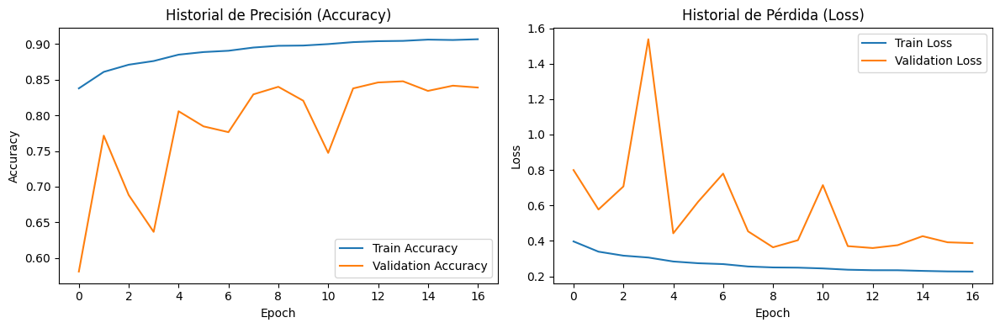

In [6]:
def plot_metrics(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # Gráfica de Accuracy
    ax1.plot(history.history['accuracy'], label='Train Accuracy')
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy')
    ax1.set_title('Historial de Precisión (Accuracy)')
    ax1.set_ylabel('Accuracy')
    ax1.set_xlabel('Epoch')
    ax1.legend()
    
    # Gráfica de Loss
    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Validation Loss')
    ax2.set_title('Historial de Pérdida (Loss)')
    ax2.set_ylabel('Loss')
    ax2.set_xlabel('Epoch')
    ax2.legend()
    
    plt.tight_layout()
    plt.show()

plot_metrics(history)

## 7. Evaluación y Matriz de Confusión
Procedemos a hacer las predicciones en el conjunto de *Test*.


Evaluando el modelo en el conjunto de prueba...


  1/396 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step

  3/396 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step

  5/396 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step

  7/396 ━━━━━━━━━━━━━━━━━━━━ 16s 42ms/step

  9/396 ━━━━━━━━━━━━━━━━━━━━ 16s 42ms/step

 11/396 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

 13/396 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

 14/396 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step

 16/396 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step

 18/396 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step

 20/396 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

 22/396 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

 24/396 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

 26/396 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

 28/396 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

 30/396 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

 32/396 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

 34/396 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step

 35/396 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step

 36/396 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step

 38/396 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step

 40/396 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step

 42/396 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step

 44/396 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step

 46/396 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

 48/396 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

 50/396 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

 52/396 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

 54/396 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

 56/396 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

 58/396 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

 60/396 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

 62/396 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

 64/396 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

 66/396 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

 68/396 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

 70/396 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

 72/396 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

 74/396 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

 76/396 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

 78/396 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

 80/396 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

 82/396 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

 84/396 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

 86/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

 88/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

 90/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

 92/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

 94/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

 96/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

 98/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

100/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

102/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

104/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

106/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

108/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

110/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

111/396 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

113/396 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

115/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

117/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

119/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

121/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

123/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

125/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

127/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

129/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

130/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

132/396 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

134/396 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

136/396 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

138/396 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

140/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step 

142/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

144/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

146/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

148/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

150/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

152/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

154/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

156/396 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

158/396 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

160/396 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

162/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

164/396 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

166/396 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

168/396 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

170/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

172/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

174/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

176/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

178/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

180/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

182/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

184/396 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

186/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

188/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

190/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

192/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

194/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

196/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

198/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

200/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

202/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

204/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

206/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

208/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

210/396 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

212/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

214/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

216/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

218/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

220/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

221/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

223/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

224/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

225/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

227/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

229/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

231/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

233/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

235/396 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

237/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

239/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

241/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

243/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

245/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

247/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

249/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

251/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

253/396 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

255/396 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

257/396 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

259/396 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

261/396 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step

263/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

265/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

267/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

268/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

270/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

272/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

274/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

276/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

278/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

280/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

282/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

284/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

286/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

288/396 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step

290/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

292/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

294/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

296/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

298/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

300/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

302/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

304/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

305/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

307/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

309/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

311/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

313/396 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step

315/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

317/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

319/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

321/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

323/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

325/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

327/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

329/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

331/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

333/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

335/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

337/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

338/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

340/396 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step

342/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

344/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

346/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

348/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

350/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

352/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

354/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

356/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

358/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

360/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

361/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

363/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

365/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

367/396 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

369/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

371/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

373/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

375/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

377/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

379/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

381/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

383/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

385/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

387/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

389/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

390/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

392/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

394/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

396/396 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

396/396 ━━━━━━━━━━━━━━━━━━━━ 15s 37ms/step



--- Reporte de Clasificación ---
              precision    recall  f1-score   support

Negativo (0)       0.93      0.80      0.86     13167
Positivo (1)       0.81      0.94      0.87     12161

    accuracy                           0.87     25328
   macro avg       0.87      0.87      0.87     25328
weighted avg       0.87      0.87      0.87     25328



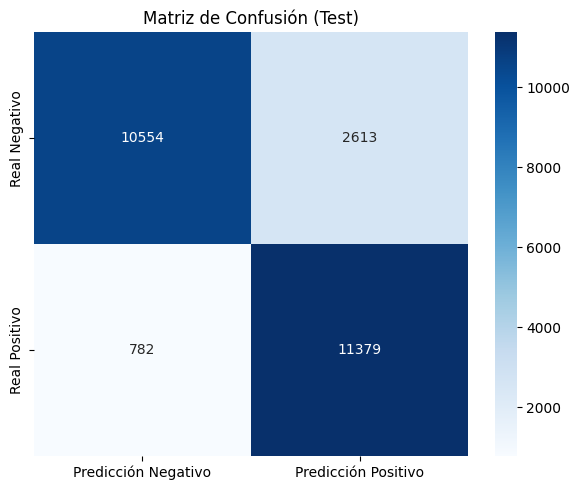

Modelo guardado exitosamente.


In [7]:
def evaluate_model(model, test_generator):
    print("\nEvaluando el modelo en el conjunto de prueba...")
    
    # Calcular pasos requeridos para el set de prueba
    test_steps = int(np.ceil(test_generator.samples / test_generator.batch_size))
    
    # Predicciones
    predictions = model.predict(test_generator, steps=test_steps)
    y_pred = (predictions > 0.5).astype(int).reshape(-1)
    
    y_true =  test_generator.classes
    
    print("\n--- Reporte de Clasificación ---")
    print(classification_report(y_true, y_pred, target_names=["Negativo (0)", "Positivo (1)"]))
    
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=["Predicción Negativo", "Predicción Positivo"],
                yticklabels=["Real Negativo", "Real Positivo"])
    plt.title('Matriz de Confusión (Test)')
    plt.tight_layout()
    plt.show()

evaluate_model(model, test_gen)

# Finalmente, guardar el modelo serializado
model.save('idc_breast_cancer_model.h5')
print("Modelo guardado exitosamente.")